In [494]:
import json

In [495]:
from tqdm import tqdm

#gather all stopwords
stopwords = []
stop_file = "../ID-Stopwords/id.stopwords.02.01.2016.txt"
with open(stop_file, 'r') as file:
    for line in tqdm(file):
        stopwords.append(line.strip())

758it [00:00, 330555.46it/s]


In [496]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

# create stemmer
factory = StemmerFactory()
stemmer = factory.create_stemmer()


In [497]:
import re

def normalize(text, stem_text=True):
    text = re.sub('\s+', ' ', text)  # remove extra space
    text = text.strip()  # trim depan belakang
    normal_regex = re.compile(r"(.)\1{1,}")
    text = normal_regex.sub(r"\1\1", text)
    if stem_text:
        text = stemmer.stem(text)
    return text

def get_ngram(n: int, text: str, max_length=512):
    if n > len(text):
        return dict()
    ngrams_freq = dict()
    text_lst = list(word_tokenize(text))[:max_length]
    text_lst=[word.lower() for word in text_lst if word.isalpha()]
    ngrams = [" ".join(text_lst[i:i+n]) for i in range(len(text_lst)-n+1)]
    ngrams = [normalize(ngram) for ngram in ngrams if ngram not in stopwords]
    return ngrams

def get_ngram_freq(n: int, text: str):
    if n > len(text):
        return dict()
    ngrams = get_ngram(n, text)
    ngrams_freq = dict()
    for ngram in ngrams:
        if ngram not in ngrams_freq:
            ngrams_freq[ngram] = 0
        ngrams_freq[ngram] += 1
    return ngrams_freq

def get_ngram_freq_lst(n: int, texts: list, max_length=512):
    ngrams_freq = dict()
    for text in texts:
        if n  > len(text):
            continue
        text_lst = list(word_tokenize(text))[:max_length]
        text_lst=[word.lower() for word in text_lst if word.isalpha()]
        ngrams = [" ".join(text_lst[i:i+n]) for i in range(len(text_lst)-n+1)]
        ngrams = [normalize(ngram) for ngram in ngrams if ngram not in stopwords]
        for ngram in ngrams:
            if ngram not in ngrams_freq:
                ngrams_freq[ngram] = 0
            ngrams_freq[ngram] += 1
    return ngrams_freq

def get_union_term_cnt_normalized(map1: dict, map2: dict) -> float:
    union_cnt = 0
    denom = min(sum(list(map1.values())), sum(list(map2.values())))
    if denom==0:
        return 0
    for key, value in map1.items():
        if key in map2:
            union_cnt += min(map1[key], map2[key])
    return union_cnt/denom

In [498]:
import numpy as np
from collections import defaultdict
from nltk.tokenize import word_tokenize

def bm25_init(docs_dict):
    doc_maps = defaultdict(int)
    term_maps = dict()
    
    for doc_id, doc_text in docs_dict.items():
        doc_words = list(word_tokenize(doc_text))
        doc_terms_map = defaultdict(int)
        words_exist = defaultdict(bool)
        for word in doc_words:
            if not words_exist[word]:
                doc_maps[word] += 1 
                words_exist[word] = True
                
            doc_terms_map[word] += 1
        term_maps[doc_id] = doc_terms_map
    N = len(list(docs_dict.keys()))
    avgdl = sum(len(doc) for doc in list(docs_dict.values())) / len(list(docs_dict.values()))
    return doc_maps, term_maps, N, avgdl

def bm25_score(word, doc, word_freq, N_q, avgdl, N, k1=1.2, b=0.75):
    #tf
    tf =  (word_freq*(k1+1))/(word_freq + k1 * (1 - b + b * len(doc) / avgdl))\
    #idf
    idf = np.log(((N - N_q + 0.5) / (N_q + 0.5)) + 1)
    return round(tf*idf, 4)

def bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map, docs_map, avgdl, N, k1=1.2, b=0.75):
    query = list(word_tokenize(query))
    selected_doc = docs_map[doc_id]
    res = sum([bm25_score(word, selected_doc, terms_freq_map[doc_id][word], docs_freq_map[word], avgdl, N, k1, b) for word in query])
    return res

In [499]:
gold_data = []

with open('../Dataset/Questions/question-syifa-test.json', 'r') as gold_out:
    gold_data = json.load(gold_out)

In [500]:
gold_ids = []
neg_ids = []
for row in gold_data:
    row_gold_ids = []
    row_neg_ids = []
    for row_ctx in row['ctxs']:
        row_gold_ids.append(row_ctx['id'])
    for row_ctx in row['neg_ctxs']:
        row_neg_ids.append(row_ctx['id'])
    gold_ids.append(row_gold_ids)
    neg_ids.append(row_neg_ids)

# A.  Tydi Data

In [501]:

actual_data = []

with open('../Results/syifa_results_full_tydi.json', 'r') as actual_out:
    actual_data = json.load(actual_out)



In [502]:
text_error = []
i = 0
for row in actual_data:
    row_text_error = []
    for row_ctx in row['ctxs']:
        if row_ctx['id'] in neg_ids[i]:
            row_text_error.append({'id': row_ctx['id'], 'title': row_ctx['title'], 'text': row_ctx['text']})
    text_error.append(row_text_error)
    i+=1

In [503]:
for i in range(len(text_error)):
    print("Question")
    print(f"text: {actual_data[i]['question']['text']}")
    print(f"title: {actual_data[i]['question']['title']}")
    print("Similar Questions")
    print(text_error[i])
    print()
    print()

Question
text: malam dok , sejak 2 hari yang lalu badan saya pusing dan lemas hari ini hidung saya mengeluarkan ingus terus menerus , bagaimana cara mengatasi nya ya dok ? terima kasih sebelumnya
title: cara mengatasi pusing , lemas dan hidung berair
Similar Questions
[]


Question
text: selamat pagi dok , saya mau tanya kenapa telinga saya berdenging terus ya dok sudah 6 hari , saya juga sudah ke puskesmas untuk di periksa , kata dokternya telinganya kotor karena di bersihkan dengan cutton buds jadi kotorannya terdorong hingga menutupi gendang telinga , dan saya sudah dikasih obat tetes untuk menghilangkan kotoran , tetapi dengung di telinga saya tidak berkurang sama sekali dok , saran dari dokter seperti apa ?
title: telinga berdengung sebelah kiri
Similar Questions
[]


Question
text: sore dok . . maaf dok saya sudah 4 hari mengalami benjolan di daerah kemaluan mula-mula benjolan tersebut kecil dan sekarang membesar lalu pecah dok . . rasanya linu dan sakit jika malam hari . . kira-

## Unigram Analysis

In [504]:
n = len(text_error)

In [505]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/mk1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [506]:
assert get_ngram_freq(2, "hello bingo world") == {"hello bingo": 1, "bingo world": 1}

Question
{'bahaya': 2, 'makan': 2, 'mi': 2, 'instan': 2, 'dok': 2, 'terkadang': 1, 'konsumsi': 1, 'hari': 1, 'kali': 1, 'maklum': 1, 'anak': 1, 'kost': 1, 'rantau': 1, 'seberang': 1}


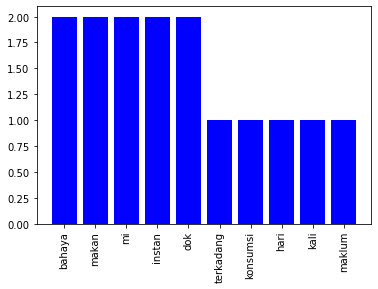

Similar Questions
{'mie': 10, 'konsumsi': 6, 'instan': 5, 'dok': 4, 'makan': 3, 'air': 3, 'terima': 3, 'kasih': 3, 'hamil': 2, 'instant': 2, 'minum': 2, 'kandung': 2, 'gizi': 2, 'artikel': 2, 'mi': 1, 'hallo': 1, 'ayam': 1, 'dingin': 1, 'eskrim': 1, 'es': 1, 'anjur': 1, 'bekas': 1, 'masak': 1, 'milik': 1, 'selamat': 1, 'malam': 1, 'nih': 1, 'bingung': 1, 'khawatir': 1, 'gimana': 1, 'browsing': 1, 'internet': 1, 'bumbu': 1, 'bahaya': 1, 'muncul': 1, 'rebus': 1, 'buang': 1, 'mwngandung': 1, 'guna': 1, 'tubuh': 1, 'pagi': 1, 'terus': 1, 'perut': 1, 'buncit': 1, 'perhati': 1, 'ucap': 1}


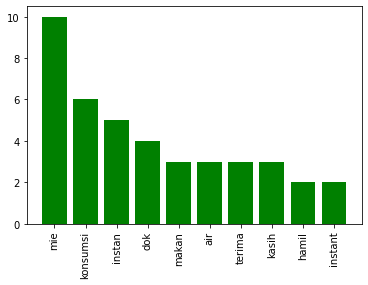



Question
{'belek': 3, 'dok': 3, 'lihat': 2, 'kena': 2, 'atas': 1, 'ganggu': 1, 'mata': 1, 'minggu': 1, 'hilang': 1, 'kurang': 1, 'laku': 1, 'alami': 1, 'sembuh': 1, 'normal': 1, 'terima': 1, 'kasih': 1, 'info': 1, 'saran': 1}


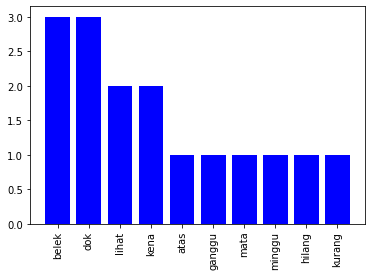

Similar Questions
{'mata': 4, 'ganjal': 2, 'dok': 2, 'partikel': 1, 'kanan': 1, 'kedip': 1, 'tutup': 1, 'alami': 1, 'ya': 1, 'terima': 1, 'kasih': 1}


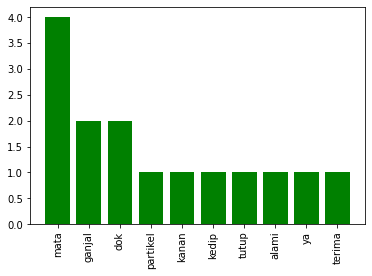



Question
{'steril': 3, 'anak': 3, 'hamil': 1, 'pasca': 1, 'usia': 1, 'kali': 1, 'caesar': 1, 'mei': 1, 'putus': 1, 'langsung': 1, 'suami': 1, 'cewek': 1, 'tiga': 1, 'potong': 1, 'bayi': 1, 'tabung': 1, 'solusi': 1, 'nya': 1}


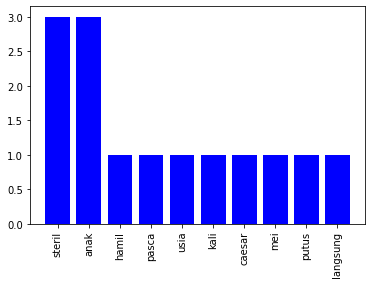

Similar Questions
{'hamil': 1, 'operasi': 1, 'caesar': 1, 'lahir': 1, 'sesar': 1, 'bayi': 1, 'tinggal': 1, 'cepat': 1, 'anak': 1, 'jarak': 1}


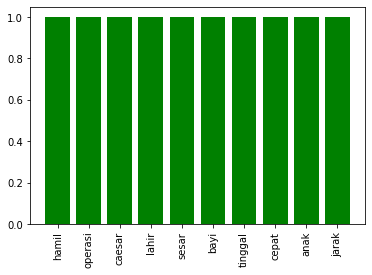



Question
{'perut': 3, 'langsung': 3, 'jahit': 3, 'nyeri': 2, 'operasi': 2, 'caesar': 2, 'dok': 2, 'ya': 2, 'pasca': 1, 'hallo': 1, 'habis': 1, 'trz': 1, 'steril': 1, 'tpii': 1, 'pas': 1, 'alami': 1, 'panas': 1, 'dingin': 1, 'takut': 1, 'masalah': 1, 'lahir': 1, 'beraktifitas': 1, 'biar': 1, 'kaku': 1, 'cepat': 1, 'sembuh': 1}


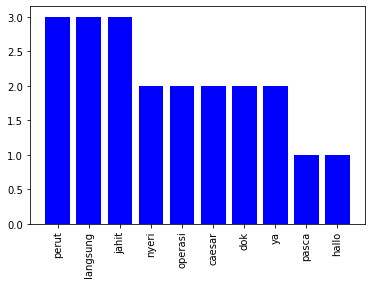

Similar Questions
{'nyeri': 4, 'caesar': 3, 'lahir': 2, 'normal': 2, 'dok': 2, 'tusuk': 2, 'lengan': 2, 'kanan': 2, 'siska': 2, 'sakit': 2, 'muncul': 2, 'siang': 1, 'ceasar': 1, 'nmelahirkan': 1, 'dokter': 1, 'bulan': 1, 'bawah': 1, 'belah': 1, 'nafas': 1, 'kadang': 1, 'perut': 1, 'kontraksi': 1, 'hilang': 1, 'siksa': 1, 'bantu': 1, 'berani': 1, 'beli': 1, 'obat': 1, 'sembarang': 1, 'susu': 1, 'regards': 1}


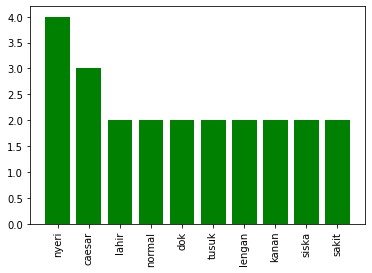



Question
{'perut': 5, 'nyeri': 4, 'pindah': 3, 'sakit': 3, 'terkadang': 2, 'kanan': 2, 'usus': 1, 'buntu': 1, 'dok': 1, 'gejala': 1, 'belah': 1, 'nyalur': 1, 'pinggang': 1, 'mudah': 1, 'lelah': 1, 'tekan': 1, 'susah': 1, 'bab': 1, 'minum': 1, 'vegeta': 1, 'herbal': 1, 'kembung': 1, 'paha': 1, 'kiri': 1}


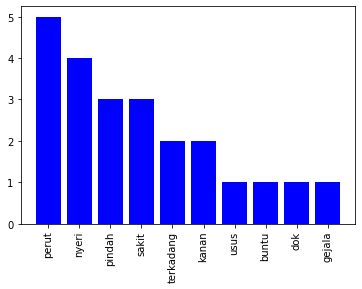

Similar Questions
{'nya': 5, 'perut': 4, 'kembung': 4, 'belah': 4, 'kiri': 3, 'kanan': 3, 'kadang': 3, 'bola': 3, 'kristal': 3, 'dok': 2, 'rawat': 2, 'siang': 1, 'radang': 1, 'usus': 1, 'buntu': 1, 'ginjal': 1, 'malam': 1, 'baik': 1, 'dokter': 1, 'banyak': 1, 'minum': 1, 'air': 1, 'putih': 1, 'hilang': 1, 'bahan': 1, 'rasa': 1, 'suka': 1, 'bunyi': 1, 'yak': 1, 'mohon': 1, 'jelas': 1, 'solusi': 1, 'terima': 1, 'kasih': 1}


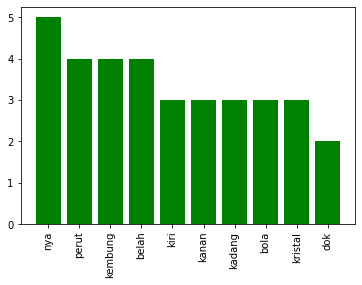



Question
{'susu': 4, 'alergi': 3, 'sapi': 3, 'anak': 3, 'solusi': 2, 'kedelai': 2, 'kasih': 2, 'malam': 1, 'dok': 1, 'umur': 1, 'asi': 1, 'macet': 1, 'hipoalergenik': 1, 'obat': 1, 'ampuh': 1, 'nyembuhin': 1, 'nya': 1, 'kah': 1, 'minum': 1, 'terima': 1}


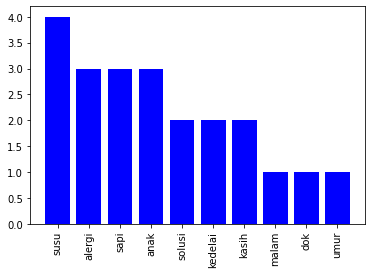

Similar Questions
{'susu': 7, 'alergi': 6, 'konsumsi': 4, 'mao': 3, 'khusus': 3, 'siang': 2, 'dok': 2, 'pas': 2, 'umur': 2, 'anak': 2, 'protein': 2, 'sapi': 2, 'saran': 2, 'dokter': 2, 'meberikan': 2, 'bmt': 2, 'kasih': 2, 'php': 1, 'lahir': 1, 'morniaga': 1, 'lanjut': 1, 'tahap': 1, 'sufor': 1, 'muncul': 1, 'terima': 1}


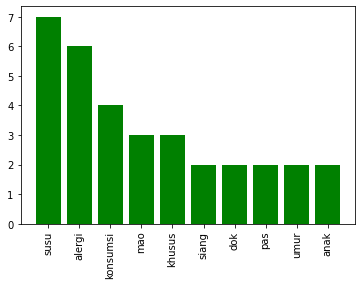



Question
{'sakit': 5, 'flu': 4, 'pusing': 3, 'tenggorok': 3, 'kepala': 3, 'efek': 2, 'dok': 2, 'rasa': 2, 'batuk': 2, 'ya': 2, 'selamat': 1, 'sore': 1, 'irsan': 1, 'layang': 1, 'serta': 1, 'tel': 1, 'angsur': 1, 'baik': 1, 'belah': 1, 'kiri': 1, 'pegang': 1, 'benjol': 1, 'terima': 1, 'kasih': 1, 'dokk': 1}


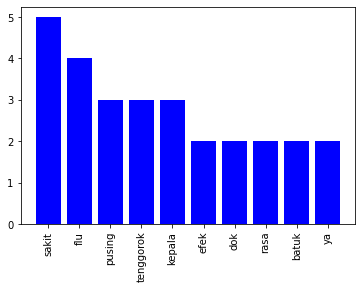

Similar Questions
{'dok': 6, 'ya': 5, 'flu': 5, 'tulang': 3, 'nya': 3, 'sakit': 3, 'belah': 3, 'kiri': 3, 'n': 3, 'suka': 2, 'ujung': 2, 'ekor': 2, 'kena': 2, 'berat': 2, 'obat': 2, 'antibiotik': 2, 'terima': 2, 'kasih': 2, 'kepala': 2, 'ciprofloxaxin': 1, 'efek': 1, 'anti': 1, 'biotik': 1, 'bagiang': 1, 'selamat': 1, 'malam': 1, 'minggu': 1, 'nyeri': 1, 'linu': 1, 'bagi': 1, 'terkadang': 1, 'hidung': 1, 'demam': 1, 'gejala': 1}


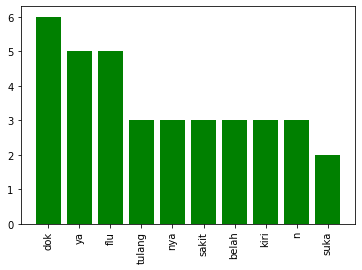



Question
{'dok': 3, 'sariawan': 2, 'demam': 2, 'mual': 2, 'kait': 1, 'pusing': 1, 'minggu': 1, 'sebab': 1, 'bentur': 1, 'sikat': 1, 'lari': 1, 'ousing': 1, 'ya': 1}


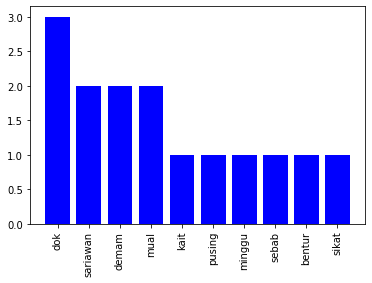

Similar Questions
{'sakit': 2, 'kepala': 2, 'mual': 2, 'dok': 2, 'belah': 1, 'kanan': 1, 'perut': 1, 'ya': 1, 'thq': 1, 'minggu': 1, 'adan': 1, 'demam': 1, 'erut': 1, 'terkadang': 1}


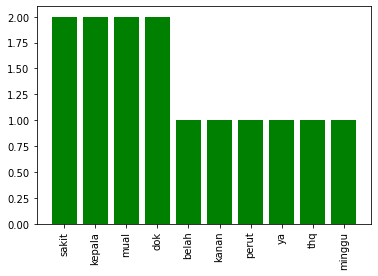

In [507]:
import matplotlib.pyplot as plt

for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(1, full_query)
    
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(1, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Unigram Overlap

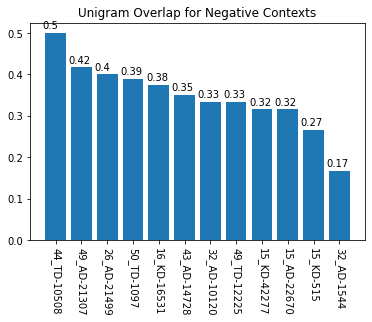

In [508]:
unigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(1, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(1, full_passage)
        unigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
unigram_overlap = dict(sorted(unigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(unigram_overlap.keys()), list(unigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Unigram Overlap for Negative Contexts")
for i, v in enumerate(list(unigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.01, str(round(v, 2)))
plt.show()

## Bigram Analysis

Question
{'makan mi': 2, 'mi instan': 2, 'tiap hari': 2, 'bahaya makan': 1, 'instan tiap': 1, 'hari dok': 1, 'dok bahaya': 1, 'bahaya tidak': 1, 'tidak saya': 1, 'saya selalu': 1, 'selalu makan': 1, 'instan hampir': 1, 'hampir tiap': 1, 'hari atau': 1, 'atau terkadang': 1, 'terkadang saya': 1, 'saya konsumsi': 1, 'konsumsi hari': 1, 'hari bisa': 1, 'bisa dua': 1, 'dua sampai': 1, 'sampai tiga': 1, 'tiga kali': 1, 'kali maklum': 1, 'maklum dok': 1, 'dok saya': 1, 'saya anak': 1, 'anak kost': 1, 'kost rantau': 1, 'rantau dari': 1, 'dari seberang': 1}


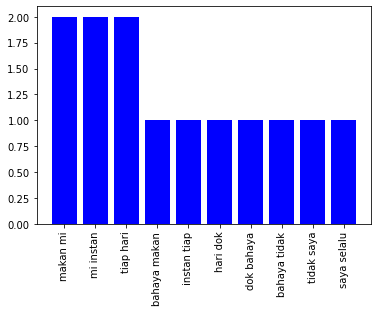

Similar Questions
{'mie instan': 4, 'konsumsi mie': 3, 'terima kasih': 3, 'apakah benar': 2, 'tidak boleh': 2, 'boleh konsumsi': 2, 'mie instant': 2, 'kandung gizi': 2, 'atau tidak': 2, 'konsumsi mi': 1, 'mi instan': 1, 'instan untuk': 1, 'untuk ibu': 1, 'ibu hamil': 1, 'hamil hallo': 1, 'hallo dok': 1, 'dok apakah': 1, 'benar saat': 1, 'saat hamil': 1, 'hamil tidak': 1, 'mie baik': 1, 'baik itu': 1, 'itu mie': 1, 'instant mie': 1, 'mie ayam': 1, 'ayam atau': 1, 'atau mie': 1, 'mie yang': 1, 'yang lain': 1, 'lain dan': 1, 'dan apakah': 1, 'benar tidak': 1, 'konsumsi makan': 1, 'makan atau': 1, 'atau minum': 1, 'minum dingin': 1, 'dingin seperti': 1, 'seperti eskrim': 1, 'eskrim atau': 1, 'atau air': 1, 'air es': 1, 'es lalu': 1, 'lalu apakah': 1, 'apakah anjur': 1, 'anjur konsumsi': 1, 'konsumsi yang': 1, 'yang balik': 1, 'balik yaitu': 1, 'yaitu makan': 1, 'makan dan': 1, 'dan minum': 1, 'minum terima': 1, 'apakah air': 1, 'air bekas': 1, 'bekas masak': 1, 'masak mie': 1, 'instan mili

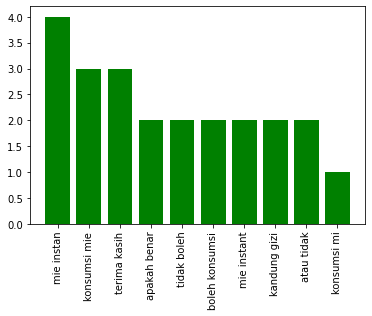



Question
{'kena belek': 2, 'atas ganggu': 1, 'ganggu lihat': 1, 'lihat usai': 1, 'usai kena': 1, 'belek dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya soal': 1, 'soal mata': 1, 'mata saya': 1, 'saya minggu': 1, 'minggu lalu': 1, 'lalu saya': 1, 'saya kena': 1, 'belek dan': 1, 'dan sekarang': 1, 'sekarang sudah': 1, 'sudah hilang': 1, 'hilang belek': 1, 'belek akan': 1, 'akan tetapi': 1, 'tetapi lihat': 1, 'lihat saya': 1, 'saya jadi': 1, 'jadi agak': 1, 'agak kurang': 1, 'kurang jelas': 1, 'jelas apa': 1, 'apa yang': 1, 'yang harus': 1, 'harus saya': 1, 'saya laku': 1, 'laku dok': 1, 'dok apa': 1, 'apa ada': 1, 'ada cara': 1, 'cara alami': 1, 'alami sembuh': 1, 'sembuh supaya': 1, 'supaya kembali': 1, 'kembali normal': 1, 'normal terima': 1, 'terima kasih': 1, 'kasih dok': 1, 'dok info': 1, 'info dan': 1, 'dan saran': 1}


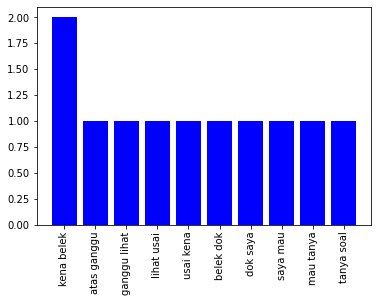

Similar Questions
{'yang ganjal': 2, 'mata saya': 2, 'asa ada': 1, 'ada yang': 1, 'ganjal pada': 1, 'pada mata': 1, 'mata dok': 1, 'dok saya': 1, 'saya rasa': 1, 'rasa seperti': 1, 'seperti ada': 1, 'ada partikel': 1, 'partikel yang': 1, 'ganjal di': 1, 'di mata': 1, 'mata kanan': 1, 'kanan saya': 1, 'saya lama': 1, 'lama hari': 1, 'hari ini': 1, 'ini jika': 1, 'jika mata': 1, 'saya kedip': 1, 'kedip atau': 1, 'atau tutup': 1, 'tutup masalah': 1, 'masalah apa': 1, 'apa yang': 1, 'yang mata': 1, 'saya alami': 1, 'alami ya': 1, 'ya dok': 1, 'dok terima': 1, 'terima kasih': 1}


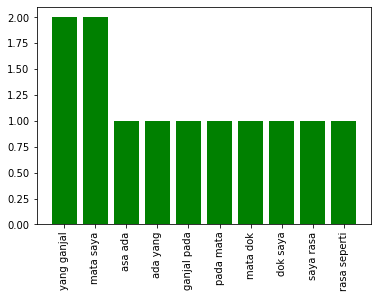



Question
{'punya anak': 2, 'anak lagi': 2, 'ingin hamil': 1, 'hamil pasca': 1, 'pasca steril': 1, 'steril saya': 1, 'saya usia': 1, 'usia tahun': 1, 'tahun sudah': 1, 'sudah kali': 1, 'kali caesar': 1, 'caesar akhir': 1, 'akhir mei': 1, 'mei dan': 1, 'dan putus': 1, 'putus untuk': 1, 'untuk langsung': 1, 'langsung steril': 1, 'steril sekarang': 1, 'sekarang suami': 1, 'suami ingin': 1, 'ingin punya': 1, 'lagi karena': 1, 'karena anak': 1, 'anak kami': 1, 'kami cewek': 1, 'cewek tiga': 1, 'tiga saya': 1, 'saya steril': 1, 'steril potong': 1, 'potong apa': 1, 'apa bisa': 1, 'bisa saya': 1, 'saya punya': 1, 'lagi apa': 1, 'apa bayi': 1, 'bayi tabung': 1, 'tabung bisa': 1, 'bisa jadi': 1, 'jadi solusi': 1, 'solusi nya': 1}


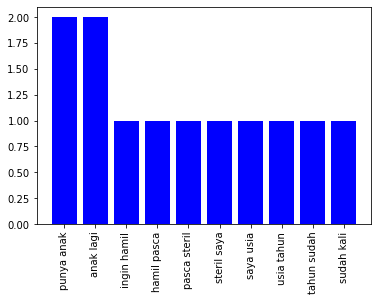

Similar Questions
{'apa boleh': 2, 'boleh hamil': 1, 'hamil lagi': 1, 'lagi telah': 1, 'telah bulan': 1, 'bulan operasi': 1, 'operasi caesar': 1, 'caesar bulan': 1, 'bulan yang': 1, 'yang lalu': 1, 'lalu saya': 1, 'saya lahir': 1, 'lahir dengan': 1, 'dengan cara': 1, 'cara sesar': 1, 'sesar tetapi': 1, 'tetapi bayi': 1, 'bayi saya': 1, 'saya tinggal': 1, 'tinggal saya': 1, 'saya ingin': 1, 'ingin cepat': 1, 'cepat punya': 1, 'punya anak': 1, 'anak lagi': 1, 'lagi apa': 1, 'boleh dengan': 1, 'dengan jarak': 1, 'jarak waktu': 1, 'waktu bulan': 1}


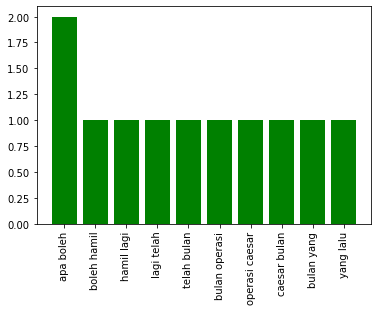



Question
{'operasi caesar': 2, 'nyeri perut': 1, 'perut pasca': 1, 'pasca operasi': 1, 'caesar hallo': 1, 'hallo dok': 1, 'dok langsung': 1, 'langsung saja': 1, 'saja ya': 1, 'ya saya': 1, 'saya bulan': 1, 'bulan yang': 1, 'yang lalu': 1, 'lalu habis': 1, 'habis operasi': 1, 'caesar trz': 1, 'trz langsung': 1, 'langsung steril': 1, 'steril tpii': 1, 'tpii sudah': 1, 'sudah berapa': 1, 'berapa hari': 1, 'hari ini': 1, 'ini perut': 1, 'perut saya': 1, 'saya asa': 1, 'asa nyeri': 1, 'nyeri utama': 1, 'utama perut': 1, 'perut bagi': 1, 'bagi bawah': 1, 'bawah pas': 1, 'pas jahit': 1, 'jahit sampai': 1, 'sampai saya': 1, 'saya alami': 1, 'alami panas': 1, 'panas dingin': 1, 'dingin itu': 1, 'itu kenapa': 1, 'kenapa ya': 1, 'ya dok': 1, 'dok saya': 1, 'saya takut': 1, 'takut kalau': 1, 'kalau jahit': 1, 'jahit saya': 1, 'saya masalah': 1, 'masalah karena': 1, 'karena telah': 1, 'telah lahir': 1, 'lahir langsung': 1, 'langsung beraktifitas': 1, 'beraktifitas seperti': 1, 'seperti biasa': 1,

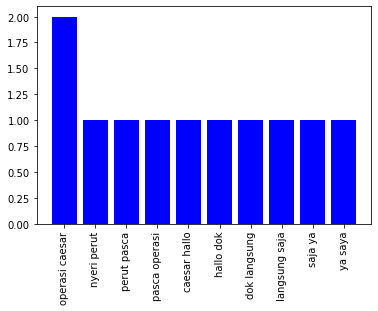

Similar Questions
{'nyeri seperti': 3, 'apakah bisa': 2, 'dok saya': 2, 'yang lalu': 2, 'seperti tusuk': 2, 'bawah lengan': 2, 'bisa lahir': 1, 'lahir normal': 1, 'normal telah': 1, 'telah belum': 1, 'belum caesar': 1, 'caesar siang': 1, 'siang dok': 1, 'saya orang': 1, 'orang ibu': 1, 'ibu yang': 1, 'yang baru': 1, 'baru saja': 1, 'saja lahir': 1, 'lahir cara': 1, 'cara ceasar': 1, 'ceasar sekitar': 1, 'sekitar dua': 1, 'dua tahun': 1, 'tahun yang': 1, 'lalu tetapi': 1, 'tetapi jika': 1, 'jika saya': 1, 'saya nmelahirkan': 1, 'nmelahirkan kembali': 1, 'kembali apakah': 1, 'bisa cara': 1, 'cara normal': 1, 'tusuk di': 1, 'di bawah': 1, 'lengan kanan': 1, 'kanan telah': 1, 'telah caesar': 1, 'caesar dokter': 1, 'dokter saya': 1, 'saya siska': 1, 'siska bulan': 1, 'bulan yang': 1, 'lalu saya': 1, 'saya caesar': 1, 'caesar ini': 1, 'ini bawah': 1, 'lengan belah': 1, 'belah kanan': 1, 'kanan nyeri': 1, 'tusuk bahkan': 1, 'bahkan nafas': 1, 'nafas pun': 1, 'pun sakit': 1, 'sakit kadang': 1,

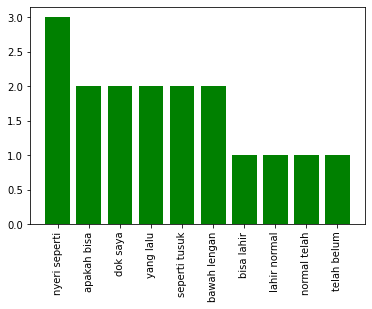



Question
{'nyeri perut': 2, 'perut pindah': 2, 'pindah apakah': 1, 'apakah usus': 1, 'usus buntu': 1, 'buntu dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya saya': 1, 'saya sakit': 1, 'sakit gejala': 1, 'gejala perut': 1, 'perut bagi': 1, 'bagi bawah': 1, 'bawah sakit': 1, 'sakit nyeri': 1, 'nyeri terkadang': 1, 'terkadang pindah': 1, 'pindah belah': 1, 'belah kanan': 1, 'kanan lalu': 1, 'lalu nyalur': 1, 'nyalur ke': 1, 'ke pinggang': 1, 'pinggang dan': 1, 'dan tidak': 1, 'tidak sakit': 1, 'sakit mudah': 1, 'mudah lelah': 1, 'lelah perut': 1, 'perut nyeri': 1, 'nyeri seperti': 1, 'seperti tekan': 1, 'tekan susah': 1, 'susah bab': 1, 'bab padahal': 1, 'padahal saya': 1, 'saya minum': 1, 'minum vegeta': 1, 'vegeta herbal': 1, 'herbal perut': 1, 'perut asa': 1, 'asa kembung': 1, 'kembung terkadang': 1, 'terkadang nyeri': 1, 'pindah ke': 1, 'ke paha': 1, 'paha kiri': 1, 'kiri dan': 1, 'dan kanan': 1}


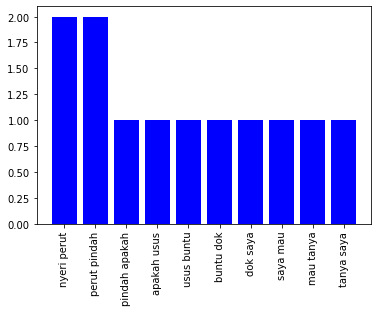

Similar Questions
{'bola kristal': 3, 'perut kembung': 2, 'belah kiri': 2, 'kiri dan': 2, 'perut saya': 2, 'kadang belah': 2, 'di rawat': 2, 'macam bola': 2, 'kristal itu': 2, 'kembung antara': 1, 'antara belah': 1, 'dan kanan': 1, 'kanan siang': 1, 'siang dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya perut': 1, 'saya kembung': 1, 'kembung terus': 1, 'terus tetapi': 1, 'tetapi kembung': 1, 'kembung nya': 1, 'nya itu': 1, 'itu belah': 1, 'belah saja': 1, 'saja kadang': 1, 'dan kadang': 1, 'belah kanan': 1, 'kanan belum': 1, 'belum itu': 1, 'itu saya': 1, 'saya di': 1, 'rawat kata': 1, 'kata nya': 1, 'nya ada': 1, 'ada radang': 1, 'radang usus': 1, 'usus buntu': 1, 'buntu terus': 1, 'terus ada': 1, 'ada macam': 1, 'kristal di': 1, 'di ginjal': 1, 'ginjal telah': 1, 'telah di': 1, 'rawat lama': 1, 'lama malam': 1, 'malam perut': 1, 'saya baik': 1, 'baik nah': 1, 'nah macam': 1, 'itu kata': 1, 'kata dokter': 1, 'dokter nya': 1, 'nya banyak': 1, 'banyak minum': 1, 'minum air

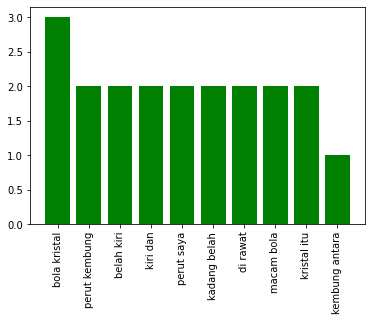



Question
{'susu sapi': 3, 'alergi susu': 2, 'sapi dan': 2, 'dan kedelai': 2, 'anak saya': 2, 'solusi alergi': 1, 'kedelai pada': 1, 'pada anak': 1, 'anak malam': 1, 'malam dok': 1, 'dok anak': 1, 'saya umur': 1, 'umur bulan': 1, 'bulan alergi': 1, 'kedelai juga': 1, 'juga karena': 1, 'karena asi': 1, 'asi saya': 1, 'saya macet': 1, 'macet sudah': 1, 'sudah bulan': 1, 'bulan di': 1, 'di kasih': 1, 'kasih susu': 1, 'susu hipoalergenik': 1, 'hipoalergenik terus': 1, 'terus apa': 1, 'apa ada': 1, 'ada obat': 1, 'obat yang': 1, 'yang ampuh': 1, 'ampuh buat': 1, 'buat nyembuhin': 1, 'nyembuhin alergi': 1, 'alergi nya': 1, 'nya atau': 1, 'atau ada': 1, 'ada kah': 1, 'kah solusi': 1, 'solusi yang': 1, 'yang baik': 1, 'baik agar': 1, 'agar anak': 1, 'saya bisa': 1, 'bisa minum': 1, 'minum susu': 1, 'sapi lagi': 1, 'lagi terima': 1, 'terima kasih': 1}


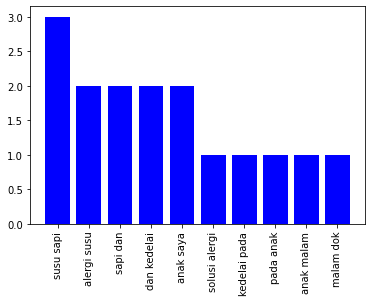

Similar Questions
{'saya mao': 3, 'mao tanya': 3, 'susu khusus': 3, 'khusus alergi': 3, 'siang dok': 2, 'dok saya': 2, 'tanya pas': 2, 'pas umur': 2, 'umur anak': 2, 'anak saya': 2, 'saya bulan': 2, 'bulan dia': 2, 'dia alergi': 2, 'alergi protein': 2, 'protein susu': 2, 'susu sapi': 2, 'sapi saran': 2, 'saran dokter': 2, 'dokter untuk': 2, 'untuk konsumsi': 2, 'konsumsi susu': 2, 'alergi saya': 2, 'saya meberikan': 2, 'meberikan siang': 1, 'meberikan bmt': 1, 'bmt php': 1, 'php karena': 1, 'karena pertama': 1, 'pertama lahir': 1, 'lahir sudah': 1, 'sudah kasih': 1, 'kasih susu': 1, 'susu morniaga': 1, 'morniaga bmt': 1, 'bmt yang': 1, 'yang saya': 1, 'tanya apakah': 1, 'apakah untuk': 1, 'untuk susu': 1, 'susu lanjut': 1, 'lanjut tahap': 1, 'tahap harus': 1, 'harus konsumsi': 1, 'konsumsi yang': 1, 'yang susu': 1, 'alergi lagi': 1, 'lagi atau': 1, 'atau sudah': 1, 'sudah boleh': 1, 'boleh konsumsi': 1, 'konsumsi sufor': 1, 'sufor biasa': 1, 'biasa karena': 1, 'karena alergi': 1, 'aler

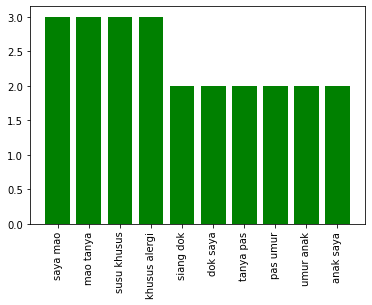



Question
{'efek dari': 2, 'dari sakit': 2, 'sakit flu': 2, 'yang saya': 2, 'apakah pusing': 1, 'pusing rupa': 1, 'rupa efek': 1, 'flu selamat': 1, 'selamat sore': 1, 'sore dok': 1, 'dok saya': 1, 'saya irsan': 1, 'irsan saya': 1, 'saya sudah': 1, 'sudah hari': 1, 'hari belakang': 1, 'belakang rasa': 1, 'rasa flu': 1, 'flu batuk': 1, 'batuk sakit': 1, 'sakit tenggorok': 1, 'tenggorok dan': 1, 'dan pusing': 1, 'pusing untuk': 1, 'untuk saat': 1, 'saat ini': 1, 'ini kepala': 1, 'kepala saya': 1, 'saya masih': 1, 'masih pusing': 1, 'pusing layang': 1, 'layang dan': 1, 'dan sakit': 1, 'sakit kepala': 1, 'kepala di': 1, 'di bagi': 1, 'bagi belakang': 1, 'belakang dan': 1, 'dan flu': 1, 'flu serta': 1, 'serta serta': 1, 'serta tenggorok': 1, 'tenggorok sakit': 1, 'sakit saat': 1, 'saat tel': 1, 'tel dan': 1, 'dan batuk': 1, 'batuk sudah': 1, 'sudah angsur': 1, 'angsur baik': 1, 'baik yang': 1, 'saya ingin': 1, 'ingin tanya': 1, 'tanya yaitu': 1, 'yaitu apakah': 1, 'apakah kepala': 1, 'kepal

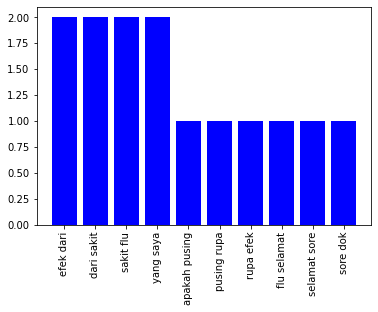

Similar Questions
{'ya dok': 5, 'ini saya': 4, 'belah kiri': 3, 'saya suka': 2, 'suka rasa': 2, 'rasa di': 2, 'di ujung': 2, 'ujung tulang': 2, 'tulang ekor': 2, 'ekor saya': 2, 'saya kenapa': 2, 'kenapa ya': 2, 'dok ini': 2, 'saya kena': 2, 'kena flu': 2, 'flu berat': 2, 'berat ke': 2, 'ke dari': 2, 'dari di': 2, 'di beri': 2, 'beri obat': 2, 'obat flu': 2, 'flu dan': 2, 'dan antibiotik': 2, 'dok terima': 2, 'terima kasih': 2, 'atas belah': 2, 'antibiotik ini': 1, 'antibiotik nya': 1, 'nya ciprofloxaxin': 1, 'ciprofloxaxin apa': 1, 'apa karena': 1, 'karena efek': 1, 'efek dari': 1, 'dari anti': 1, 'anti biotik': 1, 'biotik itu': 1, 'itu atau': 1, 'atau ada': 1, 'ada sebab': 1, 'sebab lain': 1, 'lain ya': 1, 'sakit kepala': 1, 'kepala bagiang': 1, 'bagiang atas': 1, 'kiri selamat': 1, 'selamat malam': 1, 'malam dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya sudah': 1, 'sudah minggu': 1, 'minggu kepala': 1, 'kepala saya': 1, 'saya asa': 1, 'asa sakit': 1, 'sakit seperti':

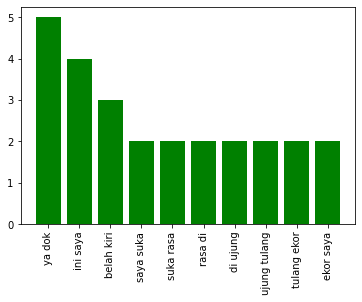



Question
{'sariawan dan': 1, 'dan kait': 1, 'kait dengan': 1, 'dengan demam': 1, 'demam mual': 1, 'mual pusing': 1, 'pusing dok': 1, 'dok saya': 1, 'saya sudah': 1, 'sudah hampir': 1, 'hampir minggu': 1, 'minggu sariawan': 1, 'sariawan yang': 1, 'yang di': 1, 'di sebab': 1, 'sebab bentur': 1, 'bentur oleh': 1, 'oleh sikat': 1, 'sikat pada': 1, 'pada hari': 1, 'hari ke': 1, 'ke malah': 1, 'malah lari': 1, 'lari ke': 1, 'ke demam': 1, 'demam dan': 1, 'dan mual': 1, 'mual juga': 1, 'juga ousing': 1, 'ousing dok': 1, 'dok kenapa': 1, 'kenapa ya': 1, 'ya dok': 1}


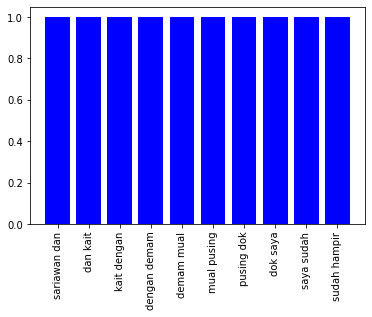

Similar Questions
{'sakit kepala': 1, 'kepala belah': 1, 'belah kanan': 1, 'kanan perut': 1, 'perut asa': 1, 'asa mual': 1, 'mual kenapa': 1, 'kenapa ya': 1, 'ya dok': 1, 'dok thq': 1, 'thq kepala': 1, 'kepala sakit': 1, 'sakit sudah': 1, 'sudah hampir': 1, 'hampir satu': 1, 'satu minggu': 1, 'minggu ini': 1, 'ini adan': 1, 'adan demam': 1, 'demam erut': 1, 'erut terkadang': 1, 'terkadang mual': 1, 'mual dok': 1}


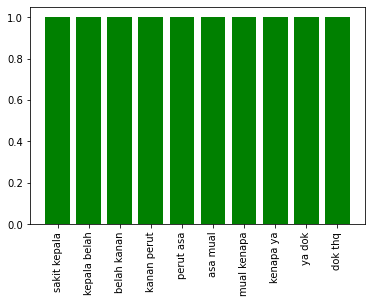

In [509]:
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(2, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(2, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Bigram Overlap

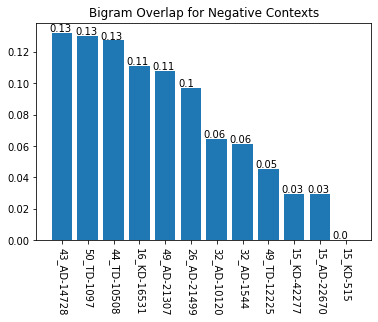

In [510]:
bigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(2, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(2, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
bigram_overlap = dict(sorted(bigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(bigram_overlap.keys()), list(bigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Bigram Overlap for Negative Contexts")
for i, v in enumerate(list(bigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Trigram Analysis

Question
{'makan mi instan': 2, 'bahaya makan mi': 1, 'mi instan tiap': 1, 'instan tiap hari': 1, 'tiap hari dok': 1, 'hari dok bahaya': 1, 'dok bahaya tidak': 1, 'bahaya tidak saya': 1, 'tidak saya selalu': 1, 'saya selalu makan': 1, 'selalu makan mi': 1, 'mi instan hampir': 1, 'instan hampir tiap': 1, 'hampir tiap hari': 1, 'tiap hari atau': 1, 'hari atau terkadang': 1, 'atau terkadang saya': 1, 'terkadang saya konsumsi': 1, 'saya konsumsi hari': 1, 'konsumsi hari bisa': 1, 'hari bisa dua': 1, 'bisa dua sampai': 1, 'dua sampai tiga': 1, 'sampai tiga kali': 1, 'tiga kali maklum': 1, 'kali maklum dok': 1, 'maklum dok saya': 1, 'dok saya anak': 1, 'saya anak kost': 1, 'anak kost rantau': 1, 'kost rantau dari': 1, 'rantau dari seberang': 1}


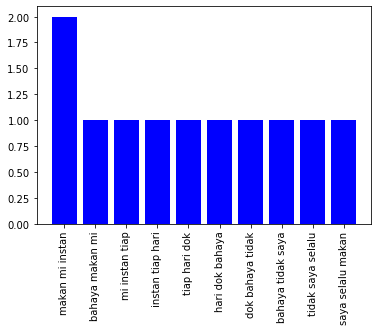

Similar Questions
{'tidak boleh konsumsi': 2, 'konsumsi mie instan': 2, 'konsumsi mi instan': 1, 'mi instan untuk': 1, 'instan untuk ibu': 1, 'untuk ibu hamil': 1, 'ibu hamil hallo': 1, 'hamil hallo dok': 1, 'hallo dok apakah': 1, 'dok apakah benar': 1, 'apakah benar saat': 1, 'benar saat hamil': 1, 'saat hamil tidak': 1, 'hamil tidak boleh': 1, 'boleh konsumsi mie': 1, 'konsumsi mie baik': 1, 'mie baik itu': 1, 'baik itu mie': 1, 'itu mie instant': 1, 'mie instant mie': 1, 'instant mie ayam': 1, 'mie ayam atau': 1, 'ayam atau mie': 1, 'atau mie yang': 1, 'mie yang lain': 1, 'yang lain dan': 1, 'lain dan apakah': 1, 'dan apakah benar': 1, 'apakah benar tidak': 1, 'benar tidak boleh': 1, 'boleh konsumsi makan': 1, 'konsumsi makan atau': 1, 'makan atau minum': 1, 'atau minum dingin': 1, 'minum dingin seperti': 1, 'dingin seperti eskrim': 1, 'seperti eskrim atau': 1, 'eskrim atau air': 1, 'atau air es': 1, 'air es lalu': 1, 'es lalu apakah': 1, 'lalu apakah anjur': 1, 'apakah anjur konsum

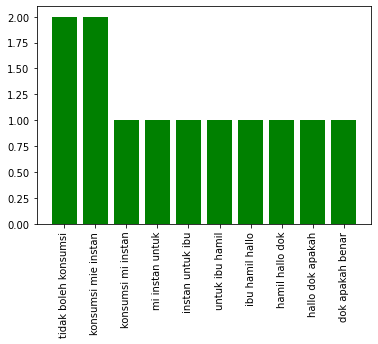



Question
{'atas ganggu lihat': 1, 'ganggu lihat usai': 1, 'lihat usai kena': 1, 'usai kena belek': 1, 'kena belek dok': 1, 'belek dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya soal': 1, 'tanya soal mata': 1, 'soal mata saya': 1, 'mata saya minggu': 1, 'saya minggu lalu': 1, 'minggu lalu saya': 1, 'lalu saya kena': 1, 'saya kena belek': 1, 'kena belek dan': 1, 'belek dan sekarang': 1, 'dan sekarang sudah': 1, 'sekarang sudah hilang': 1, 'sudah hilang belek': 1, 'hilang belek akan': 1, 'belek akan tetapi': 1, 'akan tetapi lihat': 1, 'tetapi lihat saya': 1, 'lihat saya jadi': 1, 'saya jadi agak': 1, 'jadi agak kurang': 1, 'agak kurang jelas': 1, 'kurang jelas apa': 1, 'jelas apa yang': 1, 'apa yang harus': 1, 'yang harus saya': 1, 'harus saya laku': 1, 'saya laku dok': 1, 'laku dok apa': 1, 'dok apa ada': 1, 'apa ada cara': 1, 'ada cara alami': 1, 'cara alami sembuh': 1, 'alami sembuh supaya': 1, 'sembuh supaya kembali': 1, 'supaya kembali normal': 1, 'kembali normal 

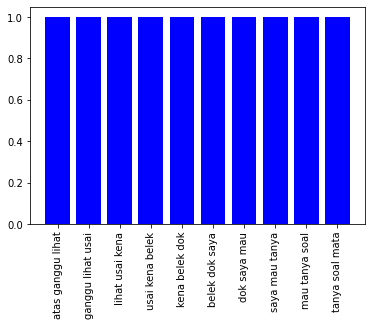

Similar Questions
{'asa ada yang': 1, 'ada yang ganjal': 1, 'yang ganjal pada': 1, 'ganjal pada mata': 1, 'pada mata dok': 1, 'mata dok saya': 1, 'dok saya rasa': 1, 'saya rasa seperti': 1, 'rasa seperti ada': 1, 'seperti ada partikel': 1, 'ada partikel yang': 1, 'partikel yang ganjal': 1, 'yang ganjal di': 1, 'ganjal di mata': 1, 'di mata kanan': 1, 'mata kanan saya': 1, 'kanan saya lama': 1, 'saya lama hari': 1, 'lama hari ini': 1, 'hari ini jika': 1, 'ini jika mata': 1, 'jika mata saya': 1, 'mata saya kedip': 1, 'saya kedip atau': 1, 'kedip atau tutup': 1, 'atau tutup masalah': 1, 'tutup masalah apa': 1, 'masalah apa yang': 1, 'apa yang mata': 1, 'yang mata saya': 1, 'mata saya alami': 1, 'saya alami ya': 1, 'alami ya dok': 1, 'ya dok terima': 1, 'dok terima kasih': 1}


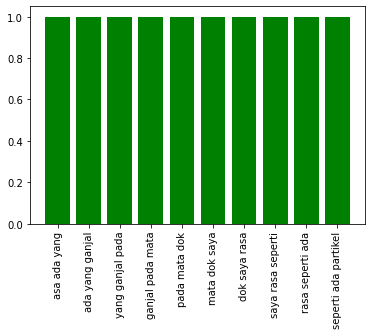



Question
{'punya anak lagi': 2, 'ingin hamil pasca': 1, 'hamil pasca steril': 1, 'pasca steril saya': 1, 'steril saya usia': 1, 'saya usia tahun': 1, 'usia tahun sudah': 1, 'tahun sudah kali': 1, 'sudah kali caesar': 1, 'kali caesar akhir': 1, 'caesar akhir mei': 1, 'akhir mei dan': 1, 'mei dan putus': 1, 'dan putus untuk': 1, 'putus untuk langsung': 1, 'untuk langsung steril': 1, 'langsung steril sekarang': 1, 'steril sekarang suami': 1, 'sekarang suami ingin': 1, 'suami ingin punya': 1, 'ingin punya anak': 1, 'anak lagi karena': 1, 'lagi karena anak': 1, 'karena anak kami': 1, 'anak kami cewek': 1, 'kami cewek tiga': 1, 'cewek tiga saya': 1, 'tiga saya steril': 1, 'saya steril potong': 1, 'steril potong apa': 1, 'potong apa bisa': 1, 'apa bisa saya': 1, 'bisa saya punya': 1, 'saya punya anak': 1, 'anak lagi apa': 1, 'lagi apa bayi': 1, 'apa bayi tabung': 1, 'bayi tabung bisa': 1, 'tabung bisa jadi': 1, 'bisa jadi solusi': 1, 'jadi solusi nya': 1}


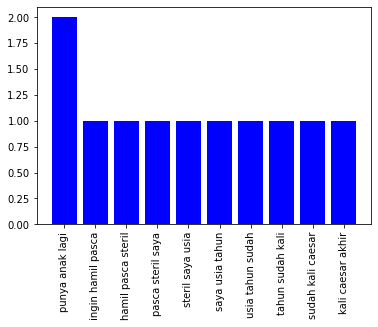

Similar Questions
{'apa boleh hamil': 1, 'boleh hamil lagi': 1, 'hamil lagi telah': 1, 'lagi telah bulan': 1, 'telah bulan operasi': 1, 'bulan operasi caesar': 1, 'operasi caesar bulan': 1, 'caesar bulan yang': 1, 'bulan yang lalu': 1, 'yang lalu saya': 1, 'lalu saya lahir': 1, 'saya lahir dengan': 1, 'lahir dengan cara': 1, 'dengan cara sesar': 1, 'cara sesar tetapi': 1, 'sesar tetapi bayi': 1, 'tetapi bayi saya': 1, 'bayi saya tinggal': 1, 'saya tinggal saya': 1, 'tinggal saya ingin': 1, 'saya ingin cepat': 1, 'ingin cepat punya': 1, 'cepat punya anak': 1, 'punya anak lagi': 1, 'anak lagi apa': 1, 'lagi apa boleh': 1, 'apa boleh dengan': 1, 'boleh dengan jarak': 1, 'dengan jarak waktu': 1, 'jarak waktu bulan': 1}


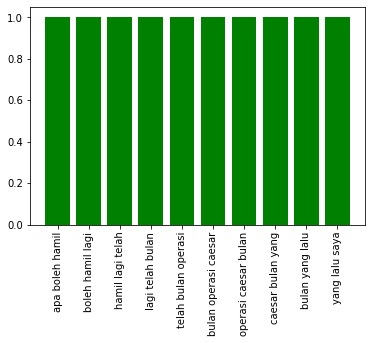



Question
{'nyeri perut pasca': 1, 'perut pasca operasi': 1, 'pasca operasi caesar': 1, 'operasi caesar hallo': 1, 'caesar hallo dok': 1, 'hallo dok langsung': 1, 'dok langsung saja': 1, 'langsung saja ya': 1, 'saja ya saya': 1, 'ya saya bulan': 1, 'saya bulan yang': 1, 'bulan yang lalu': 1, 'yang lalu habis': 1, 'lalu habis operasi': 1, 'habis operasi caesar': 1, 'operasi caesar trz': 1, 'caesar trz langsung': 1, 'trz langsung steril': 1, 'langsung steril tpii': 1, 'steril tpii sudah': 1, 'tpii sudah berapa': 1, 'sudah berapa hari': 1, 'berapa hari ini': 1, 'hari ini perut': 1, 'ini perut saya': 1, 'perut saya asa': 1, 'saya asa nyeri': 1, 'asa nyeri utama': 1, 'nyeri utama perut': 1, 'utama perut bagi': 1, 'perut bagi bawah': 1, 'bagi bawah pas': 1, 'bawah pas jahit': 1, 'pas jahit sampai': 1, 'jahit sampai saya': 1, 'sampai saya alami': 1, 'saya alami panas': 1, 'alami panas dingin': 1, 'panas dingin itu': 1, 'dingin itu kenapa': 1, 'itu kenapa ya': 1, 'kenapa ya dok': 1, 'ya dok s

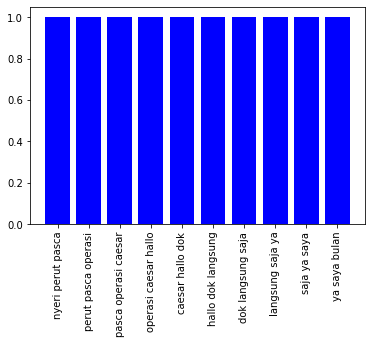

Similar Questions
{'nyeri seperti tusuk': 2, 'apakah bisa lahir': 1, 'bisa lahir normal': 1, 'lahir normal telah': 1, 'normal telah belum': 1, 'telah belum caesar': 1, 'belum caesar siang': 1, 'caesar siang dok': 1, 'siang dok saya': 1, 'dok saya orang': 1, 'saya orang ibu': 1, 'orang ibu yang': 1, 'ibu yang baru': 1, 'yang baru saja': 1, 'baru saja lahir': 1, 'saja lahir cara': 1, 'lahir cara ceasar': 1, 'cara ceasar sekitar': 1, 'ceasar sekitar dua': 1, 'sekitar dua tahun': 1, 'dua tahun yang': 1, 'tahun yang lalu': 1, 'yang lalu tetapi': 1, 'lalu tetapi jika': 1, 'tetapi jika saya': 1, 'jika saya nmelahirkan': 1, 'saya nmelahirkan kembali': 1, 'nmelahirkan kembali apakah': 1, 'kembali apakah bisa': 1, 'apakah bisa cara': 1, 'bisa cara normal': 1, 'seperti tusuk di': 1, 'tusuk di bawah': 1, 'di bawah lengan': 1, 'bawah lengan kanan': 1, 'lengan kanan telah': 1, 'kanan telah caesar': 1, 'telah caesar dokter': 1, 'caesar dokter saya': 1, 'dokter saya siska': 1, 'saya siska bulan': 1, '

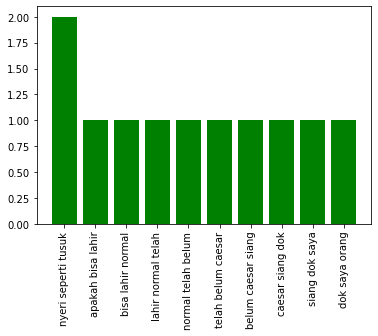



Question
{'nyeri perut pindah': 2, 'perut pindah apakah': 1, 'pindah apakah usus': 1, 'apakah usus buntu': 1, 'usus buntu dok': 1, 'buntu dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya saya': 1, 'tanya saya sakit': 1, 'saya sakit gejala': 1, 'sakit gejala perut': 1, 'gejala perut bagi': 1, 'perut bagi bawah': 1, 'bagi bawah sakit': 1, 'bawah sakit nyeri': 1, 'sakit nyeri terkadang': 1, 'nyeri terkadang pindah': 1, 'terkadang pindah belah': 1, 'pindah belah kanan': 1, 'belah kanan lalu': 1, 'kanan lalu nyalur': 1, 'lalu nyalur ke': 1, 'nyalur ke pinggang': 1, 'ke pinggang dan': 1, 'pinggang dan tidak': 1, 'dan tidak sakit': 1, 'tidak sakit mudah': 1, 'sakit mudah lelah': 1, 'mudah lelah perut': 1, 'lelah perut nyeri': 1, 'perut nyeri seperti': 1, 'nyeri seperti tekan': 1, 'seperti tekan susah': 1, 'tekan susah bab': 1, 'susah bab padahal': 1, 'bab padahal saya': 1, 'padahal saya minum': 1, 'saya minum vegeta': 1, 'minum vegeta herbal': 1, 'vegeta herbal perut': 1, 'h

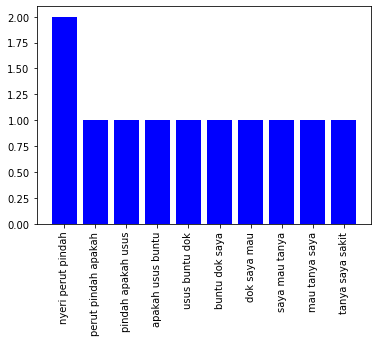

Similar Questions
{'belah kiri dan': 2, 'macam bola kristal': 2, 'bola kristal itu': 2, 'perut kembung antara': 1, 'kembung antara belah': 1, 'antara belah kiri': 1, 'kiri dan kanan': 1, 'dan kanan siang': 1, 'kanan siang dok': 1, 'siang dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya perut': 1, 'tanya perut saya': 1, 'perut saya kembung': 1, 'saya kembung terus': 1, 'kembung terus tetapi': 1, 'terus tetapi kembung': 1, 'tetapi kembung nya': 1, 'kembung nya itu': 1, 'nya itu belah': 1, 'itu belah saja': 1, 'belah saja kadang': 1, 'saja kadang belah': 1, 'kadang belah kiri': 1, 'kiri dan kadang': 1, 'dan kadang belah': 1, 'kadang belah kanan': 1, 'belah kanan belum': 1, 'kanan belum itu': 1, 'belum itu saya': 1, 'itu saya di': 1, 'saya di rawat': 1, 'di rawat kata': 1, 'rawat kata nya': 1, 'kata nya ada': 1, 'nya ada radang': 1, 'ada radang usus': 1, 'radang usus buntu': 1, 'usus buntu terus': 1, 'buntu terus ada': 1, 'terus ada macam': 1, 'ada macam bola': 1, 'bola kri

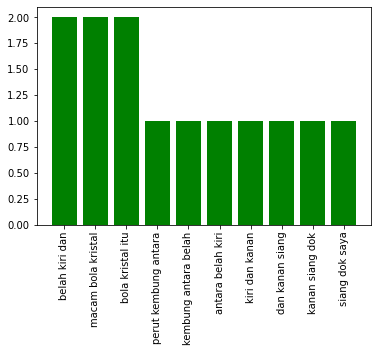



Question
{'alergi susu sapi': 2, 'susu sapi dan': 2, 'sapi dan kedelai': 2, 'solusi alergi susu': 1, 'dan kedelai pada': 1, 'kedelai pada anak': 1, 'pada anak malam': 1, 'anak malam dok': 1, 'malam dok anak': 1, 'dok anak saya': 1, 'anak saya umur': 1, 'saya umur bulan': 1, 'umur bulan alergi': 1, 'bulan alergi susu': 1, 'dan kedelai juga': 1, 'kedelai juga karena': 1, 'juga karena asi': 1, 'karena asi saya': 1, 'asi saya macet': 1, 'saya macet sudah': 1, 'macet sudah bulan': 1, 'sudah bulan di': 1, 'bulan di kasih': 1, 'di kasih susu': 1, 'kasih susu hipoalergenik': 1, 'susu hipoalergenik terus': 1, 'hipoalergenik terus apa': 1, 'terus apa ada': 1, 'apa ada obat': 1, 'ada obat yang': 1, 'obat yang ampuh': 1, 'yang ampuh buat': 1, 'ampuh buat nyembuhin': 1, 'buat nyembuhin alergi': 1, 'nyembuhin alergi nya': 1, 'alergi nya atau': 1, 'nya atau ada': 1, 'atau ada kah': 1, 'ada kah solusi': 1, 'kah solusi yang': 1, 'solusi yang baik': 1, 'yang baik agar': 1, 'baik agar anak': 1, 'agar a

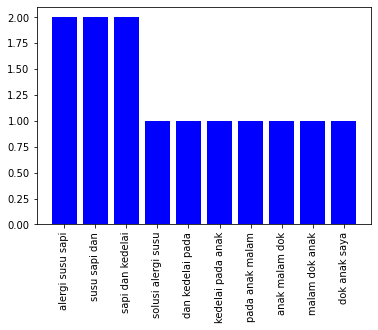

Similar Questions
{'saya mao tanya': 3, 'susu khusus alergi': 3, 'siang dok saya': 2, 'dok saya mao': 2, 'mao tanya pas': 2, 'tanya pas umur': 2, 'pas umur anak': 2, 'umur anak saya': 2, 'anak saya bulan': 2, 'saya bulan dia': 2, 'bulan dia alergi': 2, 'dia alergi protein': 2, 'alergi protein susu': 2, 'protein susu sapi': 2, 'susu sapi saran': 2, 'sapi saran dokter': 2, 'saran dokter untuk': 2, 'dokter untuk konsumsi': 2, 'untuk konsumsi susu': 2, 'konsumsi susu khusus': 2, 'khusus alergi saya': 2, 'alergi saya meberikan': 2, 'saya meberikan siang': 1, 'meberikan siang dok': 1, 'saya meberikan bmt': 1, 'meberikan bmt php': 1, 'bmt php karena': 1, 'php karena pertama': 1, 'karena pertama lahir': 1, 'pertama lahir sudah': 1, 'lahir sudah kasih': 1, 'sudah kasih susu': 1, 'kasih susu morniaga': 1, 'susu morniaga bmt': 1, 'morniaga bmt yang': 1, 'bmt yang saya': 1, 'yang saya mao': 1, 'mao tanya apakah': 1, 'tanya apakah untuk': 1, 'apakah untuk susu': 1, 'untuk susu lanjut': 1, 'susu lan

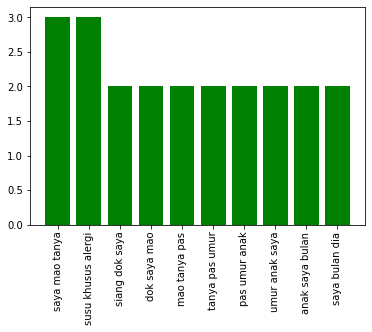



Question
{'efek dari sakit': 2, 'dari sakit flu': 2, 'apakah pusing rupa': 1, 'pusing rupa efek': 1, 'rupa efek dari': 1, 'sakit flu selamat': 1, 'flu selamat sore': 1, 'selamat sore dok': 1, 'sore dok saya': 1, 'dok saya irsan': 1, 'saya irsan saya': 1, 'irsan saya sudah': 1, 'saya sudah hari': 1, 'sudah hari belakang': 1, 'hari belakang rasa': 1, 'belakang rasa flu': 1, 'rasa flu batuk': 1, 'flu batuk sakit': 1, 'batuk sakit tenggorok': 1, 'sakit tenggorok dan': 1, 'tenggorok dan pusing': 1, 'dan pusing untuk': 1, 'pusing untuk saat': 1, 'untuk saat ini': 1, 'saat ini kepala': 1, 'ini kepala saya': 1, 'kepala saya masih': 1, 'saya masih pusing': 1, 'masih pusing layang': 1, 'pusing layang dan': 1, 'layang dan sakit': 1, 'dan sakit kepala': 1, 'sakit kepala di': 1, 'kepala di bagi': 1, 'di bagi belakang': 1, 'bagi belakang dan': 1, 'belakang dan flu': 1, 'dan flu serta': 1, 'flu serta serta': 1, 'serta serta tenggorok': 1, 'serta tenggorok sakit': 1, 'tenggorok sakit saat': 1, 'saki

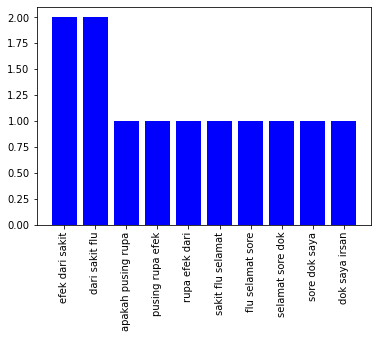

Similar Questions
{'ini saya suka': 2, 'saya suka rasa': 2, 'suka rasa di': 2, 'rasa di ujung': 2, 'di ujung tulang': 2, 'ujung tulang ekor': 2, 'tulang ekor saya': 2, 'ekor saya kenapa': 2, 'saya kenapa ya': 2, 'kenapa ya dok': 2, 'ya dok ini': 2, 'dok ini saya': 2, 'ini saya kena': 2, 'saya kena flu': 2, 'kena flu berat': 2, 'flu berat ke': 2, 'berat ke dari': 2, 'ke dari di': 2, 'dari di beri': 2, 'di beri obat': 2, 'beri obat flu': 2, 'obat flu dan': 2, 'flu dan antibiotik': 2, 'ya dok terima': 2, 'dok terima kasih': 2, 'atas belah kiri': 2, 'dan antibiotik ini': 1, 'antibiotik ini saya': 1, 'dan antibiotik nya': 1, 'antibiotik nya ciprofloxaxin': 1, 'nya ciprofloxaxin apa': 1, 'ciprofloxaxin apa karena': 1, 'apa karena efek': 1, 'karena efek dari': 1, 'efek dari anti': 1, 'dari anti biotik': 1, 'anti biotik itu': 1, 'biotik itu atau': 1, 'itu atau ada': 1, 'atau ada sebab': 1, 'ada sebab lain': 1, 'sebab lain ya': 1, 'lain ya dok': 1, 'sakit kepala bagiang': 1, 'kepala bagiang ata

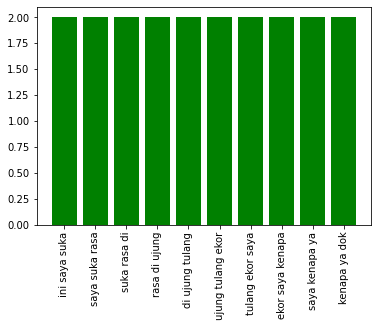



Question
{'sariawan dan kait': 1, 'dan kait dengan': 1, 'kait dengan demam': 1, 'dengan demam mual': 1, 'demam mual pusing': 1, 'mual pusing dok': 1, 'pusing dok saya': 1, 'dok saya sudah': 1, 'saya sudah hampir': 1, 'sudah hampir minggu': 1, 'hampir minggu sariawan': 1, 'minggu sariawan yang': 1, 'sariawan yang di': 1, 'yang di sebab': 1, 'di sebab bentur': 1, 'sebab bentur oleh': 1, 'bentur oleh sikat': 1, 'oleh sikat pada': 1, 'sikat pada hari': 1, 'pada hari ke': 1, 'hari ke malah': 1, 'ke malah lari': 1, 'malah lari ke': 1, 'lari ke demam': 1, 'ke demam dan': 1, 'demam dan mual': 1, 'dan mual juga': 1, 'mual juga ousing': 1, 'juga ousing dok': 1, 'ousing dok kenapa': 1, 'dok kenapa ya': 1, 'kenapa ya dok': 1}


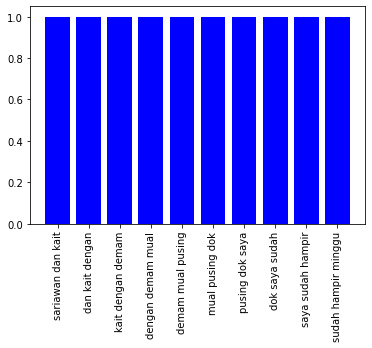

Similar Questions
{'sakit kepala belah': 1, 'kepala belah kanan': 1, 'belah kanan perut': 1, 'kanan perut asa': 1, 'perut asa mual': 1, 'asa mual kenapa': 1, 'mual kenapa ya': 1, 'kenapa ya dok': 1, 'ya dok thq': 1, 'dok thq kepala': 1, 'thq kepala sakit': 1, 'kepala sakit sudah': 1, 'sakit sudah hampir': 1, 'sudah hampir satu': 1, 'hampir satu minggu': 1, 'satu minggu ini': 1, 'minggu ini adan': 1, 'ini adan demam': 1, 'adan demam erut': 1, 'demam erut terkadang': 1, 'erut terkadang mual': 1, 'terkadang mual dok': 1}


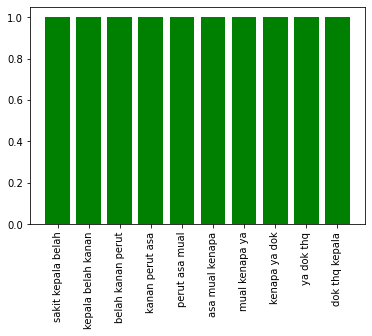

In [511]:
for i in range(len(text_error)):
    if len(text_error[i]) <= 0:
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(3, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(3, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Trigram Overlap

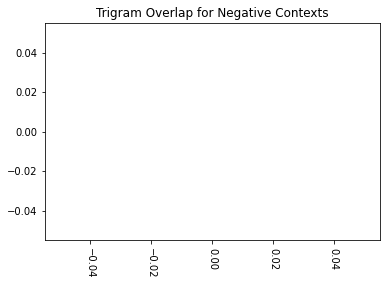

In [512]:
trigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(3, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(3, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
trigram_overlap = dict(sorted(trigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(trigram_overlap.keys()), list(trigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Trigram Overlap for Negative Contexts")
for i, v in enumerate(list(trigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Vector Embedding Projection

In [513]:
import pickle

In [514]:
#passage embedding load

passage_embeddings = dict()
with (open("../Dataset/Embeddings/passage_embeddings_syifa-tydi_full.tsv", "rb")) as openfile:
    while True:
        try:
            passage_lst = pickle.load(openfile)
            for pid, p_vector in passage_lst:
                passage_embeddings[pid] = p_vector
        except EOFError:
            break


In [515]:
#question embedding load

query_embeddings = dict()
with (open("../Dataset/Embeddings/question_embeddings_syifa-tydi_full.tsv", "rb")) as openfile:
    while True:
        try:
            query_lst = pickle.load(openfile)
            for qid, q_vector in query_lst:
                query_embeddings[qid] = q_vector
        except EOFError:
            break


/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


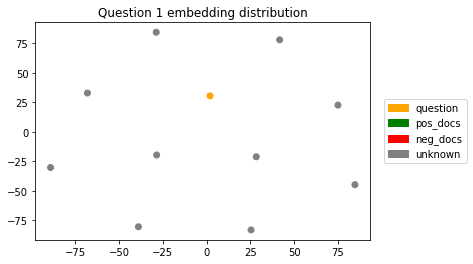

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


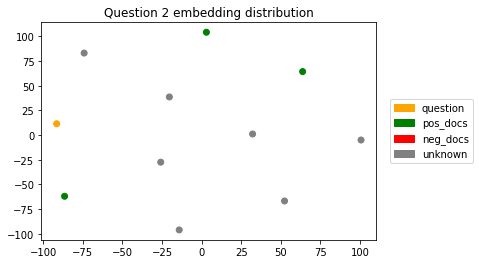

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


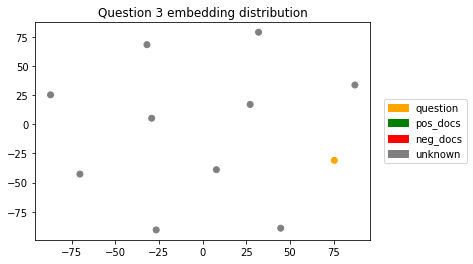

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


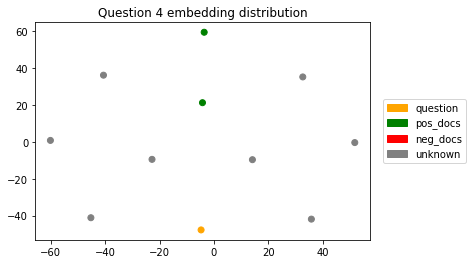

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


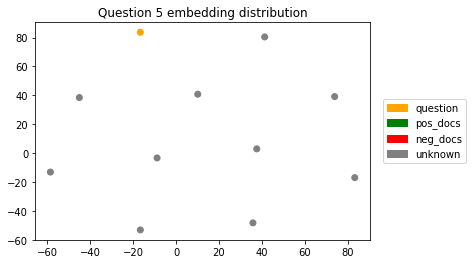

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


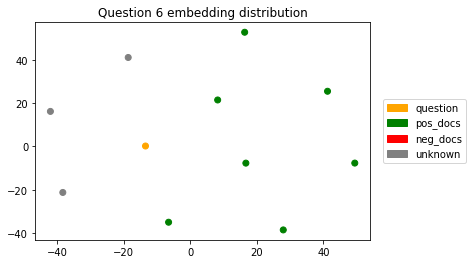

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


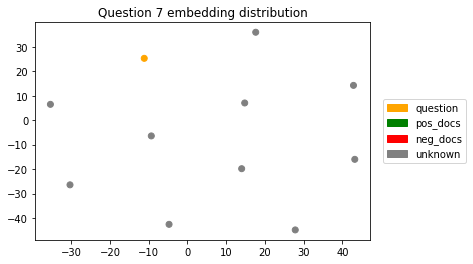

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


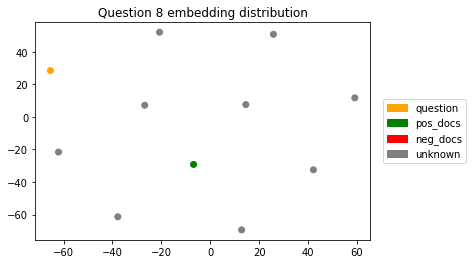

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


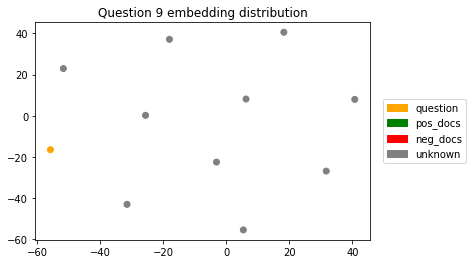

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


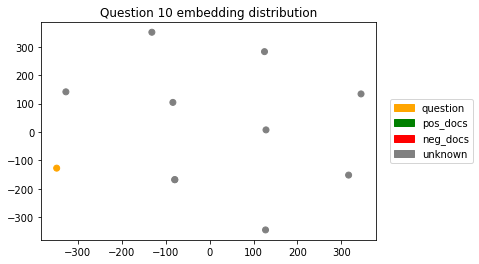

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


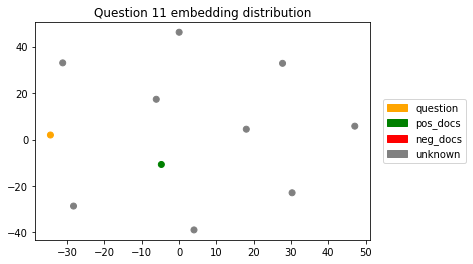

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


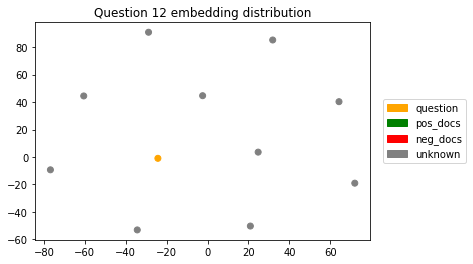

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


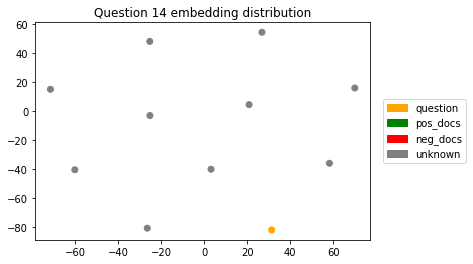

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


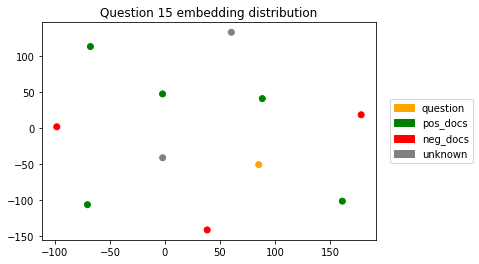

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


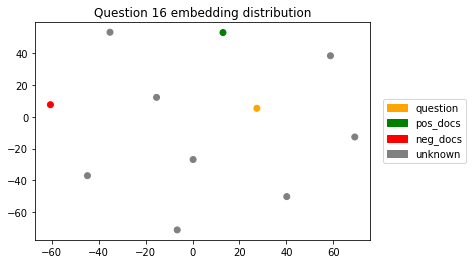

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


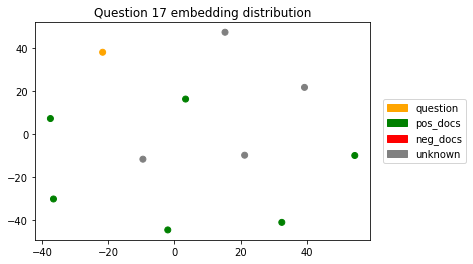

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


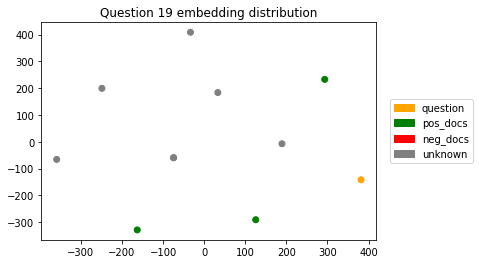

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


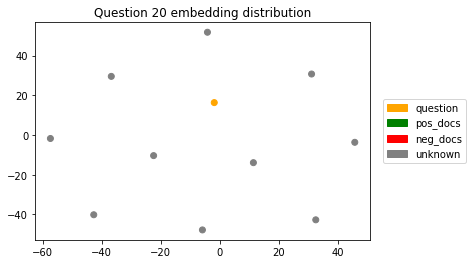

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


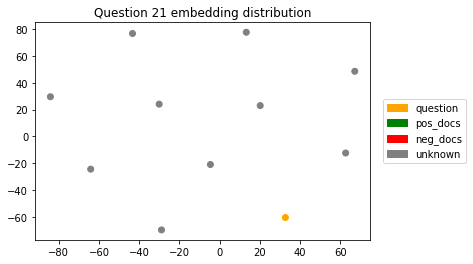

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


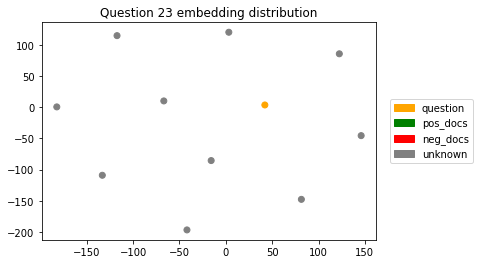

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


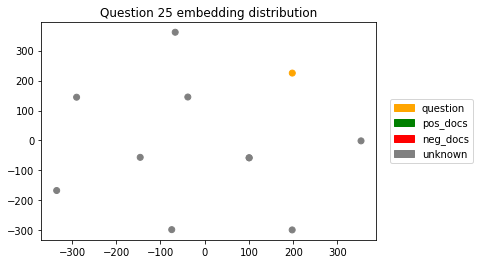

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


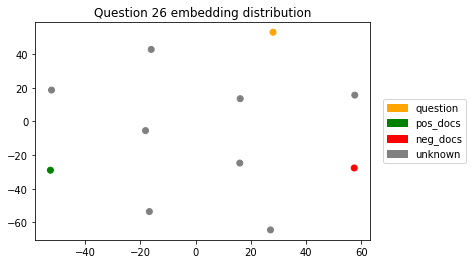

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


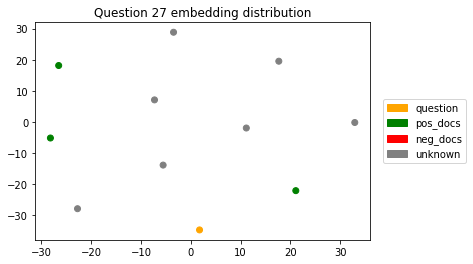

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


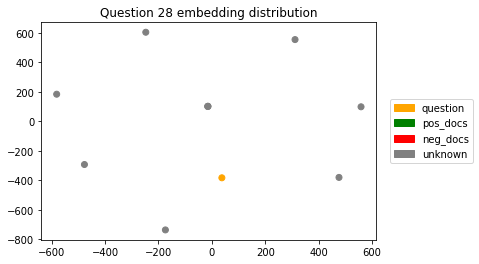

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


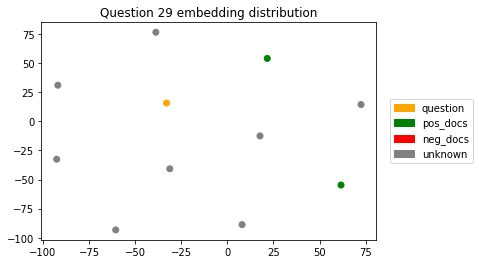

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


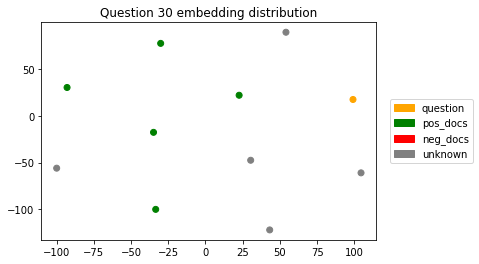

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


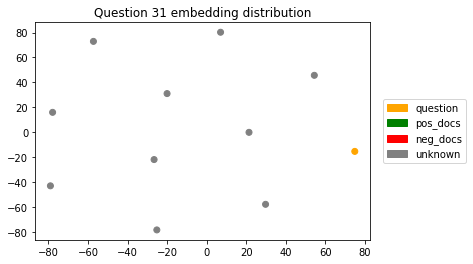

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


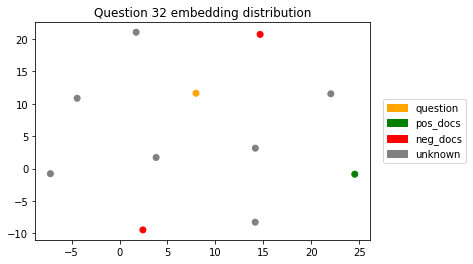

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


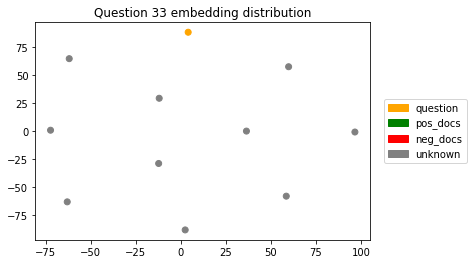

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


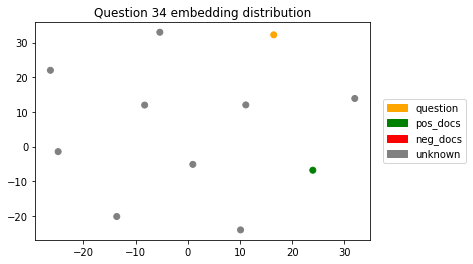

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


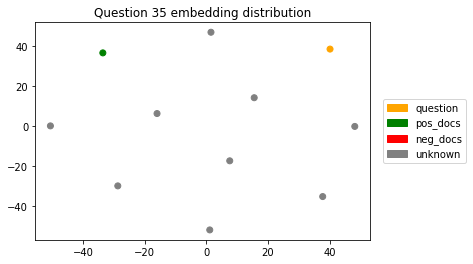

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


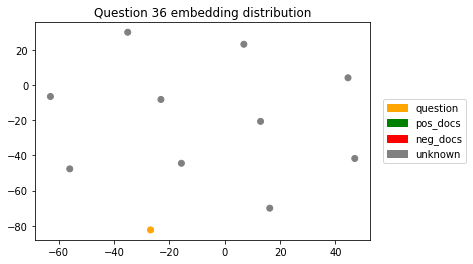

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


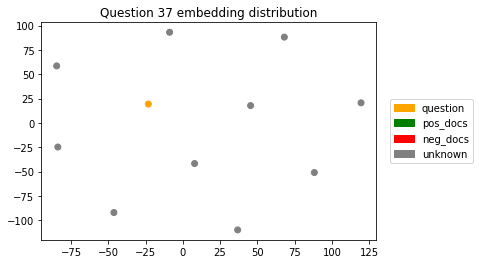

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


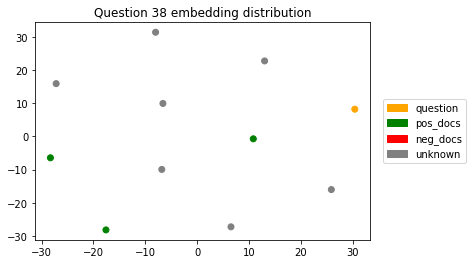

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


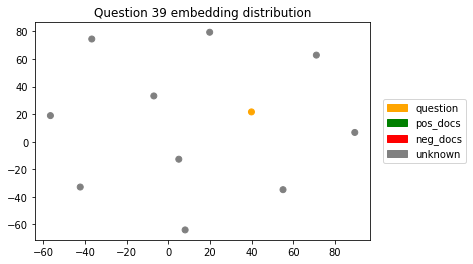

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


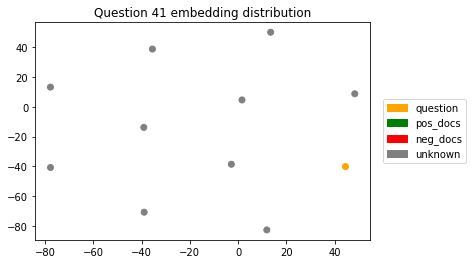

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


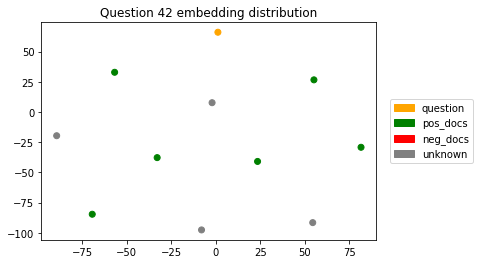

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


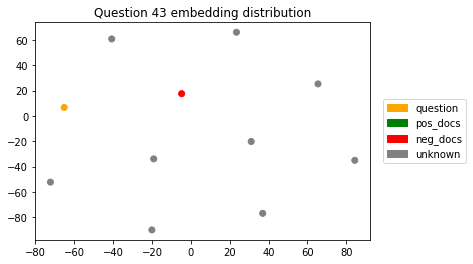

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


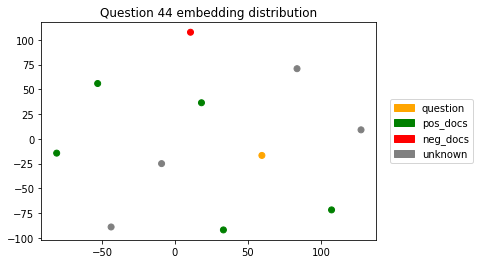

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


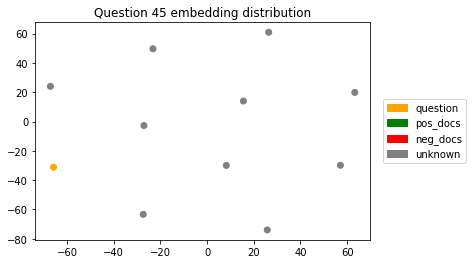

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


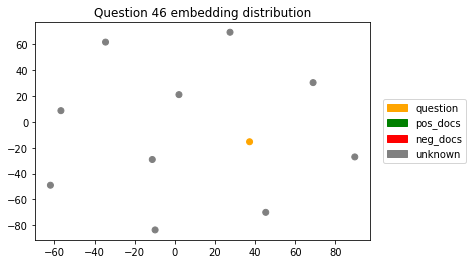

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


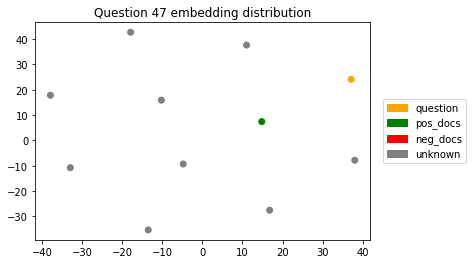

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


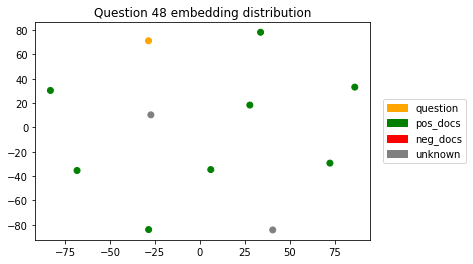

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


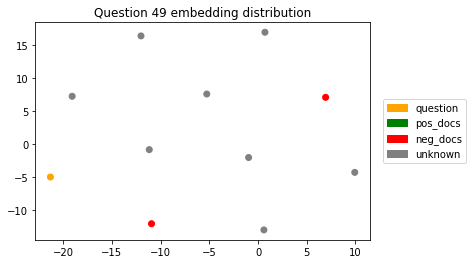

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


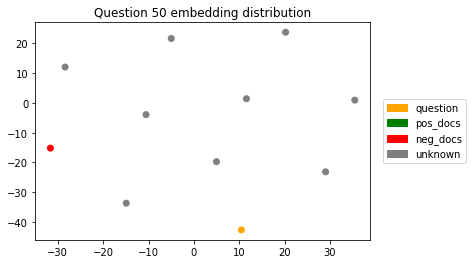

In [516]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import numpy as np

orange_patch = mpatches.Patch(color='orange', label='question')
green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [orange_patch, green_patch, red_patch, grey_patch]
for idx,row in enumerate(actual_data):    
    values = [0]
    colors = ListedColormap(['orange','green','red', 'grey'])
    qid = row['question']['id']
    q_vector = query_embeddings[qid]
    q_vector = q_vector.reshape(-1, len(q_vector))
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        p_vector = passage_embeddings[pid]
        p_vector = p_vector.reshape(-1, len(p_vector))
        q_vector = np.concatenate((q_vector, p_vector), axis=0)
        color = 1 if pid in gold_ids[idx] else 2
        color = 3 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    if len(q_vector) < 2:
        continue
    q_compressed = TSNE(n_components=2, learning_rate='auto',init='pca', random_state=42).fit_transform(q_vector)

    plt.title(f"Question {qid} embedding distribution")
    scatter = plt.scatter(q_compressed[:,0], q_compressed[:,1], c=values, cmap=colors)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()

## BM25 Score vs DPR Score

We expect the graphic will be inversely linear because DPR similarity score has negative correlation with BM25 similarity (While DPR smaller is better, BM25 bigger is better)

In [517]:
import xml.etree.ElementTree as ET

#gather all documents from corpus
docs = []
doc_ids = []

tree = ET.parse('../Dataset/Corpus/corpus_only_question_edited.xml')
root = tree.getroot()

for doc in root:
    for attr in doc:
        attr_type = attr.tag
        attr_content = attr.text
        if attr_type=='KELUHAN':
            content_text = ''
            for content in attr:
                if content.tag == 'JUDUL':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
                elif content.tag == 'ISI':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
            docs.append(content_text)
        elif attr_type == 'ID':
            doc_ids.append(attr_content)



In [518]:
assert len(docs)==len(doc_ids)

In [519]:
docs_map =  dict()
for idx, doc_id in enumerate(doc_ids):
    docs_map[doc_id] = docs[idx]

In [520]:
from tqdm import tqdm

avgdl = sum(len(doc) for doc in docs) / len(docs)
N = len(docs)
docs_freq_map, terms_freq_map, N, avgdl = bm25_init(docs_map)
for q_idx, q_row in tqdm(enumerate(actual_data)):
    query = q_row['question']['title']
    query  += f". {q_row['question']['text']}" if q_row['question']['text'].strip()!="" else ""
    for doc_idx, doc_row in enumerate(q_row['ctxs']):
        doc_id = doc_row['id']
        actual_data[q_idx]['ctxs'][doc_idx]['bm25_score'] = bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map,  docs_map, avgdl, N)
        

45it [00:00, 91.64it/s]


### Aggregated Plot

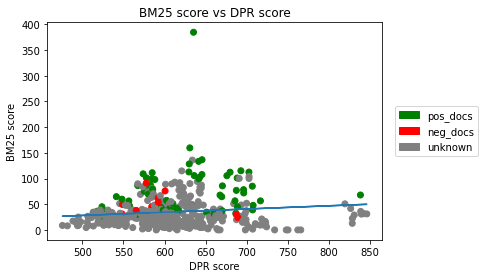

In [521]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.preprocessing import MinMaxScaler, StandardScaler

green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [green_patch, red_patch, grey_patch]
values = []
colors = ListedColormap(['green','red', 'grey'])
score_vector = []
for idx,row in enumerate(actual_data):        
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
score_vector= np.array(score_vector)


m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
plt.title(f"BM25 score vs DPR score")
plt.xlabel("DPR score")
plt.ylabel("BM25 score")
scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)

plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
plt.show()

### Per question plot

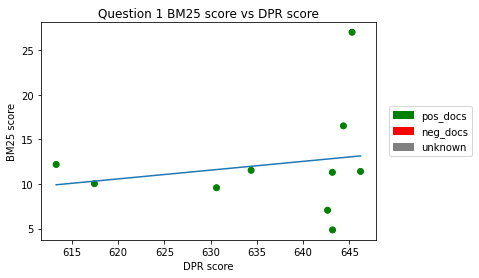

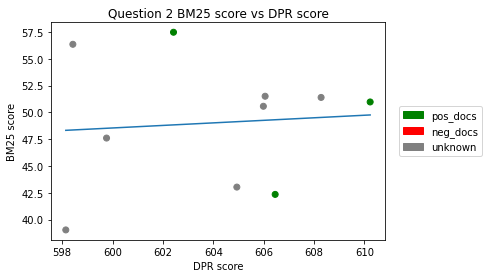

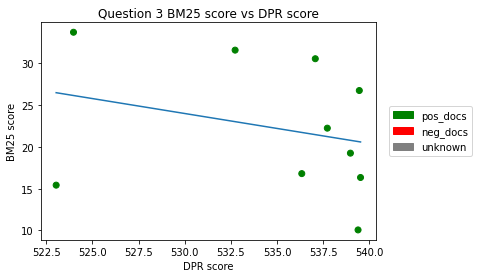

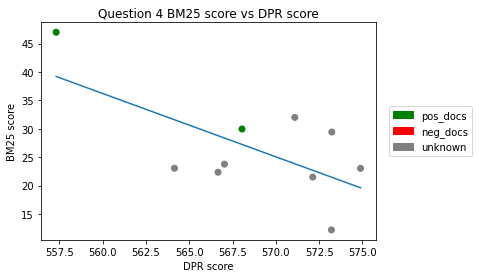

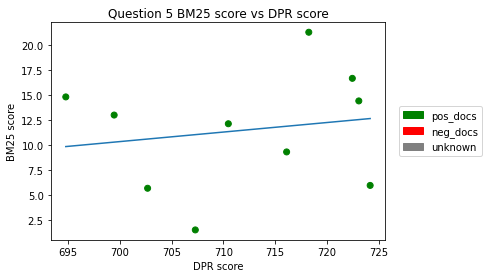

...

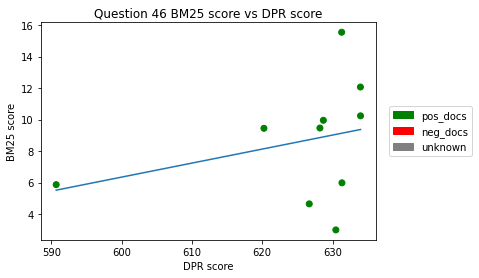

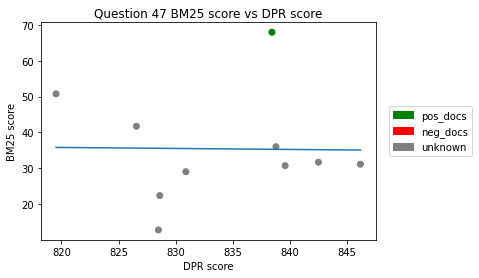

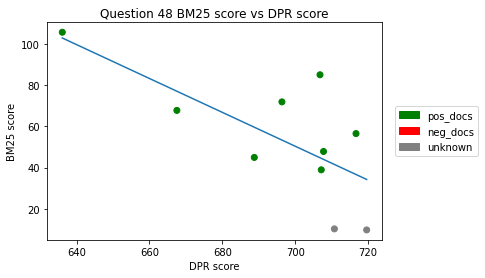

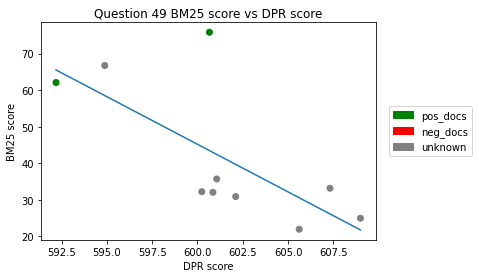

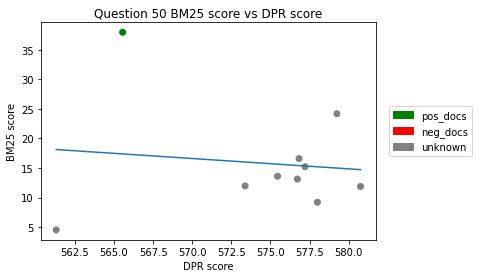

In [522]:
gradients_lst = []
for idx,row in enumerate(actual_data):
    values = []
    score_vector = []
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    score_vector= np.array(score_vector)


    m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
    plt.title(f"Question {qid} BM25 score vs DPR score")
    plt.xlabel("DPR score")
    plt.ylabel("BM25 score")
    scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)
    gradients_lst.append(m)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
    plt.show()

In [523]:
is_positive = [gradient for gradient in gradients_lst if gradient > 0]
is_negative = [gradient for gradient in gradients_lst if gradient < 0]

print(f"positive gradient count: {len(is_positive)}")
print(f"negative gradient count: {len(is_negative)}")

positive gradient count: 20
negative gradient count: 24


In [524]:
from collections import defaultdict

title_idf = defaultdict(int)
text_idf = defaultdict(int)

In [525]:
import csv 
N = 0
with open('../Dataset/Corpus/corpus-syifa-normalized.tsv') as f:
    reader = csv.reader(f, delimiter='\t')
    for row in reader:
        text = row[1]
        title = row[2]
        unique_word_title = []
        unique_word_text = []
        tokenized_text = list(word_tokenize(text))
        tokenized_title = list(word_tokenize(title))
        for word in tokenized_title:
            if word not in unique_word_title:
                title_idf[word] += 1
                unique_word_title.append(word)
        for word in tokenized_text:
            if word not in unique_word_text:
                text_idf[word] += 1
                unique_word_text.append(word)
        N += 1

In [526]:
def get_avg_idf_value(title, text):
    avg_title, avg_text = 0.0 , 0.0
    tokenized_title = list(word_tokenize(title))
    tokenized_text = list(word_tokenize(text))
    for word in tokenized_title:
        avg_title += np.log(((N-title_idf[word]+0.5)/(title_idf[word]+0.5)) + 1)
        avg_text += np.log(((N-text_idf[word]+0.5)/(text_idf[word]+0.5)) + 1)
    avg_title = 0.0 if len(tokenized_title) == 0 else avg_title/len(tokenized_title)
    avg_text = 0.0 if len(tokenized_text) == 0 else avg_text/len(tokenized_text)
    return avg_title, avg_text

# When DPR and its variants are better than sparse models?

In [71]:
import csv
#Initialize question map
question_map = dict()

for row in gold_data:
    q =  row['question']
    question_map[q['id']] = {
        'title': q['title'],
        'text': q['text']
    }

#Initialize passage map
corpus_map = dict()
with open('../Dataset/Corpus/corpus-syifa-normalized.tsv') as f:
    reader = csv.reader(f, delimiter='\t')
    for row in reader:
        pid = row[0]
        text = row[1]
        title = row[2]
        corpus_map[str(pid)] =  {
            'title': title,
            'text': text
        }
    


In [72]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from statistics import median
from scipy.stats import ttest_ind

In [73]:
#sparse models
bm25 = pd.read_csv('../Results/Scores/bm25_eval_tydi_scores.csv')
tfidf = pd.read_csv('../Results/Scores/classic_eval_tydi_scores.csv')
lmd = pd.read_csv('../Results/Scores/lmd_eval_tydi_scores.csv')

#dpr-sparse alpha
bm25_dpr_alpha = pd.read_csv('../Results/Scores/dpr-bm25_eval_tydi_scores.csv')
tfidf_dpr_alpha = pd.read_csv('../Results/Scores/dpr-classic_eval_tydi_scores.csv')
lmd_dpr_alpha = pd.read_csv('../Results/Scores/dpr-lmd_eval_tydi_scores.csv')

#dpr
dpr = pd.read_csv('../Results/Scores/dpr_eval_tydi_scores.csv')

#dpr-sparse alphabeta
bm25_dpr_alphabeta = pd.read_csv('../Results/Scores/dpr-bm25-v2_eval_tydiscores.csv')
lmd_dpr_alphabeta = pd.read_csv('../Results/Scores/dpr-lmd-v2_eval_scores.csv')
tfidf_dpr_alphabeta = pd.read_csv('../Results/Scores/dpr-classic-v2_eval_scores.csv')

#dpr retrieve-sparse rerank
dpr_ret_bm25_rank = pd.read_csv('../Results/Scores/retrieve-dpr_rerank-bm25_eval_scores.csv')
dpr_ret_lmd_rank = pd.read_csv('../Results/Scores/retrieve-dpr_rerank-lmd_eval_scores.csv')
dpr_ret_tfidf_rank = pd.read_csv('../Results/Scores/retrieve-dpr_rerank-classic_eval_scores.csv')

#sparse retrieve-dpr rerank
bm25_ret_dpr_rank = pd.read_csv('../Results/Scores/retrieve-bm25_rerank-dpr_eval_scores.csv')
lmd_ret_dpr_rank = pd.read_csv('../Results/Scores/retrieve-lmd_rerank-dpr_eval_scores.csv')
tfidf_ret_dpr_rank = pd.read_csv('../Results/Scores/retrieve-classic_rerank-dpr_eval_scores.csv')


#monobert-dpr
dpr_ret_monobert_rank = pd.read_csv('../Results/Scores/retrieve-dpr_rerank-monobert_eval_scores.csv')

FileNotFoundError: [Errno 2] No such file or directory: '../Results/Scores/bm25_eval_tydi_scores.csv'

In [ ]:
query_ids = list(question_map.keys())

In [ ]:
query_ids

## Part 1: BM25

In [ ]:
bm25_scores = pd.read_csv('../Results/Scores/bm25_eval_scores.csv')
dpr_bm25_alpha_scores = pd.read_csv('../Results/Scores/dpr-bm25_eval_scores.csv')
dpr_bm25_alphabeta_scores = pd.read_csv('../Results/Scores/dpr-bm25_eval_scores.csv')

In [ ]:
from matplotlib.pyplot import figure
keys = ['dpr' ,'bm25_dpr_alpha', 'bm25_dpr_alphabeta', 'dpr_ret_bm25_rank', 'bm25_ret_dpr_rank', 'dpr_ret_monobert_rank']
dpr_variations = [dpr, bm25_dpr_alpha, bm25_dpr_alphabeta, dpr_ret_bm25_rank, bm25_ret_dpr_rank, dpr_ret_monobert_rank]
for i in range(len(keys)):
    name = keys[i]
    model = dpr_variations[i]
    
    plt.plot(bm25.index, bm25['BPref'], label='bm25')
    plt.plot(model.index, model['BPref'], label=name)
    plt.title(f"{name} vs bm25")
    plt.xlabel("Query")
    plt.ylabel("BPref")
    plt.legend()
    plt.show()

In [ ]:
#When the DPR is better than bm25?

better_queries =  dict()
worse_queries = dict()
for i in range(len(keys)):
    name = keys[i]
    model = dpr_variations[i]
    dense = model['BPref']
    sparse = bm25['BPref']
    for i in range(len(dense)):
        if dense[i] >= sparse[i]:
            if query_ids[i] not in better_queries:
                better_queries[query_ids[i]] = 0
            better_queries[query_ids[i]] += 1  
        else:
            if query_ids[i] not in worse_queries:
                worse_queries[query_ids[i]] = 0
            worse_queries[query_ids[i]] += 1 
better_queries = sorted(better_queries.items(), key=lambda kv: kv[1], reverse=True)
worse_queries = sorted(worse_queries.items(), key=lambda kv: kv[1], reverse=True)

In [ ]:
#Lets check the top 10 queries
selected_questions = better_queries
neg_selected_questions = worse_queries

### Whole words analysis

In [ ]:
#dpr better 
titles = []
texts = []
for selected_question in selected_questions:
    question = question_map[selected_question[0]]
    question_text = question['text']
    question_title = question['title']
    titles.append(question_title)
    texts.append(question_text)
    print(f"Text: {question_text}")
    print(f"Title: {question_title}")
    print()

In [ ]:
#dpr worse
neg_titles = []
neg_texts = []
for selected_question in neg_selected_questions:
    question = question_map[selected_question[0]]
    question_text = question['text']
    question_title = question['title']
    neg_titles.append(question_title)
    neg_texts.append(question_text)
    print(f"Text: {question_text}")
    print(f"Title: {question_title}")
    print()

In [ ]:
#title
print("DPR Better")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(titles))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

print("DPR Worse")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(neg_titles))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [ ]:
#text
print("DPR Better")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(texts))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

print("DPR Worse")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(neg_texts))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

### Unknown words analysis

In [ ]:
from transformers import AutoTokenizer
from tqdm import tqdm

In [435]:
tokenizer = AutoTokenizer.from_pretrained('indobenchmark/indobert-base-p2', do_lower_case=True)

#### DPR Better

In [436]:
def update_unknown_frequency(unknown_word_freq, tokens, unknown_word_lst):
    if len(tokens) == 0:
        return unknown_word_freq, unknown_word_lst
    prefix = tokens[0]
    is_unknown = False
    for token in tokens:
        if is_unknown:
            if token.startswith("##"):
                prefix += token[2:]
            else:
                is_unknown = False
                unknown_word_freq[prefix] += 1
                unknown_word_lst.append(prefix)
                prefix = token
        else:
            if token.startswith("##") or token.startswith(" ##"):
                is_unknown = True
                prefix += token[2:]
            else:
                prefix = token
    return unknown_word_freq, unknown_word_lst

In [437]:
unknown_words_text = defaultdict(int)
unknown_words_text_lst = []
unknown_words_title = defaultdict(int)
unknown_words_title_lst = []
pbar = tqdm(total=len(list(question_map.keys())), desc=f"Tokenizing")
for title, text in zip(titles, texts):
    tokenized_title = tokenizer.tokenize(title, max_length=512, truncation=True)
    tokenized_text = tokenizer.tokenize(text, max_length=512, truncation=True)
    unknown_words_text, unknown_words_text_lst = update_unknown_frequency(unknown_words_text, tokenized_text, unknown_words_text_lst)
    unknown_words_title, unknown_words_title_lst = update_unknown_frequency(unknown_words_title, tokenized_title, unknown_words_title_lst)
    pbar.update(1)

Tokenizing:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 37/45 [16:49<03:38, 27.28s/it]


In [438]:
unknown_words_text_lst 

['berdenging',
 'dokternya',
 'cutton',
 'buds',
 'kotorannya',
 'dengung',
 'nunjuk',
 'merengeknya',
 'suru',
 'bertamba',
 'usahain',
 'komsusi',
 'mhswi',
 'smst',
 'poltekkes',
 '2tahun',
 'hbv',
 'detected',
 'sgpt',
 'sembuhnya',
 'cukuran',
 'nyut',
 'nyutan',
 'nyut',
 'nyutannya',
 'terasanya',
 'pertannyaanya',
 'gizinya',
 'tercukupi',
 'dibotol',
 'dianya',
 'sepatah',
 'larian',
 'mejanya',
 'mengejarnya',
 'disorder',
 'ligamen',
 'ligamen',
 'diwajah',
 'panu',
 'irsan',
 '24th',
 'batuknya',
 'pnyakit',
 'mimisan',
 'mimisan',
 'spertinya',
 'megalir',
 'bbrapa',
 'mimisan',
 'trz',
 'tpii',
 'aloe',
 'aloe',
 'perantau',
 'belekan',
 'belekannya',
 'pengelihatan',
 'menyembuhannya',
 'barusaja',
 'kesebelah',
 'nyalur',
 'vegeta',
 'hipoalergenik',
 'nyembuhin',
 'cemaskan',
 'meriang',
 'ekg',
 'sekarangpun',
 'pereda',
 'dipangkal',
 'mengganjal',
 'meraskan',
 'denyutan',
 'denyutan',
 'panic',
 'nemenukan',
 'psikosomatik',
 'lebam',
 'kebentur',
 'lebam',
 'menur

In [439]:
unknown_words_title_lst 

['berdengung',
 'hbv',
 'sgpt',
 'berbahayakah',
 'disorder',
 'mimisan',
 'aloe',
 'berbahayakah',
 'berbahayakah',
 'melamun',
 'berkhayal']

#### DPR Worse

In [440]:
unknown_words_text = defaultdict(int)
unknown_words_text_lst = []
unknown_words_title = defaultdict(int)
unknown_words_title_lst = []
pbar = tqdm(total=len(list(question_map.keys())), desc=f"Tokenizing")
for title, text in zip(neg_titles, neg_texts):
    tokenized_title = tokenizer.tokenize(title, max_length=512, truncation=True)
    tokenized_text = tokenizer.tokenize(text, max_length=512, truncation=True)
    unknown_words_text, unknown_words_text_lst = update_unknown_frequency(unknown_words_text, tokenized_text, unknown_words_text_lst)
    unknown_words_title, unknown_words_title_lst = update_unknown_frequency(unknown_words_title, tokenized_title, unknown_words_title_lst)
    pbar.update(1)


Tokenizing:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 41/45 [00:00<00:00, 142.52it/s]


In [441]:
unknown_words_text_lst 

['linu',
 'ditenggorokan',
 'tenggorokanku',
 'kreatinin',
 'mmol',
 'kalum',
 'mmol',
 'ureum',
 'pipisnya',
 'indung',
 'ingus',
 'maladaptive',
 'daydreaming',
 'reflek',
 'maladaptive',
 'daydreaming',
 'sutomo',
 'menggemukkan',
 'gemuknya',
 'atensinya',
 'lebam',
 'kebentur',
 'lebam',
 'menuruni',
 'minggy',
 'panic',
 'ketka',
 'panic',
 'ousing',
 'aloe',
 'aloe',
 'perantau',
 'belekan',
 'belekannya',
 'pengelihatan',
 'menyembuhannya',
 'cemaskan',
 'meriang',
 'ekg',
 'sekarangpun',
 'pereda',
 'dipangkal',
 'mengganjal',
 'meraskan',
 'denyutan',
 'denyutan',
 'panic',
 'nemenukan',
 'psikosomatik',
 'barusaja',
 'kesebelah',
 'nyalur',
 'vegeta',
 'hipoalergenik',
 'nyembuhin',
 'trz',
 'tpii',
 'diwajah',
 'panu',
 'pnyakit',
 'mimisan',
 'mimisan',
 'spertinya',
 'megalir',
 'bbrapa',
 'mimisan',
 'irsan',
 '24th',
 'batuknya',
 'dianya',
 'sepatah',
 'larian',
 'mejanya',
 'mengejarnya',
 'disorder',
 'ligamen',
 'ligamen',
 'pertannyaanya',
 'gizinya',
 'tercukupi',

In [442]:
unknown_words_title_lst

['tenggoroka',
 'papah',
 'indung',
 'melamun',
 'berkhayal',
 'berbahayakah',
 'aloe',
 'berbahayakah',
 'mimisan',
 'disorder',
 'berbahayakah',
 'hbv',
 'sgpt']

### IDF analysis

#### DPR Better

In [453]:
avg_title, avg_text = 0.0, 0.0
better_titles = []
better_texts = []
for title, text in zip(titles, texts):
    cur_title, cur_text = get_avg_idf_value(title, text)
    better_titles.append(cur_title)
    better_texts.append(cur_text)
    avg_title += cur_title
    avg_text += cur_text
print(f"Average idf for title: {avg_title/len(titles)}")
print(f"Average idf for text: {avg_text/len(texts)}")

Average idf for title: 5.133895730778456
Average idf for text: 0.4439383831621266


#### DPR Worse

In [454]:
avg_title, avg_text = 0.0, 0.0
worse_titles = []
worse_texts = []
for title, text in zip(neg_titles, neg_texts):
    cur_title, cur_text = get_avg_idf_value(title, text)
    worse_titles.append(cur_title)
    worse_texts.append(cur_text)
    avg_title += cur_title
    avg_text += cur_text
print(f"Average idf for title: {avg_title/len(titles)}")
print(f"Average idf for text: {avg_text/len(texts)}")

Average idf for title: 5.152458013132561
Average idf for text: 0.44288461747388685


In [455]:
print(ttest_ind(better_titles, worse_titles).pvalue <= 0.05)
print(ttest_ind(better_texts, worse_texts).pvalue <= 0.05)

False
False


In [456]:
better_idfs = better_titles + better_texts
worse_idfs = worse_titles + worse_texts

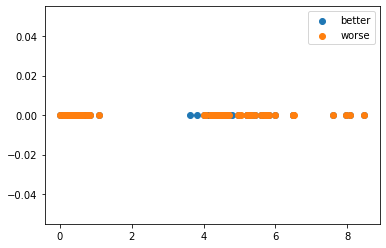

In [457]:
plt.scatter(better_idfs, [0]*len(better_idfs), label='better')
plt.scatter(worse_idfs, [0]*len(worse_idfs), label='worse')
plt.legend()


In [458]:
median(better_idfs)

2.3496302918627645

In [459]:
median(worse_idfs)

2.5438315818429613

Some findings:
- Two spikes on the BM25 are significantly worse than any DPR variations
- DPR retriever & BM25 reranker pattern is quite close with the DPR one
- The rest are quite dominant which signifies that the BM25 signal is dominant rather than the DPR
- Using DPR as reranker for BM25 retriever is actually bad idea as it degrades the model performance
- DPR performs better than the BM25 when the query is more general according to vocabulary analysis. This claims is also justified by the idf analysis. We can see that when the query is more general (idf low) the DPR (and its variations)'s performance can be better than BM25. Meanwhile when query is more specific (idf high) the DPR (and its variations)'s performance is worse than BM25.

## Part 2: LMDirichlet

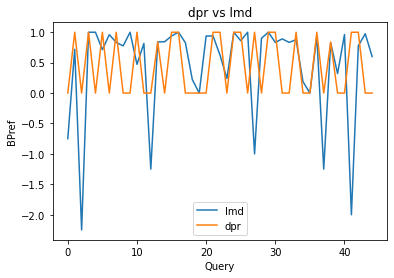

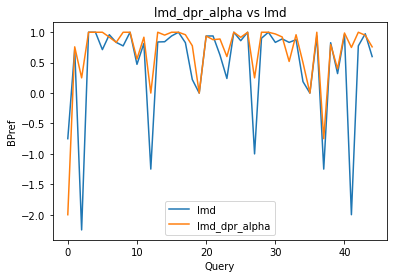

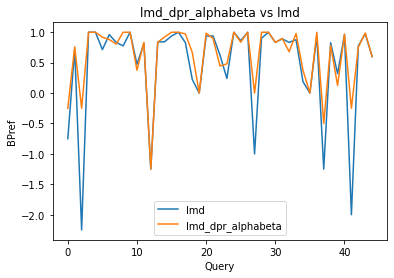

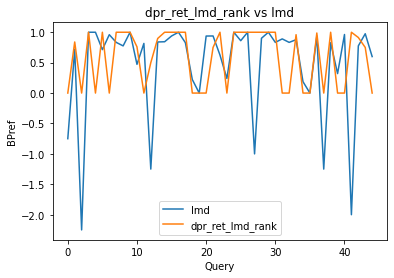

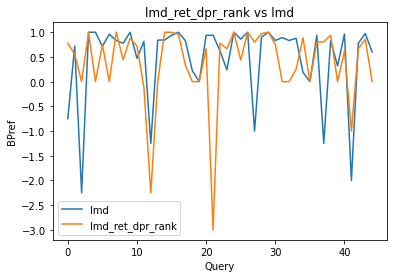

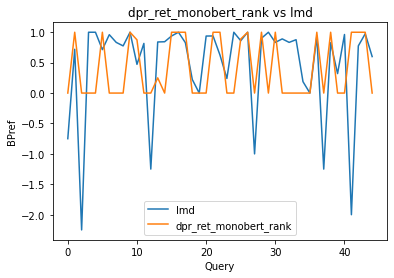

In [491]:
keys = ['dpr' ,'lmd_dpr_alpha', 'lmd_dpr_alphabeta', 'dpr_ret_lmd_rank', 'lmd_ret_dpr_rank', 'dpr_ret_monobert_rank']
dpr_variations = [dpr, lmd_dpr_alpha, lmd_dpr_alphabeta, dpr_ret_lmd_rank, lmd_ret_dpr_rank, dpr_ret_monobert_rank]
for i in range(len(keys)):
    name = keys[i]
    model = dpr_variations[i]
    
    plt.plot(lmd.index, lmd['BPref'], label='lmd')
    plt.plot(model.index, model['BPref'], label=name)
    plt.title(f"{name} vs lmd")
    plt.xlabel("Query")
    plt.ylabel("BPref")
    plt.legend()
    plt.show()

In [492]:
#When the DPR is better than LMDirichlet?

better_queries =  dict()
worse_queries = dict()
for i in range(len(keys)):
    name = keys[i]
    model = dpr_variations[i]
    dense = model['BPref']
    sparse = lmd['BPref']
    for i in range(len(dense)):
        if dense[i] >= sparse[i]:
            if query_ids[i] not in better_queries:
                better_queries[query_ids[i]] = 0
            better_queries[query_ids[i]] += 1  
        else:
            if query_ids[i] not in worse_queries:
                worse_queries[query_ids[i]] = 0
            worse_queries[query_ids[i]] += 1 
better_queries = sorted(better_queries.items(), key=lambda kv: kv[1], reverse=True)
worse_queries = sorted(worse_queries.items(), key=lambda kv: kv[1], reverse=True)

In [493]:
#Lets check the top 10 queries
selected_questions = better_queries
neg_selected_questions = worse_queries

In [494]:
#dpr better 
titles = []
texts = []
for selected_question in selected_questions:
    question = question_map[selected_question[0]]
    question_text = question['text']
    question_title = question['title']
    titles.append(question_title)
    texts.append(question_text)
    print(f"Text: {question_text}")
    print(f"Title: {question_title}")
    print()

Text: sore dok . . maaf dok saya sudah 4 hari mengalami benjolan di daerah kemaluan mula-mula benjolan tersebut kecil dan sekarang membesar lalu pecah dok . . rasanya linu dan sakit jika malam hari . . kira-kira apa nama penyakit yang saya alami ya dok
Title: benjolan di sekitar kelamin

Text: saya mhswi smst 4 di salah satu poltekkes di kota saya . pada tahun lalu , saya sempat mengajukan pertanyaan mengenai gejala-gejala yang saya alami , dan setelah saya mengecek jawabannya pada februari tahun ini , saya dapat digolongkan depresi karena mencakup cukup banyak ciri-ciri depresi . saat saya melihat jawaban itu , saya rasa saat itu saya sudah mampu mengatasi gejala-gejala depresi yang saya alami sebelumnya . namun akhir-akhir ini , saya mulai mengalami beberapa gejala depresi yang sempat saya rasakan dulu . seperti kehilangan motivasi , tiba-tiba pikiran saya kosong , sering merenung , tidak fokus pada suatu hal yang saya kerjakan , sering berpikiran kenapa saya tidak bisa semangat sepe

In [495]:
#dpr worse
neg_titles = []
neg_texts = []
for selected_question in neg_selected_questions:
    question = question_map[selected_question[0]]
    question_text = question['text']
    question_title = question['title']
    neg_titles.append(question_title)
    neg_texts.append(question_text)
    print(f"Text: {question_text}")
    print(f"Title: {question_title}")
    print()

Text: sore dok , saya mau tanya , apakah tulang yang patah ada kemungkinan tidak tumbuh menyambung ? apakah arti dari tidak tampak reaksi ? dan berapa lama tulang bisa menyambung dan kuat ? terima kasih dok
Title: patah tulang dapat menyambung

Text: 
Title: dok , ada efek sampingnya tidak jika tidak melakukan imunisasi lanjutan lagi ?

Text: dok , kemarin saya disarankan oleh dokter saya untuk melakukan usg karena saya sering mengalami nyeri perut pada saat menstruasi . dan hasil usg nya ternyata saya mengalami penyakit infeksi indung telur . apa langkah yang saya ambil selanjutnya ? sampai saat ini saya hanya membiarkannya karena rasa sakitnya hanya terasa pada waktu menstruasi saja .
Title: infeksi indung telur

Text: dok , baru-baru ini saya mengetahui bahwa saya pengidap maladaptive daydreaming . terkadang saya membuat cerita lalu memerankan nya , dan terkadang gerakan saya reflek mengikuti plot yang saya buat . dok apakah maladaptive daydreaming berkaitan dengan gangguan kejiwaan

DPR Better


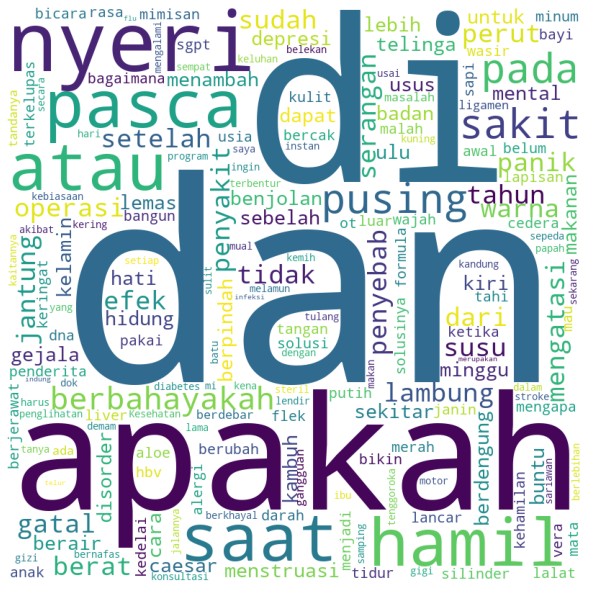

DPR Worse


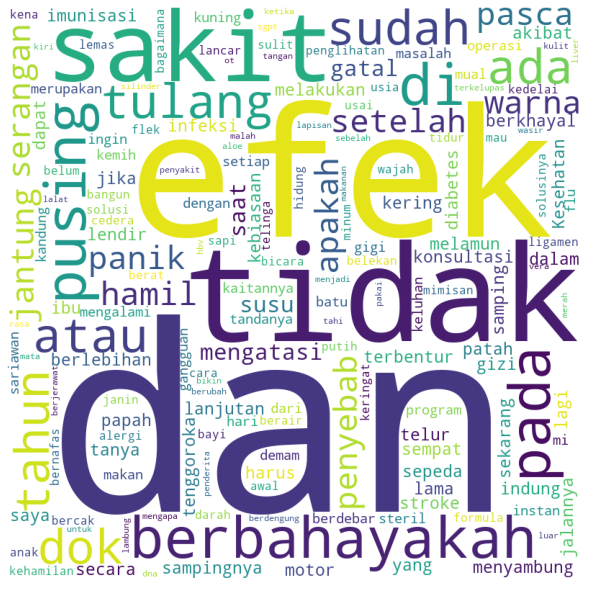

In [496]:
#title
print("DPR Better")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(titles))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

print("DPR Worse")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(neg_titles))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

DPR Better


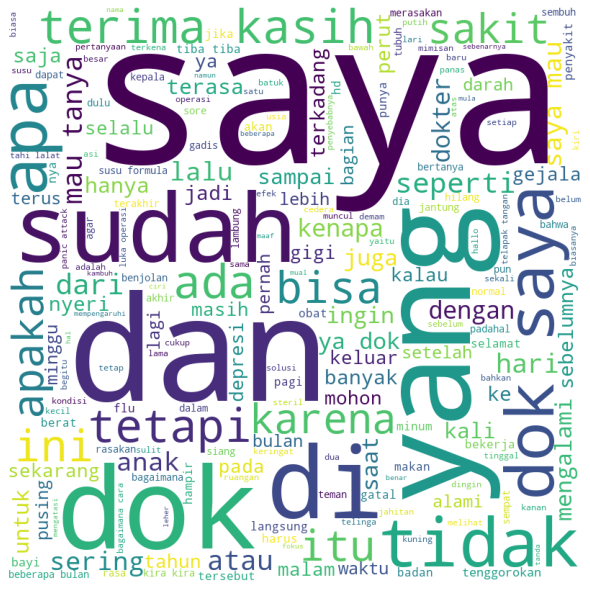

DPR Worse


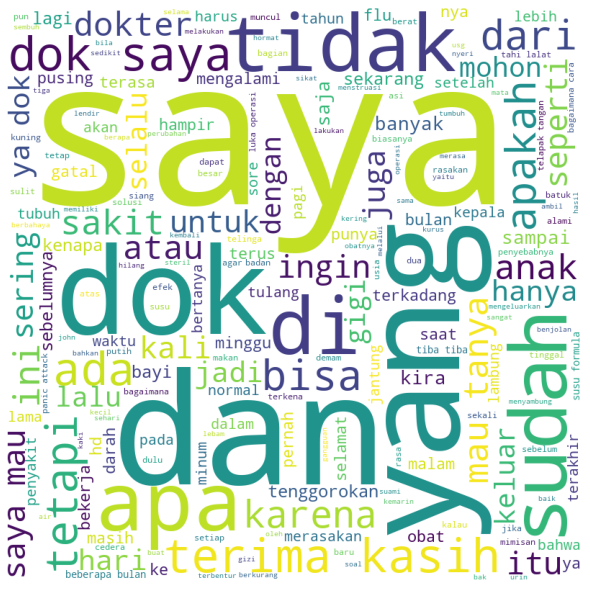

In [497]:
#text
print("DPR Better")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(texts))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

print("DPR Worse")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(neg_texts))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

### Unknown words analysis

#### DPR Better

In [498]:
unknown_words_text = defaultdict(int)
unknown_words_text_lst = []
unknown_words_title = defaultdict(int)
unknown_words_title_lst = []
pbar = tqdm(total=len(list(question_map.keys())), desc=f"Tokenizing")
for title, text in zip(titles, texts):
    tokenized_title = tokenizer.tokenize(title, max_length=512, truncation=True)
    tokenized_text = tokenizer.tokenize(text, max_length=512, truncation=True)
    unknown_words_text, unknown_words_text_lst = update_unknown_frequency(unknown_words_text, tokenized_text, unknown_words_text_lst)
    unknown_words_title, unknown_words_title_lst = update_unknown_frequency(unknown_words_title, tokenized_title, unknown_words_title_lst)
    pbar.update(1)

Tokenizing:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 37/45 [02:18<00:29,  3.74s/it]


In [499]:
unknown_words_text_lst 

['linu',
 'mhswi',
 'smst',
 'poltekkes',
 'minggy',
 'trz',
 'tpii',
 'suru',
 'bertamba',
 'usahain',
 'komsusi',
 'kesebelah',
 'nyalur',
 'vegeta',
 'dianya',
 'sepatah',
 'larian',
 'mejanya',
 'mengejarnya',
 'disorder',
 'ingus',
 'berdenging',
 'dokternya',
 'cutton',
 'buds',
 'kotorannya',
 'dengung',
 'nunjuk',
 'merengeknya',
 'aloe',
 'aloe',
 '2tahun',
 'hbv',
 'detected',
 'sgpt',
 'sembuhnya',
 'cukuran',
 'nyut',
 'nyutan',
 'nyut',
 'nyutannya',
 'terasanya',
 'diwajah',
 'panu',
 'pnyakit',
 'mimisan',
 'mimisan',
 'spertinya',
 'megalir',
 'bbrapa',
 'mimisan',
 'pertannyaanya',
 'gizinya',
 'tercukupi',
 'dibotol',
 'hipoalergenik',
 'nyembuhin',
 'ligamen',
 'ligamen',
 'atensinya',
 'belekan',
 'belekannya',
 'pengelihatan',
 'menyembuhannya',
 'cemaskan',
 'meriang',
 'ekg',
 'sekarangpun',
 'pereda',
 'dipangkal',
 'mengganjal',
 'meraskan',
 'denyutan',
 'denyutan',
 'panic',
 'nemenukan',
 'psikosomatik',
 'perantau',
 'barusaja',
 'maladaptive',
 'daydreamin

In [500]:
unknown_words_title_lst 

['disorder',
 'berdengung',
 'aloe',
 'hbv',
 'sgpt',
 'berbahayakah',
 'mimisan',
 'berbahayakah',
 'melamun',
 'berkhayal',
 'berbahayakah',
 'tenggoroka',
 'papah',
 'indung']

#### DPR worse

In [501]:
unknown_words_text = defaultdict(int)
unknown_words_text_lst = []
unknown_words_title = defaultdict(int)
unknown_words_title_lst = []
pbar = tqdm(total=len(list(question_map.keys())), desc=f"Tokenizing")
for title, text in zip(neg_titles, neg_texts):
    tokenized_title = tokenizer.tokenize(title, max_length=512, truncation=True)
    tokenized_text = tokenizer.tokenize(text, max_length=512, truncation=True)
    unknown_words_text, unknown_words_text_lst = update_unknown_frequency(unknown_words_text, tokenized_text, unknown_words_text_lst)
    unknown_words_title, unknown_words_title_lst = update_unknown_frequency(unknown_words_title, tokenized_title, unknown_words_title_lst)
    pbar.update(1)


Tokenizing:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 43/45 [00:00<00:00, 58.92it/s]


In [502]:
unknown_words_text_lst 

['indung',
 'maladaptive',
 'daydreaming',
 'reflek',
 'maladaptive',
 'daydreaming',
 'lebam',
 'kebentur',
 'lebam',
 'menuruni',
 'sutomo',
 'menggemukkan',
 'gemuknya',
 'ditenggorokan',
 'tenggorokanku',
 'kreatinin',
 'mmol',
 'kalum',
 'mmol',
 'ureum',
 'pipisnya',
 'panic',
 'ketka',
 'panic',
 'irsan',
 '24th',
 'batuknya',
 'ousing',
 'barusaja',
 'perantau',
 'atensinya',
 'belekan',
 'belekannya',
 'pengelihatan',
 'menyembuhannya',
 'cemaskan',
 'meriang',
 'ekg',
 'sekarangpun',
 'pereda',
 'dipangkal',
 'mengganjal',
 'meraskan',
 'denyutan',
 'denyutan',
 'panic',
 'nemenukan',
 'psikosomatik',
 'hipoalergenik',
 'nyembuhin',
 'ligamen',
 'ligamen',
 'pertannyaanya',
 'gizinya',
 'tercukupi',
 'dibotol',
 'diwajah',
 'panu',
 'pnyakit',
 'mimisan',
 'mimisan',
 'spertinya',
 'megalir',
 'bbrapa',
 'mimisan',
 'ingus',
 'nunjuk',
 'merengeknya',
 'berdenging',
 'dokternya',
 'cutton',
 'buds',
 'kotorannya',
 'dengung',
 'aloe',
 'aloe',
 'sembuhnya',
 'cukuran',
 'nyut

In [503]:
unknown_words_title_lst 

['indung',
 'melamun',
 'berkhayal',
 'berbahayakah',
 'tenggoroka',
 'papah',
 'berbahayakah',
 'mimisan',
 'berdengung',
 'aloe',
 'berbahayakah',
 'hbv',
 'sgpt']

### IDF analysis

#### DPR Better

In [504]:
avg_title, avg_text = 0.0, 0.0
better_titles = []
better_texts = []
for title, text in zip(titles, texts):
    cur_title, cur_text = get_avg_idf_value(title, text)
    better_titles.append(cur_title)
    better_texts.append(cur_text)
    avg_title += cur_title
    avg_text += cur_text
print(f"Average idf for title: {avg_title/len(titles)}")
print(f"Average idf for text: {avg_text/len(texts)}")

Average idf for title: 5.132840039105563
Average idf for text: 0.44856151235515856


#### DPR Worse

In [505]:
avg_title, avg_text = 0.0, 0.0
worse_titles = []
worse_texts = []
for title, text in zip(neg_titles, neg_texts):
    cur_title, cur_text = get_avg_idf_value(title, text)
    worse_titles.append(cur_title)
    worse_texts.append(cur_text)
    avg_title += cur_title
    avg_text += cur_text
print(f"Average idf for title: {avg_title/len(titles)}")
print(f"Average idf for text: {avg_text/len(texts)}")

Average idf for title: 4.581886102970043
Average idf for text: 0.40568830889784296


In [506]:
print(ttest_ind(better_titles, worse_titles).pvalue <= 0.05)
print(ttest_ind(better_texts, worse_texts).pvalue <= 0.05)

False
False


In [508]:
better_idfs = better_titles + better_texts
worse_idfs = worse_titles + worse_texts

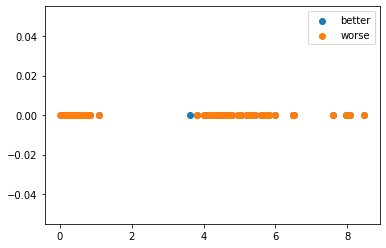

In [509]:
plt.scatter(better_idfs, [0]*len(better_idfs), label='better')
plt.scatter(worse_idfs, [0]*len(worse_idfs), label='worse')
plt.legend()
plt.show()

In [510]:
median(better_idfs)

2.3496302918627645

In [511]:
median(worse_idfs)

2.4540709500363294

Some findings:
- It turns out, the phenomenon not only happens on the BM25, it's also actually happened on the LMD one.

## Part 3: TFIDF

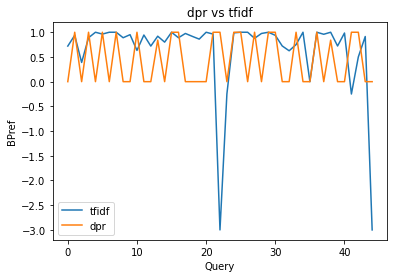

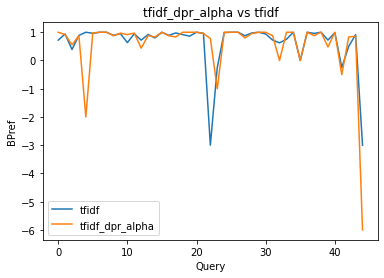

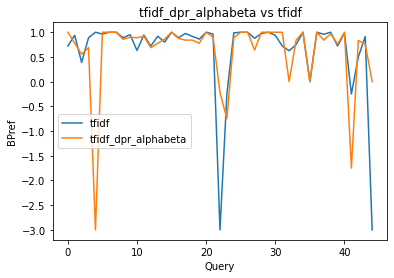

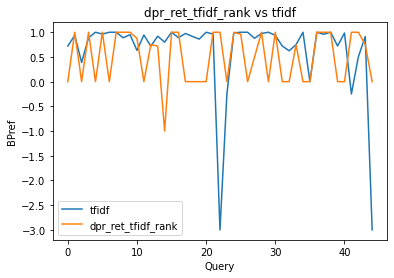

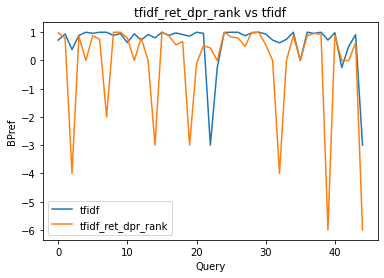

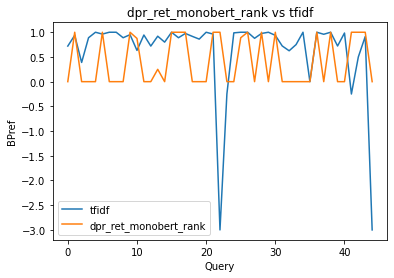

In [512]:
keys = ['dpr' ,'tfidf_dpr_alpha', 'tfidf_dpr_alphabeta', 'dpr_ret_tfidf_rank', 'tfidf_ret_dpr_rank', 'dpr_ret_monobert_rank']
dpr_variations = [dpr, tfidf_dpr_alpha, tfidf_dpr_alphabeta, dpr_ret_tfidf_rank, tfidf_ret_dpr_rank, dpr_ret_monobert_rank]
for i in range(len(keys)):
    name = keys[i]
    model = dpr_variations[i]
    
    plt.plot(lmd.index, tfidf['BPref'], label='tfidf')
    plt.plot(model.index, model['BPref'], label=name)
    plt.title(f"{name} vs tfidf")
    plt.xlabel("Query")
    plt.ylabel("BPref")
    plt.legend()
    plt.show()

In [513]:
#When the DPR is better than TFIDF?

better_queries =  dict()
worse_queries = dict()
for i in range(len(keys)):
    name = keys[i]
    model = dpr_variations[i]
    dense = model['BPref']
    sparse = tfidf['BPref']
    for i in range(len(dense)):
        if dense[i] >= sparse[i]:
            if query_ids[i] not in better_queries:
                better_queries[query_ids[i]] = 0
            better_queries[query_ids[i]] += 1  
        else:
            if query_ids[i] not in worse_queries:
                worse_queries[query_ids[i]] = 0
            worse_queries[query_ids[i]] += 1 
better_queries = sorted(better_queries.items(), key=lambda kv: kv[1], reverse=True)
worse_queries = sorted(worse_queries.items(), key=lambda kv: kv[1], reverse=True)

In [514]:
#Lets check the top 10 queries
selected_questions = better_queries
neg_selected_questions = worse_queries

In [515]:
#dpr better 
titles = []
texts = []
for selected_question in selected_questions:
    question = question_map[selected_question[0]]
    question_text = question['text']
    question_title = question['title']
    titles.append(question_title)
    texts.append(question_text)
    print(f"Text: {question_text}")
    print(f"Title: {question_title}")
    print()

Text: dok , saya mau tanya , anak saya sekarang sudah hampir berumur tiga tahun tetapi kenapa ya bicaranya anak susah ? dia selalu menunjuk-nunjuk jika ingin sesuatu . berbicara sesekali dan kebanyakan merengeknya dok . padahal saya selalu mengajak anak bicara . bagaimana ya dok solusinya ? saya takut anak saya terlambat . terima kasih .
Title: belum lancar bicara di usia 3 tahun , bagaimana solusinya ?

Text: dok , sudah 3 hari ini saya mengalami sakit atau nyeri di ulu hati terkadang di perut bagian kiri disertai mual , pusing , leher kaku , lemas kadang sampai seperti mau pingsan . kalau pagi keringat dingin dan malam hari badan terasa panas dan nyeri di ulu hati terasa semakin sakit . itu kenapa dok ?
Title: nyeri di ulu hati gejala penyakit lambung

Text: dok saya sengaja matikan ac ruangan kerja saya , karena saya sedang batuk dan demam , keringat keluar banyak dibarengi dengan banyak minum sambil bekerja . apakah keringat ini sehat dok ?
Title: keringat saat sakit

Text: dok say

In [516]:
#dpr worse
neg_titles = []
neg_texts = []
for selected_question in neg_selected_questions:
    question = question_map[selected_question[0]]
    question_text = question['text']
    question_title = question['title']
    neg_titles.append(question_title)
    neg_texts.append(question_text)
    print(f"Text: {question_text}")
    print(f"Title: {question_title}")
    print()

Text: dok , baru-baru ini saya mengetahui bahwa saya pengidap maladaptive daydreaming . terkadang saya membuat cerita lalu memerankan nya , dan terkadang gerakan saya reflek mengikuti plot yang saya buat . dok apakah maladaptive daydreaming berkaitan dengan gangguan kejiwaan ? apa saya bisa sembuh ?
Title: kebiasaan melamun atau berkhayal secara berlebihan

Text: dok , berbahaya tidak saya selalu makan mi instan hampir setiap hari . atau terkadang saya mengonsumsi sehari bisa dua sampai tiga kali . maklum dok , saya anak kost perantau dari seberang
Title: berbahayakah makan mi instan setiap hari ?

Text: 
Title: dok , ada efek sampingnya tidak jika tidak melakukan imunisasi lanjutan lagi ?

Text: siang dok . jadi beberapa bulan yang lalu tulang kering saya terbentur sepeda motor . lalu muncul bengkak dan lebam seperti biasa setelah kebentur . lama-kelamaan lebam itu hilang seiring waktu namun rasa sakit bila disentuh dan bila dipakai untuk menuruni tangga masih terasa di kaki khususnya

DPR Better


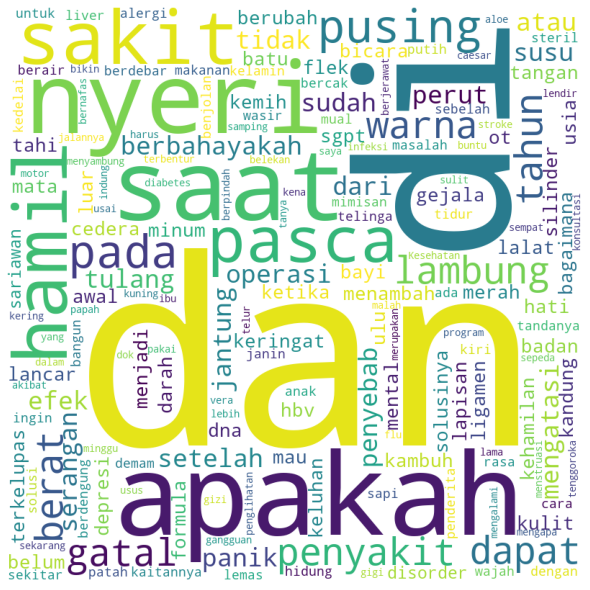

DPR Worse


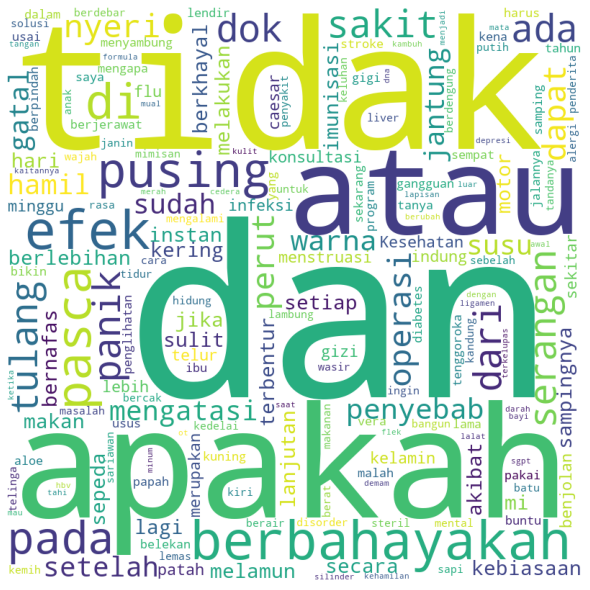

In [517]:
#title
print("DPR Better")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(titles))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

print("DPR Worse")
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(" ".join(neg_titles))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

### Unknown Words Analysis

#### DPR Better

In [518]:
unknown_words_text = defaultdict(int)
unknown_words_text_lst = []
unknown_words_title = defaultdict(int)
unknown_words_title_lst = []
pbar = tqdm(total=len(list(question_map.keys())), desc=f"Tokenizing")
for title, text in zip(titles, texts):
    tokenized_title = tokenizer.tokenize(title, max_length=512, truncation=True)
    tokenized_text = tokenizer.tokenize(text, max_length=512, truncation=True)
    unknown_words_text, unknown_words_text_lst = update_unknown_frequency(unknown_words_text, tokenized_text, unknown_words_text_lst)
    unknown_words_title, unknown_words_title_lst = update_unknown_frequency(unknown_words_title, tokenized_title, unknown_words_title_lst)
    pbar.update(1)

Tokenizing:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 37/45 [00:22<00:04,  1.67it/s]


In [519]:
unknown_words_text_lst

['nunjuk',
 'merengeknya',
 'suru',
 'bertamba',
 'usahain',
 'komsusi',
 'mhswi',
 'smst',
 'poltekkes',
 'sembuhnya',
 'cukuran',
 'nyut',
 'nyutan',
 'nyut',
 'nyutannya',
 'terasanya',
 'ligamen',
 'ligamen',
 'barusaja',
 '2tahun',
 'hbv',
 'detected',
 'sgpt',
 'pertannyaanya',
 'gizinya',
 'tercukupi',
 'dibotol',
 'dianya',
 'sepatah',
 'larian',
 'mejanya',
 'mengejarnya',
 'disorder',
 'ousing',
 'atensinya',
 'pnyakit',
 'mimisan',
 'mimisan',
 'spertinya',
 'megalir',
 'bbrapa',
 'mimisan',
 'berdenging',
 'dokternya',
 'cutton',
 'buds',
 'kotorannya',
 'dengung',
 'ingus',
 'diwajah',
 'panu',
 'hipoalergenik',
 'nyembuhin',
 'linu',
 'belekan',
 'belekannya',
 'pengelihatan',
 'menyembuhannya',
 'ditenggorokan',
 'tenggorokanku',
 'kreatinin',
 'mmol',
 'kalum',
 'mmol',
 'ureum',
 'pipisnya',
 'panic',
 'ketka',
 'panic',
 'aloe',
 'aloe',
 'kesebelah',
 'nyalur',
 'vegeta',
 'trz',
 'tpii',
 'lebam',
 'kebentur',
 'lebam',
 'menuruni',
 'sutomo',
 'menggemukkan',
 'gem

In [520]:
unknown_words_title_lst

['berbahayakah',
 'hbv',
 'sgpt',
 'disorder',
 'mimisan',
 'berdengung',
 'tenggoroka',
 'papah',
 'aloe',
 'berbahayakah',
 'indung']

#### DPR worse

In [521]:
unknown_words_text = defaultdict(int)
unknown_words_text_lst = []
unknown_words_title = defaultdict(int)
unknown_words_title_lst = []
pbar = tqdm(total=len(list(question_map.keys())), desc=f"Tokenizing")
for title, text in zip(neg_titles, neg_texts):
    tokenized_title = tokenizer.tokenize(title, max_length=512, truncation=True)
    tokenized_text = tokenizer.tokenize(text, max_length=512, truncation=True)
    unknown_words_text, unknown_words_text_lst = update_unknown_frequency(unknown_words_text, tokenized_text, unknown_words_text_lst)
    unknown_words_title, unknown_words_title_lst = update_unknown_frequency(unknown_words_title, tokenized_title, unknown_words_title_lst)
    pbar.update(1)


Tokenizing:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 42/45 [00:01<00:00, 37.29it/s]


In [522]:
unknown_words_text_lst

['maladaptive',
 'daydreaming',
 'reflek',
 'maladaptive',
 'daydreaming',
 'perantau',
 'lebam',
 'kebentur',
 'lebam',
 'menuruni',
 'cemaskan',
 'meriang',
 'ekg',
 'sekarangpun',
 'pereda',
 'dipangkal',
 'mengganjal',
 'meraskan',
 'denyutan',
 'denyutan',
 'panic',
 'nemenukan',
 'psikosomatik',
 'sutomo',
 'menggemukkan',
 'gemuknya',
 'minggy',
 'indung',
 'irsan',
 '24th',
 'batuknya',
 'trz',
 'tpii',
 'linu',
 'aloe',
 'aloe',
 'belekan',
 'belekannya',
 'pengelihatan',
 'menyembuhannya',
 'ditenggorokan',
 'tenggorokanku',
 'kreatinin',
 'mmol',
 'kalum',
 'mmol',
 'ureum',
 'pipisnya',
 'kesebelah',
 'nyalur',
 'vegeta',
 'panic',
 'ketka',
 'panic',
 'ingus',
 'diwajah',
 'panu',
 'hipoalergenik',
 'nyembuhin',
 'berdenging',
 'dokternya',
 'cutton',
 'buds',
 'kotorannya',
 'dengung',
 'atensinya',
 'pnyakit',
 'mimisan',
 'mimisan',
 'spertinya',
 'megalir',
 'bbrapa',
 'mimisan',
 'barusaja',
 'dianya',
 'sepatah',
 'larian',
 'mejanya',
 'mengejarnya',
 'disorder',
 '

In [523]:
unknown_words_title_lst

['melamun',
 'berkhayal',
 'berbahayakah',
 'berbahayakah',
 'indung',
 'aloe',
 'tenggoroka',
 'papah',
 'berdengung',
 'mimisan',
 'disorder',
 'hbv',
 'sgpt',
 'berbahayakah']

### IDF Analysis

#### DPR Better

In [536]:
avg_title, avg_text = 0.0, 0.0
better_titles = []
better_texts = []
for title, text in zip(titles, texts):
    cur_title, cur_text = get_avg_idf_value(title, text)
    better_titles.append(cur_title)
    better_texts.append(cur_text)
    avg_title += cur_title
    avg_text += cur_text
print(f"Average idf for title: {avg_title/len(titles)}")
print(f"Average idf for text: {avg_text/len(texts)}")

Average idf for title: 5.095637652094375
Average idf for text: 0.43394096121993997


#### DPR Worse

In [537]:
avg_title, avg_text = 0.0, 0.0
worse_titles = []
worse_texts = []
for title, text in zip(neg_titles, neg_texts):
    cur_title, cur_text = get_avg_idf_value(title, text)
    worse_titles.append(cur_title)
    worse_texts.append(cur_text)
    avg_title += cur_title
    avg_text += cur_text
print(f"Average idf for title: {avg_title/len(titles)}")
print(f"Average idf for text: {avg_text/len(texts)}")

Average idf for title: 5.143607711546205
Average idf for text: 0.4375723565887705


In [538]:
print(ttest_ind(better_titles, worse_titles).pvalue <= 0.05)
print(ttest_ind(better_texts, worse_texts).pvalue <= 0.05)

False
False


In [539]:
better_idfs = better_texts + better_titles
worse_idfs = worse_texts + worse_titles

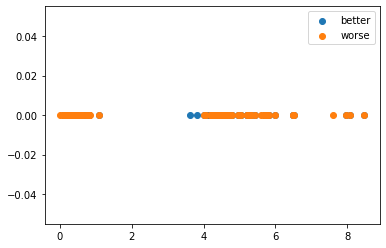

In [542]:
plt.scatter(better_idfs, [0]*len(better_idfs), label='better')
plt.scatter(worse_idfs, [0]*len(worse_idfs), label='worse')
plt.legend()
plt.show()

In [543]:
median(better_idfs)

2.3496302918627645

In [544]:
median(worse_idfs)

2.5438315818429613

In [545]:
print(ttest_ind(better_idfs, worse_idfs).pvalue <= 0.05)

False


Some findings:
- Same phenomenon occured on tf-idf
- The hybrid model of tfidf-dpr is actually less stable than the tf-idf
- However idf analysis for the text shows that DPR can be better when the query is more specific although the difference is insignificant(?)

# B.  MFAQ Data

In [527]:
actual_data = []

with open('../Results/syifa_results_full_mfaq.json', 'r') as actual_out:
    actual_data = json.load(actual_out)



In [528]:
text_error = []
i = 0
for row in actual_data:
    row_text_error = []
    for row_ctx in row['ctxs']:
        if row_ctx['id'] in neg_ids[i]:
            row_text_error.append({'id': row_ctx['id'], 'title': row_ctx['title'], 'text': row_ctx['text']})
    text_error.append(row_text_error)
    i+=1

In [529]:
for i in range(len(text_error)):
    print("Question")
    print(f"text: {actual_data[i]['question']['text']}")
    print(f"title: {actual_data[i]['question']['title']}")
    print("Similar Questions")
    print(text_error[i])
    print()
    print()

Question
text: malam dok , sejak 2 hari yang lalu badan saya pusing dan lemas hari ini hidung saya mengeluarkan ingus terus menerus , bagaimana cara mengatasi nya ya dok ? terima kasih sebelumnya
title: cara mengatasi pusing , lemas dan hidung berair
Similar Questions
[]


Question
text: selamat pagi dok , saya mau tanya kenapa telinga saya berdenging terus ya dok sudah 6 hari , saya juga sudah ke puskesmas untuk di periksa , kata dokternya telinganya kotor karena di bersihkan dengan cutton buds jadi kotorannya terdorong hingga menutupi gendang telinga , dan saya sudah dikasih obat tetes untuk menghilangkan kotoran , tetapi dengung di telinga saya tidak berkurang sama sekali dok , saran dari dokter seperti apa ?
title: telinga berdengung sebelah kiri
Similar Questions
[]


Question
text: sore dok . . maaf dok saya sudah 4 hari mengalami benjolan di daerah kemaluan mula-mula benjolan tersebut kecil dan sekarang membesar lalu pecah dok . . rasanya linu dan sakit jika malam hari . . kira-

## Unigram Analysis

In [530]:
n = len(text_error)

In [531]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/mk1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Question
{'aloe': 3, 'vera': 3, 'jerawat': 2, 'dok': 2, 'produk': 2, 'pakai': 1, 'bikin': 1, 'sore': 1, 'muka': 1, 'hasil': 1, 'milik': 1, 'kulit': 1, 'bersih': 1, 'tumbuh': 1, 'bahan': 1, 'alami': 1, 'tentu': 1, 'cantik': 1, 'cocok': 1, 'kondisi': 1, 'mohon': 1, 'cerah': 1, 'terima': 1, 'kasih': 1}


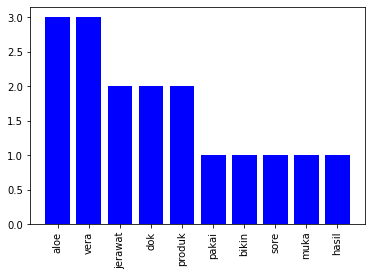

Similar Questions
{'muka': 4, 'dok': 3, 'putih': 3, 'produk': 2, 'kulit': 2, 'bersih': 2, 'ya': 2, 'pakai': 2, 'pilih': 1, 'cantik': 1, 'sore': 1, 'itu': 1, 'jenis': 1, 'kelupas': 1, 'wajah': 1, 'mutih': 1, 'sendri': 1, 'prodak': 1, 'pucat': 1, 'cocok': 1}


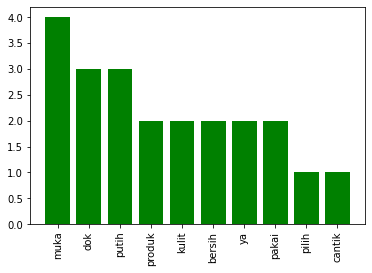



Question
{'bahaya': 2, 'makan': 2, 'mi': 2, 'instan': 2, 'dok': 2, 'terkadang': 1, 'konsumsi': 1, 'hari': 1, 'kali': 1, 'maklum': 1, 'anak': 1, 'kost': 1, 'rantau': 1, 'seberang': 1}


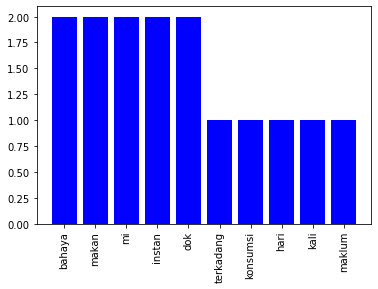

Similar Questions
{'asam': 3, 'lambung': 3, 'makan': 2, 'mie': 2, 'pendrita': 2, 'derita': 1, 'instan': 1, 'dok': 1, 'intsan': 1, 'buah': 1, 'buku': 1, 'trimaksh': 1}


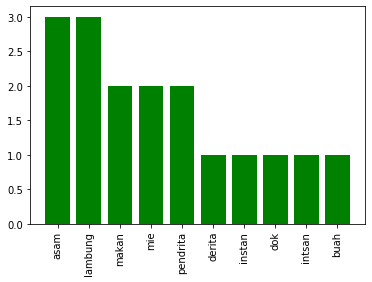



Question
{'keringat': 3, 'dok': 2, 'sakit': 1, 'sengaja': 1, 'mati': 1, 'ac': 1, 'ruang': 1, 'kerja': 1, 'batuk': 1, 'demam': 1, 'bareng': 1, 'minum': 1, 'sehat': 1}


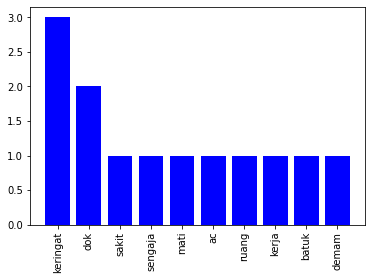

Similar Questions
{'minum': 5, 'bak': 4, 'dok': 4, 'air': 3, 'makan': 3, 'sengaja': 2, 'putih': 2, 'ddok': 1, 'ya': 1, 'bab': 1, 'keras': 1, 'hari': 1, 'konsumsi': 1, 'gelas': 1, 'disran': 1, 'dokter': 1, 'semanjak': 1, 'terapi': 1, 'seriing': 1, 'jarak': 1, 'wak': 1, 'menit': 1, 'alu': 1, 'wc': 1, 'gejala': 1, 'diabetes': 1, 'haus': 1, 'segi': 1, 'umur': 1, 'thnun': 1, 'alami': 1, 'normal': 1, 'mohon': 1, 'bantu': 1, 'kasih': 1, 'judul': 1, 'biar': 1, 'bingung': 1, 'cari': 1, 'dijawb': 1, 'maksih': 1}


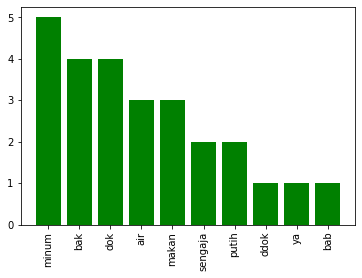



Question
{'perut': 3, 'langsung': 3, 'jahit': 3, 'nyeri': 2, 'operasi': 2, 'caesar': 2, 'dok': 2, 'ya': 2, 'pasca': 1, 'hallo': 1, 'habis': 1, 'trz': 1, 'steril': 1, 'tpii': 1, 'pas': 1, 'alami': 1, 'panas': 1, 'dingin': 1, 'takut': 1, 'masalah': 1, 'lahir': 1, 'beraktifitas': 1, 'biar': 1, 'kaku': 1, 'cepat': 1, 'sembuh': 1}


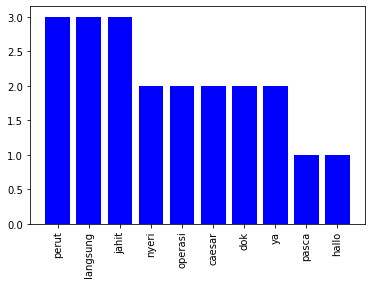

Similar Questions
{'jahit': 6, 'kering': 4, 'nya': 3, 'dok': 2, 'minggu': 2, 'lahir': 2, 'cepat': 2, 'cair': 2, 'nang': 1, 'luka': 1, 'bekas': 1, 'hallo': 1, 'pasca': 1, 'normal': 1, 'laku': 1, 'obat': 1, 'antiseptik': 1, 'bethadin': 1, 'campur': 1, 'air': 1, 'basuh': 1, 'vagina': 1, 'aman': 1, 'mkasiih': 1}


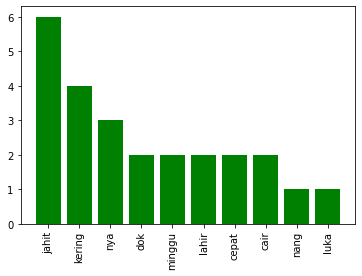



Question
{'susu': 4, 'alergi': 3, 'sapi': 3, 'anak': 3, 'solusi': 2, 'kedelai': 2, 'kasih': 2, 'malam': 1, 'dok': 1, 'umur': 1, 'asi': 1, 'macet': 1, 'hipoalergenik': 1, 'obat': 1, 'ampuh': 1, 'nyembuhin': 1, 'nya': 1, 'kah': 1, 'minum': 1, 'terima': 1}


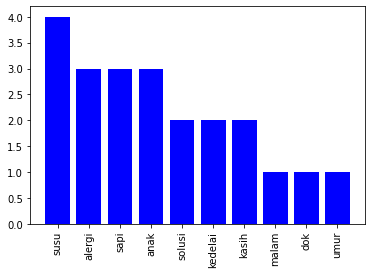

Similar Questions
{'susu': 7, 'alergi': 6, 'konsumsi': 4, 'mao': 3, 'khusus': 3, 'siang': 2, 'dok': 2, 'pas': 2, 'umur': 2, 'anak': 2, 'protein': 2, 'sapi': 2, 'saran': 2, 'dokter': 2, 'meberikan': 2, 'bmt': 2, 'kasih': 2, 'php': 1, 'lahir': 1, 'morniaga': 1, 'lanjut': 1, 'tahap': 1, 'sufor': 1, 'muncul': 1, 'terima': 1}


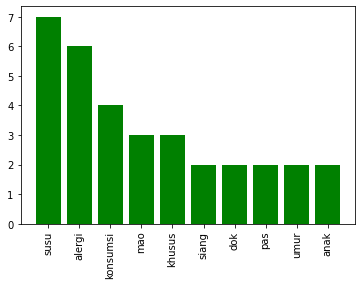



Question
{'cedera': 4, 'ligamen': 3, 'sebab': 1, 'bentur': 1, 'celaka': 1, 'olahraga': 1, 'berat': 1, 'ya': 1, 'dok': 1, 'penasaran': 1, 'cegah': 1, 'tubuh': 1, 'fit': 1, 'deteksi': 1}


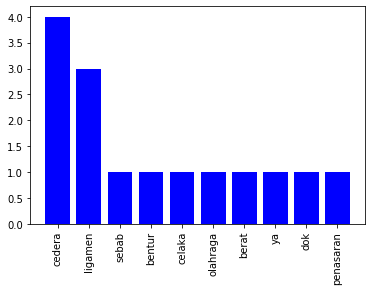

Similar Questions
{'lutut': 10, 'cedera': 7, 'kepala': 7, 'bentur': 4, 'rontgen': 4, 'sembuh': 4, 'usia': 3, 'dok': 3, 'bagi': 2, 'kening': 2, 'jahit': 2, 'otak': 2, 'serap': 2, 'informasi': 2, 'jatuh': 2, 'main': 2, 'bola': 2, 'bunyi': 2, 'klak': 2, 'total': 2, 'stabil': 2, 'ya': 2, 'peleset': 1, 'ujung': 1, 'tembok': 1, 'luka': 1, 'bawa': 1, 'rumah': 1, 'sakit': 1, 'orang': 1, 'tua': 1, 'kondisi': 1, 'badan': 1, 'lemah': 1, 'rasa': 1, 'keluh': 1, 'turun': 1, 'konsentrasi': 1, 'cepat': 1, 'unggul': 1, 'sekolah': 1, 'belakang': 1, 'lambat': 1, 'bahaya': 1, 'apa': 1, 'akibat': 1, 'spa': 1, 'alami': 1, 'hubunganya': 1, 'marena': 1, 'baca': 1, 'artikel': 1, 'paham': 1, 'terima': 1, 'kasih': 1}


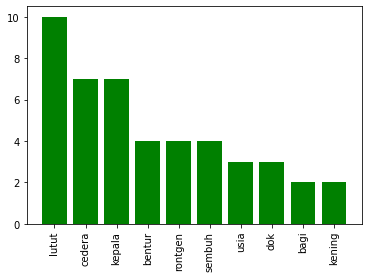

In [532]:
import matplotlib.pyplot as plt

for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(1, full_query)
    
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(1, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Unigram Overlap

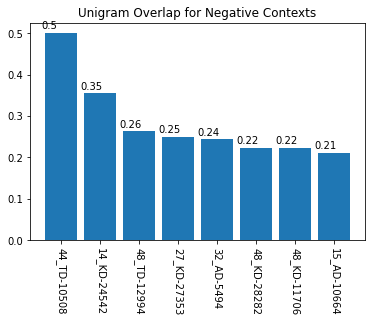

In [533]:
unigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(1, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(1, full_passage)
        unigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
unigram_overlap = dict(sorted(unigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(unigram_overlap.keys()), list(unigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Unigram Overlap for Negative Contexts")
for i, v in enumerate(list(unigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.01, str(round(v, 2)))
plt.show()

## Bigram Analysis

Question
{'aloe vera': 3, 'pakai aloe': 1, 'vera malah': 1, 'malah bikin': 1, 'bikin jerawat': 1, 'jerawat mengapa': 1, 'mengapa sore': 1, 'sore dok': 1, 'dok saya': 1, 'saya guna': 1, 'guna produk': 1, 'produk aloe': 1, 'vera di': 1, 'di muka': 1, 'muka karena': 1, 'karena lihat': 1, 'lihat saya': 1, 'saya hasil': 1, 'hasil milik': 1, 'milik kulit': 1, 'kulit yang': 1, 'yang bersih': 1, 'bersih tetapi': 1, 'tetapi kenapa': 1, 'kenapa saya': 1, 'saya justru': 1, 'justru tumbuh': 1, 'tumbuh jerawat': 1, 'jerawat padahal': 1, 'padahal aloe': 1, 'vera masuk': 1, 'masuk bahan': 1, 'bahan alami': 1, 'alami lalu': 1, 'lalu bagaimana': 1, 'bagaimana cara': 1, 'cara tentu': 1, 'tentu produk': 1, 'produk cantik': 1, 'cantik yang': 1, 'yang cocok': 1, 'cocok dengan': 1, 'dengan kondisi': 1, 'kondisi saya': 1, 'saya dok': 1, 'dok mohon': 1, 'mohon cerah': 1, 'cerah terima': 1, 'terima kasih': 1}


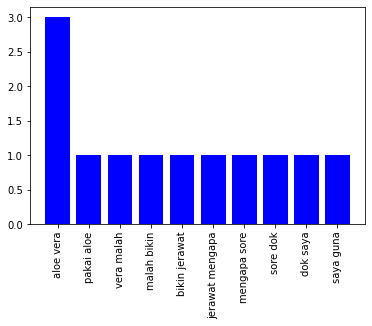

Similar Questions
{'saya itu': 4, 'muka saya': 4, 'saya ingin': 2, 'ingin muka': 2, 'putih bersih': 2, 'pilih produk': 1, 'produk cantik': 1, 'cantik yang': 1, 'yang tepat': 1, 'tepat sore': 1, 'sore dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya lagi': 1, 'lagi saya': 1, 'itu tidak': 1, 'tidak tahu': 1, 'tahu jenis': 1, 'jenis kulit': 1, 'kulit muka': 1, 'itu seperti': 1, 'seperti apa': 1, 'apa tetapi': 1, 'tetapi saya': 1, 'itu tampak': 1, 'tampak putih': 1, 'bersih tanpa': 1, 'tanpa harus': 1, 'harus ada': 1, 'ada kelupas': 1, 'kelupas kulit': 1, 'kulit wajah': 1, 'wajah baik': 1, 'baik ya': 1, 'ya untuk': 1, 'untuk mutih': 1, 'mutih itu': 1, 'itu sendri': 1, 'sendri harus': 1, 'harus pakai': 1, 'pakai prodak': 1, 'prodak apa': 1, 'apa ya': 1, 'ya dok': 1, 'dok karena': 1, 'karena saya': 1, 'itu lihat': 1, 'lihat putih': 1, 'bersih dan': 1, 'dan tidak': 1, 'tidak putih': 1, 'putih pucat': 1, 'pucat saya': 1, 'saya sendiri': 1, 'sendiri tidak': 1, 'tidak itu': 1, 'itu 

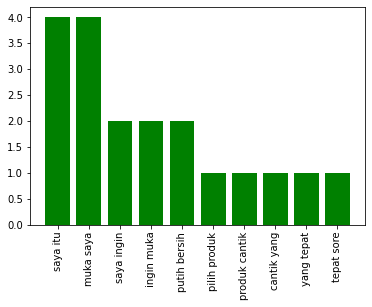



Question
{'makan mi': 2, 'mi instan': 2, 'tiap hari': 2, 'bahaya makan': 1, 'instan tiap': 1, 'hari dok': 1, 'dok bahaya': 1, 'bahaya tidak': 1, 'tidak saya': 1, 'saya selalu': 1, 'selalu makan': 1, 'instan hampir': 1, 'hampir tiap': 1, 'hari atau': 1, 'atau terkadang': 1, 'terkadang saya': 1, 'saya konsumsi': 1, 'konsumsi hari': 1, 'hari bisa': 1, 'bisa dua': 1, 'dua sampai': 1, 'sampai tiga': 1, 'tiga kali': 1, 'kali maklum': 1, 'maklum dok': 1, 'dok saya': 1, 'saya anak': 1, 'anak kost': 1, 'kost rantau': 1, 'rantau dari': 1, 'dari seberang': 1}


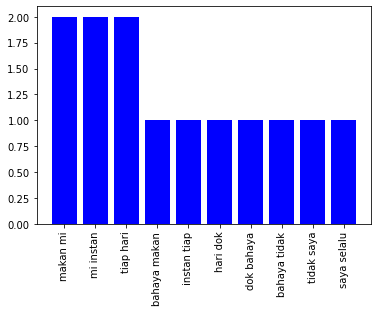

Similar Questions
{'asam lambung': 3, 'makan mie': 2, 'pendrita asam': 2, 'apakah boleh': 1, 'boleh derita': 1, 'derita asam': 1, 'lambung makan': 1, 'mie instan': 1, 'instan dok': 1, 'dok saya': 1, 'saya pendrita': 1, 'lambung boleh': 1, 'boleh apa': 1, 'apa tidak': 1, 'tidak makan': 1, 'mie intsan': 1, 'intsan dan': 1, 'dan buah': 1, 'buah apa': 1, 'apa yang': 1, 'yang buku': 1, 'buku buat': 1, 'buat pendrita': 1, 'lambung trimaksh': 1}


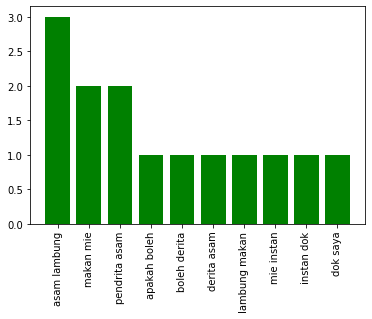



Question
{'keringat saat': 1, 'saat sakit': 1, 'sakit dok': 1, 'dok saya': 1, 'saya sengaja': 1, 'sengaja mati': 1, 'mati ac': 1, 'ac ruang': 1, 'ruang kerja': 1, 'kerja saya': 1, 'saya karena': 1, 'karena saya': 1, 'saya sedang': 1, 'sedang batuk': 1, 'batuk dan': 1, 'dan demam': 1, 'demam keringat': 1, 'keringat keluar': 1, 'keluar banyak': 1, 'banyak bareng': 1, 'bareng dengan': 1, 'dengan banyak': 1, 'banyak minum': 1, 'minum sambil': 1, 'sambil kerja': 1, 'kerja apakah': 1, 'apakah keringat': 1, 'keringat ini': 1, 'ini sehat': 1, 'sehat dok': 1}


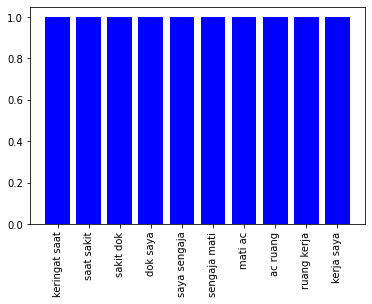

Similar Questions
{'banyak minum': 3, 'saya memang': 3, 'minum dan': 2, 'dan bak': 2, 'air putih': 2, 'saya tidak': 2, 'makan saya': 2, 'memang banyak': 2, 'bak ddok': 1, 'ddok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya kenapa': 1, 'kenapa ya': 1, 'ya saya': 1, 'saya sering': 1, 'sering bak': 1, 'bak saya': 1, 'memang sengaja': 1, 'sengaja banyak': 1, 'minum air': 1, 'putih agar': 1, 'agar bab': 1, 'bab saya': 1, 'tidak keras': 1, 'keras dalam': 1, 'dalam hari': 1, 'hari saya': 1, 'saya konsumsi': 1, 'konsumsi air': 1, 'putih kurang': 1, 'kurang lebih': 1, 'lebih gelas': 1, 'gelas itu': 1, 'itu yang': 1, 'yang disran': 1, 'disran oleh': 1, 'oleh dokter': 1, 'dokter kepada': 1, 'kepada saya': 1, 'saya semanjak': 1, 'semanjak terapi': 1, 'terapi air': 1, 'air ini': 1, 'ini saya': 1, 'saya seriing': 1, 'seriing bak': 1, 'bak jarak': 1, 'jarak wak': 1, 'wak itu': 1, 'itu hanya': 1, 'hanya menit': 1, 'menit alu': 1, 'alu ke': 1, 'ke wc': 1, 'wc apakah': 1, 'apakah ini': 1, 'ini masuk':

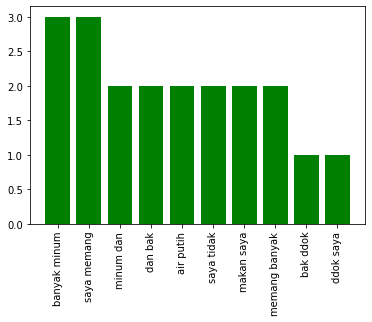



Question
{'operasi caesar': 2, 'nyeri perut': 1, 'perut pasca': 1, 'pasca operasi': 1, 'caesar hallo': 1, 'hallo dok': 1, 'dok langsung': 1, 'langsung saja': 1, 'saja ya': 1, 'ya saya': 1, 'saya bulan': 1, 'bulan yang': 1, 'yang lalu': 1, 'lalu habis': 1, 'habis operasi': 1, 'caesar trz': 1, 'trz langsung': 1, 'langsung steril': 1, 'steril tpii': 1, 'tpii sudah': 1, 'sudah berapa': 1, 'berapa hari': 1, 'hari ini': 1, 'ini perut': 1, 'perut saya': 1, 'saya asa': 1, 'asa nyeri': 1, 'nyeri utama': 1, 'utama perut': 1, 'perut bagi': 1, 'bagi bawah': 1, 'bawah pas': 1, 'pas jahit': 1, 'jahit sampai': 1, 'sampai saya': 1, 'saya alami': 1, 'alami panas': 1, 'panas dingin': 1, 'dingin itu': 1, 'itu kenapa': 1, 'kenapa ya': 1, 'ya dok': 1, 'dok saya': 1, 'saya takut': 1, 'takut kalau': 1, 'kalau jahit': 1, 'jahit saya': 1, 'saya masalah': 1, 'masalah karena': 1, 'karena telah': 1, 'telah lahir': 1, 'lahir langsung': 1, 'langsung beraktifitas': 1, 'beraktifitas seperti': 1, 'seperti biasa': 1,

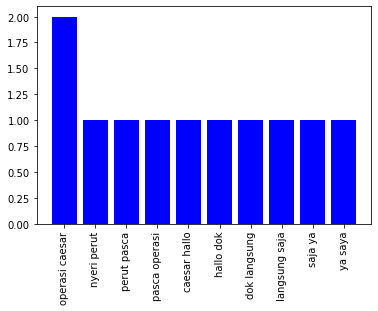

Similar Questions
{'cepat kering': 2, 'nang luka': 1, 'luka bekas': 1, 'bekas jahit': 1, 'jahit hallo': 1, 'hallo dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya biasa': 1, 'biasa nya': 1, 'nya berapa': 1, 'berapa minggu': 1, 'minggu jahit': 1, 'jahit lahir': 1, 'lahir baru': 1, 'baru kering': 1, 'kering soal': 1, 'soal lebih': 1, 'lebih minggu': 1, 'minggu saya': 1, 'saya pasca': 1, 'pasca lahir': 1, 'lahir normal': 1, 'normal jahit': 1, 'jahit nya': 1, 'nya belum': 1, 'belum kering': 1, 'kering juga': 1, 'juga apa': 1, 'apa yang': 1, 'yang harus': 1, 'harus saya': 1, 'saya laku': 1, 'laku agar': 1, 'agar jahit': 1, 'jahit cepat': 1, 'kering dan': 1, 'dan apa': 1, 'apa ada': 1, 'ada obat': 1, 'obat atau': 1, 'atau cair': 1, 'cair antiseptik': 1, 'antiseptik yang': 1, 'yang bisa': 1, 'bisa cepat': 1, 'kering nya': 1, 'nya jahit': 1, 'jahit lagi': 1, 'lagi dok': 1, 'dok apakah': 1, 'apakah cair': 1, 'cair bethadin': 1, 'bethadin yang': 1, 'yang campur': 1, 'campur dengan':

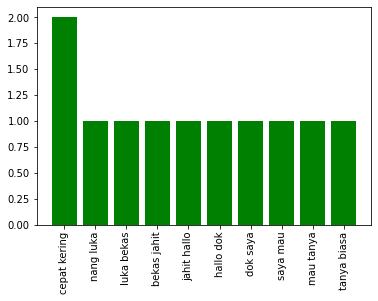



Question
{'susu sapi': 3, 'alergi susu': 2, 'sapi dan': 2, 'dan kedelai': 2, 'anak saya': 2, 'solusi alergi': 1, 'kedelai pada': 1, 'pada anak': 1, 'anak malam': 1, 'malam dok': 1, 'dok anak': 1, 'saya umur': 1, 'umur bulan': 1, 'bulan alergi': 1, 'kedelai juga': 1, 'juga karena': 1, 'karena asi': 1, 'asi saya': 1, 'saya macet': 1, 'macet sudah': 1, 'sudah bulan': 1, 'bulan di': 1, 'di kasih': 1, 'kasih susu': 1, 'susu hipoalergenik': 1, 'hipoalergenik terus': 1, 'terus apa': 1, 'apa ada': 1, 'ada obat': 1, 'obat yang': 1, 'yang ampuh': 1, 'ampuh buat': 1, 'buat nyembuhin': 1, 'nyembuhin alergi': 1, 'alergi nya': 1, 'nya atau': 1, 'atau ada': 1, 'ada kah': 1, 'kah solusi': 1, 'solusi yang': 1, 'yang baik': 1, 'baik agar': 1, 'agar anak': 1, 'saya bisa': 1, 'bisa minum': 1, 'minum susu': 1, 'sapi lagi': 1, 'lagi terima': 1, 'terima kasih': 1}


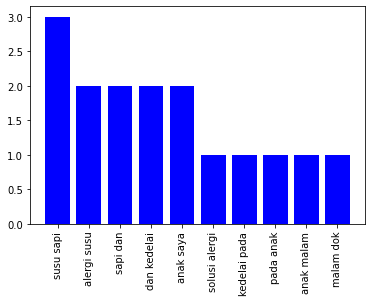

Similar Questions
{'saya mao': 3, 'mao tanya': 3, 'susu khusus': 3, 'khusus alergi': 3, 'siang dok': 2, 'dok saya': 2, 'tanya pas': 2, 'pas umur': 2, 'umur anak': 2, 'anak saya': 2, 'saya bulan': 2, 'bulan dia': 2, 'dia alergi': 2, 'alergi protein': 2, 'protein susu': 2, 'susu sapi': 2, 'sapi saran': 2, 'saran dokter': 2, 'dokter untuk': 2, 'untuk konsumsi': 2, 'konsumsi susu': 2, 'alergi saya': 2, 'saya meberikan': 2, 'meberikan siang': 1, 'meberikan bmt': 1, 'bmt php': 1, 'php karena': 1, 'karena pertama': 1, 'pertama lahir': 1, 'lahir sudah': 1, 'sudah kasih': 1, 'kasih susu': 1, 'susu morniaga': 1, 'morniaga bmt': 1, 'bmt yang': 1, 'yang saya': 1, 'tanya apakah': 1, 'apakah untuk': 1, 'untuk susu': 1, 'susu lanjut': 1, 'lanjut tahap': 1, 'tahap harus': 1, 'harus konsumsi': 1, 'konsumsi yang': 1, 'yang susu': 1, 'alergi lagi': 1, 'lagi atau': 1, 'atau sudah': 1, 'sudah boleh': 1, 'boleh konsumsi': 1, 'konsumsi sufor': 1, 'sufor biasa': 1, 'biasa karena': 1, 'karena alergi': 1, 'aler

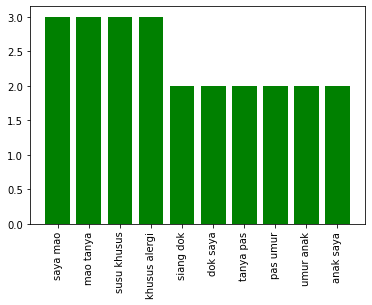



Question
{'cedera ligamen': 3, 'ligamen saya': 1, 'saya ingin': 1, 'ingin tanya': 1, 'tanya soal': 1, 'soal cedera': 1, 'ligamen itu': 1, 'itu kan': 1, 'kan sebab': 1, 'sebab karena': 1, 'karena bentur': 1, 'bentur celaka': 1, 'celaka atau': 1, 'atau olahraga': 1, 'olahraga berat': 1, 'berat ya': 1, 'ya dok': 1, 'dok saya': 1, 'saya penasaran': 1, 'penasaran apakah': 1, 'apakah cedera': 1, 'cedera seperti': 1, 'seperti itu': 1, 'itu bisa': 1, 'bisa cegah': 1, 'cegah atau': 1, 'atau bisa': 1, 'bisa tahu': 1, 'tahu belum': 1, 'belum seperti': 1, 'seperti tubuh': 1, 'tubuh tidak': 1, 'tidak fit': 1, 'fit bisa': 1, 'bisa cedera': 1, 'ligamen atau': 1, 'atau bagaimana': 1, 'bagaimana apa': 1, 'apa bisa': 1, 'bisa deteksi': 1, 'deteksi belum': 1}


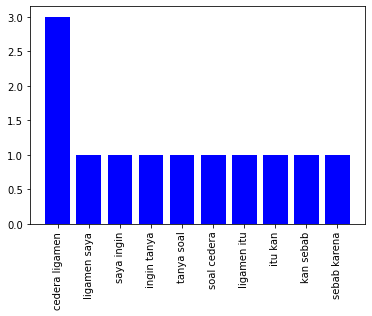

Similar Questions
{'lutut saya': 10, 'laku rontgen': 4, 'dengan lutut': 4, 'saya tahun': 3, 'saya masih': 3, 'tentang cedera': 2, 'cedera kepala': 2, 'kepala saya': 2, 'tahu lebih': 2, 'kepala waktu': 2, 'waktu saya': 2, 'usia tahun': 2, 'dapat jahit': 2, 'apa perlu': 2, 'perlu laku': 2, 'saya mulai': 2, 'serap tiap': 2, 'tiap informasi': 2, 'bentur di': 2, 'di kepala': 2, 'kepala itu': 2, 'kecil apa': 2, 'cedera lutut': 2, 'saya ada': 2, 'ada masalah': 2, 'masalah dengan': 2, 'tahun yang': 2, 'yang lalu': 2, 'lalu saya': 2, 'saya jatuh': 2, 'jatuh saat': 2, 'saat main': 2, 'main bola': 2, 'bola dan': 2, 'dan lutut': 2, 'saya sampai': 2, 'sampai bunyi': 2, 'bunyi klak': 2, 'klak waktu': 2, 'waktu itu': 2, 'itu saya': 2, 'saya kira': 2, 'kira hanya': 2, 'hanya cedera': 2, 'cedera biasa': 2, 'biasa yang': 2, 'yang sembuh': 2, 'sembuh sendiri': 2, 'sendiri tetapi': 2, 'tetapi sampai': 2, 'sampai sekarang': 2, 'sekarang belum': 2, 'belum sembuh': 2, 'sembuh total': 2, 'total lutut': 2, 'ma

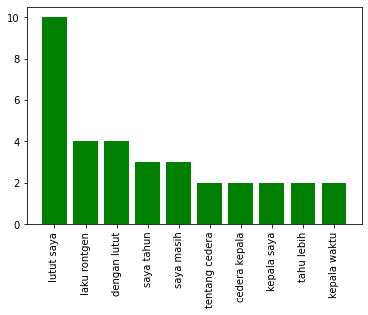

In [534]:
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(2, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(2, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Bigram Overlap

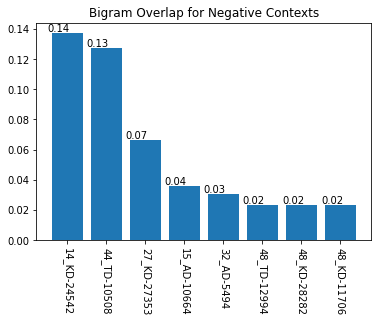

In [535]:
bigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(2, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(2, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
bigram_overlap = dict(sorted(bigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(bigram_overlap.keys()), list(bigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Bigram Overlap for Negative Contexts")
for i, v in enumerate(list(bigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Trigram Analysis

Question
{'pakai aloe vera': 1, 'aloe vera malah': 1, 'vera malah bikin': 1, 'malah bikin jerawat': 1, 'bikin jerawat mengapa': 1, 'jerawat mengapa sore': 1, 'mengapa sore dok': 1, 'sore dok saya': 1, 'dok saya guna': 1, 'saya guna produk': 1, 'guna produk aloe': 1, 'produk aloe vera': 1, 'aloe vera di': 1, 'vera di muka': 1, 'di muka karena': 1, 'muka karena lihat': 1, 'karena lihat saya': 1, 'lihat saya hasil': 1, 'saya hasil milik': 1, 'hasil milik kulit': 1, 'milik kulit yang': 1, 'kulit yang bersih': 1, 'yang bersih tetapi': 1, 'bersih tetapi kenapa': 1, 'tetapi kenapa saya': 1, 'kenapa saya justru': 1, 'saya justru tumbuh': 1, 'justru tumbuh jerawat': 1, 'tumbuh jerawat padahal': 1, 'jerawat padahal aloe': 1, 'padahal aloe vera': 1, 'aloe vera masuk': 1, 'vera masuk bahan': 1, 'masuk bahan alami': 1, 'bahan alami lalu': 1, 'alami lalu bagaimana': 1, 'lalu bagaimana cara': 1, 'bagaimana cara tentu': 1, 'cara tentu produk': 1, 'tentu produk cantik': 1, 'produk cantik yang': 1, 'can

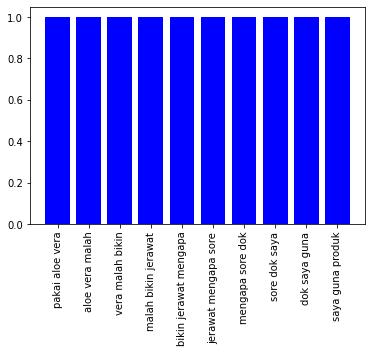

Similar Questions
{'muka saya itu': 3, 'saya ingin muka': 2, 'ingin muka saya': 2, 'pilih produk cantik': 1, 'produk cantik yang': 1, 'cantik yang tepat': 1, 'yang tepat sore': 1, 'tepat sore dok': 1, 'sore dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya lagi': 1, 'tanya lagi saya': 1, 'lagi saya itu': 1, 'saya itu tidak': 1, 'itu tidak tahu': 1, 'tidak tahu jenis': 1, 'tahu jenis kulit': 1, 'jenis kulit muka': 1, 'kulit muka saya': 1, 'saya itu seperti': 1, 'itu seperti apa': 1, 'seperti apa tetapi': 1, 'apa tetapi saya': 1, 'tetapi saya ingin': 1, 'saya itu tampak': 1, 'itu tampak putih': 1, 'tampak putih bersih': 1, 'putih bersih tanpa': 1, 'bersih tanpa harus': 1, 'tanpa harus ada': 1, 'harus ada kelupas': 1, 'ada kelupas kulit': 1, 'kelupas kulit wajah': 1, 'kulit wajah baik': 1, 'wajah baik ya': 1, 'baik ya untuk': 1, 'ya untuk mutih': 1, 'untuk mutih itu': 1, 'mutih itu sendri': 1, 'itu sendri harus': 1, 'sendri harus pakai': 1, 'harus pakai prodak': 1, 'pakai p

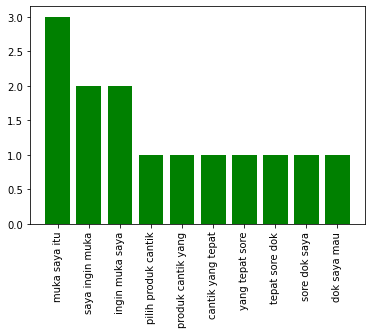



Question
{'makan mi instan': 2, 'bahaya makan mi': 1, 'mi instan tiap': 1, 'instan tiap hari': 1, 'tiap hari dok': 1, 'hari dok bahaya': 1, 'dok bahaya tidak': 1, 'bahaya tidak saya': 1, 'tidak saya selalu': 1, 'saya selalu makan': 1, 'selalu makan mi': 1, 'mi instan hampir': 1, 'instan hampir tiap': 1, 'hampir tiap hari': 1, 'tiap hari atau': 1, 'hari atau terkadang': 1, 'atau terkadang saya': 1, 'terkadang saya konsumsi': 1, 'saya konsumsi hari': 1, 'konsumsi hari bisa': 1, 'hari bisa dua': 1, 'bisa dua sampai': 1, 'dua sampai tiga': 1, 'sampai tiga kali': 1, 'tiga kali maklum': 1, 'kali maklum dok': 1, 'maklum dok saya': 1, 'dok saya anak': 1, 'saya anak kost': 1, 'anak kost rantau': 1, 'kost rantau dari': 1, 'rantau dari seberang': 1}


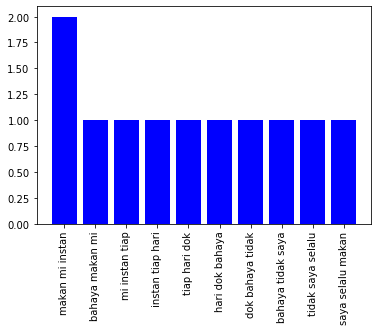

Similar Questions
{'pendrita asam lambung': 2, 'apakah boleh derita': 1, 'boleh derita asam': 1, 'derita asam lambung': 1, 'asam lambung makan': 1, 'lambung makan mie': 1, 'makan mie instan': 1, 'mie instan dok': 1, 'instan dok saya': 1, 'dok saya pendrita': 1, 'saya pendrita asam': 1, 'asam lambung boleh': 1, 'lambung boleh apa': 1, 'boleh apa tidak': 1, 'apa tidak makan': 1, 'tidak makan mie': 1, 'makan mie intsan': 1, 'mie intsan dan': 1, 'intsan dan buah': 1, 'dan buah apa': 1, 'buah apa yang': 1, 'apa yang buku': 1, 'yang buku buat': 1, 'buku buat pendrita': 1, 'buat pendrita asam': 1, 'asam lambung trimaksh': 1}


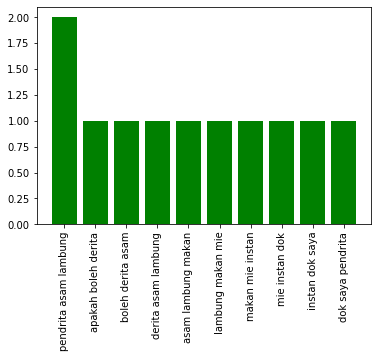



Question
{'keringat saat sakit': 1, 'saat sakit dok': 1, 'sakit dok saya': 1, 'dok saya sengaja': 1, 'saya sengaja mati': 1, 'sengaja mati ac': 1, 'mati ac ruang': 1, 'ac ruang kerja': 1, 'ruang kerja saya': 1, 'kerja saya karena': 1, 'saya karena saya': 1, 'karena saya sedang': 1, 'saya sedang batuk': 1, 'sedang batuk dan': 1, 'batuk dan demam': 1, 'dan demam keringat': 1, 'demam keringat keluar': 1, 'keringat keluar banyak': 1, 'keluar banyak bareng': 1, 'banyak bareng dengan': 1, 'bareng dengan banyak': 1, 'dengan banyak minum': 1, 'banyak minum sambil': 1, 'minum sambil kerja': 1, 'sambil kerja apakah': 1, 'kerja apakah keringat': 1, 'apakah keringat ini': 1, 'keringat ini sehat': 1, 'ini sehat dok': 1}


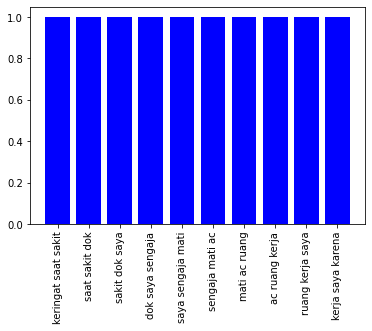

Similar Questions
{'banyak minum dan': 2, 'minum dan bak': 2, 'makan saya memang': 2, 'saya memang banyak': 2, 'dan bak ddok': 1, 'bak ddok saya': 1, 'ddok saya mau': 1, 'saya mau tanya': 1, 'mau tanya kenapa': 1, 'tanya kenapa ya': 1, 'kenapa ya saya': 1, 'ya saya sering': 1, 'saya sering bak': 1, 'sering bak saya': 1, 'bak saya memang': 1, 'saya memang sengaja': 1, 'memang sengaja banyak': 1, 'sengaja banyak minum': 1, 'banyak minum air': 1, 'minum air putih': 1, 'air putih agar': 1, 'putih agar bab': 1, 'agar bab saya': 1, 'bab saya tidak': 1, 'saya tidak keras': 1, 'tidak keras dalam': 1, 'keras dalam hari': 1, 'dalam hari saya': 1, 'hari saya konsumsi': 1, 'saya konsumsi air': 1, 'konsumsi air putih': 1, 'air putih kurang': 1, 'putih kurang lebih': 1, 'kurang lebih gelas': 1, 'lebih gelas itu': 1, 'gelas itu yang': 1, 'itu yang disran': 1, 'yang disran oleh': 1, 'disran oleh dokter': 1, 'oleh dokter kepada': 1, 'dokter kepada saya': 1, 'kepada saya semanjak': 1, 'saya semanjak ter

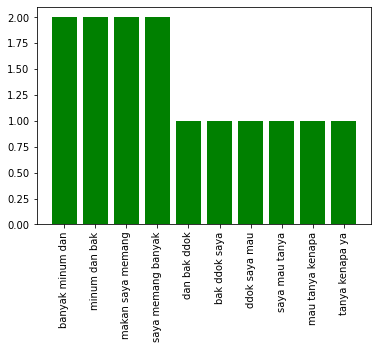



Question
{'nyeri perut pasca': 1, 'perut pasca operasi': 1, 'pasca operasi caesar': 1, 'operasi caesar hallo': 1, 'caesar hallo dok': 1, 'hallo dok langsung': 1, 'dok langsung saja': 1, 'langsung saja ya': 1, 'saja ya saya': 1, 'ya saya bulan': 1, 'saya bulan yang': 1, 'bulan yang lalu': 1, 'yang lalu habis': 1, 'lalu habis operasi': 1, 'habis operasi caesar': 1, 'operasi caesar trz': 1, 'caesar trz langsung': 1, 'trz langsung steril': 1, 'langsung steril tpii': 1, 'steril tpii sudah': 1, 'tpii sudah berapa': 1, 'sudah berapa hari': 1, 'berapa hari ini': 1, 'hari ini perut': 1, 'ini perut saya': 1, 'perut saya asa': 1, 'saya asa nyeri': 1, 'asa nyeri utama': 1, 'nyeri utama perut': 1, 'utama perut bagi': 1, 'perut bagi bawah': 1, 'bagi bawah pas': 1, 'bawah pas jahit': 1, 'pas jahit sampai': 1, 'jahit sampai saya': 1, 'sampai saya alami': 1, 'saya alami panas': 1, 'alami panas dingin': 1, 'panas dingin itu': 1, 'dingin itu kenapa': 1, 'itu kenapa ya': 1, 'kenapa ya dok': 1, 'ya dok s

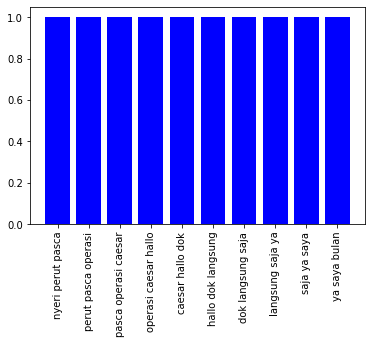

Similar Questions
{'nang luka bekas': 1, 'luka bekas jahit': 1, 'bekas jahit hallo': 1, 'jahit hallo dok': 1, 'hallo dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya biasa': 1, 'tanya biasa nya': 1, 'biasa nya berapa': 1, 'nya berapa minggu': 1, 'berapa minggu jahit': 1, 'minggu jahit lahir': 1, 'jahit lahir baru': 1, 'lahir baru kering': 1, 'baru kering soal': 1, 'kering soal lebih': 1, 'soal lebih minggu': 1, 'lebih minggu saya': 1, 'minggu saya pasca': 1, 'saya pasca lahir': 1, 'pasca lahir normal': 1, 'lahir normal jahit': 1, 'normal jahit nya': 1, 'jahit nya belum': 1, 'nya belum kering': 1, 'belum kering juga': 1, 'kering juga apa': 1, 'juga apa yang': 1, 'apa yang harus': 1, 'yang harus saya': 1, 'harus saya laku': 1, 'saya laku agar': 1, 'laku agar jahit': 1, 'agar jahit cepat': 1, 'jahit cepat kering': 1, 'cepat kering dan': 1, 'kering dan apa': 1, 'dan apa ada': 1, 'apa ada obat': 1, 'ada obat atau': 1, 'obat atau cair': 1, 'atau cair antiseptik': 1, 'cair ant

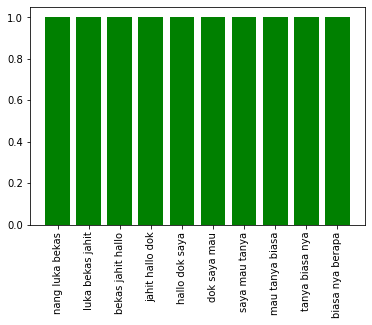



Question
{'alergi susu sapi': 2, 'susu sapi dan': 2, 'sapi dan kedelai': 2, 'solusi alergi susu': 1, 'dan kedelai pada': 1, 'kedelai pada anak': 1, 'pada anak malam': 1, 'anak malam dok': 1, 'malam dok anak': 1, 'dok anak saya': 1, 'anak saya umur': 1, 'saya umur bulan': 1, 'umur bulan alergi': 1, 'bulan alergi susu': 1, 'dan kedelai juga': 1, 'kedelai juga karena': 1, 'juga karena asi': 1, 'karena asi saya': 1, 'asi saya macet': 1, 'saya macet sudah': 1, 'macet sudah bulan': 1, 'sudah bulan di': 1, 'bulan di kasih': 1, 'di kasih susu': 1, 'kasih susu hipoalergenik': 1, 'susu hipoalergenik terus': 1, 'hipoalergenik terus apa': 1, 'terus apa ada': 1, 'apa ada obat': 1, 'ada obat yang': 1, 'obat yang ampuh': 1, 'yang ampuh buat': 1, 'ampuh buat nyembuhin': 1, 'buat nyembuhin alergi': 1, 'nyembuhin alergi nya': 1, 'alergi nya atau': 1, 'nya atau ada': 1, 'atau ada kah': 1, 'ada kah solusi': 1, 'kah solusi yang': 1, 'solusi yang baik': 1, 'yang baik agar': 1, 'baik agar anak': 1, 'agar a

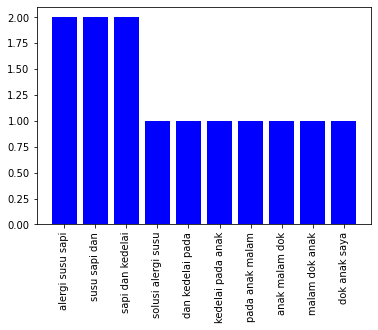

Similar Questions
{'saya mao tanya': 3, 'susu khusus alergi': 3, 'siang dok saya': 2, 'dok saya mao': 2, 'mao tanya pas': 2, 'tanya pas umur': 2, 'pas umur anak': 2, 'umur anak saya': 2, 'anak saya bulan': 2, 'saya bulan dia': 2, 'bulan dia alergi': 2, 'dia alergi protein': 2, 'alergi protein susu': 2, 'protein susu sapi': 2, 'susu sapi saran': 2, 'sapi saran dokter': 2, 'saran dokter untuk': 2, 'dokter untuk konsumsi': 2, 'untuk konsumsi susu': 2, 'konsumsi susu khusus': 2, 'khusus alergi saya': 2, 'alergi saya meberikan': 2, 'saya meberikan siang': 1, 'meberikan siang dok': 1, 'saya meberikan bmt': 1, 'meberikan bmt php': 1, 'bmt php karena': 1, 'php karena pertama': 1, 'karena pertama lahir': 1, 'pertama lahir sudah': 1, 'lahir sudah kasih': 1, 'sudah kasih susu': 1, 'kasih susu morniaga': 1, 'susu morniaga bmt': 1, 'morniaga bmt yang': 1, 'bmt yang saya': 1, 'yang saya mao': 1, 'mao tanya apakah': 1, 'tanya apakah untuk': 1, 'apakah untuk susu': 1, 'untuk susu lanjut': 1, 'susu lan

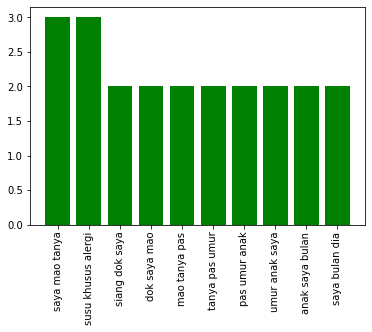



Question
{'cedera ligamen saya': 1, 'ligamen saya ingin': 1, 'saya ingin tanya': 1, 'ingin tanya soal': 1, 'tanya soal cedera': 1, 'soal cedera ligamen': 1, 'cedera ligamen itu': 1, 'ligamen itu kan': 1, 'itu kan sebab': 1, 'kan sebab karena': 1, 'sebab karena bentur': 1, 'karena bentur celaka': 1, 'bentur celaka atau': 1, 'celaka atau olahraga': 1, 'atau olahraga berat': 1, 'olahraga berat ya': 1, 'berat ya dok': 1, 'ya dok saya': 1, 'dok saya penasaran': 1, 'saya penasaran apakah': 1, 'penasaran apakah cedera': 1, 'apakah cedera seperti': 1, 'cedera seperti itu': 1, 'seperti itu bisa': 1, 'itu bisa cegah': 1, 'bisa cegah atau': 1, 'cegah atau bisa': 1, 'atau bisa tahu': 1, 'bisa tahu belum': 1, 'tahu belum seperti': 1, 'belum seperti tubuh': 1, 'seperti tubuh tidak': 1, 'tubuh tidak fit': 1, 'tidak fit bisa': 1, 'fit bisa cedera': 1, 'bisa cedera ligamen': 1, 'cedera ligamen atau': 1, 'ligamen atau bagaimana': 1, 'atau bagaimana apa': 1, 'bagaimana apa bisa': 1, 'apa bisa deteksi':

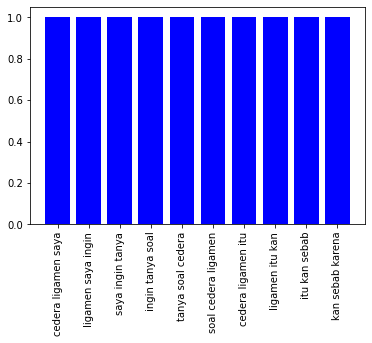

Similar Questions
{'dengan lutut saya': 4, 'kepala waktu saya': 2, 'perlu laku rontgen': 2, 'serap tiap informasi': 2, 'bentur di kepala': 2, 'cedera lutut saya': 2, 'lutut saya ada': 2, 'saya ada masalah': 2, 'ada masalah dengan': 2, 'masalah dengan lutut': 2, 'lutut saya tahun': 2, 'saya tahun yang': 2, 'tahun yang lalu': 2, 'yang lalu saya': 2, 'lalu saya jatuh': 2, 'saya jatuh saat': 2, 'jatuh saat main': 2, 'saat main bola': 2, 'main bola dan': 2, 'bola dan lutut': 2, 'dan lutut saya': 2, 'lutut saya sampai': 2, 'saya sampai bunyi': 2, 'sampai bunyi klak': 2, 'bunyi klak waktu': 2, 'klak waktu itu': 2, 'waktu itu saya': 2, 'itu saya kira': 2, 'saya kira hanya': 2, 'kira hanya cedera': 2, 'hanya cedera biasa': 2, 'cedera biasa yang': 2, 'biasa yang sembuh': 2, 'yang sembuh sendiri': 2, 'sembuh sendiri tetapi': 2, 'sendiri tetapi sampai': 2, 'tetapi sampai sekarang': 2, 'sampai sekarang belum': 2, 'sekarang belum sembuh': 2, 'belum sembuh total': 2, 'sembuh total lutut': 2, 'total l

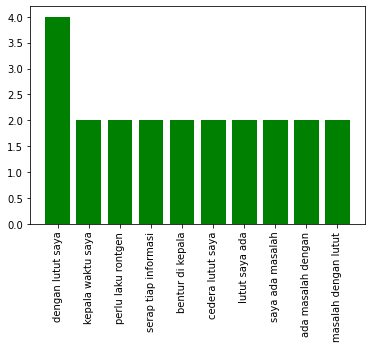

In [536]:
for i in range(len(text_error)):
    if len(text_error[i]) <= 0:
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(3, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(3, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Trigram Overlap

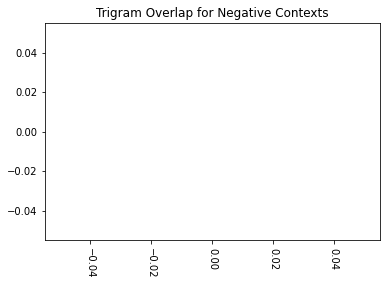

In [537]:
trigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(3, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(3, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
trigram_overlap = dict(sorted(trigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(trigram_overlap.keys()), list(trigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Trigram Overlap for Negative Contexts")
for i, v in enumerate(list(trigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Vector Embedding Projection

In [538]:
import pickle

In [539]:
#passage embedding load

passage_embeddings = dict()
with (open("../Dataset/Embeddings/passage_embeddings_syifa-mfaq_full.tsv", "rb")) as openfile:
    while True:
        try:
            passage_lst = pickle.load(openfile)
            for pid, p_vector in passage_lst:
                passage_embeddings[pid] = p_vector
        except EOFError:
            break


In [540]:
#question embedding load

query_embeddings = dict()
with (open("../Dataset/Embeddings/question_embeddings_syifa-mfaq_full.tsv", "rb")) as openfile:
    while True:
        try:
            query_lst = pickle.load(openfile)
            for qid, q_vector in query_lst:
                query_embeddings[qid] = q_vector
        except EOFError:
            break


/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


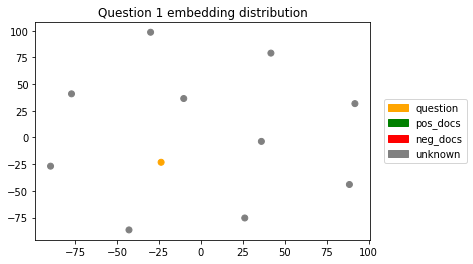

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


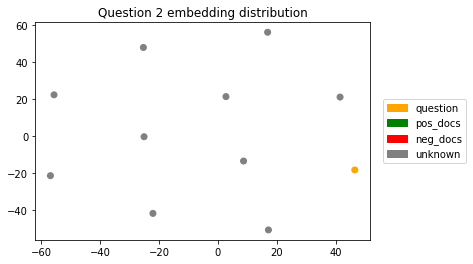

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


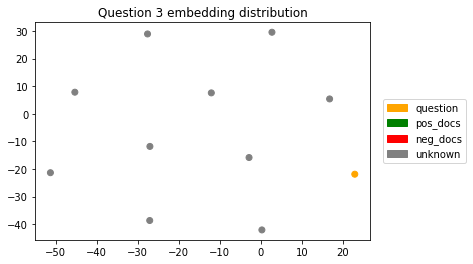

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


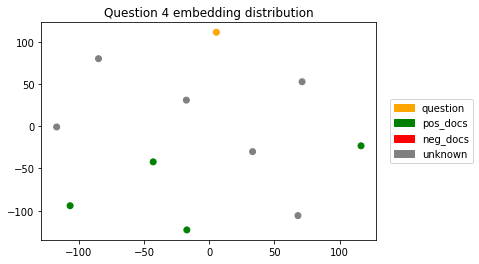

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


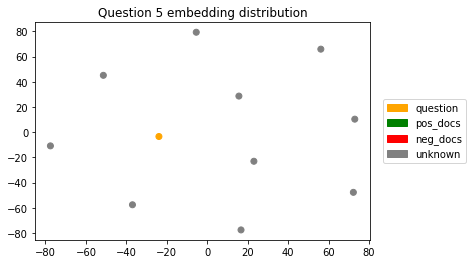

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


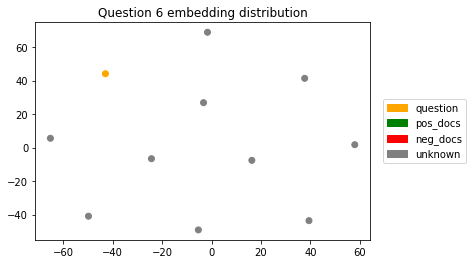

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


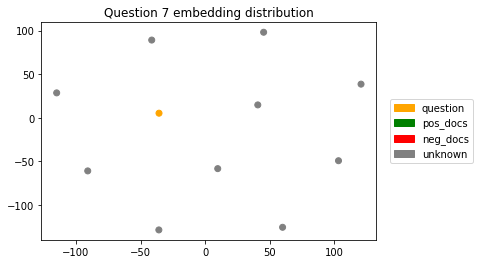

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


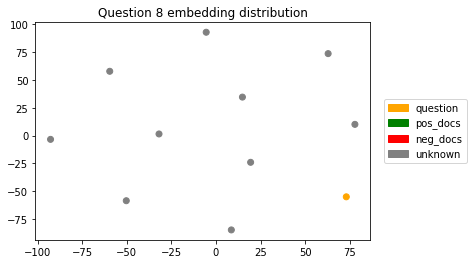

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


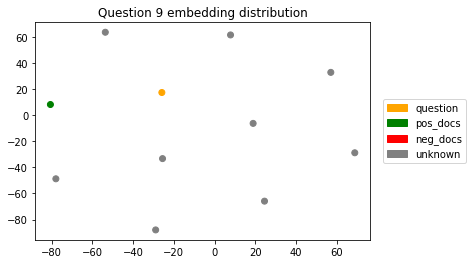

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


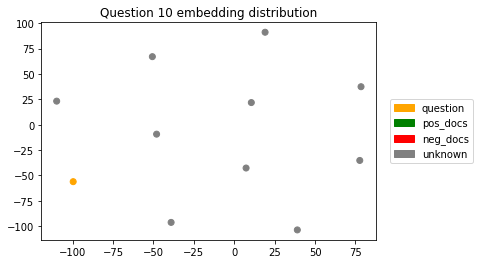

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


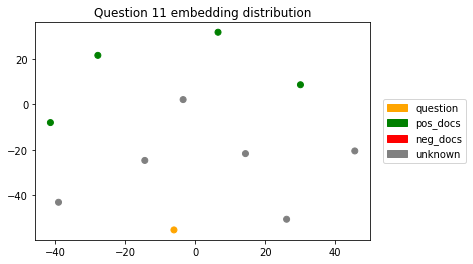

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


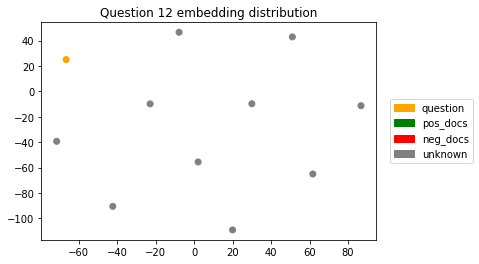

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


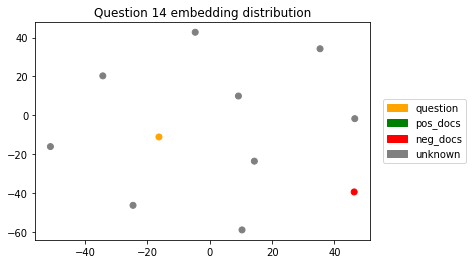

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


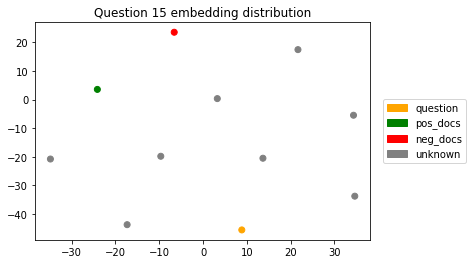

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


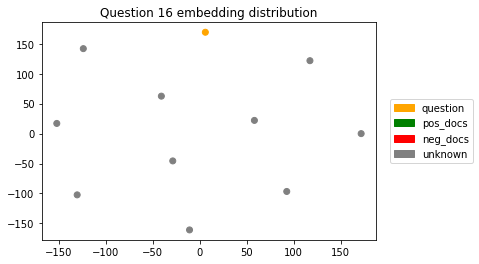

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


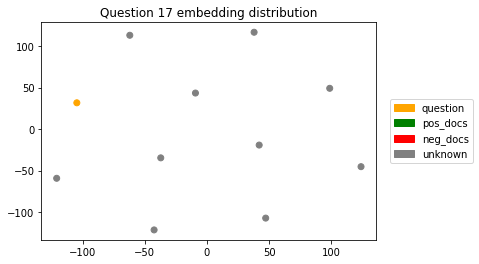

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


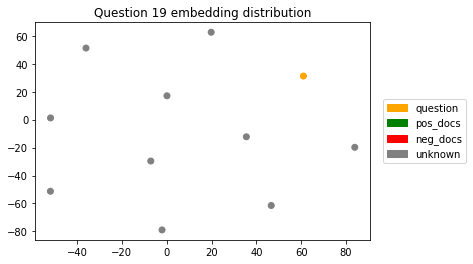

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


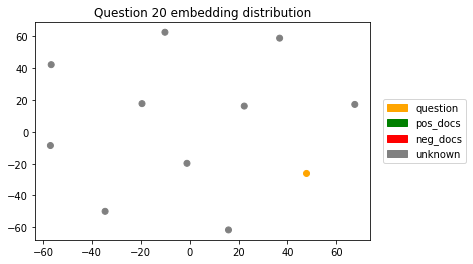

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


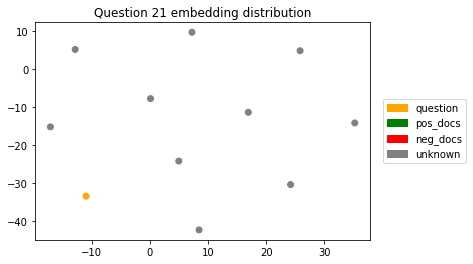

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


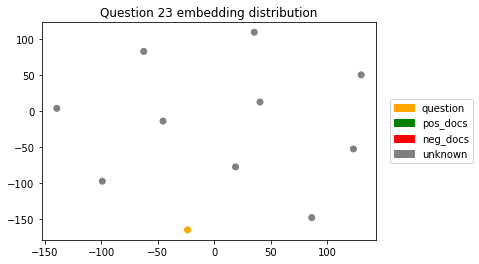

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


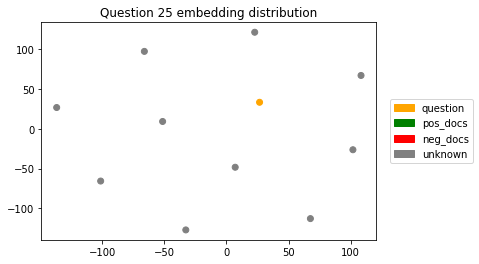

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


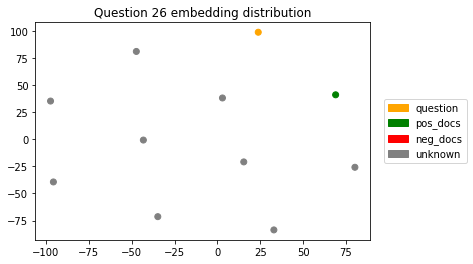

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


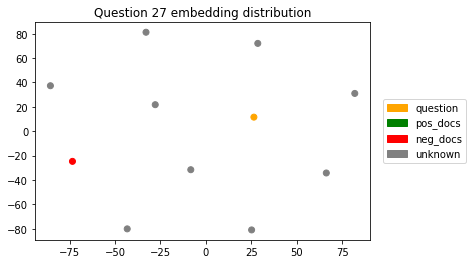

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


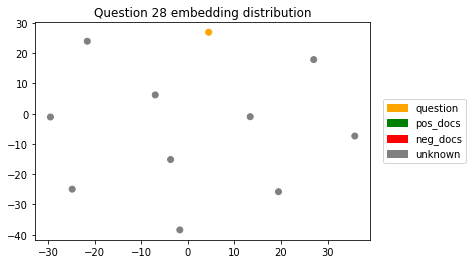

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


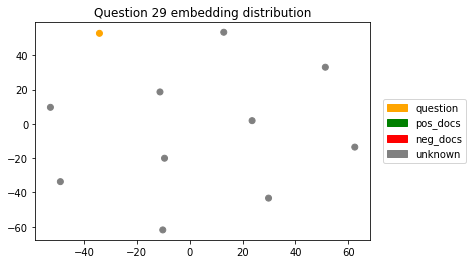

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


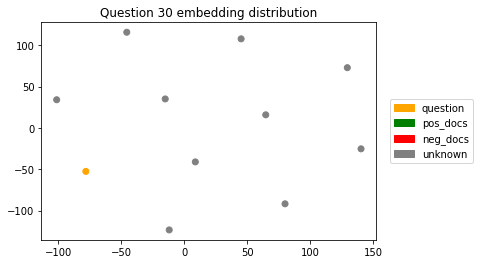

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


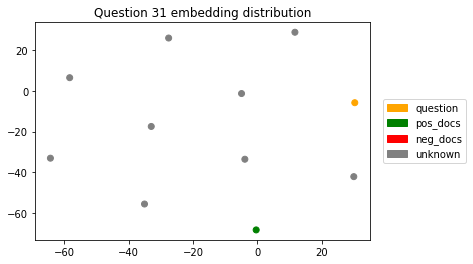

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


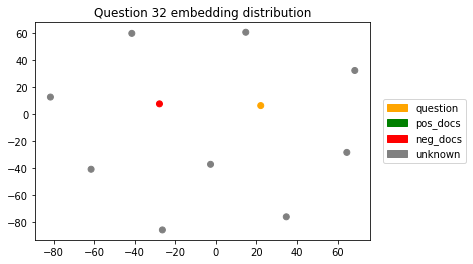

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


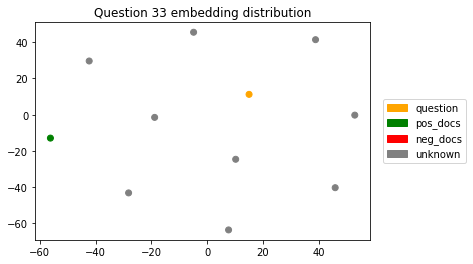

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


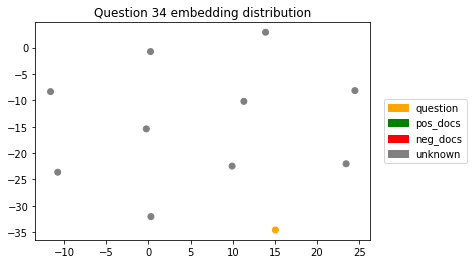

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


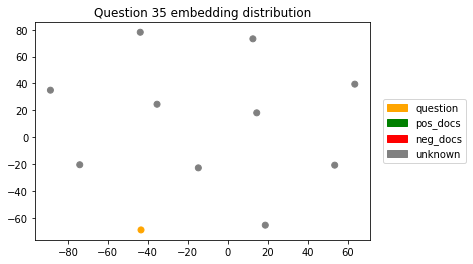

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


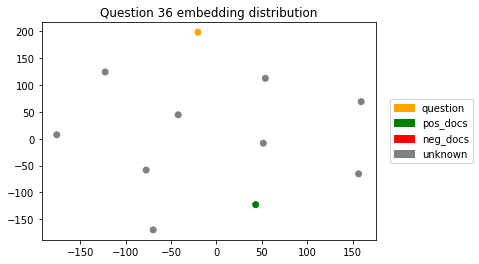

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


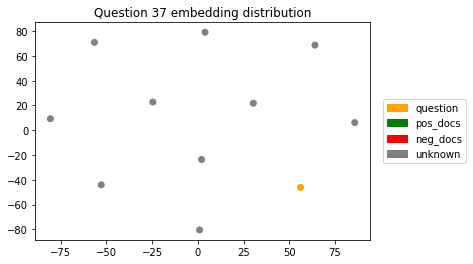

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


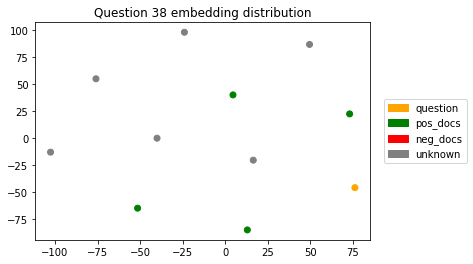

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


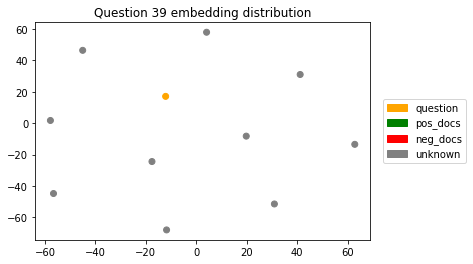

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


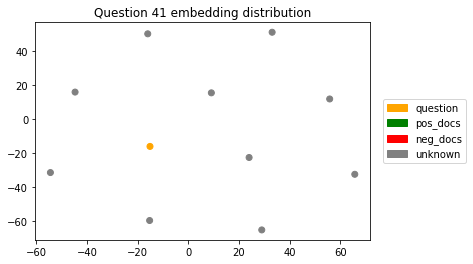

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


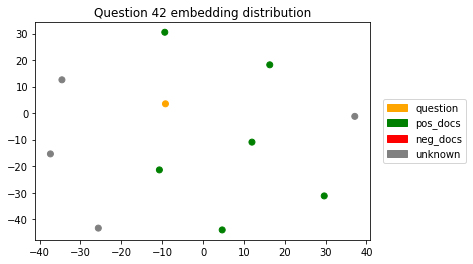

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


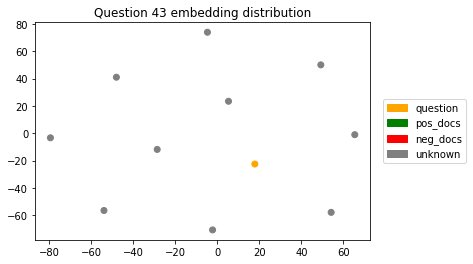

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


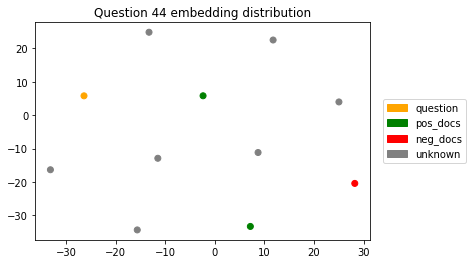

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


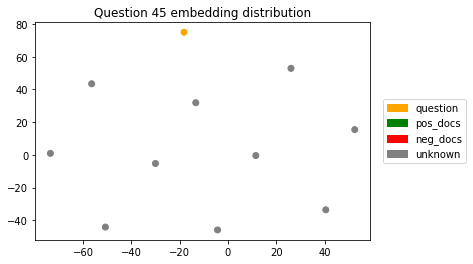

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


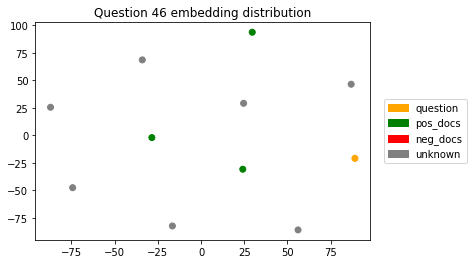

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


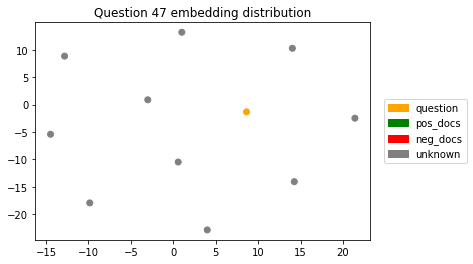

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


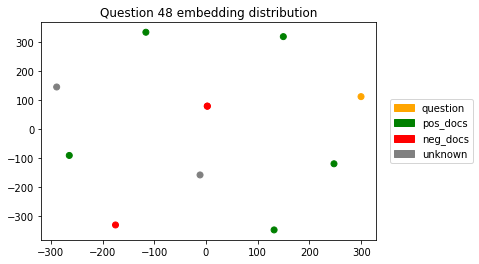

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


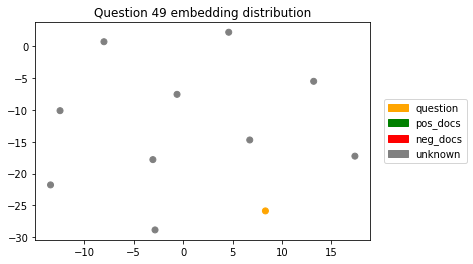

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


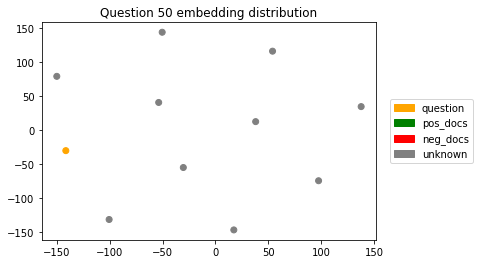

In [541]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import numpy as np

orange_patch = mpatches.Patch(color='orange', label='question')
green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [orange_patch, green_patch, red_patch, grey_patch]
for idx,row in enumerate(actual_data):    
    values = [0]
    colors = ListedColormap(['orange','green','red', 'grey'])
    qid = row['question']['id']
    q_vector = query_embeddings[qid]
    q_vector = q_vector.reshape(-1, len(q_vector))
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        p_vector = passage_embeddings[pid]
        p_vector = p_vector.reshape(-1, len(p_vector))
        q_vector = np.concatenate((q_vector, p_vector), axis=0)
        color = 1 if pid in gold_ids[idx] else 2
        color = 3 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    if len(q_vector) < 2:
        continue
    q_compressed = TSNE(n_components=2, learning_rate='auto',init='pca', random_state=42).fit_transform(q_vector)

    plt.title(f"Question {qid} embedding distribution")
    scatter = plt.scatter(q_compressed[:,0], q_compressed[:,1], c=values, cmap=colors)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()

## BM25 Score vs DPR Score

We expect the graphic will be inversely linear because DPR similarity score has negative correlation with BM25 similarity (While DPR smaller is better, BM25 bigger is better)

In [542]:
import xml.etree.ElementTree as ET

#gather all documents from corpus
docs = []
doc_ids = []

tree = ET.parse('../Dataset/Corpus/corpus_only_question_edited.xml')
root = tree.getroot()

for doc in root:
    for attr in doc:
        attr_type = attr.tag
        attr_content = attr.text
        if attr_type=='KELUHAN':
            content_text = ''
            for content in attr:
                if content.tag == 'JUDUL':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
                elif content.tag == 'ISI':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
            docs.append(content_text)
        elif attr_type == 'ID':
            doc_ids.append(attr_content)



In [543]:
assert len(docs)==len(doc_ids)

In [544]:
docs_map =  dict()
for idx, doc_id in enumerate(doc_ids):
    docs_map[doc_id] = docs[idx]

In [545]:
from tqdm import tqdm

avgdl = sum(len(doc) for doc in docs) / len(docs)
N = len(docs)
docs_freq_map, terms_freq_map, N, avgdl = bm25_init(docs_map)
for q_idx, q_row in tqdm(enumerate(actual_data)):
    query = q_row['question']['title']
    query  += f". {q_row['question']['text']}" if q_row['question']['text'].strip()!="" else ""
    for doc_idx, doc_row in enumerate(q_row['ctxs']):
        doc_id = doc_row['id']
        actual_data[q_idx]['ctxs'][doc_idx]['bm25_score'] = bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map,  docs_map, avgdl, N)
        

45it [00:00, 91.92it/s]


### Aggregated Plot

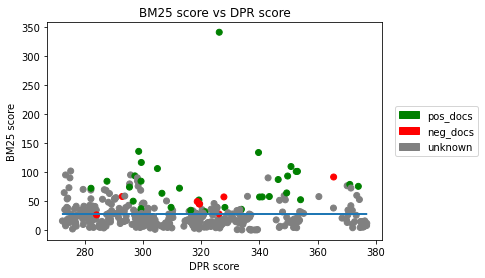

In [546]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.preprocessing import MinMaxScaler, StandardScaler

green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [green_patch, red_patch, grey_patch]
values = []
colors = ListedColormap(['green','red', 'grey'])
score_vector = []
for idx,row in enumerate(actual_data):        
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
score_vector= np.array(score_vector)


m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
plt.title(f"BM25 score vs DPR score")
plt.xlabel("DPR score")
plt.ylabel("BM25 score")
scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)

plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
plt.show()

### Per question plot

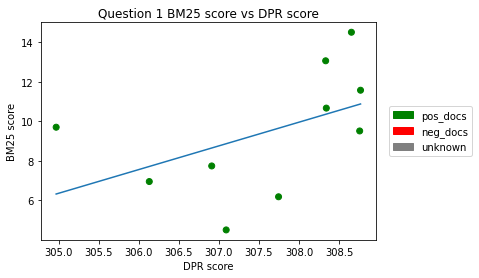

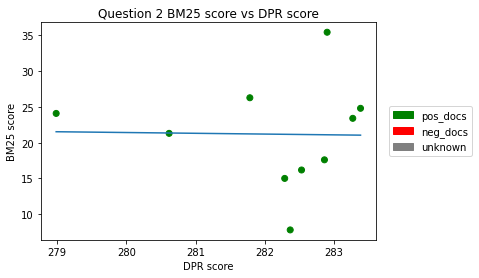

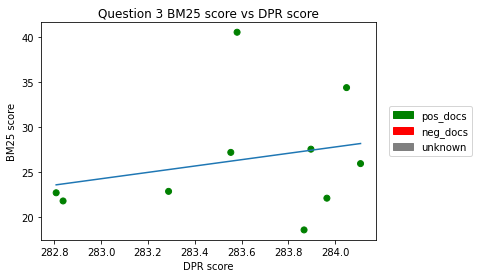

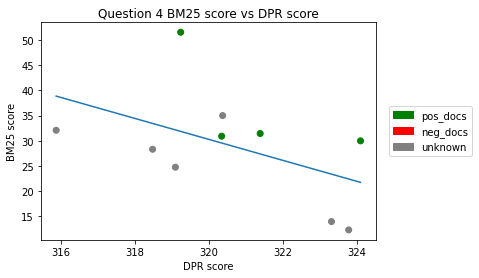

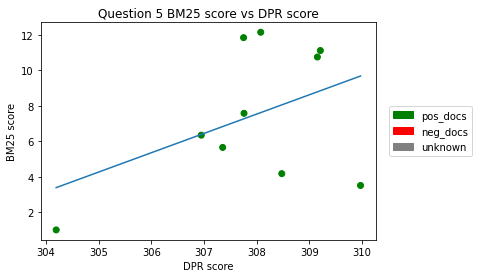

...

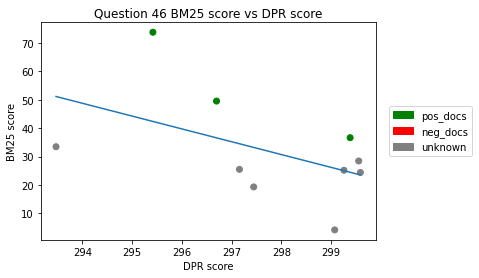

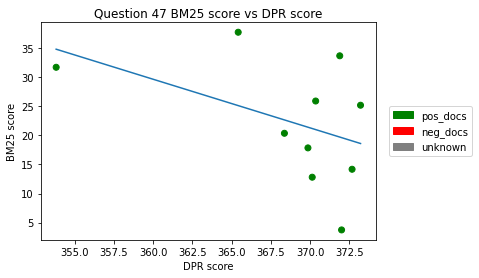

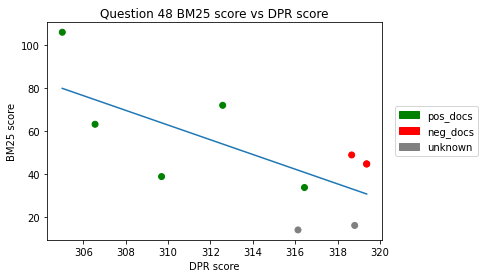

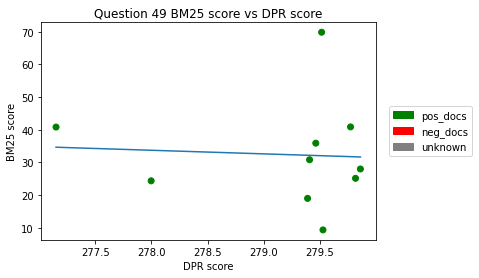

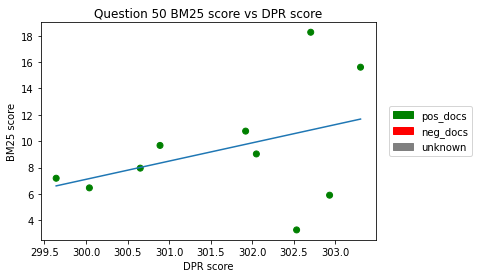

In [547]:
gradients_lst = []
for idx,row in enumerate(actual_data):
    values = []
    score_vector = []
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    score_vector= np.array(score_vector)


    m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
    plt.title(f"Question {qid} BM25 score vs DPR score")
    plt.xlabel("DPR score")
    plt.ylabel("BM25 score")
    scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)
    gradients_lst.append(m)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
    plt.show()

In [548]:
is_positive = [gradient for gradient in gradients_lst if gradient > 0]
is_negative = [gradient for gradient in gradients_lst if gradient < 0]

print(f"positive gradient count: {len(is_positive)}")
print(f"negative gradient count: {len(is_negative)}")

positive gradient count: 23
negative gradient count: 22


# C.  TTHealth Data

In [549]:
actual_data = []

with open('../Results/syifa_results_full_tthealth.json', 'r') as actual_out:
    actual_data = json.load(actual_out)



In [550]:
text_error = []
i = 0
for row in actual_data:
    row_text_error = []
    for row_ctx in row['ctxs']:
        if row_ctx['id'] in neg_ids[i]:
            row_text_error.append({'id': row_ctx['id'], 'title': row_ctx['title'], 'text': row_ctx['text']})
    text_error.append(row_text_error)
    i+=1

In [551]:
for i in range(len(text_error)):
    print("Question")
    print(f"text: {actual_data[i]['question']['text']}")
    print(f"title: {actual_data[i]['question']['title']}")
    print("Similar Questions")
    print(text_error[i])
    print()
    print()

Question
text: malam dok , sejak 2 hari yang lalu badan saya pusing dan lemas hari ini hidung saya mengeluarkan ingus terus menerus , bagaimana cara mengatasi nya ya dok ? terima kasih sebelumnya
title: cara mengatasi pusing , lemas dan hidung berair
Similar Questions
[{'id': 'AD-3539', 'title': 'hidung keluar darah saat buang kotoran hidung', 'text': 'selamat siang dok saya mau tanya , saya kan sedang flu dan batuk , kenapa ya saat saya buang kotoran hidung ( ingus ) kadang mengeluarkan darah. , dan kotoran hidung yang biasa lendir bisa jadi kerak . saat menjadi kerak saya agak susah bernafas itu bagaimana ya dok dan cara penanganannya ? terima kasih'}, {'id': 'AD-17605', 'title': 'penyebab hidung sakit saat bernafas dan berair', 'text': 'selamat siang dok , saya harimas . saya punya kendala di hidung saya , saya sering bersin-bersin disaat hawa dingin atau terkena debu dan setelah itu merasakan sakit sekali disaat saya bernafas lalu dan hidung pun berair . setelah itu mata saya irita

## Unigram Analysis

In [552]:
n = len(text_error)

In [553]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/mk1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Question
{'atas': 2, 'pusing': 2, 'lemas': 2, 'hidung': 2, 'dok': 2, 'air': 1, 'malam': 1, 'badan': 1, 'keluar': 1, 'ingus': 1, 'terus': 1, 'nya': 1, 'ya': 1, 'terima': 1, 'kasih': 1}


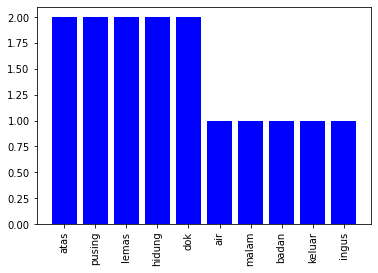

Similar Questions
{'hidung': 14, 'dok': 8, 'sumbat': 7, 'sakit': 4, 'kotor': 3, 'ya': 3, 'nafas': 3, 'terima': 3, 'kasih': 3, 'debu': 3, 'darah': 2, 'buang': 2, 'selamat': 2, 'siang': 2, 'ingus': 2, 'kadang': 2, 'keluar': 2, 'kerak': 2, 'sebab': 2, 'air': 2, 'saat': 2, 'kena': 2, 'atas': 2, 'kepala': 2, 'pilek': 2, 'bersih': 2, 'bronkitis': 2, 'flu': 1, 'batuk': 1, 'lendir': 1, 'susah': 1, 'tangan': 1, 'harimas': 1, 'kendala': 1, 'hawa': 1, 'dingin': 1, 'rasa': 1, 'mata': 1, 'iritasi': 1, 'bengkak': 1, 'pagi': 1, 'riwayat': 1, 'sinusitis': 1, 'periksa': 1, 'hasil': 1, 'ronsen': 1, 'sinus': 1, 'alergi': 1, 'sinar': 1, 'matahari': 1, 'langsung': 1, 'cair': 1, 'akibat': 1, 'syang': 1, 'keluh': 1, 'serta': 1}


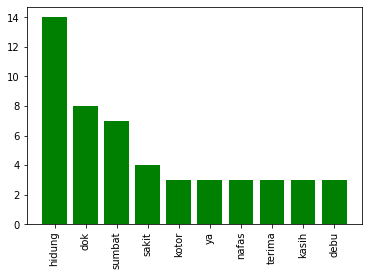



Question
{'darah': 2, 'flek': 2, 'hamil': 2, 'assalamualaikum': 1, 'dok': 1, 'wanita': 1, 'muda': 1}


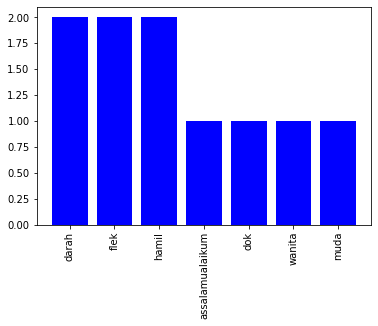

Similar Questions
{'haid': 4, 'darah': 2, 'dok': 2, 'siang': 1, 'selesai': 1, 'flek': 1, 'warna': 1, 'coklat': 1, 'hitam': 1, 'sakit': 1, 'rahim': 1, 'hamil': 1, 'mohon': 1, 'info': 1, 'terima': 1, 'kasih': 1}


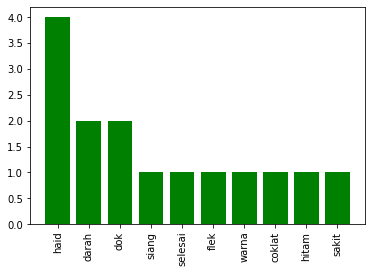



Question
{'jantung': 4, 'debar': 1, 'tanda': 1, 'dear': 1, 'dokter': 1, 'suka': 1, 'darah': 1, 'lancar': 1, 'keluh': 1, 'apa': 1, 'sehat': 1, 'relatif': 1, 'prima': 1, 'sakit': 1, 'mohon': 1, 'informasi': 1, 'dok': 1, 'terima': 1, 'kasih': 1, 'atensi': 1, 'salam': 1, 'hormat': 1}


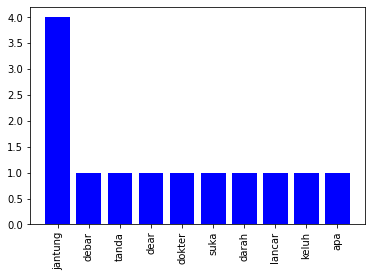

Similar Questions
{'jantung': 3, 'tusuk': 2, 'dok': 2, 'kadang': 1, 'sakit': 1}


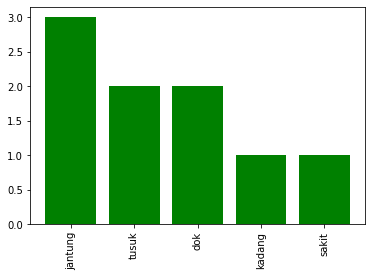



Question
{'bahaya': 2, 'makan': 2, 'mi': 2, 'instan': 2, 'dok': 2, 'terkadang': 1, 'konsumsi': 1, 'hari': 1, 'kali': 1, 'maklum': 1, 'anak': 1, 'kost': 1, 'rantau': 1, 'seberang': 1}


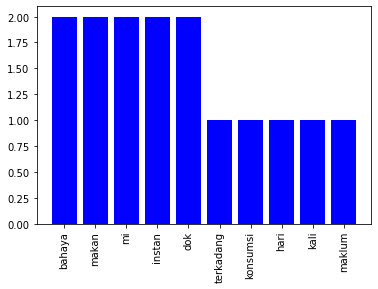

Similar Questions
{'konsumsi': 4, 'mie': 4, 'hamil': 2, 'makan': 2, 'minum': 2, 'mi': 1, 'instan': 1, 'hallo': 1, 'dok': 1, 'instant': 1, 'ayam': 1, 'dingin': 1, 'eskrim': 1, 'air': 1, 'es': 1, 'anjur': 1, 'terima': 1, 'kasih': 1}


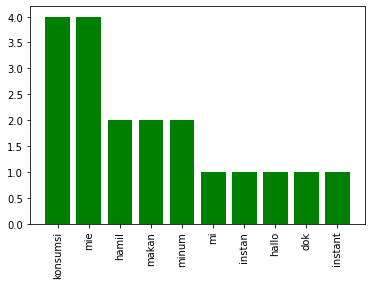



Question
{'lendir': 3, 'tenggorok': 3, 'dok': 2, 'flu': 2, 'tenggoroka': 1, 'keluar': 1, 'skl': 1, 'bau': 1, 'sengat': 1, 'sakit': 1}


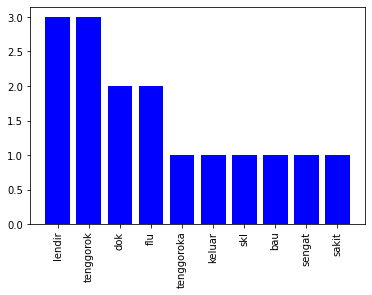

Similar Questions
{'lendir': 4, 'flu': 2, 'dok': 2, 'keluar': 2, 'lubang': 2, 'belah': 2, 'hidung': 1, 'darah': 1, 'derita': 1, 'kena': 1, 'kiri': 1, 'warna': 1, 'merah': 1, 'darab': 1, 'beda': 1, 'kanan': 1}


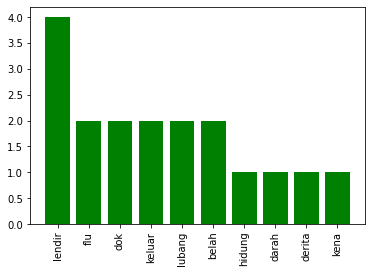



Question
{'operasi': 5, 'luka': 3, 'batu': 2, 'kandung': 2, 'kemih': 2, 'john': 2, 'urin': 2, 'keluh': 1, 'pasca': 1, 'selamat': 1, 'siang': 1, 'dok': 1, 'nama': 1, 'usia': 1, 'barusaja': 1, 'sembuh': 1, 'basah': 1, 'hormat': 1}


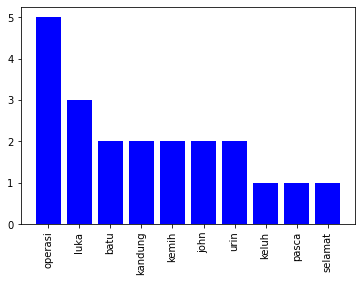

Similar Questions
{'kandung': 6, 'kemih': 6, 'kencing': 6, 'dok': 5, 'infeksi': 5, 'bolak': 4, 'yah': 3, 'oh': 2, 'ya': 2, 'maaf': 2, 'digoogle': 2, 'minum': 2, 'habis': 1, 'serasa': 1, 'kering': 1, 'intensitas': 1, 'turun': 1, 'salur': 1, 'obat': 1, 'tradisional': 1, 'tanam': 1, 'kumis': 1, 'kucing': 1, 'dokter': 1, 'sebab': 1, 'erang': 1, 'nya': 1, 'bak': 1, 'sembuh': 1, 'trimaksih': 1}


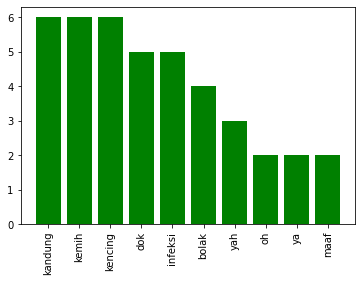



Question
{'tangan': 4, 'telapak': 3, 'kulit': 2, 'kelupas': 2, 'dok': 2, 'gatal': 1, 'lapis': 1, 'bintik': 1, 'merah': 1, 'kali': 1, 'alami': 1, 'sembuh': 1, 'solusi': 1, 'dokter': 1, 'sakit': 1, 'anjur': 1, 'obat': 1, 'terima': 1, 'kasih': 1}


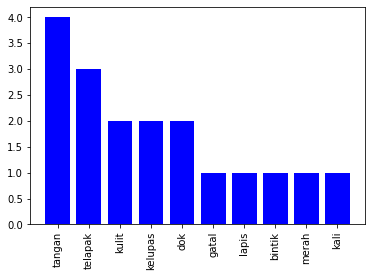

Similar Questions
{'dok': 9, 'gatal': 6, 'kulit': 3, 'nya': 3, 'ya': 3, 'tangan': 3, 'kaki': 2, 'bengkak': 2, 'garuk': 2, 'telapak': 2, 'nnya': 1, 'jempol': 1, 'bentol': 1, 'lapis': 1, 'solusi': 1, 'trmksih': 1, 'air': 1, 'sore': 1, 'maaf': 1, 'mggu': 1, 'alami': 1, 'tang': 1, 'halo': 1, 'nih': 1, 'sebab': 1}


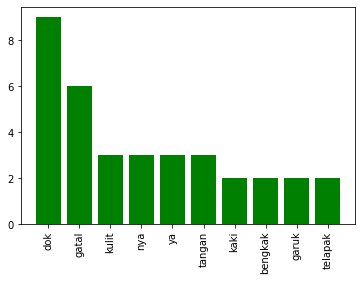



Question
{'bayi': 6, 'susu': 6, 'minum': 5, 'formula': 5, 'tinggal': 2, 'asi': 2, 'gizi': 2, 'minggu': 1, 'dok': 1, 'berangkat': 1, 'kerja': 1, 'keluarga': 1, 'air': 1, 'putih': 1, 'teh': 1, 'manis': 1, 'pertannyaanya': 1, 'tindak': 1, 'ambil': 1, 'si': 1, 'kurang': 1, 'asupan': 1, 'mohon': 1, 'dokter': 1, 'saran': 1, 'baik': 1, 'imbang': 1, 'cukup': 1, 'note': 1, 'pompa': 1, 'taruh': 1, 'botol': 1, 'tolak': 1}


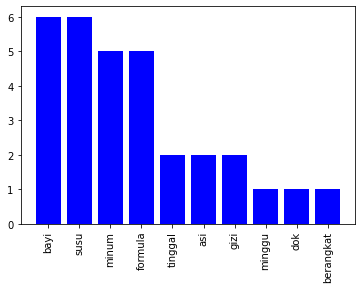

Similar Questions
{'susu': 17, 'formula': 12, 'bayi': 9, 'dok': 8, 'asi': 6, 'kasih': 5, 'minum': 3, 'usia': 3, 'terima': 3, 'lahir': 2, 'malam': 2, 'rumah': 2, 'ganti': 2, 'balita': 2, 'kategori': 2, 'selamat': 1, 'anak': 1, 'umur': 1, 'ya': 1, 'kemarin': 1, 'pas': 1, 'pulang': 1, 'beliin': 1, 'tindak': 1, 'laku': 1, 'salah': 1, 'mslhnya': 1, 'sakit': 1, 'aman': 1, 'cerna': 1, 'masalah': 1, 'minggu': 1, 'suka': 1, 'bagus': 1, 'efek': 1, 'negatif': 1, 'plus': 1, 'sufor': 1, 'untuk': 1, 'halo': 1, 'sih': 1, 'definisi': 1, 'kombinasi': 1, 'siang': 1, 'oplos': 1}


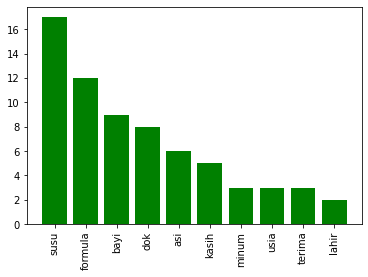



Question
{'cedera': 4, 'ligamen': 3, 'sebab': 1, 'bentur': 1, 'celaka': 1, 'olahraga': 1, 'berat': 1, 'ya': 1, 'dok': 1, 'penasaran': 1, 'cegah': 1, 'tubuh': 1, 'fit': 1, 'deteksi': 1}


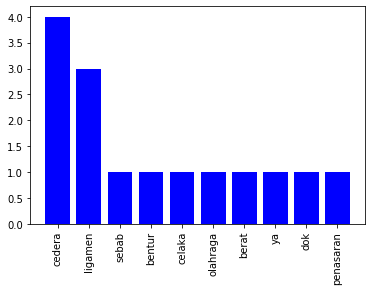

Similar Questions
{'kaki': 2, 'nyeri': 2, 'jatuh': 2, 'dokter': 2, 'paska': 1, 'akibat': 1, 'otot': 1, 'ligamen': 1, 'masalah': 1, 'periksa': 1, 'spesialis': 1, 'sebab': 1}


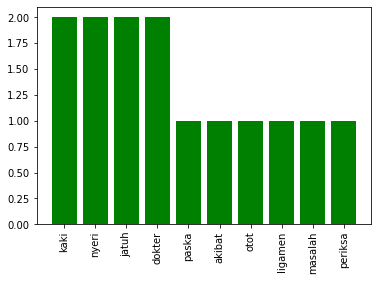

In [554]:
import matplotlib.pyplot as plt

for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(1, full_query)
    
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(1, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Unigram Overlap

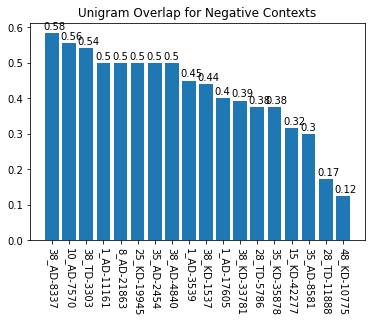

In [555]:
unigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(1, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(1, full_passage)
        unigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
unigram_overlap = dict(sorted(unigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(unigram_overlap.keys()), list(unigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Unigram Overlap for Negative Contexts")
for i, v in enumerate(list(unigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.01, str(round(v, 2)))
plt.show()

## Bigram Analysis

Question
{'cara atas': 2, 'atas pusing': 1, 'pusing lemas': 1, 'lemas dan': 1, 'dan hidung': 1, 'hidung air': 1, 'air malam': 1, 'malam dok': 1, 'dok sejak': 1, 'sejak hari': 1, 'hari yang': 1, 'yang lalu': 1, 'lalu badan': 1, 'badan saya': 1, 'saya pusing': 1, 'pusing dan': 1, 'dan lemas': 1, 'lemas hari': 1, 'hari ini': 1, 'ini hidung': 1, 'hidung saya': 1, 'saya keluar': 1, 'keluar ingus': 1, 'ingus terus': 1, 'terus terus': 1, 'terus bagaimana': 1, 'bagaimana cara': 1, 'atas nya': 1, 'nya ya': 1, 'ya dok': 1, 'dok terima': 1, 'terima kasih': 1, 'kasih belum': 1}


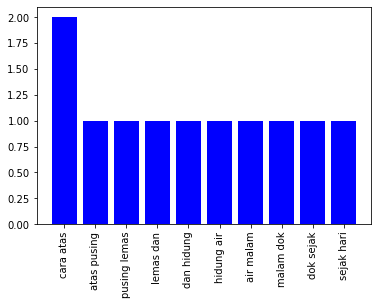

Similar Questions
{'hidung saya': 5, 'kotor hidung': 3, 'dok saya': 3, 'terima kasih': 3, 'saya punya': 3, 'tiap hari': 3, 'keluar darah': 2, 'buang kotor': 2, 'selamat siang': 2, 'siang dok': 2, 'saya mau': 2, 'mau tanya': 2, 'kenapa ya': 2, 'saat saya': 2, 'hidung yang': 2, 'jadi kerak': 2, 'ya dok': 2, 'debu dan': 2, 'telah itu': 2, 'dok terima': 2, 'selalu sumbat': 2, 'sampai sakit': 2, 'sakit kepala': 2, 'hidung sumbat': 2, 'hidung keluar': 1, 'darah saat': 1, 'saat buang': 1, 'hidung selamat': 1, 'tanya saya': 1, 'saya kan': 1, 'kan sedang': 1, 'sedang flu': 1, 'flu dan': 1, 'dan batuk': 1, 'batuk kenapa': 1, 'ya saat': 1, 'saya buang': 1, 'hidung ingus': 1, 'ingus kadang': 1, 'kadang keluar': 1, 'darah dan': 1, 'dan kotor': 1, 'yang biasa': 1, 'biasa lendir': 1, 'lendir bisa': 1, 'bisa jadi': 1, 'kerak saat': 1, 'saat jadi': 1, 'kerak saya': 1, 'saya agak': 1, 'agak susah': 1, 'susah nafas': 1, 'nafas itu': 1, 'itu bagaimana': 1, 'bagaimana ya': 1, 'dok dan': 1, 'dan cara': 1, '

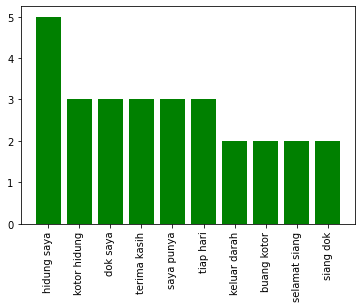



Question
{'darah atau': 1, 'atau flek': 1, 'flek saat': 1, 'saat awal': 1, 'awal hamil': 1, 'hamil assalamualaikum': 1, 'assalamualaikum dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya apakah': 1, 'apakah tiap': 1, 'tiap wanita': 1, 'wanita jika': 1, 'jika hamil': 1, 'hamil muda': 1, 'muda biasa': 1, 'biasa keluar': 1, 'keluar darah': 1, 'darah flek': 1, 'flek atau': 1, 'atau hanya': 1, 'hanya bagi': 1, 'bagi saja': 1}


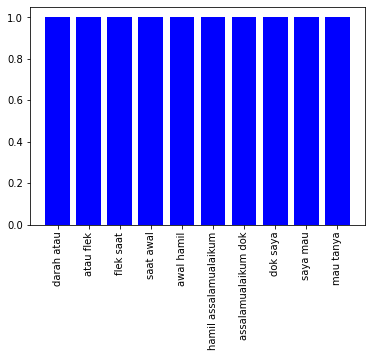

Similar Questions
{'hari kemudian': 2, 'seperti haid': 2, 'keluar darah': 1, 'darah telah': 1, 'telah haid': 1, 'haid siang': 1, 'siang dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya saya': 1, 'saya itu': 1, 'itu sudah': 1, 'sudah selesai': 1, 'selesai haid': 1, 'haid tetapi': 1, 'tetapi telah': 1, 'telah hari': 1, 'kemudian saya': 1, 'saya kok': 1, 'kok keluar': 1, 'keluar flek': 1, 'flek seperti': 1, 'haid warna': 1, 'warna coklat': 1, 'coklat hitam': 1, 'hitam sedikit': 1, 'sedikit hari': 1, 'kemudian seperti': 1, 'haid keluar': 1, 'keluar banyak': 1, 'banyak apakah': 1, 'apakah ada': 1, 'ada sakit': 1, 'sakit di': 1, 'di rahim': 1, 'rahim saya': 1, 'saya dok': 1, 'dok atau': 1, 'atau memang': 1, 'memang ini': 1, 'ini darah': 1, 'darah awal': 1, 'awal hamil': 1, 'hamil mohon': 1, 'mohon info': 1, 'info terima': 1, 'terima kasih': 1}


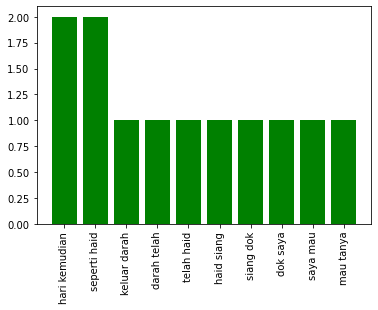



Question
{'jantung debar': 1, 'debar apakah': 1, 'apakah tanda': 1, 'tanda ada': 1, 'ada masalah': 1, 'masalah jantung': 1, 'jantung dear': 1, 'dear dokter': 1, 'dokter jantung': 1, 'jantung saya': 1, 'saya suka': 1, 'suka rasa': 1, 'rasa seperti': 1, 'seperti darah': 1, 'darah tidak': 1, 'tidak lancar': 1, 'lancar lama': 1, 'lama ini': 1, 'ini tidak': 1, 'tidak ada': 1, 'ada keluh': 1, 'keluh apa': 1, 'apa dan': 1, 'dan sehat': 1, 'sehat saya': 1, 'saya relatif': 1, 'relatif prima': 1, 'prima apakah': 1, 'apakah saya': 1, 'saya ada': 1, 'ada sakit': 1, 'sakit jantung': 1, 'jantung mohon': 1, 'mohon informasi': 1, 'informasi dok': 1, 'dok terima': 1, 'terima kasih': 1, 'kasih atas': 1, 'atas atensi': 1, 'atensi salam': 1, 'salam hormat': 1}


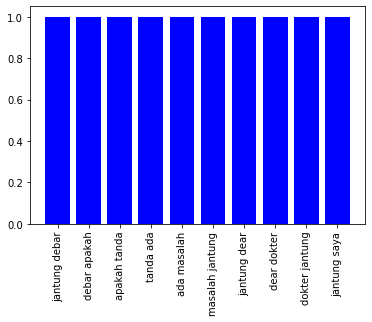

Similar Questions
{'jantung kadang': 1, 'kadang asa': 1, 'asa tusuk': 1, 'tusuk dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya apakah': 1, 'apakah bila': 1, 'bila jantung': 1, 'jantung seperti': 1, 'seperti tusuk': 1, 'tusuk itu': 1, 'itu arti': 1, 'arti sakit': 1, 'sakit jantung': 1, 'jantung dok': 1}


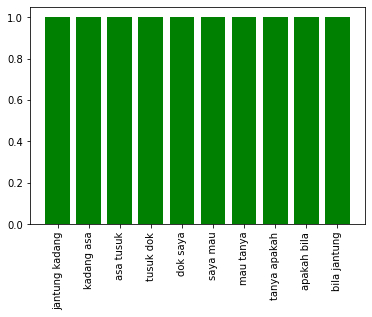



Question
{'makan mi': 2, 'mi instan': 2, 'tiap hari': 2, 'bahaya makan': 1, 'instan tiap': 1, 'hari dok': 1, 'dok bahaya': 1, 'bahaya tidak': 1, 'tidak saya': 1, 'saya selalu': 1, 'selalu makan': 1, 'instan hampir': 1, 'hampir tiap': 1, 'hari atau': 1, 'atau terkadang': 1, 'terkadang saya': 1, 'saya konsumsi': 1, 'konsumsi hari': 1, 'hari bisa': 1, 'bisa dua': 1, 'dua sampai': 1, 'sampai tiga': 1, 'tiga kali': 1, 'kali maklum': 1, 'maklum dok': 1, 'dok saya': 1, 'saya anak': 1, 'anak kost': 1, 'kost rantau': 1, 'rantau dari': 1, 'dari seberang': 1}


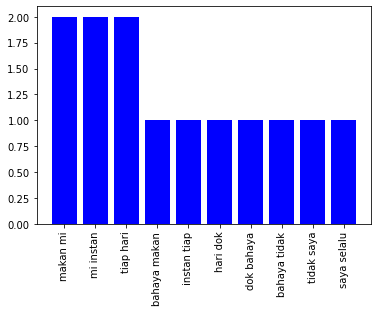

Similar Questions
{'apakah benar': 2, 'tidak boleh': 2, 'boleh konsumsi': 2, 'konsumsi mi': 1, 'mi instan': 1, 'instan untuk': 1, 'untuk ibu': 1, 'ibu hamil': 1, 'hamil hallo': 1, 'hallo dok': 1, 'dok apakah': 1, 'benar saat': 1, 'saat hamil': 1, 'hamil tidak': 1, 'konsumsi mie': 1, 'mie baik': 1, 'baik itu': 1, 'itu mie': 1, 'mie instant': 1, 'instant mie': 1, 'mie ayam': 1, 'ayam atau': 1, 'atau mie': 1, 'mie yang': 1, 'yang lain': 1, 'lain dan': 1, 'dan apakah': 1, 'benar tidak': 1, 'konsumsi makan': 1, 'makan atau': 1, 'atau minum': 1, 'minum dingin': 1, 'dingin seperti': 1, 'seperti eskrim': 1, 'eskrim atau': 1, 'atau air': 1, 'air es': 1, 'es lalu': 1, 'lalu apakah': 1, 'apakah anjur': 1, 'anjur konsumsi': 1, 'konsumsi yang': 1, 'yang balik': 1, 'balik yaitu': 1, 'yaitu makan': 1, 'makan dan': 1, 'dan minum': 1, 'minum terima': 1, 'terima kasih': 1}


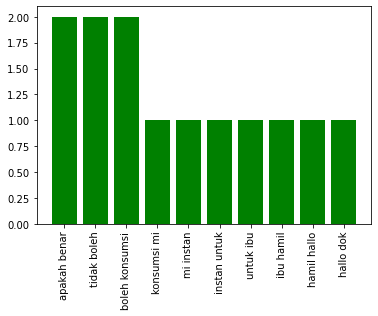



Question
{'beberapa bulan': 2, 'dari tenggorok': 2, 'flu dan': 2, 'lendir dalam': 1, 'dalam tenggoroka': 1, 'tenggoroka yang': 1, 'yang sudah': 1, 'sudah lama': 1, 'lama saya': 1, 'saya sudah': 1, 'sudah lebih': 1, 'lebih beberapa': 1, 'bulan dok': 1, 'dok selalu': 1, 'selalu keluar': 1, 'keluar lendir': 1, 'lendir dari': 1, 'tenggorok dan': 1, 'dan asa': 1, 'asa skl': 1, 'skl kalau': 1, 'kalau tenggorok': 1, 'tenggorok ada': 1, 'ada lendir': 1, 'lendir saya': 1, 'saya tidak': 1, 'tidak lagi': 1, 'lagi flu': 1, 'dan beberapa': 1, 'bulan tidak': 1, 'tidak pernah': 1, 'pernah flu': 1, 'dan ada': 1, 'ada bau': 1, 'bau sengat': 1, 'sengat yang': 1, 'yang keluar': 1, 'keluar dari': 1, 'tenggorok itu': 1, 'itu sakit': 1, 'sakit apa': 1, 'apa biasa': 1, 'biasa dok': 1}


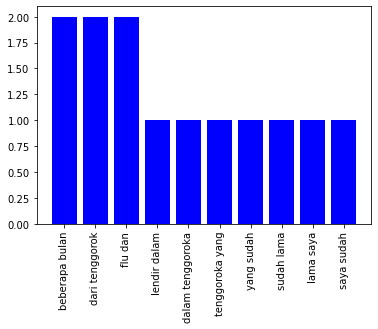

Similar Questions
{'keluar lendir': 2, 'lubang belah': 2, 'lendir hidung': 1, 'hidung darah': 1, 'darah saat': 1, 'saat sedang': 1, 'sedang derita': 1, 'derita flu': 1, 'flu dok': 1, 'dok saya': 1, 'saya punya': 1, 'punya masalah': 1, 'masalah saya': 1, 'saya kena': 1, 'kena flu': 1, 'flu dan': 1, 'dan saat': 1, 'saat ingin': 1, 'ingin keluar': 1, 'lendir sebut': 1, 'sebut lendir': 1, 'lendir di': 1, 'di lubang': 1, 'belah kiri': 1, 'kiri keluar': 1, 'lendir warna': 1, 'warna merah': 1, 'merah seperti': 1, 'seperti darab': 1, 'darab beda': 1, 'beda dengan': 1, 'dengan lubang': 1, 'belah kanan': 1, 'kanan mengapa': 1, 'mengapa dok': 1, 'dok apakah': 1, 'apakah ada': 1, 'ada masalah': 1}


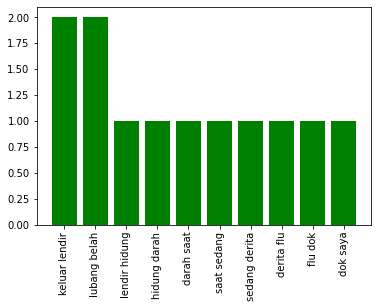



Question
{'luka operasi': 3, 'operasi batu': 2, 'batu kandung': 2, 'kandung kemih': 2, 'saya john': 2, 'keluar lalu': 2, 'lalu luka': 2, 'keluh pasca': 1, 'pasca operasi': 1, 'kemih selamat': 1, 'selamat siang': 1, 'siang dok': 1, 'dok nama': 1, 'nama saya': 1, 'john usia': 1, 'usia tahun': 1, 'tahun saya': 1, 'saya barusaja': 1, 'barusaja laku': 1, 'laku operasi': 1, 'kemih akan': 1, 'akan tetapi': 1, 'tetapi sekarang': 1, 'sekarang urin': 1, 'urin selalu': 1, 'selalu keluar': 1, 'operasi tanya': 1, 'tanya saya': 1, 'saya apakah': 1, 'apakah luka': 1, 'operasi saya': 1, 'saya dapat': 1, 'dapat di': 1, 'di sembuh': 1, 'sembuh dengan': 1, 'dengan urin': 1, 'urin yang': 1, 'yang selalu': 1, 'selalu basah': 1, 'basah dan': 1, 'dan keluar': 1, 'operasi hormat': 1, 'hormat saya': 1}


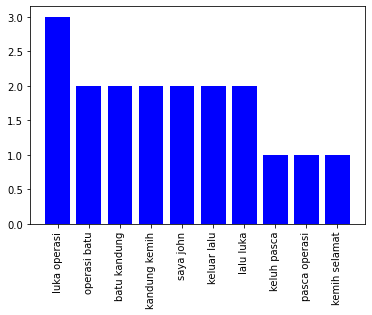

Similar Questions
{'kandung kemih': 6, 'infeksi kandung': 4, 'bolak balik': 3, 'itu kencing': 3, 'kalau saya': 3, 'oh ya': 2, 'ya dok': 2, 'dok maaf': 2, 'maaf yah': 2, 'yah kalau': 2, 'kalau bolak': 2, 'balik tanya': 2, 'tanya kalau': 2, 'kalau digoogle': 2, 'digoogle kan': 2, 'kan infeksi': 2, 'kemih itu': 2, 'kencing terus': 2, 'terus tetapi': 2, 'tetapi lah': 2, 'lah kalau': 2, 'saya ini': 2, 'ini bolak': 2, 'dok apa': 2, 'apa infeksi': 2, 'bolak oh': 1, 'balik kencing': 1, 'kencing tetapi': 1, 'tetapi kalau': 1, 'kalau habis': 1, 'habis minum': 1, 'minum itu': 1, 'kencing cukup': 1, 'cukup banyak': 1, 'banyak dok': 1, 'dok terus': 1, 'terus balik': 1, 'balik lagi': 1, 'lagi jadi': 1, 'jadi kalau': 1, 'kalau kencing': 1, 'kencing itu': 1, 'itu serasa': 1, 'serasa kering': 1, 'kering sampai': 1, 'sampai intensitas': 1, 'intensitas kencing': 1, 'kencing turun': 1, 'turun apa': 1, 'apa itu': 1, 'itu juga': 1, 'juga masuk': 1, 'masuk infeksi': 1, 'infeksi salur': 1, 'salur kandung': 1,

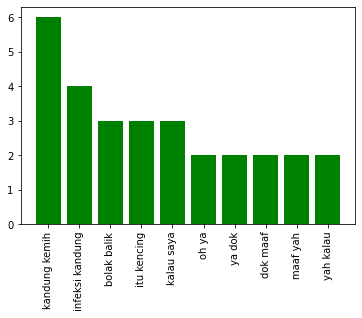



Question
{'telapak tangan': 3, 'kulit luar': 2, 'tangan saya': 2, 'tangan gatal': 1, 'gatal dan': 1, 'dan lapis': 1, 'lapis kulit': 1, 'luar kelupas': 1, 'kelupas dok': 1, 'dok telapak': 1, 'saya ini': 1, 'ini banyak': 1, 'banyak bintik': 1, 'bintik merah': 1, 'merah terus': 1, 'terus kulit': 1, 'luar telapak': 1, 'tangan kelupas': 1, 'kelupas sudah': 1, 'sudah kali': 1, 'kali saya': 1, 'saya alami': 1, 'alami ini': 1, 'ini dok': 1, 'dok dulu': 1, 'dulu sembuh': 1, 'sembuh bulan': 1, 'bulan lebih': 1, 'lebih saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya solusi': 1, 'solusi dari': 1, 'dari dokter': 1, 'dokter dan': 1, 'dan sakit': 1, 'sakit apa': 1, 'apa yang': 1, 'yang ada': 1, 'ada di': 1, 'di telapak': 1, 'saya dan': 1, 'dan anjur': 1, 'anjur obat': 1, 'obat jika': 1, 'jika perlu': 1, 'perlu terima': 1, 'terima kasih': 1}


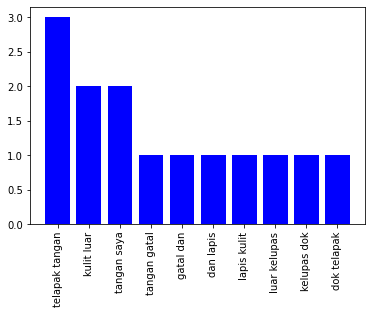

Similar Questions
{'ya dok': 3, 'gatal dan': 2, 'dok saya': 2, 'saya mau': 2, 'mau tanya': 2, 'kenapa ya': 2, 'telapak tangan': 2, 'kulit kaki': 1, 'kaki gatal': 1, 'dan bengkak': 1, 'bengkak mau': 1, 'mau nnya': 1, 'nnya jempol': 1, 'jempol kaki': 1, 'kaki saya': 1, 'saya awal': 1, 'awal nya': 1, 'nya cuma': 1, 'cuma gatal': 1, 'gatal biasa': 1, 'biasa telah': 1, 'telah saya': 1, 'saya garuk': 1, 'garuk bengkak': 1, 'bengkak dan': 1, 'dan ada': 1, 'ada bentol': 1, 'bentol di': 1, 'di lapis': 1, 'lapis kulit': 1, 'kulit nya': 1, 'nya bagaimana': 1, 'bagaimana ya': 1, 'dok solusi': 1, 'solusi nya': 1, 'nya trmksih': 1, 'kulit tangan': 1, 'tangan gatal': 1, 'dan air': 1, 'air sore': 1, 'sore dok': 1, 'dok maaf': 1, 'maaf dok': 1, 'tanya sudah': 1, 'sudah mggu': 1, 'mggu ini': 1, 'ini saya': 1, 'saya alami': 1, 'alami tetapi': 1, 'tetapi cuma': 1, 'cuma tang': 1, 'tang saja': 1, 'saja gatal': 1, 'gatal itu': 1, 'itu bila': 1, 'bila di': 1, 'di garuk': 1, 'garuk jadi': 1, 'jadi kecil': 1, 

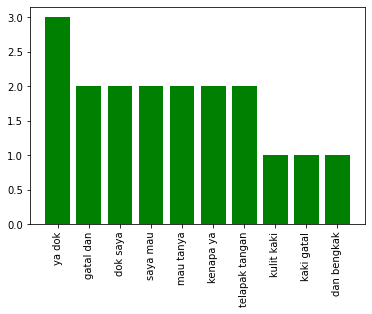



Question
{'susu formula': 5, 'sudah tidak': 2, 'tidak mau': 2, 'mau minum': 2, 'minum susu': 2, 'bayi saya': 2, 'beri susu': 2, 'saya tinggal': 2, 'tinggal kerja': 2, 'belum saya': 2, 'bayi sudah': 1, 'formula sudah': 1, 'sudah minggu': 1, 'minggu ini': 1, 'ini dok': 1, 'dok bayi': 1, 'saya bulan': 1, 'bulan sudah': 1, 'mau beri': 1, 'formula lama': 1, 'lama saya': 1, 'kerja sehingga': 1, 'sehingga hanya': 1, 'hanya minum': 1, 'minum asi': 1, 'asi saya': 1, 'saya belum': 1, 'saya berangkat': 1, 'berangkat kerja': 1, 'kerja dan': 1, 'dan telah': 1, 'telah saya': 1, 'saya kerja': 1, 'kerja antara': 1, 'antara waktu': 1, 'waktu sebut': 1, 'sebut kerja': 1, 'kerja keluarga': 1, 'keluarga hanya': 1, 'hanya beri': 1, 'beri air': 1, 'air putih': 1, 'putih dan': 1, 'dan teh': 1, 'teh manis': 1, 'manis pertannyaanya': 1, 'pertannyaanya bagaimana': 1, 'bagaimana tindak': 1, 'tindak yang': 1, 'yang harus': 1, 'harus saya': 1, 'saya ambil': 1, 'ambil agar': 1, 'agar si': 1, 'si bayi': 1, 'bayi k

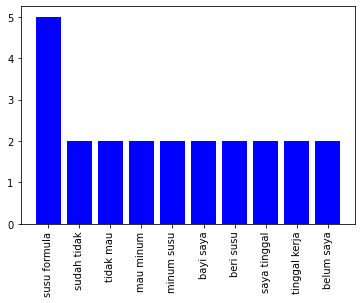

Similar Questions
{'susu formula': 12, 'dok saya': 3, 'terima kasih': 3, 'apakah susu': 3, 'baru lahir': 2, 'beri susu': 2, 'minum asi': 2, 'formula untuk': 2, 'usia bulan': 2, 'ganti susu': 2, 'untuk bayi': 2, 'bayi usia': 2, 'kasih asi': 2, 'tidak dok': 2, 'masuk kategori': 2, 'kategori susu': 2, 'formula itu': 2, 'bayi baru': 1, 'lahir beri': 1, 'formula selamat': 1, 'selamat malam': 1, 'malam dok': 1, 'dok anak': 1, 'anak saya': 1, 'saya umur': 1, 'umur baru': 1, 'baru hari': 1, 'hari tetapi': 1, 'tetapi belum': 1, 'belum mau': 1, 'mau minum': 1, 'asi dari': 1, 'dari ibu': 1, 'ibu kenapa': 1, 'kenapa ya': 1, 'ya dok': 1, 'dok kemarin': 1, 'kemarin pas': 1, 'pas baru': 1, 'lahir dan': 1, 'dan pulang': 1, 'pulang ke': 1, 'ke rumah': 1, 'rumah bayi': 1, 'bayi saya': 1, 'saya belum': 1, 'belum sekali': 1, 'sekali pun': 1, 'pun minum': 1, 'asi dan': 1, 'dan asi': 1, 'asi belum': 1, 'belum keluar': 1, 'keluar jadi': 1, 'jadi saya': 1, 'saya beliin': 1, 'beliin susu': 1, 'untuk usia': 1, 

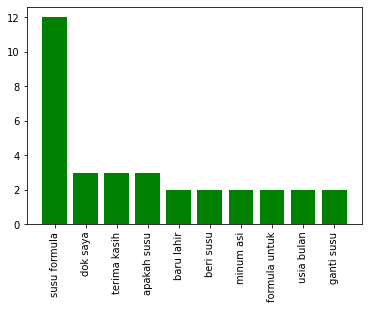



Question
{'cedera ligamen': 3, 'ligamen saya': 1, 'saya ingin': 1, 'ingin tanya': 1, 'tanya soal': 1, 'soal cedera': 1, 'ligamen itu': 1, 'itu kan': 1, 'kan sebab': 1, 'sebab karena': 1, 'karena bentur': 1, 'bentur celaka': 1, 'celaka atau': 1, 'atau olahraga': 1, 'olahraga berat': 1, 'berat ya': 1, 'ya dok': 1, 'dok saya': 1, 'saya penasaran': 1, 'penasaran apakah': 1, 'apakah cedera': 1, 'cedera seperti': 1, 'seperti itu': 1, 'itu bisa': 1, 'bisa cegah': 1, 'cegah atau': 1, 'atau bisa': 1, 'bisa tahu': 1, 'tahu belum': 1, 'belum seperti': 1, 'seperti tubuh': 1, 'tubuh tidak': 1, 'tidak fit': 1, 'fit bisa': 1, 'bisa cedera': 1, 'ligamen atau': 1, 'atau bagaimana': 1, 'bagaimana apa': 1, 'apa bisa': 1, 'bisa deteksi': 1, 'deteksi belum': 1}


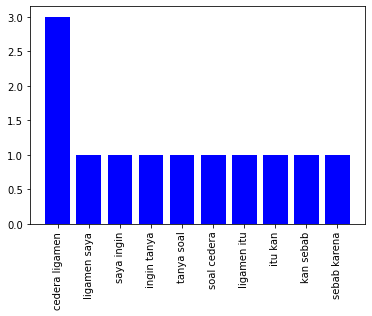

Similar Questions
{'kaki nyeri': 1, 'nyeri paska': 1, 'paska jatuh': 1, 'jatuh saya': 1, 'saya pernah': 1, 'pernah jatuh': 1, 'jatuh dan': 1, 'dan kata': 1, 'kata dokter': 1, 'dokter umum': 1, 'umum itu': 1, 'itu akibat': 1, 'akibat otot': 1, 'otot ligamen': 1, 'ligamen saya': 1, 'saya yang': 1, 'yang kira': 1, 'kira masalah': 1, 'masalah baik': 1, 'baik saya': 1, 'saya periksa': 1, 'periksa ke': 1, 'ke dokter': 1, 'dokter spesialis': 1, 'spesialis apa': 1, 'apa karena': 1, 'karena hal': 1, 'hal itu': 1, 'itu sebab': 1, 'sebab kaki': 1, 'kaki saya': 1, 'saya sering': 1, 'sering nyeri': 1}


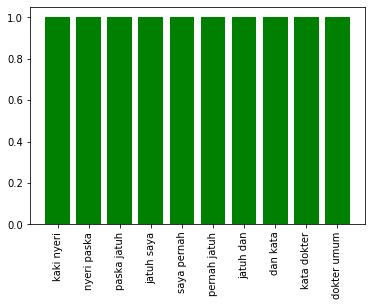

In [556]:
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(2, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(2, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Bigram Overlap

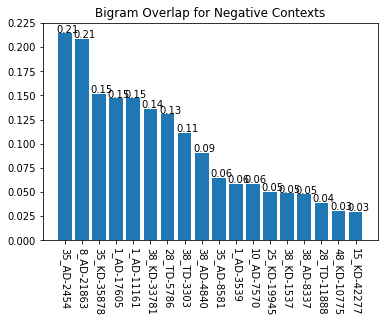

In [557]:
bigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(2, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(2, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
bigram_overlap = dict(sorted(bigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(bigram_overlap.keys()), list(bigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Bigram Overlap for Negative Contexts")
for i, v in enumerate(list(bigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Trigram Analysis

Question
{'cara atas pusing': 1, 'atas pusing lemas': 1, 'pusing lemas dan': 1, 'lemas dan hidung': 1, 'dan hidung air': 1, 'hidung air malam': 1, 'air malam dok': 1, 'malam dok sejak': 1, 'dok sejak hari': 1, 'sejak hari yang': 1, 'hari yang lalu': 1, 'yang lalu badan': 1, 'lalu badan saya': 1, 'badan saya pusing': 1, 'saya pusing dan': 1, 'pusing dan lemas': 1, 'dan lemas hari': 1, 'lemas hari ini': 1, 'hari ini hidung': 1, 'ini hidung saya': 1, 'hidung saya keluar': 1, 'saya keluar ingus': 1, 'keluar ingus terus': 1, 'ingus terus terus': 1, 'terus terus bagaimana': 1, 'terus bagaimana cara': 1, 'bagaimana cara atas': 1, 'cara atas nya': 1, 'atas nya ya': 1, 'nya ya dok': 1, 'ya dok terima': 1, 'dok terima kasih': 1, 'terima kasih belum': 1}


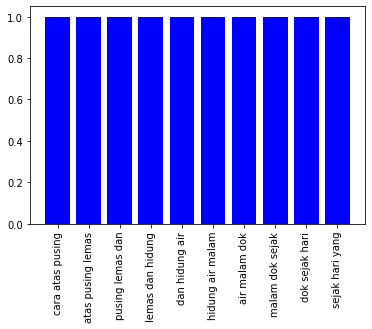

Similar Questions
{'buang kotor hidung': 2, 'selamat siang dok': 2, 'siang dok saya': 2, 'dok saya mau': 2, 'saya mau tanya': 2, 'dok terima kasih': 2, 'sampai sakit kepala': 2, 'hidung keluar darah': 1, 'keluar darah saat': 1, 'darah saat buang': 1, 'saat buang kotor': 1, 'kotor hidung selamat': 1, 'hidung selamat siang': 1, 'mau tanya saya': 1, 'tanya saya kan': 1, 'saya kan sedang': 1, 'kan sedang flu': 1, 'sedang flu dan': 1, 'flu dan batuk': 1, 'dan batuk kenapa': 1, 'batuk kenapa ya': 1, 'kenapa ya saat': 1, 'ya saat saya': 1, 'saat saya buang': 1, 'saya buang kotor': 1, 'kotor hidung ingus': 1, 'hidung ingus kadang': 1, 'ingus kadang keluar': 1, 'kadang keluar darah': 1, 'keluar darah dan': 1, 'darah dan kotor': 1, 'dan kotor hidung': 1, 'kotor hidung yang': 1, 'hidung yang biasa': 1, 'yang biasa lendir': 1, 'biasa lendir bisa': 1, 'lendir bisa jadi': 1, 'bisa jadi kerak': 1, 'jadi kerak saat': 1, 'kerak saat jadi': 1, 'saat jadi kerak': 1, 'jadi kerak saya': 1, 'kerak saya agak

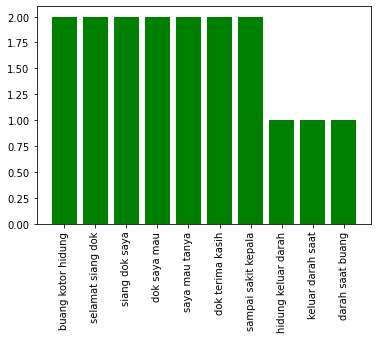



Question
{'darah atau flek': 1, 'atau flek saat': 1, 'flek saat awal': 1, 'saat awal hamil': 1, 'awal hamil assalamualaikum': 1, 'hamil assalamualaikum dok': 1, 'assalamualaikum dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya apakah': 1, 'tanya apakah tiap': 1, 'apakah tiap wanita': 1, 'tiap wanita jika': 1, 'wanita jika hamil': 1, 'jika hamil muda': 1, 'hamil muda biasa': 1, 'muda biasa keluar': 1, 'biasa keluar darah': 1, 'keluar darah flek': 1, 'darah flek atau': 1, 'flek atau hanya': 1, 'atau hanya bagi': 1, 'hanya bagi saja': 1}


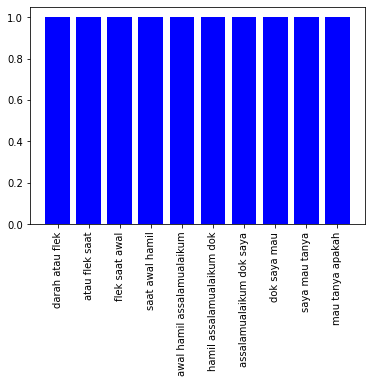

Similar Questions
{'keluar darah telah': 1, 'darah telah haid': 1, 'telah haid siang': 1, 'haid siang dok': 1, 'siang dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya saya': 1, 'tanya saya itu': 1, 'saya itu sudah': 1, 'itu sudah selesai': 1, 'sudah selesai haid': 1, 'selesai haid tetapi': 1, 'haid tetapi telah': 1, 'tetapi telah hari': 1, 'telah hari kemudian': 1, 'hari kemudian saya': 1, 'kemudian saya kok': 1, 'saya kok keluar': 1, 'kok keluar flek': 1, 'keluar flek seperti': 1, 'flek seperti haid': 1, 'seperti haid warna': 1, 'haid warna coklat': 1, 'warna coklat hitam': 1, 'coklat hitam sedikit': 1, 'hitam sedikit hari': 1, 'sedikit hari kemudian': 1, 'hari kemudian seperti': 1, 'kemudian seperti haid': 1, 'seperti haid keluar': 1, 'haid keluar banyak': 1, 'keluar banyak apakah': 1, 'banyak apakah ada': 1, 'apakah ada sakit': 1, 'ada sakit di': 1, 'sakit di rahim': 1, 'di rahim saya': 1, 'rahim saya dok': 1, 'saya dok atau': 1, 'dok atau memang': 1, 'atau memang in

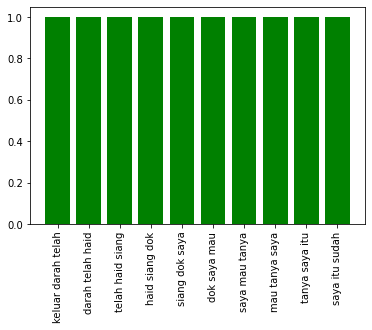



Question
{'jantung debar apakah': 1, 'debar apakah tanda': 1, 'apakah tanda ada': 1, 'tanda ada masalah': 1, 'ada masalah jantung': 1, 'masalah jantung dear': 1, 'jantung dear dokter': 1, 'dear dokter jantung': 1, 'dokter jantung saya': 1, 'jantung saya suka': 1, 'saya suka rasa': 1, 'suka rasa seperti': 1, 'rasa seperti darah': 1, 'seperti darah tidak': 1, 'darah tidak lancar': 1, 'tidak lancar lama': 1, 'lancar lama ini': 1, 'lama ini tidak': 1, 'ini tidak ada': 1, 'tidak ada keluh': 1, 'ada keluh apa': 1, 'keluh apa dan': 1, 'apa dan sehat': 1, 'dan sehat saya': 1, 'sehat saya relatif': 1, 'saya relatif prima': 1, 'relatif prima apakah': 1, 'prima apakah saya': 1, 'apakah saya ada': 1, 'saya ada sakit': 1, 'ada sakit jantung': 1, 'sakit jantung mohon': 1, 'jantung mohon informasi': 1, 'mohon informasi dok': 1, 'informasi dok terima': 1, 'dok terima kasih': 1, 'terima kasih atas': 1, 'kasih atas atensi': 1, 'atas atensi salam': 1, 'atensi salam hormat': 1}


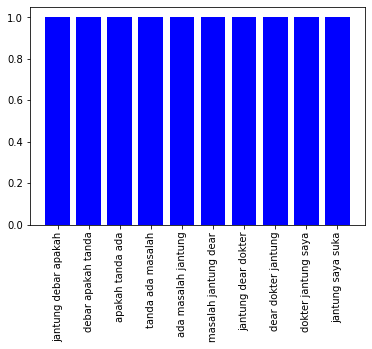

Similar Questions
{'jantung kadang asa': 1, 'kadang asa tusuk': 1, 'asa tusuk dok': 1, 'tusuk dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya apakah': 1, 'tanya apakah bila': 1, 'apakah bila jantung': 1, 'bila jantung seperti': 1, 'jantung seperti tusuk': 1, 'seperti tusuk itu': 1, 'tusuk itu arti': 1, 'itu arti sakit': 1, 'arti sakit jantung': 1, 'sakit jantung dok': 1}


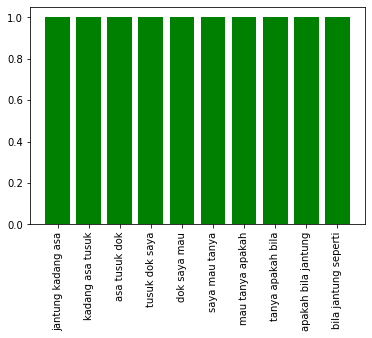



Question
{'makan mi instan': 2, 'bahaya makan mi': 1, 'mi instan tiap': 1, 'instan tiap hari': 1, 'tiap hari dok': 1, 'hari dok bahaya': 1, 'dok bahaya tidak': 1, 'bahaya tidak saya': 1, 'tidak saya selalu': 1, 'saya selalu makan': 1, 'selalu makan mi': 1, 'mi instan hampir': 1, 'instan hampir tiap': 1, 'hampir tiap hari': 1, 'tiap hari atau': 1, 'hari atau terkadang': 1, 'atau terkadang saya': 1, 'terkadang saya konsumsi': 1, 'saya konsumsi hari': 1, 'konsumsi hari bisa': 1, 'hari bisa dua': 1, 'bisa dua sampai': 1, 'dua sampai tiga': 1, 'sampai tiga kali': 1, 'tiga kali maklum': 1, 'kali maklum dok': 1, 'maklum dok saya': 1, 'dok saya anak': 1, 'saya anak kost': 1, 'anak kost rantau': 1, 'kost rantau dari': 1, 'rantau dari seberang': 1}


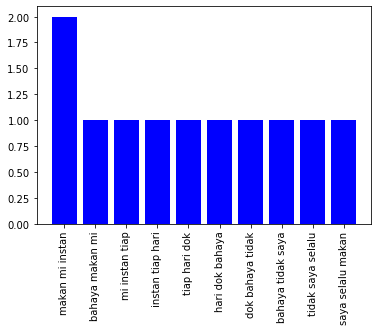

Similar Questions
{'tidak boleh konsumsi': 2, 'konsumsi mi instan': 1, 'mi instan untuk': 1, 'instan untuk ibu': 1, 'untuk ibu hamil': 1, 'ibu hamil hallo': 1, 'hamil hallo dok': 1, 'hallo dok apakah': 1, 'dok apakah benar': 1, 'apakah benar saat': 1, 'benar saat hamil': 1, 'saat hamil tidak': 1, 'hamil tidak boleh': 1, 'boleh konsumsi mie': 1, 'konsumsi mie baik': 1, 'mie baik itu': 1, 'baik itu mie': 1, 'itu mie instant': 1, 'mie instant mie': 1, 'instant mie ayam': 1, 'mie ayam atau': 1, 'ayam atau mie': 1, 'atau mie yang': 1, 'mie yang lain': 1, 'yang lain dan': 1, 'lain dan apakah': 1, 'dan apakah benar': 1, 'apakah benar tidak': 1, 'benar tidak boleh': 1, 'boleh konsumsi makan': 1, 'konsumsi makan atau': 1, 'makan atau minum': 1, 'atau minum dingin': 1, 'minum dingin seperti': 1, 'dingin seperti eskrim': 1, 'seperti eskrim atau': 1, 'eskrim atau air': 1, 'atau air es': 1, 'air es lalu': 1, 'es lalu apakah': 1, 'lalu apakah anjur': 1, 'apakah anjur konsumsi': 1, 'anjur konsumsi ya

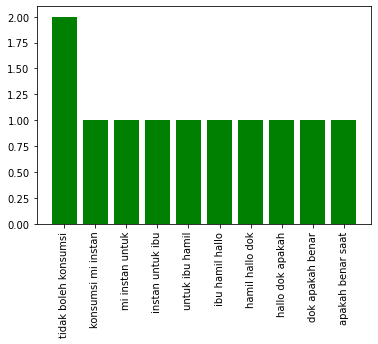



Question
{'lendir dalam tenggoroka': 1, 'dalam tenggoroka yang': 1, 'tenggoroka yang sudah': 1, 'yang sudah lama': 1, 'sudah lama saya': 1, 'lama saya sudah': 1, 'saya sudah lebih': 1, 'sudah lebih beberapa': 1, 'lebih beberapa bulan': 1, 'beberapa bulan dok': 1, 'bulan dok selalu': 1, 'dok selalu keluar': 1, 'selalu keluar lendir': 1, 'keluar lendir dari': 1, 'lendir dari tenggorok': 1, 'dari tenggorok dan': 1, 'tenggorok dan asa': 1, 'dan asa skl': 1, 'asa skl kalau': 1, 'skl kalau tenggorok': 1, 'kalau tenggorok ada': 1, 'tenggorok ada lendir': 1, 'ada lendir saya': 1, 'lendir saya tidak': 1, 'saya tidak lagi': 1, 'tidak lagi flu': 1, 'lagi flu dan': 1, 'flu dan beberapa': 1, 'dan beberapa bulan': 1, 'beberapa bulan tidak': 1, 'bulan tidak pernah': 1, 'tidak pernah flu': 1, 'pernah flu dan': 1, 'flu dan ada': 1, 'dan ada bau': 1, 'ada bau sengat': 1, 'bau sengat yang': 1, 'sengat yang keluar': 1, 'yang keluar dari': 1, 'keluar dari tenggorok': 1, 'dari tenggorok itu': 1, 'tenggoro

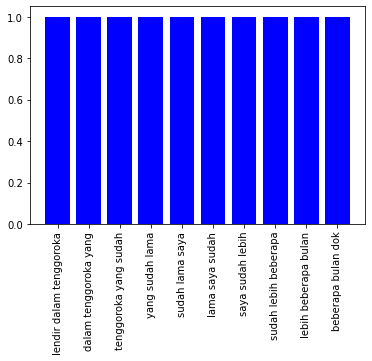

Similar Questions
{'lendir hidung darah': 1, 'hidung darah saat': 1, 'darah saat sedang': 1, 'saat sedang derita': 1, 'sedang derita flu': 1, 'derita flu dok': 1, 'flu dok saya': 1, 'dok saya punya': 1, 'saya punya masalah': 1, 'punya masalah saya': 1, 'masalah saya kena': 1, 'saya kena flu': 1, 'kena flu dan': 1, 'flu dan saat': 1, 'dan saat ingin': 1, 'saat ingin keluar': 1, 'ingin keluar lendir': 1, 'keluar lendir sebut': 1, 'lendir sebut lendir': 1, 'sebut lendir di': 1, 'lendir di lubang': 1, 'di lubang belah': 1, 'lubang belah kiri': 1, 'belah kiri keluar': 1, 'kiri keluar lendir': 1, 'keluar lendir warna': 1, 'lendir warna merah': 1, 'warna merah seperti': 1, 'merah seperti darab': 1, 'seperti darab beda': 1, 'darab beda dengan': 1, 'beda dengan lubang': 1, 'dengan lubang belah': 1, 'lubang belah kanan': 1, 'belah kanan mengapa': 1, 'kanan mengapa dok': 1, 'mengapa dok apakah': 1, 'dok apakah ada': 1, 'apakah ada masalah': 1}


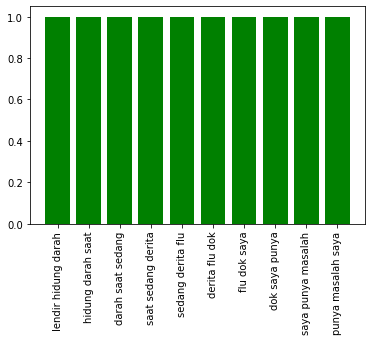



Question
{'operasi batu kandung': 2, 'batu kandung kemih': 2, 'keluar lalu luka': 2, 'lalu luka operasi': 2, 'keluh pasca operasi': 1, 'pasca operasi batu': 1, 'kandung kemih selamat': 1, 'kemih selamat siang': 1, 'selamat siang dok': 1, 'siang dok nama': 1, 'dok nama saya': 1, 'nama saya john': 1, 'saya john usia': 1, 'john usia tahun': 1, 'usia tahun saya': 1, 'tahun saya barusaja': 1, 'saya barusaja laku': 1, 'barusaja laku operasi': 1, 'laku operasi batu': 1, 'kandung kemih akan': 1, 'kemih akan tetapi': 1, 'akan tetapi sekarang': 1, 'tetapi sekarang urin': 1, 'sekarang urin selalu': 1, 'urin selalu keluar': 1, 'selalu keluar lalu': 1, 'luka operasi tanya': 1, 'operasi tanya saya': 1, 'tanya saya apakah': 1, 'saya apakah luka': 1, 'apakah luka operasi': 1, 'luka operasi saya': 1, 'operasi saya dapat': 1, 'saya dapat di': 1, 'dapat di sembuh': 1, 'di sembuh dengan': 1, 'sembuh dengan urin': 1, 'dengan urin yang': 1, 'urin yang selalu': 1, 'yang selalu basah': 1, 'selalu basah dan'

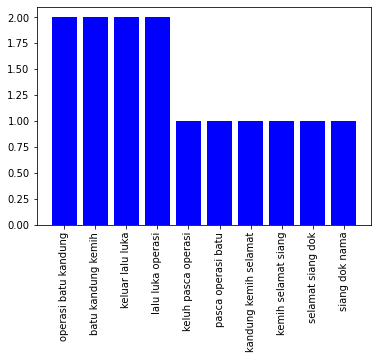

Similar Questions
{'infeksi kandung kemih': 4, 'oh ya dok': 2, 'ya dok maaf': 2, 'dok maaf yah': 2, 'maaf yah kalau': 2, 'yah kalau bolak': 2, 'kalau bolak balik': 2, 'bolak balik tanya': 2, 'balik tanya kalau': 2, 'tanya kalau digoogle': 2, 'kalau digoogle kan': 2, 'digoogle kan infeksi': 2, 'kan infeksi kandung': 2, 'kandung kemih itu': 2, 'kemih itu kencing': 2, 'itu kencing terus': 2, 'kencing terus tetapi': 2, 'terus tetapi lah': 2, 'tetapi lah kalau': 2, 'lah kalau saya': 2, 'kalau saya ini': 2, 'saya ini bolak': 2, 'dok apa infeksi': 2, 'apa infeksi kandung': 2, 'ini bolak oh': 1, 'bolak oh ya': 1, 'ini bolak balik': 1, 'bolak balik kencing': 1, 'balik kencing tetapi': 1, 'kencing tetapi kalau': 1, 'tetapi kalau habis': 1, 'kalau habis minum': 1, 'habis minum itu': 1, 'minum itu kencing': 1, 'itu kencing cukup': 1, 'kencing cukup banyak': 1, 'cukup banyak dok': 1, 'banyak dok terus': 1, 'dok terus balik': 1, 'terus balik lagi': 1, 'balik lagi jadi': 1, 'lagi jadi kalau': 1, 'jad

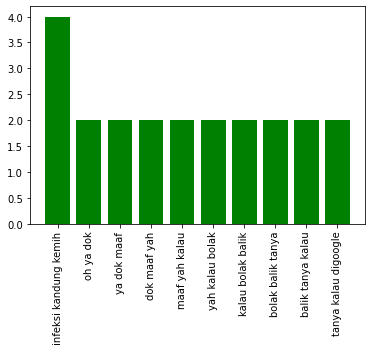



Question
{'telapak tangan saya': 2, 'tangan gatal dan': 1, 'gatal dan lapis': 1, 'dan lapis kulit': 1, 'lapis kulit luar': 1, 'kulit luar kelupas': 1, 'luar kelupas dok': 1, 'kelupas dok telapak': 1, 'dok telapak tangan': 1, 'tangan saya ini': 1, 'saya ini banyak': 1, 'ini banyak bintik': 1, 'banyak bintik merah': 1, 'bintik merah terus': 1, 'merah terus kulit': 1, 'terus kulit luar': 1, 'kulit luar telapak': 1, 'luar telapak tangan': 1, 'telapak tangan kelupas': 1, 'tangan kelupas sudah': 1, 'kelupas sudah kali': 1, 'sudah kali saya': 1, 'kali saya alami': 1, 'saya alami ini': 1, 'alami ini dok': 1, 'ini dok dulu': 1, 'dok dulu sembuh': 1, 'dulu sembuh bulan': 1, 'sembuh bulan lebih': 1, 'bulan lebih saya': 1, 'lebih saya mau': 1, 'saya mau tanya': 1, 'mau tanya solusi': 1, 'tanya solusi dari': 1, 'solusi dari dokter': 1, 'dari dokter dan': 1, 'dokter dan sakit': 1, 'dan sakit apa': 1, 'sakit apa yang': 1, 'apa yang ada': 1, 'yang ada di': 1, 'ada di telapak': 1, 'di telapak tangan'

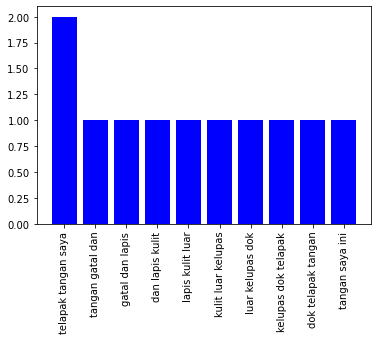

Similar Questions
{'dok saya mau': 2, 'saya mau tanya': 2, 'kenapa ya dok': 2, 'kulit kaki gatal': 1, 'kaki gatal dan': 1, 'gatal dan bengkak': 1, 'dan bengkak mau': 1, 'bengkak mau nnya': 1, 'mau nnya jempol': 1, 'nnya jempol kaki': 1, 'jempol kaki saya': 1, 'kaki saya awal': 1, 'saya awal nya': 1, 'awal nya cuma': 1, 'nya cuma gatal': 1, 'cuma gatal biasa': 1, 'gatal biasa telah': 1, 'biasa telah saya': 1, 'telah saya garuk': 1, 'saya garuk bengkak': 1, 'garuk bengkak dan': 1, 'bengkak dan ada': 1, 'dan ada bentol': 1, 'ada bentol di': 1, 'bentol di lapis': 1, 'di lapis kulit': 1, 'lapis kulit nya': 1, 'kulit nya bagaimana': 1, 'nya bagaimana ya': 1, 'bagaimana ya dok': 1, 'ya dok solusi': 1, 'dok solusi nya': 1, 'solusi nya trmksih': 1, 'kulit tangan gatal': 1, 'tangan gatal dan': 1, 'gatal dan air': 1, 'dan air sore': 1, 'air sore dok': 1, 'sore dok maaf': 1, 'dok maaf dok': 1, 'maaf dok saya': 1, 'mau tanya sudah': 1, 'tanya sudah mggu': 1, 'sudah mggu ini': 1, 'mggu ini saya': 1,

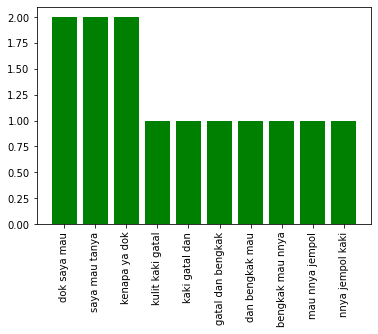



Question
{'sudah tidak mau': 2, 'mau minum susu': 2, 'minum susu formula': 2, 'beri susu formula': 2, 'saya tinggal kerja': 2, 'bayi sudah tidak': 1, 'tidak mau minum': 1, 'susu formula sudah': 1, 'formula sudah minggu': 1, 'sudah minggu ini': 1, 'minggu ini dok': 1, 'ini dok bayi': 1, 'dok bayi saya': 1, 'bayi saya bulan': 1, 'saya bulan sudah': 1, 'bulan sudah tidak': 1, 'tidak mau beri': 1, 'mau beri susu': 1, 'susu formula lama': 1, 'formula lama saya': 1, 'lama saya tinggal': 1, 'tinggal kerja sehingga': 1, 'kerja sehingga hanya': 1, 'sehingga hanya minum': 1, 'hanya minum asi': 1, 'minum asi saya': 1, 'asi saya belum': 1, 'saya belum saya': 1, 'belum saya berangkat': 1, 'saya berangkat kerja': 1, 'berangkat kerja dan': 1, 'kerja dan telah': 1, 'dan telah saya': 1, 'telah saya kerja': 1, 'saya kerja antara': 1, 'kerja antara waktu': 1, 'antara waktu sebut': 1, 'waktu sebut kerja': 1, 'sebut kerja keluarga': 1, 'kerja keluarga hanya': 1, 'keluarga hanya beri': 1, 'hanya beri air'

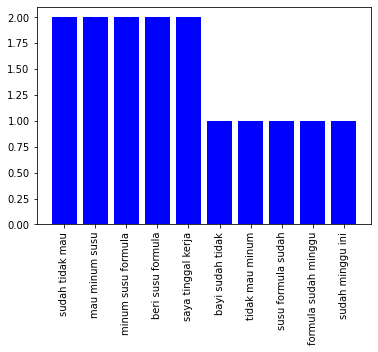

Similar Questions
{'susu formula untuk': 2, 'ganti susu formula': 2, 'masuk kategori susu': 2, 'kategori susu formula': 2, 'susu formula itu': 2, 'bayi baru lahir': 1, 'baru lahir beri': 1, 'lahir beri susu': 1, 'beri susu formula': 1, 'susu formula selamat': 1, 'formula selamat malam': 1, 'selamat malam dok': 1, 'malam dok anak': 1, 'dok anak saya': 1, 'anak saya umur': 1, 'saya umur baru': 1, 'umur baru hari': 1, 'baru hari tetapi': 1, 'hari tetapi belum': 1, 'tetapi belum mau': 1, 'belum mau minum': 1, 'mau minum asi': 1, 'minum asi dari': 1, 'asi dari ibu': 1, 'dari ibu kenapa': 1, 'ibu kenapa ya': 1, 'kenapa ya dok': 1, 'ya dok kemarin': 1, 'dok kemarin pas': 1, 'kemarin pas baru': 1, 'pas baru lahir': 1, 'baru lahir dan': 1, 'lahir dan pulang': 1, 'dan pulang ke': 1, 'pulang ke rumah': 1, 'ke rumah bayi': 1, 'rumah bayi saya': 1, 'bayi saya belum': 1, 'saya belum sekali': 1, 'belum sekali pun': 1, 'sekali pun minum': 1, 'pun minum asi': 1, 'minum asi dan': 1, 'asi dan asi': 1, 'd

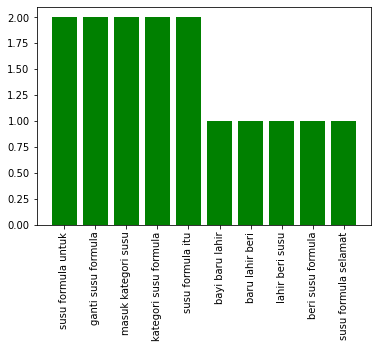



Question
{'cedera ligamen saya': 1, 'ligamen saya ingin': 1, 'saya ingin tanya': 1, 'ingin tanya soal': 1, 'tanya soal cedera': 1, 'soal cedera ligamen': 1, 'cedera ligamen itu': 1, 'ligamen itu kan': 1, 'itu kan sebab': 1, 'kan sebab karena': 1, 'sebab karena bentur': 1, 'karena bentur celaka': 1, 'bentur celaka atau': 1, 'celaka atau olahraga': 1, 'atau olahraga berat': 1, 'olahraga berat ya': 1, 'berat ya dok': 1, 'ya dok saya': 1, 'dok saya penasaran': 1, 'saya penasaran apakah': 1, 'penasaran apakah cedera': 1, 'apakah cedera seperti': 1, 'cedera seperti itu': 1, 'seperti itu bisa': 1, 'itu bisa cegah': 1, 'bisa cegah atau': 1, 'cegah atau bisa': 1, 'atau bisa tahu': 1, 'bisa tahu belum': 1, 'tahu belum seperti': 1, 'belum seperti tubuh': 1, 'seperti tubuh tidak': 1, 'tubuh tidak fit': 1, 'tidak fit bisa': 1, 'fit bisa cedera': 1, 'bisa cedera ligamen': 1, 'cedera ligamen atau': 1, 'ligamen atau bagaimana': 1, 'atau bagaimana apa': 1, 'bagaimana apa bisa': 1, 'apa bisa deteksi':

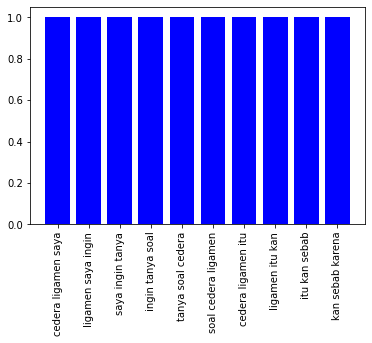

Similar Questions
{'kaki nyeri paska': 1, 'nyeri paska jatuh': 1, 'paska jatuh saya': 1, 'jatuh saya pernah': 1, 'saya pernah jatuh': 1, 'pernah jatuh dan': 1, 'jatuh dan kata': 1, 'dan kata dokter': 1, 'kata dokter umum': 1, 'dokter umum itu': 1, 'umum itu akibat': 1, 'itu akibat otot': 1, 'akibat otot ligamen': 1, 'otot ligamen saya': 1, 'ligamen saya yang': 1, 'saya yang kira': 1, 'yang kira masalah': 1, 'kira masalah baik': 1, 'masalah baik saya': 1, 'baik saya periksa': 1, 'saya periksa ke': 1, 'periksa ke dokter': 1, 'ke dokter spesialis': 1, 'dokter spesialis apa': 1, 'spesialis apa karena': 1, 'apa karena hal': 1, 'karena hal itu': 1, 'hal itu sebab': 1, 'itu sebab kaki': 1, 'sebab kaki saya': 1, 'kaki saya sering': 1, 'saya sering nyeri': 1}


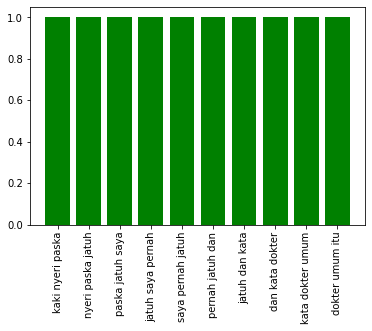

In [558]:
for i in range(len(text_error)):
    if len(text_error[i]) <= 0:
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(3, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(3, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Trigram Overlap

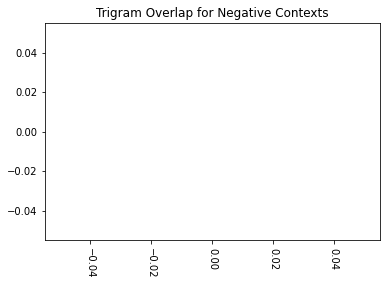

In [559]:
trigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(3, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(3, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
trigram_overlap = dict(sorted(trigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(trigram_overlap.keys()), list(trigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Trigram Overlap for Negative Contexts")
for i, v in enumerate(list(trigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Vector Embedding Projection

In [560]:
import pickle

In [561]:
#passage embedding load

passage_embeddings = dict()
with (open("../Dataset/Embeddings/passage_embeddings_syifa-tthealth_full.tsv", "rb")) as openfile:
    while True:
        try:
            passage_lst = pickle.load(openfile)
            for pid, p_vector in passage_lst:
                passage_embeddings[pid] = p_vector
        except EOFError:
            break


In [562]:
#question embedding load

query_embeddings = dict()
with (open("../Dataset/Embeddings/question_embeddings_syifa-tthealth_full.tsv", "rb")) as openfile:
    while True:
        try:
            query_lst = pickle.load(openfile)
            for qid, q_vector in query_lst:
                query_embeddings[qid] = q_vector
        except EOFError:
            break


/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


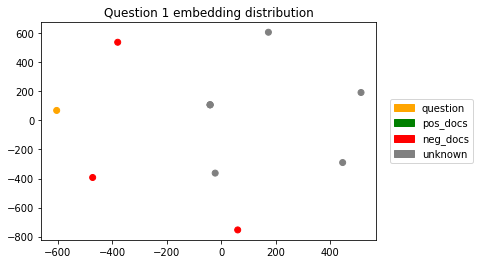

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


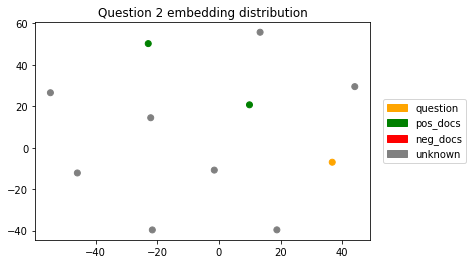

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


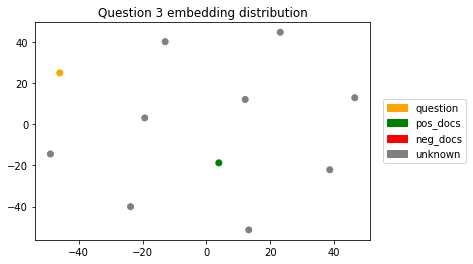

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


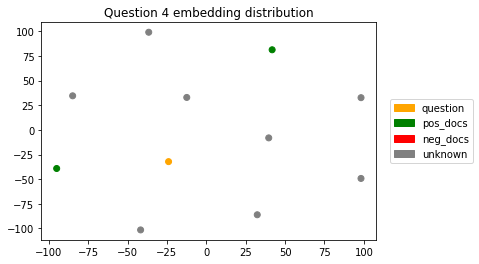

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


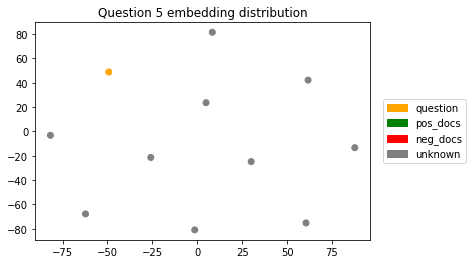

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


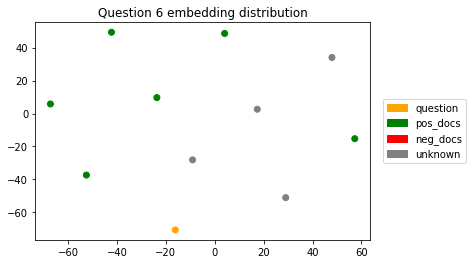

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


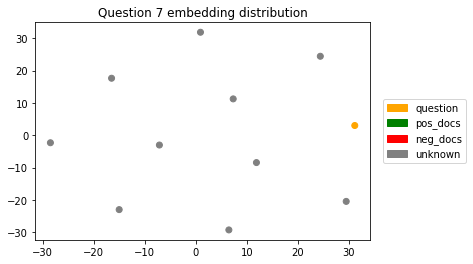

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


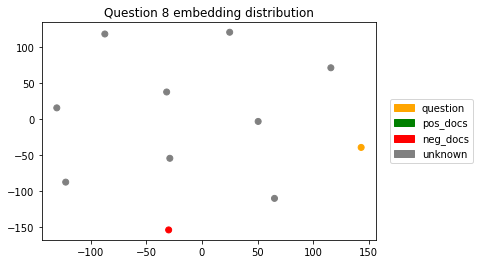

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


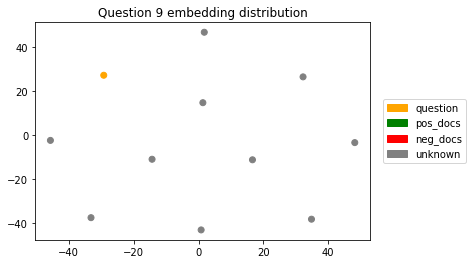

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


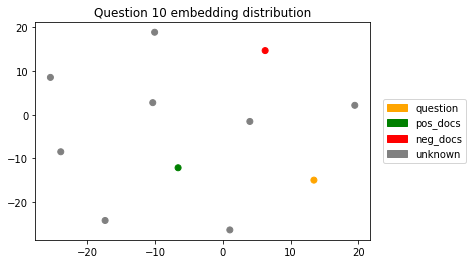

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


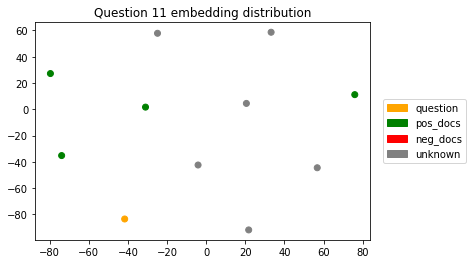

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


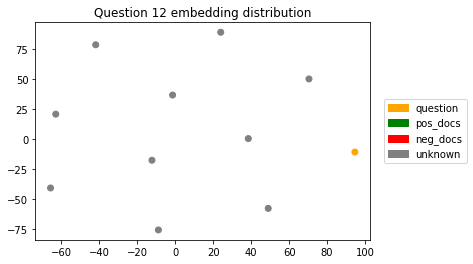

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


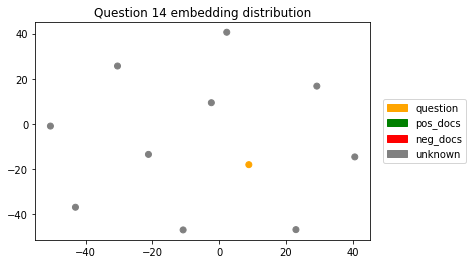

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


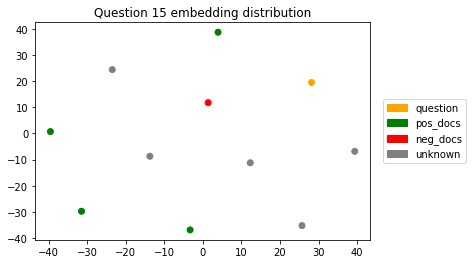

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


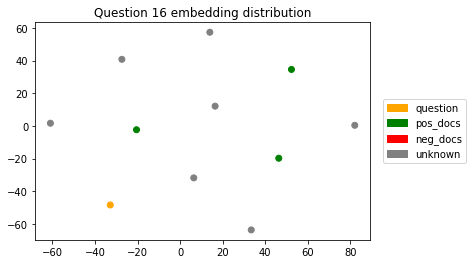

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


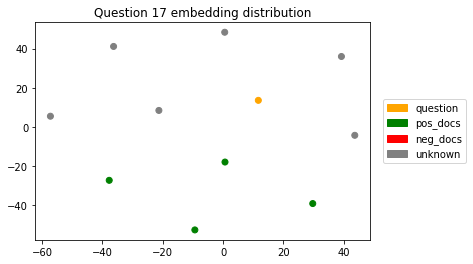

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


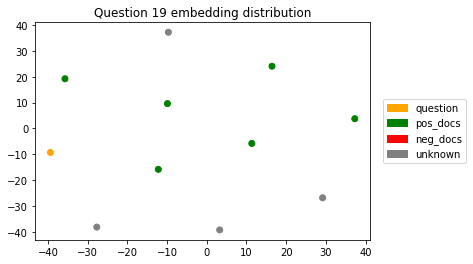

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


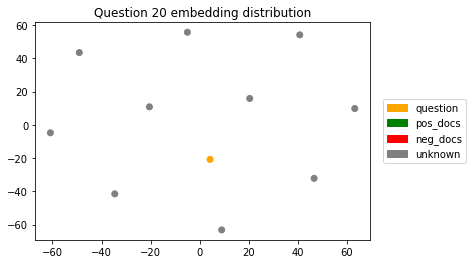

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


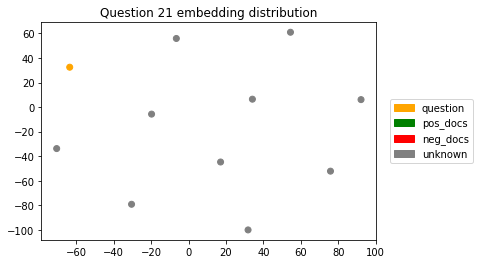

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


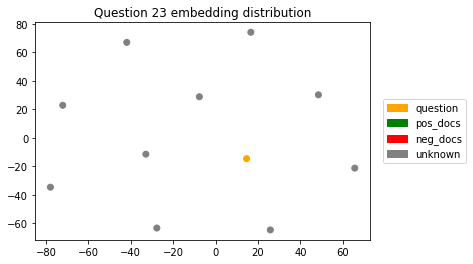

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


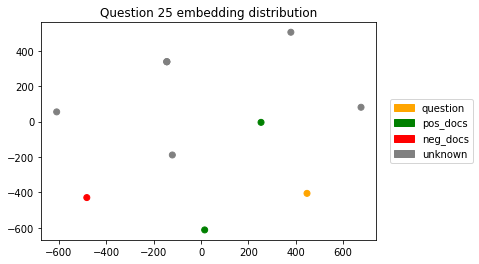

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


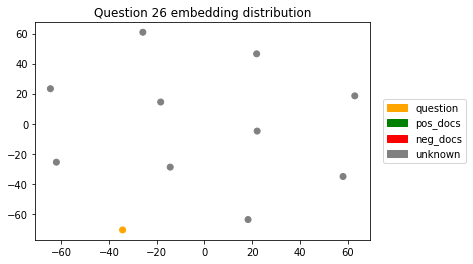

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


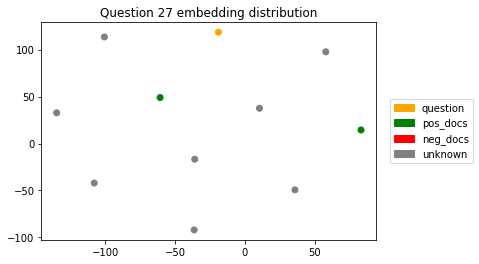

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


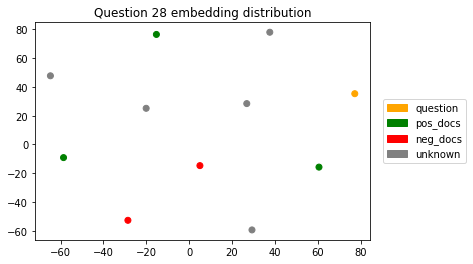

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


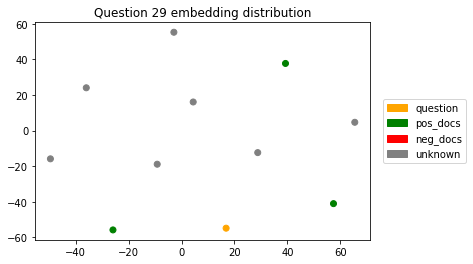

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


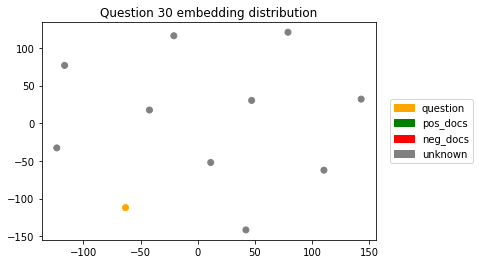

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


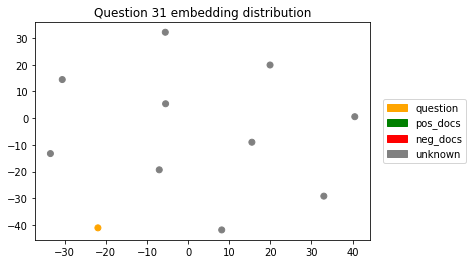

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


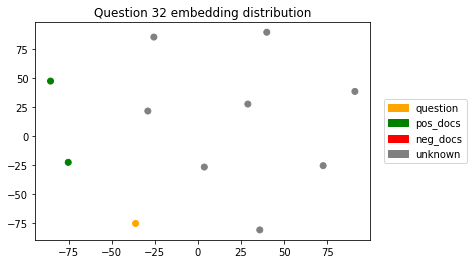

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


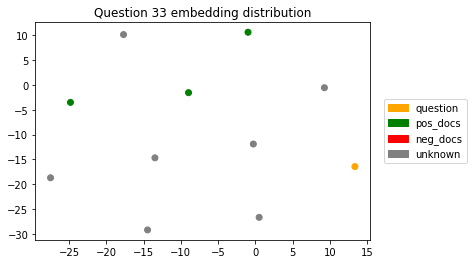

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


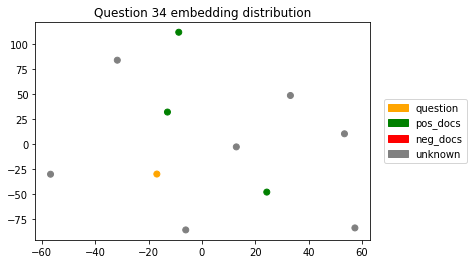

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


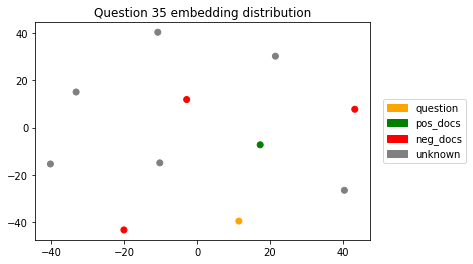

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


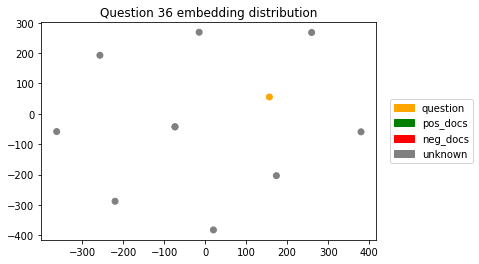

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


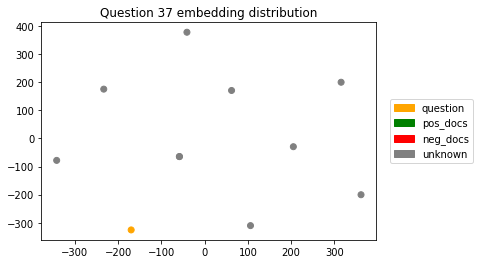

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


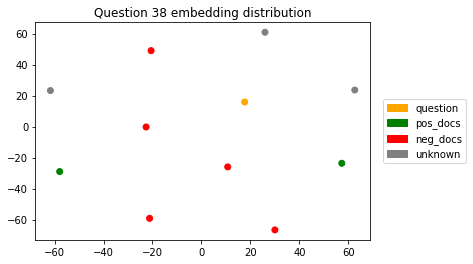

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


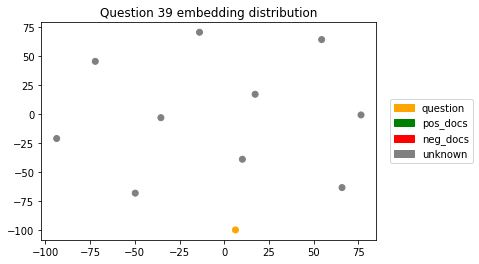

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


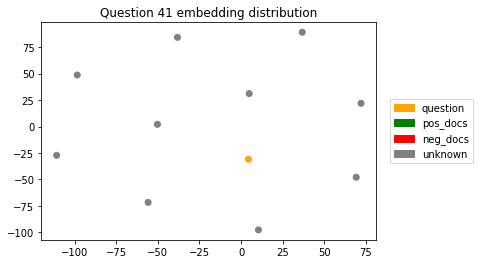

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


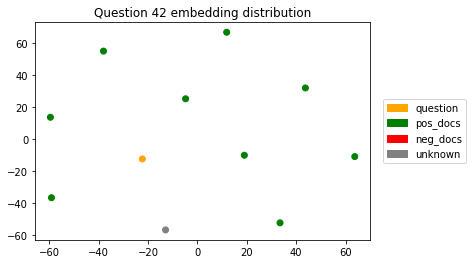

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


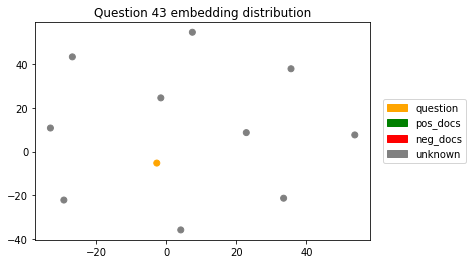

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


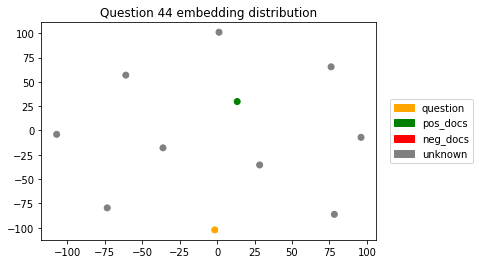

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


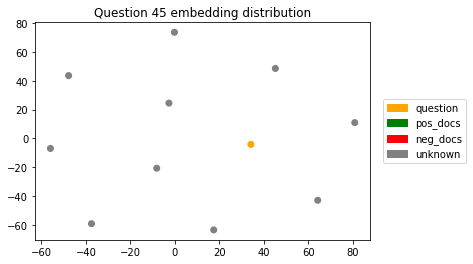

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


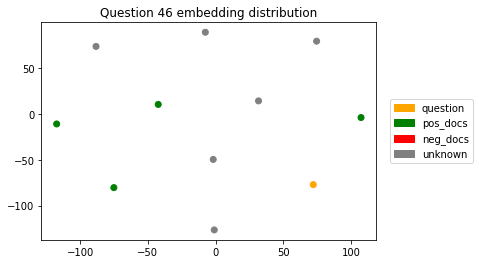

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


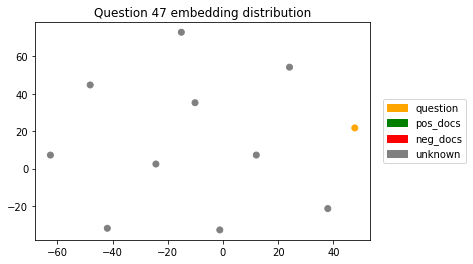

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


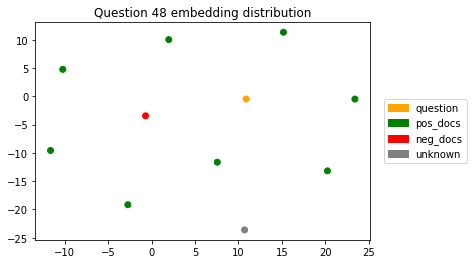

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


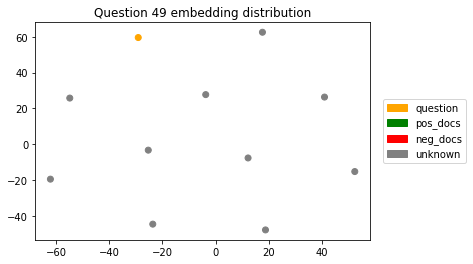

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


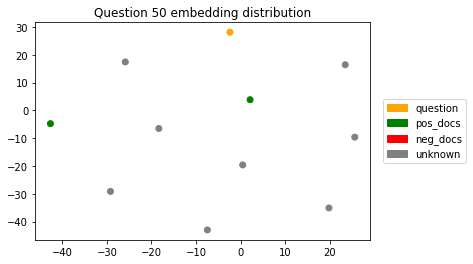

In [563]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import numpy as np

orange_patch = mpatches.Patch(color='orange', label='question')
green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [orange_patch, green_patch, red_patch, grey_patch]
for idx,row in enumerate(actual_data):    
    values = [0]
    colors = ListedColormap(['orange','green','red', 'grey'])
    qid = row['question']['id']
    q_vector = query_embeddings[qid]
    q_vector = q_vector.reshape(-1, len(q_vector))
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        p_vector = passage_embeddings[pid]
        p_vector = p_vector.reshape(-1, len(p_vector))
        q_vector = np.concatenate((q_vector, p_vector), axis=0)
        color = 1 if pid in gold_ids[idx] else 2
        color = 3 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    if len(q_vector) < 2:
        continue
    q_compressed = TSNE(n_components=2, learning_rate='auto',init='pca', random_state=42).fit_transform(q_vector)

    plt.title(f"Question {qid} embedding distribution")
    scatter = plt.scatter(q_compressed[:,0], q_compressed[:,1], c=values, cmap=colors)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()

## BM25 Score vs DPR Score

We expect the graphic will be inversely linear because DPR similarity score has negative correlation with BM25 similarity (While DPR smaller is better, BM25 bigger is better)

In [564]:
import xml.etree.ElementTree as ET

#gather all documents from corpus
docs = []
doc_ids = []

tree = ET.parse('../Dataset/Corpus/corpus_only_question_edited.xml')
root = tree.getroot()

for doc in root:
    for attr in doc:
        attr_type = attr.tag
        attr_content = attr.text
        if attr_type=='KELUHAN':
            content_text = ''
            for content in attr:
                if content.tag == 'JUDUL':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
                elif content.tag == 'ISI':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
            docs.append(content_text)
        elif attr_type == 'ID':
            doc_ids.append(attr_content)



In [565]:
assert len(docs)==len(doc_ids)

In [566]:
docs_map =  dict()
for idx, doc_id in enumerate(doc_ids):
    docs_map[doc_id] = docs[idx]

In [567]:
from tqdm import tqdm

avgdl = sum(len(doc) for doc in docs) / len(docs)
N = len(docs)
docs_freq_map, terms_freq_map, N, avgdl = bm25_init(docs_map)
for q_idx, q_row in tqdm(enumerate(actual_data)):
    query = q_row['question']['title']
    query  += f". {q_row['question']['text']}" if q_row['question']['text'].strip()!="" else ""
    for doc_idx, doc_row in enumerate(q_row['ctxs']):
        doc_id = doc_row['id']
        actual_data[q_idx]['ctxs'][doc_idx]['bm25_score'] = bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map,  docs_map, avgdl, N)
        

45it [00:00, 92.43it/s]


### Aggregated Plot

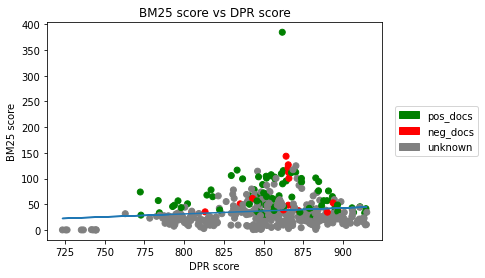

In [568]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.preprocessing import MinMaxScaler, StandardScaler

green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [green_patch, red_patch, grey_patch]
values = []
colors = ListedColormap(['green','red', 'grey'])
score_vector = []
for idx,row in enumerate(actual_data):        
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
score_vector= np.array(score_vector)


m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
plt.title(f"BM25 score vs DPR score")
plt.xlabel("DPR score")
plt.ylabel("BM25 score")
scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)

plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
plt.show()

### Per question plot

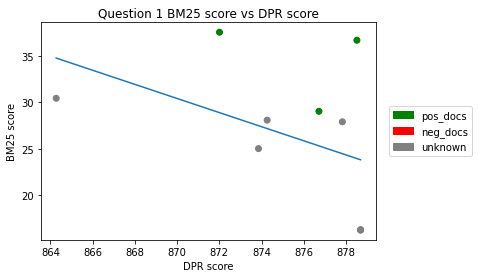

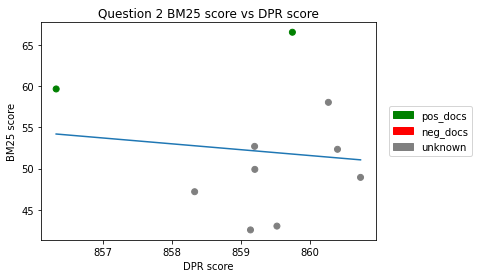

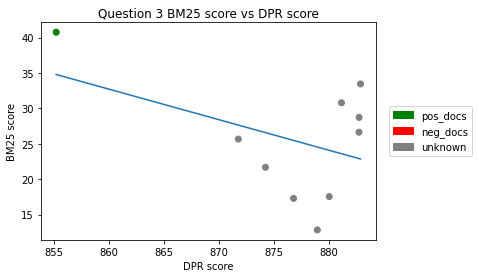

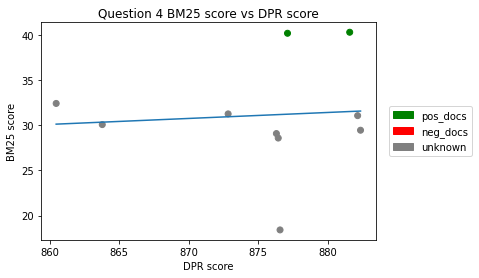

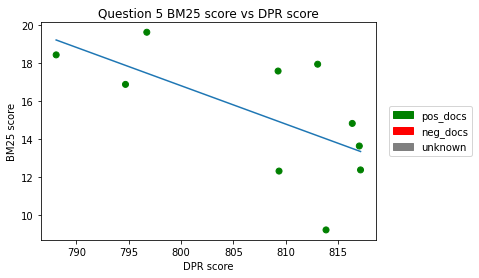

...

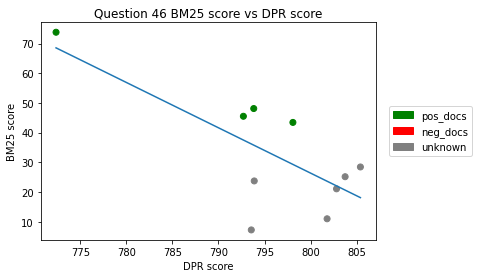

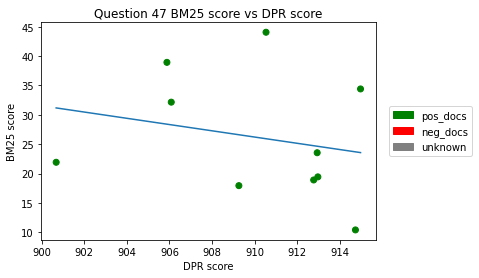

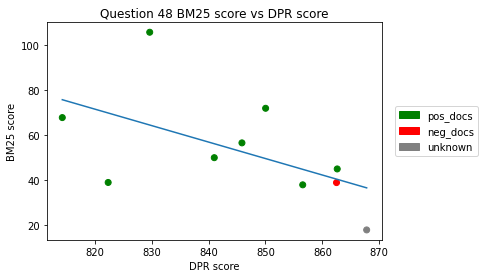

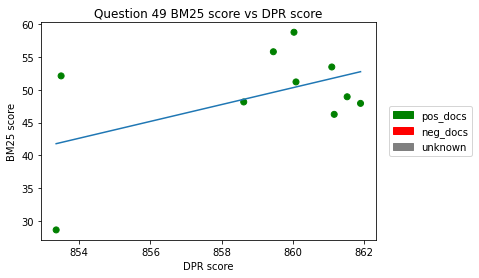

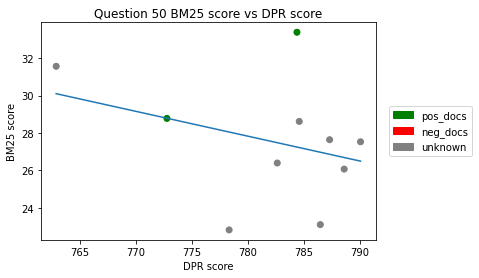

In [569]:
gradients_lst = []
for idx,row in enumerate(actual_data):
    values = []
    score_vector = []
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    score_vector= np.array(score_vector)


    m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
    plt.title(f"Question {qid} BM25 score vs DPR score")
    plt.xlabel("DPR score")
    plt.ylabel("BM25 score")
    scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)
    gradients_lst.append(m)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
    plt.show()

In [570]:
is_positive = [gradient for gradient in gradients_lst if gradient > 0]
is_negative = [gradient for gradient in gradients_lst if gradient < 0]

print(f"positive gradient count: {len(is_positive)}")
print(f"negative gradient count: {len(is_negative)}")

positive gradient count: 18
negative gradient count: 27


# D.  IndoSum Data

In [571]:
actual_data = []

with open('../Results/syifa_results_full_indosum.json', 'r') as actual_out:
    actual_data = json.load(actual_out)



In [572]:
text_error = []
i = 0
for row in actual_data:
    row_text_error = []
    for row_ctx in row['ctxs']:
        if row_ctx['id'] in neg_ids[i]:
            row_text_error.append({'id': row_ctx['id'], 'title': row_ctx['title'], 'text': row_ctx['text']})
    text_error.append(row_text_error)
    i+=1

In [573]:
for i in range(len(text_error)):
    print("Question")
    print(f"text: {actual_data[i]['question']['text']}")
    print(f"title: {actual_data[i]['question']['title']}")
    print("Similar Questions")
    print(text_error[i])
    print()
    print()

Question
text: malam dok , sejak 2 hari yang lalu badan saya pusing dan lemas hari ini hidung saya mengeluarkan ingus terus menerus , bagaimana cara mengatasi nya ya dok ? terima kasih sebelumnya
title: cara mengatasi pusing , lemas dan hidung berair
Similar Questions
[]


Question
text: selamat pagi dok , saya mau tanya kenapa telinga saya berdenging terus ya dok sudah 6 hari , saya juga sudah ke puskesmas untuk di periksa , kata dokternya telinganya kotor karena di bersihkan dengan cutton buds jadi kotorannya terdorong hingga menutupi gendang telinga , dan saya sudah dikasih obat tetes untuk menghilangkan kotoran , tetapi dengung di telinga saya tidak berkurang sama sekali dok , saran dari dokter seperti apa ?
title: telinga berdengung sebelah kiri
Similar Questions
[{'id': 'KD-41507', 'title': 'telinga sebelah kiri ada lubang kecil', 'text': 'tanya dok , saya sudah ke dokter tht , katanya telinga saya sebelah kiri ada lubang kecil . pada saat memeriksakan ke dokter telinga saya kelu

## Unigram Analysis

In [574]:
n = len(text_error)

In [575]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/mk1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Question
{'telinga': 5, 'dok': 3, 'kotor': 3, 'dengung': 2, 'dokter': 2, 'belah': 1, 'kiri': 1, 'selamat': 1, 'pagi': 1, 'denging': 1, 'ya': 1, 'puskesmas': 1, 'periksa': 1, 'sih': 1, 'cutton': 1, 'buds': 1, 'dorong': 1, 'tutup': 1, 'gendang': 1, 'kasih': 1, 'obat': 1, 'tetes': 1, 'hilang': 1, 'kurang': 1, 'saran': 1}


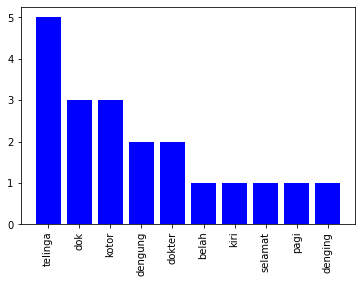

Similar Questions
{'telinga': 4, 'dokter': 4, 'obat': 4, 'cair': 3, 'belah': 2, 'kiri': 2, 'lubang': 2, 'konsumsi': 2, 'dok': 1, 'tht': 1, 'periksa': 1, 'habis': 1, 'kurang': 1, 'gantung': 1}


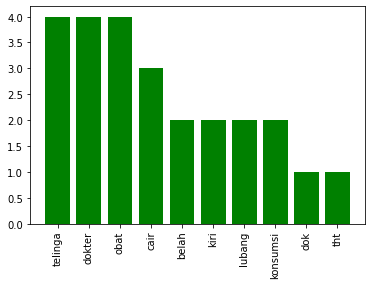



Question
{'tulang': 3, 'kering': 3, 'bentur': 3, 'sakit': 2, 'sepeda': 2, 'motor': 2, 'bahaya': 2, 'dok': 2, 'lebam': 2, 'akibat': 1, 'siang': 1, 'muncul': 1, 'bengkak': 1, 'hilang': 1, 'iring': 1, 'sentuh': 1, 'pakai': 1, 'turun': 1, 'tangga': 1, 'kaki': 1, 'terima': 1, 'kasih': 1}


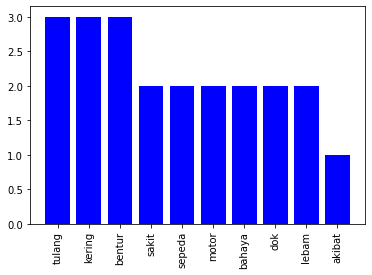

Similar Questions
{'belah': 4, 'kiri': 4, 'kaku': 3, 'luka': 3, 'alami': 2, 'tabrak': 2, 'siku': 2, 'tulang': 2, 'rahang': 2, 'kanan': 2, 'darah': 2, 'bengkak': 2, 'otot': 1, 'jatuh': 1, 'siang': 1, 'celaka': 1, 'motor': 1, 'laju': 1, 'kencang': 1, 'menyebrang': 1, 'jalan': 1, 'buka': 1, 'kepala': 1, 'pusing': 1, 'sakit': 1, 'ludah': 1, 'kering': 1, 'tetes': 1, 'segar': 1, 'nyeri': 1, 'fraktur': 1}


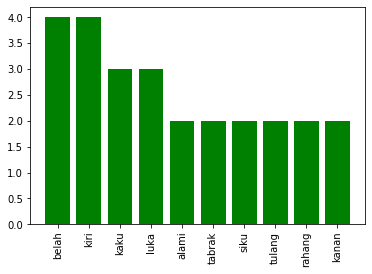



Question
{'lendir': 3, 'tenggorok': 3, 'dok': 2, 'flu': 2, 'tenggoroka': 1, 'keluar': 1, 'skl': 1, 'bau': 1, 'sengat': 1, 'sakit': 1}


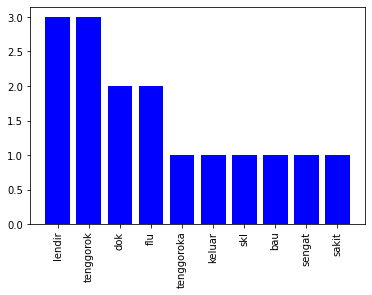

Similar Questions
{'batuk': 2, 'keluar': 2, 'lendir': 2, 'malam': 1, 'suami': 1, 'muntah': 1, 'darah': 1, 'nafas': 1, 'susah': 1, 'buang': 1, 'air': 1, 'merah': 1, 'gejala': 1}


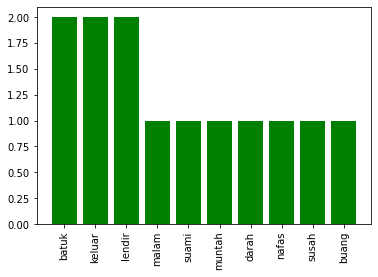



Question
{'keringat': 3, 'dok': 2, 'sakit': 1, 'sengaja': 1, 'mati': 1, 'ac': 1, 'ruang': 1, 'kerja': 1, 'batuk': 1, 'demam': 1, 'bareng': 1, 'minum': 1, 'sehat': 1}


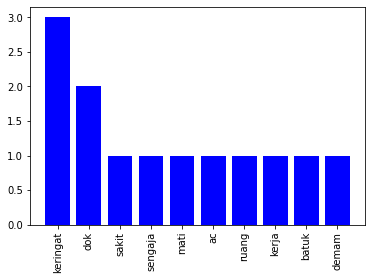

Similar Questions
{'tidur': 5, 'badan': 2, 'gemetar': 2, 'dingin': 2, 'sakit': 2, 'kepala': 2, 'belah': 2, 'kiri': 2, 'bangun': 2, 'berat': 1, 'kerja': 1, 'habis': 1, 'keringat': 1, 'bahaya': 1}


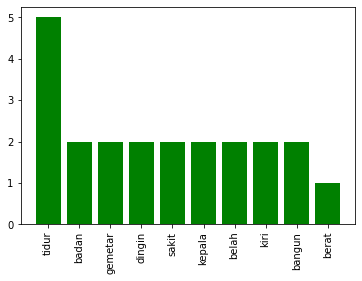



Question
{'mimisan': 4, 'darah': 3, 'bangun': 2, 'tidur': 2, 'dok': 2, 'pagi': 2, 'mulut': 2, 'sebab': 1, 'hallo': 1, 'pnyakit': 1, 'serius': 1, 'jam': 1, 'deras': 1, 'shock': 1, 'spertinya': 1, 'megalir': 1, 'hidung': 1, 'kental': 1, 'demam': 1, 'pusing': 1, 'batuk': 1, 'pilek': 1, 'kondisi': 1, 'normal': 1, 'bbrapa': 1, 'sakit': 1, 'tenggorok': 1, 'benjol': 1, 'leher': 1, 'kanan': 1, 'pikir': 1, 'radang': 1, 'panas': 1, 'hubung': 1, 'terima': 1, 'kasih': 1}


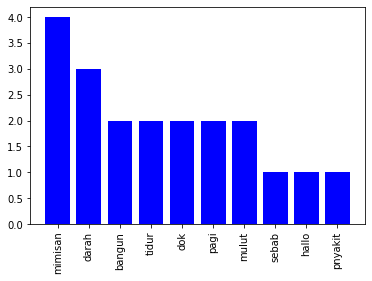

Similar Questions
{'dok': 7, 'jam': 6, 'tidur': 4, 'mata': 4, 'istirahat': 2, 'bangun': 2, 'habis': 2, 'pulang': 2, 'kerja': 2, 'langsung': 2, 'helm': 2, 'refleksi': 2, 'motor': 1, 'pakai': 1, 'wlau': 1, 'kadang': 1, 'buka': 1, 'kca': 1, 'nya': 1, 'sih': 1, 'nyeri': 1, 'gatal': 1, 'buram': 1, 'nanah': 1, 'bengkak': 1, 'kiri': 1, 'merah': 1, 'keruh': 1, 'kanan': 1, 'saraf': 1, 'tukang': 1, 'langgan': 1, 'pijal': 1, 'urut': 1, 'resiko': 1, 'bahaya': 1}


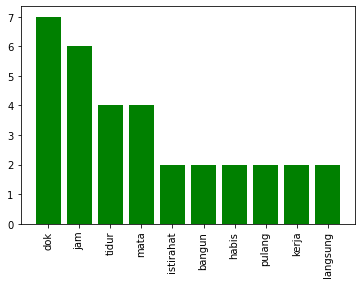



Question
{'dok': 1, 'efek': 1, 'samping': 1, 'imunisasi': 1, 'lanjut': 1}


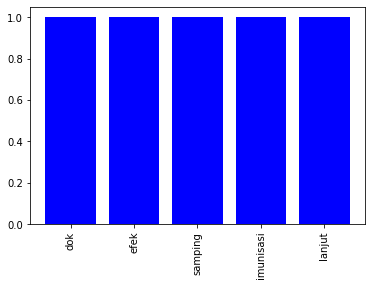

Similar Questions
{'nomor': 1}


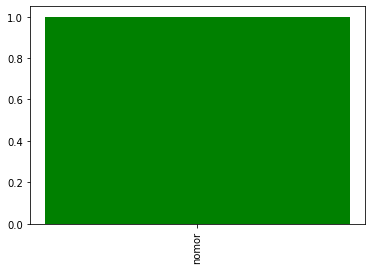



Question
{'bayi': 6, 'susu': 6, 'minum': 5, 'formula': 5, 'tinggal': 2, 'asi': 2, 'gizi': 2, 'minggu': 1, 'dok': 1, 'berangkat': 1, 'kerja': 1, 'keluarga': 1, 'air': 1, 'putih': 1, 'teh': 1, 'manis': 1, 'pertannyaanya': 1, 'tindak': 1, 'ambil': 1, 'si': 1, 'kurang': 1, 'asupan': 1, 'mohon': 1, 'dokter': 1, 'saran': 1, 'baik': 1, 'imbang': 1, 'cukup': 1, 'note': 1, 'pompa': 1, 'taruh': 1, 'botol': 1, 'tolak': 1}


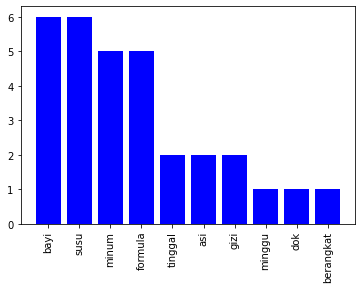

Similar Questions
{'susu': 10, 'formula': 6, 'anak': 6, 'minum': 4, 'asi': 3, 'dok': 2, 'makan': 2, 'bayi': 2, 'pilih': 1, 'umur': 1, 'damping': 1, 'bingung': 1, 'beli': 1, 'pertayaan': 1, 'merknya': 1, 'rencana': 1, 'bubur': 1, 'lahir': 1, 'berfikir': 1, 'tambah': 1, 'asupan': 1, 'gizi': 1, 'konsumsi': 1, 'henti': 1, 'ganti': 1, 'sari': 1, 'kedelai': 1, 'jus': 1, 'tomat': 1, 'wortel': 1, 'dokter': 1, 'bibi': 1, 'susah': 1, 'saran': 1, 'ya': 1}


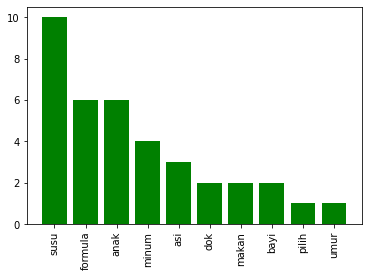



Question
{'berat': 3, 'badan': 2, 'hamil': 2, 'tambah': 1, 'dok': 1, 'minggu': 1, 'suru': 1, 'bidan': 1, 'bertamba': 1, 'bada': 1, 'usahain': 1, 'makan': 1, 'komsusi': 1, 'buah': 1}


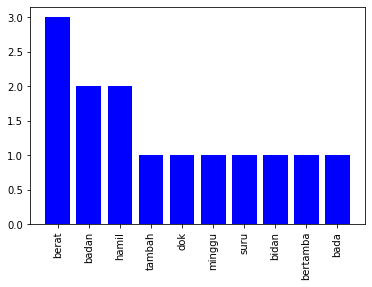

Similar Questions
{'berat': 4, 'badan': 4, 'tambah': 3, 'gemuk': 2, 'makan': 2, 'olahraga': 2, 'selamat': 1, 'siang': 1, 'dok': 1, 'wanita': 1, 'umur': 1, 'lambat': 1, 'usia': 1, 'gin': 1, 'konsultasi': 1, 'cek': 1, 'sehat': 1, 'rs': 1, 'dekat': 1, 'atur': 1, 'pola': 1, 'menu': 1, 'snack': 1, 'konsumsi': 1, 'hari': 1, 'ringan': 1, 'tunjang': 1, 'program': 1, 'lama': 1, 'butuh': 1, 'ideal': 1, 'sekian': 1, 'terima': 1, 'kasih': 1}


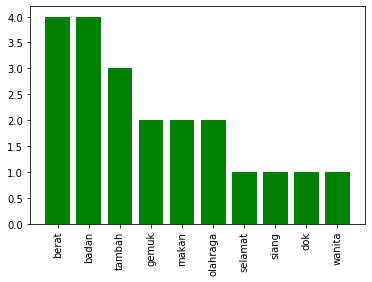



Question
{'cedera': 4, 'ligamen': 3, 'sebab': 1, 'bentur': 1, 'celaka': 1, 'olahraga': 1, 'berat': 1, 'ya': 1, 'dok': 1, 'penasaran': 1, 'cegah': 1, 'tubuh': 1, 'fit': 1, 'deteksi': 1}


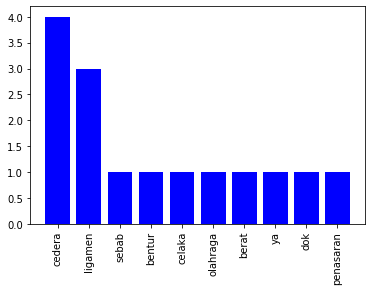

Similar Questions
{'lutut': 14, 'cedera': 7, 'sembuh': 4, 'main': 3, 'salah': 2, 'otot': 2, 'tangan': 2, 'jatuh': 2, 'bola': 2, 'bunyi': 2, 'klak': 2, 'total': 2, 'stabil': 2, 'ya': 2, 'dok': 2, 'alami': 1, 'cidera': 1, 'olahraga': 1, 'lupa': 1, 'panas': 1, 'langsung': 1, 'serius': 1, 'akibat': 1, 'lang': 1, 'kilir': 1, 'bidan': 1, 'habis': 1, 'obat': 1, 'nyeri': 1, 'terkadang': 1, 'kunci': 1, 'laku': 1, 'suplemen': 1, 'konsumsi': 1, 'urat': 1, 'periksa': 1, 'dokter': 1, 'operasi': 1}


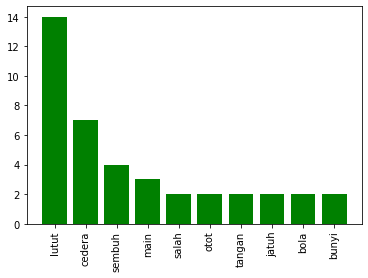

In [576]:
import matplotlib.pyplot as plt

for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(1, full_query)
    
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(1, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Unigram Overlap

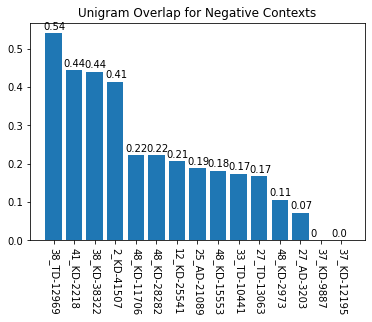

In [577]:
unigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(1, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(1, full_passage)
        unigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
unigram_overlap = dict(sorted(unigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(unigram_overlap.keys()), list(unigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Unigram Overlap for Negative Contexts")
for i, v in enumerate(list(unigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.01, str(round(v, 2)))
plt.show()

## Bigram Analysis

Question
{'telinga saya': 2, 'telinga dengung': 1, 'dengung belah': 1, 'belah kiri': 1, 'kiri selamat': 1, 'selamat pagi': 1, 'pagi dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya kenapa': 1, 'kenapa telinga': 1, 'saya denging': 1, 'denging terus': 1, 'terus ya': 1, 'ya dok': 1, 'dok sudah': 1, 'sudah hari': 1, 'hari saya': 1, 'saya juga': 1, 'juga sudah': 1, 'sudah ke': 1, 'ke puskesmas': 1, 'puskesmas untuk': 1, 'untuk di': 1, 'di periksa': 1, 'periksa kata': 1, 'kata dokter': 1, 'dokter telinga': 1, 'telinga kotor': 1, 'kotor karena': 1, 'karena di': 1, 'di sih': 1, 'sih dengan': 1, 'dengan cutton': 1, 'cutton buds': 1, 'buds jadi': 1, 'jadi kotor': 1, 'kotor dorong': 1, 'dorong hingga': 1, 'hingga tutup': 1, 'tutup gendang': 1, 'gendang telinga': 1, 'telinga dan': 1, 'dan saya': 1, 'saya sudah': 1, 'sudah kasih': 1, 'kasih obat': 1, 'obat tetes': 1, 'tetes untuk': 1, 'untuk hilang': 1, 'hilang kotor': 1, 'kotor tetapi': 1, 'tetapi dengung': 1, 'dengung di': 1, 'di tel

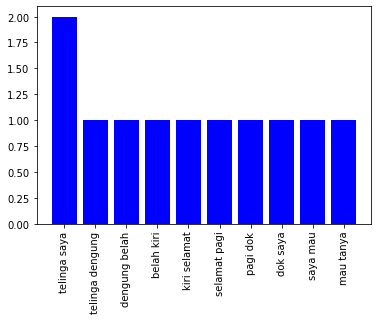

Similar Questions
{'telinga saya': 3, 'belah kiri': 2, 'kiri ada': 2, 'ada lubang': 2, 'lubang kecil': 2, 'ke dokter': 2, 'saya keluar': 2, 'beri obat': 2, 'telinga belah': 1, 'kecil tanya': 1, 'tanya dok': 1, 'dok saya': 1, 'saya sudah': 1, 'sudah ke': 1, 'dokter tht': 1, 'tht kata': 1, 'kata telinga': 1, 'saya belah': 1, 'kecil pada': 1, 'pada saat': 1, 'saat periksa': 1, 'periksa ke': 1, 'dokter telinga': 1, 'keluar cair': 1, 'cair lanjut': 1, 'lanjut dokter': 1, 'dokter beri': 1, 'obat untuk': 1, 'untuk konsumsi': 1, 'konsumsi lama': 1, 'lama hari': 1, 'hari telah': 1, 'telah obat': 1, 'obat sebut': 1, 'sebut habis': 1, 'habis cair': 1, 'cair sebut': 1, 'sebut mulai': 1, 'mulai kurang': 1, 'kurang kemudian': 1, 'kemudian saya': 1, 'saya beri': 1, 'obat lagi': 1, 'lagi untuk': 1, 'untuk waktu': 1, 'waktu hari': 1, 'hari lagi': 1, 'lagi yang': 1, 'yang saya': 1, 'saya tanya': 1, 'tanya apa': 1, 'apa saya': 1, 'saya harus': 1, 'harus gantung': 1, 'gantung kepada': 1, 'kepada karena': 

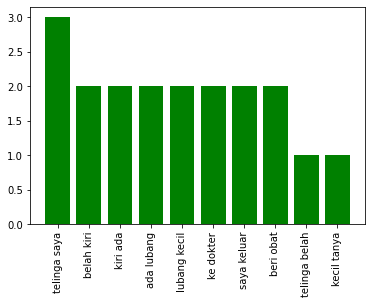



Question
{'tulang kering': 3, 'bentur sepeda': 2, 'sepeda motor': 2, 'kering sakit': 1, 'sakit akibat': 1, 'akibat bentur': 1, 'motor bahaya': 1, 'bahaya siang': 1, 'siang dok': 1, 'dok jadi': 1, 'jadi beberapa': 1, 'beberapa bulan': 1, 'bulan yang': 1, 'yang lalu': 1, 'lalu tulang': 1, 'kering saya': 1, 'saya bentur': 1, 'motor lalu': 1, 'lalu muncul': 1, 'muncul bengkak': 1, 'bengkak dan': 1, 'dan lebam': 1, 'lebam seperti': 1, 'seperti biasa': 1, 'biasa telah': 1, 'telah bentur': 1, 'bentur lebam': 1, 'lebam itu': 1, 'itu hilang': 1, 'hilang iring': 1, 'iring waktu': 1, 'waktu namun': 1, 'namun rasa': 1, 'rasa sakit': 1, 'sakit bila': 1, 'bila sentuh': 1, 'sentuh dan': 1, 'dan bila': 1, 'bila pakai': 1, 'pakai untuk': 1, 'untuk turun': 1, 'turun tangga': 1, 'tangga masih': 1, 'masih asa': 1, 'asa di': 1, 'di kaki': 1, 'kaki khusus': 1, 'khusus di': 1, 'di tulang': 1, 'kering apakah': 1, 'apakah itu': 1, 'itu bahaya': 1, 'bahaya dok': 1, 'dok terima': 1, 'terima kasih': 1}


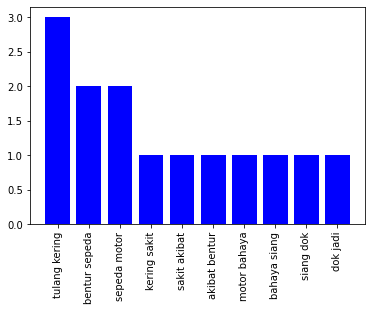

Similar Questions
{'saya alami': 2, 'dari belah': 2, 'belah kiri': 2, 'kiri dan': 2, 'dan tulang': 2, 'belah kanan': 2, 'kaku otot': 1, 'otot telah': 1, 'telah jatuh': 1, 'jatuh tadi': 1, 'tadi siang': 1, 'siang saya': 1, 'alami celaka': 1, 'celaka tabrak': 1, 'tabrak motor': 1, 'motor yang': 1, 'yang laju': 1, 'laju kencang': 1, 'kencang saat': 1, 'saat saya': 1, 'saya menyebrang': 1, 'menyebrang jalan': 1, 'jalan dari': 1, 'kiri siku': 1, 'siku kiri': 1, 'tulang kiri': 1, 'kiri saya': 1, 'saya luka': 1, 'luka buka': 1, 'buka kepala': 1, 'kepala pusing': 1, 'pusing dan': 1, 'dan rahang': 1, 'rahang belah': 1, 'kanan saya': 1, 'saya sakit': 1, 'sakit kaku': 1, 'kaku dan': 1, 'dan saat': 1, 'saat ludah': 1, 'ludah ada': 1, 'ada darah': 1, 'darah sedikit': 1, 'sedikit tak': 1, 'tak berapa': 1, 'berapa lama': 1, 'lama kemudian': 1, 'kemudian luka': 1, 'luka di': 1, 'di siku': 1, 'siku dan': 1, 'tulang kering': 1, 'kering saya': 1, 'saya bengkak': 1, 'bengkak masih': 1, 'masih tetes': 1, '

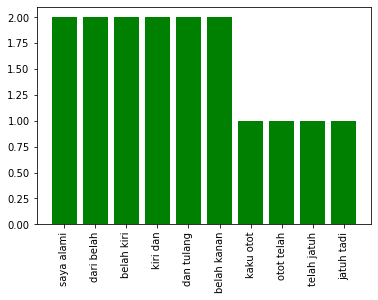



Question
{'beberapa bulan': 2, 'dari tenggorok': 2, 'flu dan': 2, 'lendir dalam': 1, 'dalam tenggoroka': 1, 'tenggoroka yang': 1, 'yang sudah': 1, 'sudah lama': 1, 'lama saya': 1, 'saya sudah': 1, 'sudah lebih': 1, 'lebih beberapa': 1, 'bulan dok': 1, 'dok selalu': 1, 'selalu keluar': 1, 'keluar lendir': 1, 'lendir dari': 1, 'tenggorok dan': 1, 'dan asa': 1, 'asa skl': 1, 'skl kalau': 1, 'kalau tenggorok': 1, 'tenggorok ada': 1, 'ada lendir': 1, 'lendir saya': 1, 'saya tidak': 1, 'tidak lagi': 1, 'lagi flu': 1, 'dan beberapa': 1, 'bulan tidak': 1, 'tidak pernah': 1, 'pernah flu': 1, 'dan ada': 1, 'ada bau': 1, 'bau sengat': 1, 'sengat yang': 1, 'yang keluar': 1, 'keluar dari': 1, 'tenggorok itu': 1, 'itu sakit': 1, 'sakit apa': 1, 'apa biasa': 1, 'biasa dok': 1}


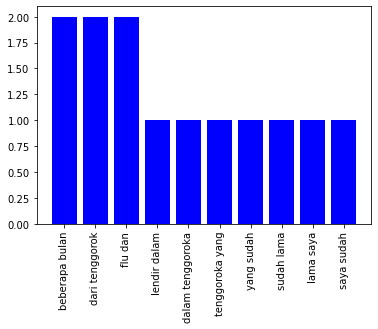

Similar Questions
{'batuk keluar': 2, 'keluar lendir': 2, 'lendir tadi': 1, 'tadi malam': 1, 'malam suami': 1, 'suami saya': 1, 'saya batuk': 1, 'lendir telah': 1, 'telah itu': 1, 'itu muntah': 1, 'muntah darah': 1, 'darah dan': 1, 'dan nafas': 1, 'nafas pun': 1, 'pun susah': 1, 'susah buang': 1, 'buang air': 1, 'air kecil': 1, 'kecil pun': 1, 'pun agak': 1, 'agak merah': 1, 'merah gejala': 1, 'gejala apa': 1, 'apa ini': 1}


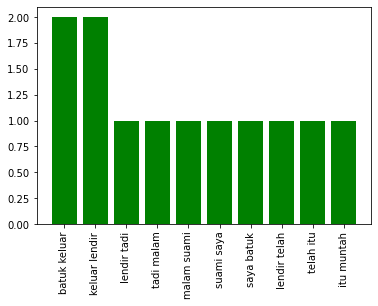



Question
{'keringat saat': 1, 'saat sakit': 1, 'sakit dok': 1, 'dok saya': 1, 'saya sengaja': 1, 'sengaja mati': 1, 'mati ac': 1, 'ac ruang': 1, 'ruang kerja': 1, 'kerja saya': 1, 'saya karena': 1, 'karena saya': 1, 'saya sedang': 1, 'sedang batuk': 1, 'batuk dan': 1, 'dan demam': 1, 'demam keringat': 1, 'keringat keluar': 1, 'keluar banyak': 1, 'banyak bareng': 1, 'bareng dengan': 1, 'dengan banyak': 1, 'banyak minum': 1, 'minum sambil': 1, 'sambil kerja': 1, 'kerja apakah': 1, 'apakah keringat': 1, 'keringat ini': 1, 'ini sehat': 1, 'sehat dok': 1}


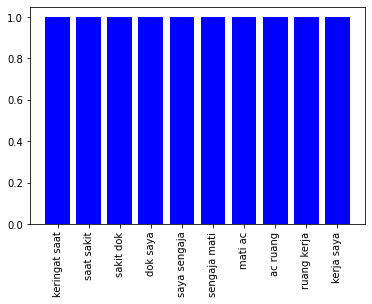

Similar Questions
{'gemetar dan': 2, 'belah kiri': 2, 'saat tidur': 2, 'tidur dan': 2, 'dan bangun': 2, 'bangun tidur': 2, 'badan gemetar': 1, 'dan dingin': 1, 'dingin telah': 1, 'telah kerja': 1, 'kerja berat': 1, 'berat saya': 1, 'saya biasa': 1, 'biasa kalau': 1, 'kalau banyak': 1, 'banyak kerja': 1, 'kerja kurang': 1, 'kurang tidur': 1, 'tidur habis': 1, 'habis itu': 1, 'itu badan': 1, 'badan saya': 1, 'saya sering': 1, 'sering gemetar': 1, 'dan keringat': 1, 'keringat dingin': 1, 'dingin apakah': 1, 'apakah ini': 1, 'ini bahaya': 1, 'sakit kepala': 1, 'kepala belah': 1, 'kiri saat': 1, 'tidur kenapa': 1, 'kenapa kepala': 1, 'kepala saya': 1, 'saya saat': 1, 'tidur sering': 1, 'sering rasa': 1, 'rasa sakit': 1, 'sakit belah': 1}


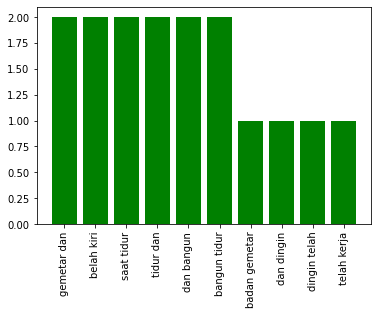



Question
{'sebab mimisan': 1, 'mimisan telah': 1, 'telah bangun': 1, 'bangun tidur': 1, 'tidur hallo': 1, 'hallo dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya apa': 1, 'apa ini': 1, 'ini adalah': 1, 'adalah pnyakit': 1, 'pnyakit serius': 1, 'serius apa': 1, 'apa tidak': 1, 'tidak pagi': 1, 'pagi ini': 1, 'ini jam': 1, 'jam pagi': 1, 'pagi ketika': 1, 'ketika saya': 1, 'saya tidur': 1, 'tidur saya': 1, 'saya bangun': 1, 'bangun dan': 1, 'dan mimisan': 1, 'mimisan yang': 1, 'yang sangat': 1, 'sangat banyak': 1, 'banyak dan': 1, 'dan deras': 1, 'deras saya': 1, 'saya shock': 1, 'shock karena': 1, 'karena tidak': 1, 'tidak pernah': 1, 'pernah mimisan': 1, 'mimisan belum': 1, 'belum dan': 1, 'dan spertinya': 1, 'spertinya darah': 1, 'darah pun': 1, 'pun megalir': 1, 'megalir dari': 1, 'dari dalam': 1, 'dalam hidung': 1, 'hidung ke': 1, 'ke mulut': 1, 'mulut karena': 1, 'karena dari': 1, 'dari mulut': 1, 'mulut pun': 1, 'pun keluar': 1, 'keluar darah': 1, 'darah dan': 1, 'd

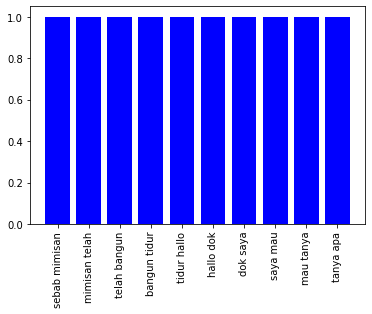

Similar Questions
{'seperti saya': 2, 'saya sudah': 2, 'sudah istirahat': 2, 'istirahat yang': 2, 'yang cukup': 2, 'cukup dok': 2, 'dok mungkin': 2, 'mungkin karena': 2, 'karena sering': 2, 'sering tidur': 2, 'tidur jam': 2, 'jam bangun': 2, 'bangun jam': 2, 'jam tetapi': 2, 'tetapi saya': 2, 'saya habis': 2, 'habis pulang': 2, 'pulang kerja': 2, 'kerja jam': 2, 'jam langsung': 2, 'langsung tidur': 2, 'tidur dok': 2, 'mata saya': 2, 'dok seperti': 1, 'dok kalau': 1, 'kalau naik': 1, 'naik motor': 1, 'motor pun': 1, 'pun pakai': 1, 'pakai helm': 1, 'helm wlau': 1, 'wlau kadang': 1, 'kadang buka': 1, 'buka kca': 1, 'kca helm': 1, 'helm nya': 1, 'nya mata': 1, 'saya sih': 1, 'sih tidak': 1, 'tidak nyeri': 1, 'nyeri gatal': 1, 'gatal buram': 1, 'buram nanah': 1, 'nanah bengkak': 1, 'bengkak tetapi': 1, 'tetapi mata': 1, 'mata kiri': 1, 'kiri saya': 1, 'saya lebih': 1, 'lebih merah': 1, 'merah agak': 1, 'agak keruh': 1, 'keruh dari': 1, 'dari pada': 1, 'pada yang': 1, 'yang kanan': 1, 'kana

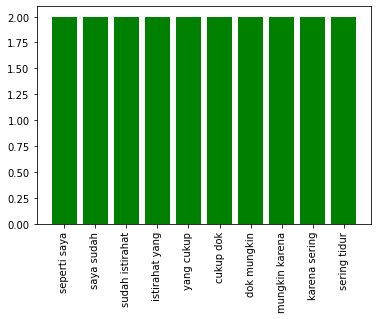



Question
{'dok ada': 1, 'ada efek': 1, 'efek samping': 1, 'samping tidak': 1, 'tidak jika': 1, 'jika tidak': 1, 'tidak laku': 1, 'laku imunisasi': 1, 'imunisasi lanjut': 1, 'lanjut lagi': 1}


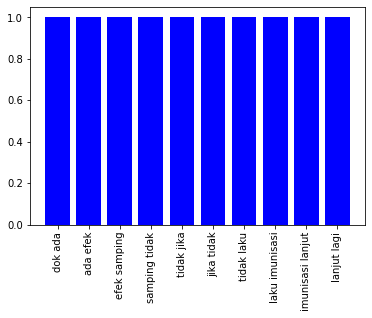

Similar Questions
{'tidak ada': 2, 'ada tanya': 2, 'tanya nomor': 1}


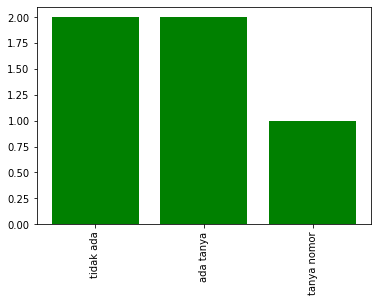



Question
{'susu formula': 5, 'sudah tidak': 2, 'tidak mau': 2, 'mau minum': 2, 'minum susu': 2, 'bayi saya': 2, 'beri susu': 2, 'saya tinggal': 2, 'tinggal kerja': 2, 'belum saya': 2, 'bayi sudah': 1, 'formula sudah': 1, 'sudah minggu': 1, 'minggu ini': 1, 'ini dok': 1, 'dok bayi': 1, 'saya bulan': 1, 'bulan sudah': 1, 'mau beri': 1, 'formula lama': 1, 'lama saya': 1, 'kerja sehingga': 1, 'sehingga hanya': 1, 'hanya minum': 1, 'minum asi': 1, 'asi saya': 1, 'saya belum': 1, 'saya berangkat': 1, 'berangkat kerja': 1, 'kerja dan': 1, 'dan telah': 1, 'telah saya': 1, 'saya kerja': 1, 'kerja antara': 1, 'antara waktu': 1, 'waktu sebut': 1, 'sebut kerja': 1, 'kerja keluarga': 1, 'keluarga hanya': 1, 'hanya beri': 1, 'beri air': 1, 'air putih': 1, 'putih dan': 1, 'dan teh': 1, 'teh manis': 1, 'manis pertannyaanya': 1, 'pertannyaanya bagaimana': 1, 'bagaimana tindak': 1, 'tindak yang': 1, 'yang harus': 1, 'harus saya': 1, 'saya ambil': 1, 'ambil agar': 1, 'agar si': 1, 'si bayi': 1, 'bayi k

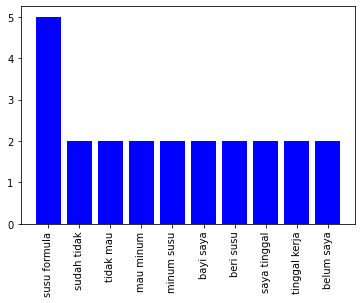

Similar Questions
{'susu formula': 6, 'anak saya': 4, 'untuk anak': 2, 'dan saya': 2, 'saya akan': 2, 'untuk bayi': 2, 'formula yang': 2, 'susu untuk': 2, 'asi saja': 2, 'dengan cara': 2, 'cara saya': 2, 'minum susu': 2, 'pilih susu': 1, 'formula untuk': 1, 'anak dok': 1, 'dok saya': 1, 'saya punya': 1, 'punya anak': 1, 'anak umur': 1, 'umur bulan': 1, 'bulan dan': 1, 'akan beri': 1, 'beri makan': 1, 'makan damping': 1, 'damping asi': 1, 'asi dan': 1, 'saya ingin': 1, 'ingin buat': 1, 'buat makan': 1, 'makan itu': 1, 'itu sendiri': 1, 'sendiri untuk': 1, 'bayi saya': 1, 'saya namun': 1, 'namun saya': 1, 'saya bingung': 1, 'bingung dengan': 1, 'dengan susu': 1, 'yang akan': 1, 'akan saya': 1, 'saya beli': 1, 'beli jadi': 1, 'jadi pertayaan': 1, 'pertayaan saya': 1, 'saya susu': 1, 'yang baik': 1, 'baik untuk': 1, 'bayi itu': 1, 'itu merknya': 1, 'merknya apa': 1, 'apa karena': 1, 'karena saya': 1, 'saya rencana': 1, 'rencana mau': 1, 'mau buat': 1, 'buat bubur': 1, 'bubur susu': 1, 'for

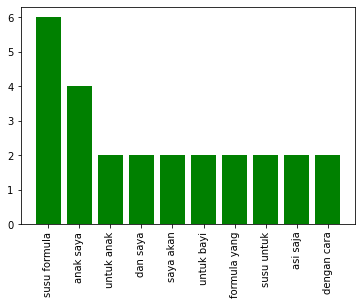



Question
{'berat badan': 2, 'tambah berat': 1, 'badan saat': 1, 'saat hamil': 1, 'hamil dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya saya': 1, 'saya hamil': 1, 'hamil minggu': 1, 'minggu terus': 1, 'terus di': 1, 'di suru': 1, 'suru sama': 1, 'sama bidan': 1, 'bidan agar': 1, 'agar berat': 1, 'badan saya': 1, 'saya itu': 1, 'itu harus': 1, 'harus bertamba': 1, 'bertamba kok': 1, 'kok berat': 1, 'berat bada': 1, 'bada saya': 1, 'saya tidak': 1, 'tidak biasa': 1, 'biasa naik': 1, 'naik padahal': 1, 'padahal sudah': 1, 'sudah usahain': 1, 'usahain sering': 1, 'sering makan': 1, 'makan dan': 1, 'dan komsusi': 1, 'komsusi buah': 1}


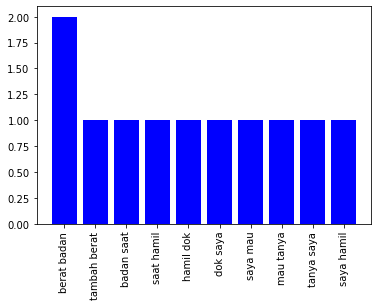

Similar Questions
{'tambah berat': 3, 'berat badan': 3, 'tanya saya': 2, 'untuk tambah': 2, 'ingin gemuk': 1, 'gemuk selamat': 1, 'selamat siang': 1, 'siang dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'saya wanita': 1, 'wanita umur': 1, 'umur tahun': 1, 'tahun tinggi': 1, 'tinggi cuma': 1, 'cuma berat': 1, 'berat hanya': 1, 'hanya ingin': 1, 'ingin tanya': 1, 'saya ingin': 1, 'ingin mulai': 1, 'mulai tambah': 1, 'badan apakah': 1, 'apakah lambat': 1, 'lambat di': 1, 'di usia': 1, 'usia saya': 1, 'saya gin': 1, 'gin apakah': 1, 'apakah untuk': 1, 'badan saya': 1, 'saya harus': 1, 'harus konsultasi': 1, 'konsultasi atau': 1, 'atau cek': 1, 'cek sehat': 1, 'sehat dahulu': 1, 'dahulu ke': 1, 'ke rs': 1, 'rs dekat': 1, 'dekat bagaimana': 1, 'bagaimana atur': 1, 'atur pola': 1, 'pola makan': 1, 'makan dan': 1, 'dan menu': 1, 'menu makan': 1, 'makan snack': 1, 'snack apa': 1, 'apa saja': 1, 'saja yang': 1, 'yang baik': 1, 'baik di': 1, 'di konsumsi': 1, 'konsumsi tiap': 1, 'tiap ha

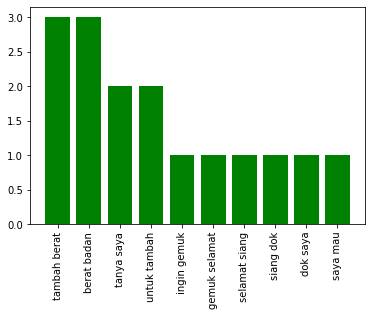



Question
{'cedera ligamen': 3, 'ligamen saya': 1, 'saya ingin': 1, 'ingin tanya': 1, 'tanya soal': 1, 'soal cedera': 1, 'ligamen itu': 1, 'itu kan': 1, 'kan sebab': 1, 'sebab karena': 1, 'karena bentur': 1, 'bentur celaka': 1, 'celaka atau': 1, 'atau olahraga': 1, 'olahraga berat': 1, 'berat ya': 1, 'ya dok': 1, 'dok saya': 1, 'saya penasaran': 1, 'penasaran apakah': 1, 'apakah cedera': 1, 'cedera seperti': 1, 'seperti itu': 1, 'itu bisa': 1, 'bisa cegah': 1, 'cegah atau': 1, 'atau bisa': 1, 'bisa tahu': 1, 'tahu belum': 1, 'belum seperti': 1, 'seperti tubuh': 1, 'tubuh tidak': 1, 'tidak fit': 1, 'fit bisa': 1, 'bisa cedera': 1, 'ligamen atau': 1, 'atau bagaimana': 1, 'bagaimana apa': 1, 'apa bisa': 1, 'bisa deteksi': 1, 'deteksi belum': 1}


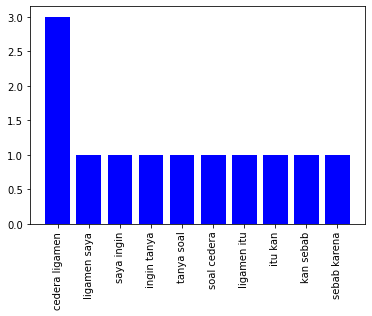

Similar Questions
{'lutut saya': 12, 'dengan lutut': 4, 'cedera lutut': 3, 'dan lutut': 3, 'apa yang': 2, 'cedera otot': 2, 'saya ada': 2, 'ada masalah': 2, 'masalah dengan': 2, 'saya tahun': 2, 'tahun yang': 2, 'yang lalu': 2, 'lalu saya': 2, 'saya jatuh': 2, 'jatuh saat': 2, 'saat main': 2, 'main bola': 2, 'bola dan': 2, 'saya sampai': 2, 'sampai bunyi': 2, 'bunyi klak': 2, 'klak waktu': 2, 'waktu itu': 2, 'itu saya': 2, 'saya kira': 2, 'kira hanya': 2, 'hanya cedera': 2, 'cedera biasa': 2, 'biasa yang': 2, 'yang sembuh': 2, 'sembuh sendiri': 2, 'sendiri tetapi': 2, 'tetapi sampai': 2, 'sampai sekarang': 2, 'sekarang belum': 2, 'belum sembuh': 2, 'sembuh total': 2, 'total lutut': 2, 'saya masih': 2, 'masih kurang': 2, 'kurang stabil': 2, 'stabil kenapa': 2, 'kenapa dengan': 2, 'saya ya': 2, 'ya dok': 2, 'saya alami': 1, 'alami cidera': 1, 'cidera lutut': 1, 'lutut ketika': 1, 'ketika olahraga': 1, 'olahraga saya': 1, 'saya lupa': 1, 'lupa panas': 1, 'panas langsung': 1, 'langsung mai

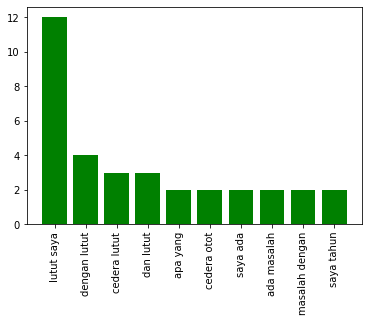

In [578]:
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(2, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(2, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Bigram Overlap

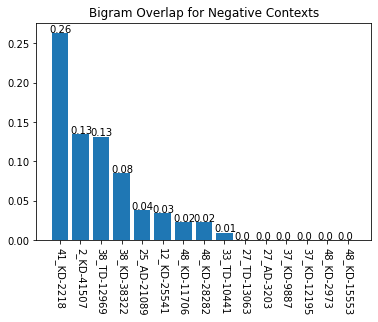

In [579]:
bigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(2, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(2, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
bigram_overlap = dict(sorted(bigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(bigram_overlap.keys()), list(bigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Bigram Overlap for Negative Contexts")
for i, v in enumerate(list(bigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Trigram Analysis

Question
{'telinga dengung belah': 1, 'dengung belah kiri': 1, 'belah kiri selamat': 1, 'kiri selamat pagi': 1, 'selamat pagi dok': 1, 'pagi dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya kenapa': 1, 'tanya kenapa telinga': 1, 'kenapa telinga saya': 1, 'telinga saya denging': 1, 'saya denging terus': 1, 'denging terus ya': 1, 'terus ya dok': 1, 'ya dok sudah': 1, 'dok sudah hari': 1, 'sudah hari saya': 1, 'hari saya juga': 1, 'saya juga sudah': 1, 'juga sudah ke': 1, 'sudah ke puskesmas': 1, 'ke puskesmas untuk': 1, 'puskesmas untuk di': 1, 'untuk di periksa': 1, 'di periksa kata': 1, 'periksa kata dokter': 1, 'kata dokter telinga': 1, 'dokter telinga kotor': 1, 'telinga kotor karena': 1, 'kotor karena di': 1, 'karena di sih': 1, 'di sih dengan': 1, 'sih dengan cutton': 1, 'dengan cutton buds': 1, 'cutton buds jadi': 1, 'buds jadi kotor': 1, 'jadi kotor dorong': 1, 'kotor dorong hingga': 1, 'dorong hingga tutup': 1, 'hingga tutup gendang': 1, 'tutup gendang telinga': 

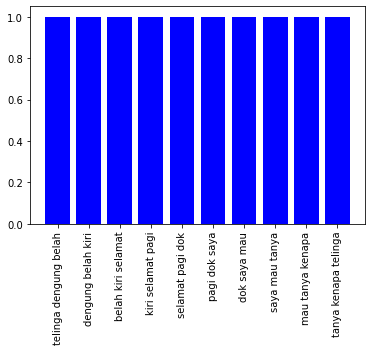

Similar Questions
{'belah kiri ada': 2, 'kiri ada lubang': 2, 'ada lubang kecil': 2, 'telinga saya keluar': 2, 'telinga belah kiri': 1, 'lubang kecil tanya': 1, 'kecil tanya dok': 1, 'tanya dok saya': 1, 'dok saya sudah': 1, 'saya sudah ke': 1, 'sudah ke dokter': 1, 'ke dokter tht': 1, 'dokter tht kata': 1, 'tht kata telinga': 1, 'kata telinga saya': 1, 'telinga saya belah': 1, 'saya belah kiri': 1, 'lubang kecil pada': 1, 'kecil pada saat': 1, 'pada saat periksa': 1, 'saat periksa ke': 1, 'periksa ke dokter': 1, 'ke dokter telinga': 1, 'dokter telinga saya': 1, 'saya keluar cair': 1, 'keluar cair lanjut': 1, 'cair lanjut dokter': 1, 'lanjut dokter beri': 1, 'dokter beri obat': 1, 'beri obat untuk': 1, 'obat untuk konsumsi': 1, 'untuk konsumsi lama': 1, 'konsumsi lama hari': 1, 'lama hari telah': 1, 'hari telah obat': 1, 'telah obat sebut': 1, 'obat sebut habis': 1, 'sebut habis cair': 1, 'habis cair sebut': 1, 'cair sebut mulai': 1, 'sebut mulai kurang': 1, 'mulai kurang kemudian': 1,

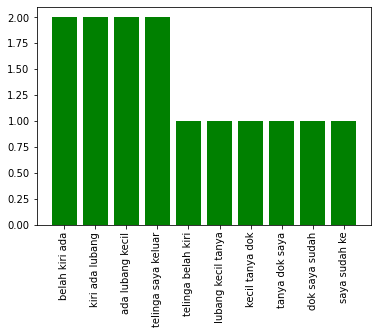



Question
{'bentur sepeda motor': 2, 'tulang kering sakit': 1, 'kering sakit akibat': 1, 'sakit akibat bentur': 1, 'akibat bentur sepeda': 1, 'sepeda motor bahaya': 1, 'motor bahaya siang': 1, 'bahaya siang dok': 1, 'siang dok jadi': 1, 'dok jadi beberapa': 1, 'jadi beberapa bulan': 1, 'beberapa bulan yang': 1, 'bulan yang lalu': 1, 'yang lalu tulang': 1, 'lalu tulang kering': 1, 'tulang kering saya': 1, 'kering saya bentur': 1, 'saya bentur sepeda': 1, 'sepeda motor lalu': 1, 'motor lalu muncul': 1, 'lalu muncul bengkak': 1, 'muncul bengkak dan': 1, 'bengkak dan lebam': 1, 'dan lebam seperti': 1, 'lebam seperti biasa': 1, 'seperti biasa telah': 1, 'biasa telah bentur': 1, 'telah bentur lebam': 1, 'bentur lebam itu': 1, 'lebam itu hilang': 1, 'itu hilang iring': 1, 'hilang iring waktu': 1, 'iring waktu namun': 1, 'waktu namun rasa': 1, 'namun rasa sakit': 1, 'rasa sakit bila': 1, 'sakit bila sentuh': 1, 'bila sentuh dan': 1, 'sentuh dan bila': 1, 'dan bila pakai': 1, 'bila pakai untuk

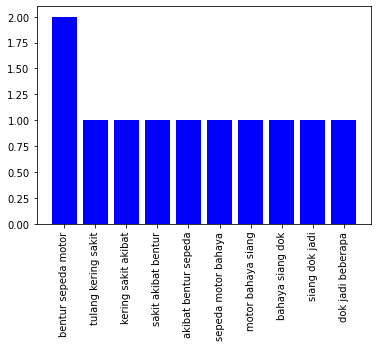

Similar Questions
{'dari belah kiri': 2, 'kaku otot telah': 1, 'otot telah jatuh': 1, 'telah jatuh tadi': 1, 'jatuh tadi siang': 1, 'tadi siang saya': 1, 'siang saya alami': 1, 'saya alami celaka': 1, 'alami celaka tabrak': 1, 'celaka tabrak motor': 1, 'tabrak motor yang': 1, 'motor yang laju': 1, 'yang laju kencang': 1, 'laju kencang saat': 1, 'kencang saat saya': 1, 'saat saya menyebrang': 1, 'saya menyebrang jalan': 1, 'menyebrang jalan dari': 1, 'jalan dari belah': 1, 'belah kiri siku': 1, 'kiri siku kiri': 1, 'siku kiri dan': 1, 'kiri dan tulang': 1, 'dan tulang kiri': 1, 'tulang kiri saya': 1, 'kiri saya luka': 1, 'saya luka buka': 1, 'luka buka kepala': 1, 'buka kepala pusing': 1, 'kepala pusing dan': 1, 'pusing dan rahang': 1, 'dan rahang belah': 1, 'rahang belah kanan': 1, 'belah kanan saya': 1, 'kanan saya sakit': 1, 'saya sakit kaku': 1, 'sakit kaku dan': 1, 'kaku dan saat': 1, 'dan saat ludah': 1, 'saat ludah ada': 1, 'ludah ada darah': 1, 'ada darah sedikit': 1, 'darah sed

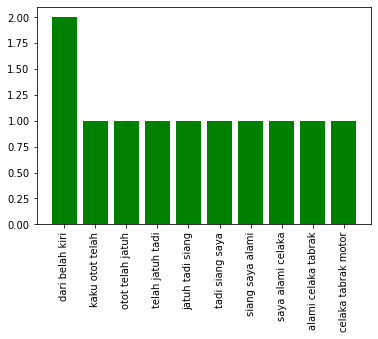



Question
{'lendir dalam tenggoroka': 1, 'dalam tenggoroka yang': 1, 'tenggoroka yang sudah': 1, 'yang sudah lama': 1, 'sudah lama saya': 1, 'lama saya sudah': 1, 'saya sudah lebih': 1, 'sudah lebih beberapa': 1, 'lebih beberapa bulan': 1, 'beberapa bulan dok': 1, 'bulan dok selalu': 1, 'dok selalu keluar': 1, 'selalu keluar lendir': 1, 'keluar lendir dari': 1, 'lendir dari tenggorok': 1, 'dari tenggorok dan': 1, 'tenggorok dan asa': 1, 'dan asa skl': 1, 'asa skl kalau': 1, 'skl kalau tenggorok': 1, 'kalau tenggorok ada': 1, 'tenggorok ada lendir': 1, 'ada lendir saya': 1, 'lendir saya tidak': 1, 'saya tidak lagi': 1, 'tidak lagi flu': 1, 'lagi flu dan': 1, 'flu dan beberapa': 1, 'dan beberapa bulan': 1, 'beberapa bulan tidak': 1, 'bulan tidak pernah': 1, 'tidak pernah flu': 1, 'pernah flu dan': 1, 'flu dan ada': 1, 'dan ada bau': 1, 'ada bau sengat': 1, 'bau sengat yang': 1, 'sengat yang keluar': 1, 'yang keluar dari': 1, 'keluar dari tenggorok': 1, 'dari tenggorok itu': 1, 'tenggoro

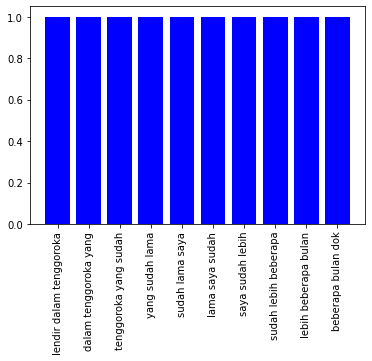

Similar Questions
{'batuk keluar lendir': 2, 'keluar lendir tadi': 1, 'lendir tadi malam': 1, 'tadi malam suami': 1, 'malam suami saya': 1, 'suami saya batuk': 1, 'saya batuk keluar': 1, 'keluar lendir telah': 1, 'lendir telah itu': 1, 'telah itu muntah': 1, 'itu muntah darah': 1, 'muntah darah dan': 1, 'darah dan nafas': 1, 'dan nafas pun': 1, 'nafas pun susah': 1, 'pun susah buang': 1, 'susah buang air': 1, 'buang air kecil': 1, 'air kecil pun': 1, 'kecil pun agak': 1, 'pun agak merah': 1, 'agak merah gejala': 1, 'merah gejala apa': 1, 'gejala apa ini': 1}


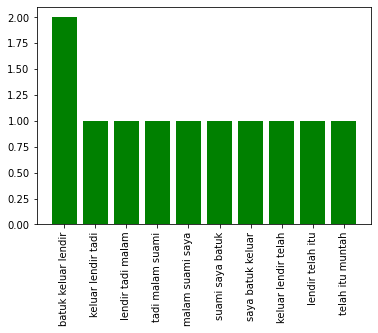



Question
{'keringat saat sakit': 1, 'saat sakit dok': 1, 'sakit dok saya': 1, 'dok saya sengaja': 1, 'saya sengaja mati': 1, 'sengaja mati ac': 1, 'mati ac ruang': 1, 'ac ruang kerja': 1, 'ruang kerja saya': 1, 'kerja saya karena': 1, 'saya karena saya': 1, 'karena saya sedang': 1, 'saya sedang batuk': 1, 'sedang batuk dan': 1, 'batuk dan demam': 1, 'dan demam keringat': 1, 'demam keringat keluar': 1, 'keringat keluar banyak': 1, 'keluar banyak bareng': 1, 'banyak bareng dengan': 1, 'bareng dengan banyak': 1, 'dengan banyak minum': 1, 'banyak minum sambil': 1, 'minum sambil kerja': 1, 'sambil kerja apakah': 1, 'kerja apakah keringat': 1, 'apakah keringat ini': 1, 'keringat ini sehat': 1, 'ini sehat dok': 1}


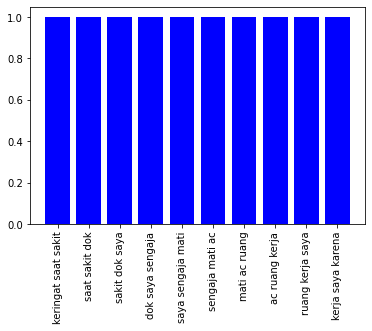

Similar Questions
{'saat tidur dan': 2, 'tidur dan bangun': 2, 'dan bangun tidur': 2, 'badan gemetar dan': 1, 'gemetar dan dingin': 1, 'dan dingin telah': 1, 'dingin telah kerja': 1, 'telah kerja berat': 1, 'kerja berat saya': 1, 'berat saya biasa': 1, 'saya biasa kalau': 1, 'biasa kalau banyak': 1, 'kalau banyak kerja': 1, 'banyak kerja kurang': 1, 'kerja kurang tidur': 1, 'kurang tidur habis': 1, 'tidur habis itu': 1, 'habis itu badan': 1, 'itu badan saya': 1, 'badan saya sering': 1, 'saya sering gemetar': 1, 'sering gemetar dan': 1, 'gemetar dan keringat': 1, 'dan keringat dingin': 1, 'keringat dingin apakah': 1, 'dingin apakah ini': 1, 'apakah ini bahaya': 1, 'sakit kepala belah': 1, 'kepala belah kiri': 1, 'belah kiri saat': 1, 'kiri saat tidur': 1, 'bangun tidur kenapa': 1, 'tidur kenapa kepala': 1, 'kenapa kepala saya': 1, 'kepala saya saat': 1, 'saya saat tidur': 1, 'bangun tidur sering': 1, 'tidur sering rasa': 1, 'sering rasa sakit': 1, 'rasa sakit belah': 1, 'sakit belah kir

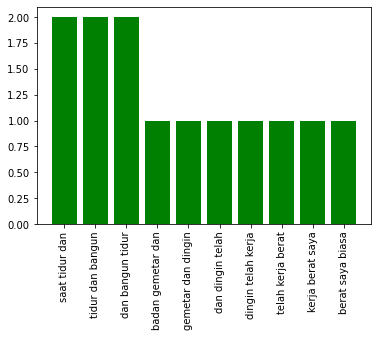



Question
{'sebab mimisan telah': 1, 'mimisan telah bangun': 1, 'telah bangun tidur': 1, 'bangun tidur hallo': 1, 'tidur hallo dok': 1, 'hallo dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya apa': 1, 'tanya apa ini': 1, 'apa ini adalah': 1, 'ini adalah pnyakit': 1, 'adalah pnyakit serius': 1, 'pnyakit serius apa': 1, 'serius apa tidak': 1, 'apa tidak pagi': 1, 'tidak pagi ini': 1, 'pagi ini jam': 1, 'ini jam pagi': 1, 'jam pagi ketika': 1, 'pagi ketika saya': 1, 'ketika saya tidur': 1, 'saya tidur saya': 1, 'tidur saya bangun': 1, 'saya bangun dan': 1, 'bangun dan mimisan': 1, 'dan mimisan yang': 1, 'mimisan yang sangat': 1, 'yang sangat banyak': 1, 'sangat banyak dan': 1, 'banyak dan deras': 1, 'dan deras saya': 1, 'deras saya shock': 1, 'saya shock karena': 1, 'shock karena tidak': 1, 'karena tidak pernah': 1, 'tidak pernah mimisan': 1, 'pernah mimisan belum': 1, 'mimisan belum dan': 1, 'belum dan spertinya': 1, 'dan spertinya darah': 1, 'spertinya darah pun': 1, 'd

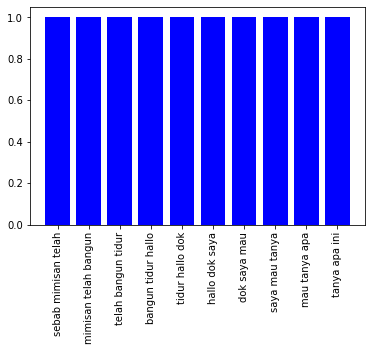

Similar Questions
{'seperti saya sudah': 2, 'saya sudah istirahat': 2, 'sudah istirahat yang': 2, 'istirahat yang cukup': 2, 'yang cukup dok': 2, 'cukup dok mungkin': 2, 'dok mungkin karena': 2, 'mungkin karena sering': 2, 'karena sering tidur': 2, 'sering tidur jam': 2, 'tidur jam bangun': 2, 'jam bangun jam': 2, 'bangun jam tetapi': 2, 'jam tetapi saya': 2, 'tetapi saya habis': 2, 'saya habis pulang': 2, 'habis pulang kerja': 2, 'pulang kerja jam': 2, 'kerja jam langsung': 2, 'jam langsung tidur': 2, 'langsung tidur dok': 2, 'tidur dok seperti': 1, 'dok seperti saya': 1, 'tidur dok kalau': 1, 'dok kalau naik': 1, 'kalau naik motor': 1, 'naik motor pun': 1, 'motor pun pakai': 1, 'pun pakai helm': 1, 'pakai helm wlau': 1, 'helm wlau kadang': 1, 'wlau kadang buka': 1, 'kadang buka kca': 1, 'buka kca helm': 1, 'kca helm nya': 1, 'helm nya mata': 1, 'nya mata saya': 1, 'mata saya sih': 1, 'saya sih tidak': 1, 'sih tidak nyeri': 1, 'tidak nyeri gatal': 1, 'nyeri gatal buram': 1, 'gatal bur

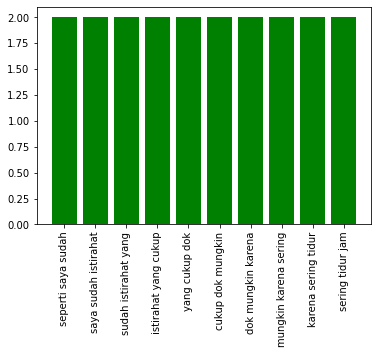



Question
{'dok ada efek': 1, 'ada efek samping': 1, 'efek samping tidak': 1, 'samping tidak jika': 1, 'tidak jika tidak': 1, 'jika tidak laku': 1, 'tidak laku imunisasi': 1, 'laku imunisasi lanjut': 1, 'imunisasi lanjut lagi': 1}


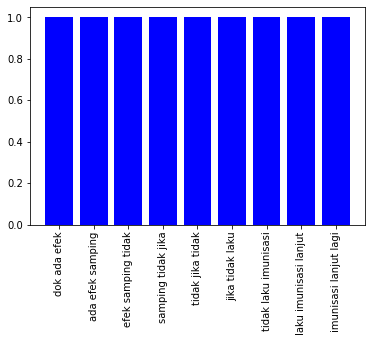

Similar Questions
{'tidak ada tanya': 2, 'ada tanya nomor': 1}


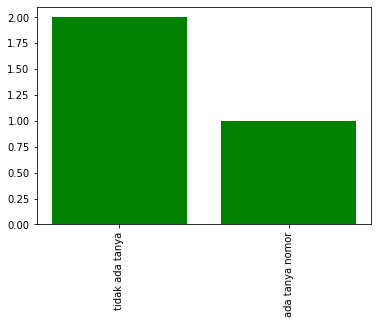



Question
{'sudah tidak mau': 2, 'mau minum susu': 2, 'minum susu formula': 2, 'beri susu formula': 2, 'saya tinggal kerja': 2, 'bayi sudah tidak': 1, 'tidak mau minum': 1, 'susu formula sudah': 1, 'formula sudah minggu': 1, 'sudah minggu ini': 1, 'minggu ini dok': 1, 'ini dok bayi': 1, 'dok bayi saya': 1, 'bayi saya bulan': 1, 'saya bulan sudah': 1, 'bulan sudah tidak': 1, 'tidak mau beri': 1, 'mau beri susu': 1, 'susu formula lama': 1, 'formula lama saya': 1, 'lama saya tinggal': 1, 'tinggal kerja sehingga': 1, 'kerja sehingga hanya': 1, 'sehingga hanya minum': 1, 'hanya minum asi': 1, 'minum asi saya': 1, 'asi saya belum': 1, 'saya belum saya': 1, 'belum saya berangkat': 1, 'saya berangkat kerja': 1, 'berangkat kerja dan': 1, 'kerja dan telah': 1, 'dan telah saya': 1, 'telah saya kerja': 1, 'saya kerja antara': 1, 'kerja antara waktu': 1, 'antara waktu sebut': 1, 'waktu sebut kerja': 1, 'sebut kerja keluarga': 1, 'kerja keluarga hanya': 1, 'keluarga hanya beri': 1, 'hanya beri air'

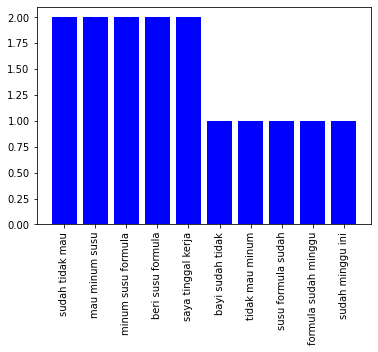

Similar Questions
{'susu formula yang': 2, 'dengan cara saya': 2, 'pilih susu formula': 1, 'susu formula untuk': 1, 'formula untuk anak': 1, 'untuk anak dok': 1, 'anak dok saya': 1, 'dok saya punya': 1, 'saya punya anak': 1, 'punya anak umur': 1, 'anak umur bulan': 1, 'umur bulan dan': 1, 'bulan dan saya': 1, 'dan saya akan': 1, 'saya akan beri': 1, 'akan beri makan': 1, 'beri makan damping': 1, 'makan damping asi': 1, 'damping asi dan': 1, 'asi dan saya': 1, 'dan saya ingin': 1, 'saya ingin buat': 1, 'ingin buat makan': 1, 'buat makan itu': 1, 'makan itu sendiri': 1, 'itu sendiri untuk': 1, 'sendiri untuk bayi': 1, 'untuk bayi saya': 1, 'bayi saya namun': 1, 'saya namun saya': 1, 'namun saya bingung': 1, 'saya bingung dengan': 1, 'bingung dengan susu': 1, 'dengan susu formula': 1, 'formula yang akan': 1, 'yang akan saya': 1, 'akan saya beli': 1, 'saya beli jadi': 1, 'beli jadi pertayaan': 1, 'jadi pertayaan saya': 1, 'pertayaan saya susu': 1, 'saya susu formula': 1, 'formula yang baik

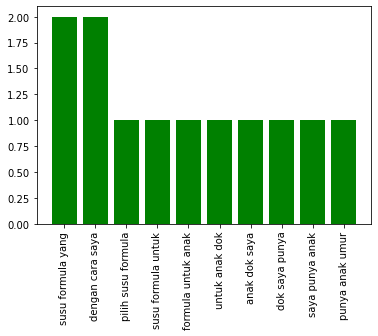



Question
{'tambah berat badan': 1, 'berat badan saat': 1, 'badan saat hamil': 1, 'saat hamil dok': 1, 'hamil dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya saya': 1, 'tanya saya hamil': 1, 'saya hamil minggu': 1, 'hamil minggu terus': 1, 'minggu terus di': 1, 'terus di suru': 1, 'di suru sama': 1, 'suru sama bidan': 1, 'sama bidan agar': 1, 'bidan agar berat': 1, 'agar berat badan': 1, 'berat badan saya': 1, 'badan saya itu': 1, 'saya itu harus': 1, 'itu harus bertamba': 1, 'harus bertamba kok': 1, 'bertamba kok berat': 1, 'kok berat bada': 1, 'berat bada saya': 1, 'bada saya tidak': 1, 'saya tidak biasa': 1, 'tidak biasa naik': 1, 'biasa naik padahal': 1, 'naik padahal sudah': 1, 'padahal sudah usahain': 1, 'sudah usahain sering': 1, 'usahain sering makan': 1, 'sering makan dan': 1, 'makan dan komsusi': 1, 'dan komsusi buah': 1}


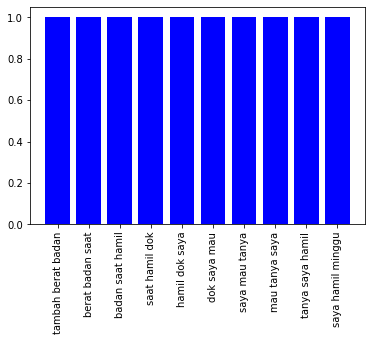

Similar Questions
{'tambah berat badan': 3, 'untuk tambah berat': 2, 'ingin gemuk selamat': 1, 'gemuk selamat siang': 1, 'selamat siang dok': 1, 'siang dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya saya': 1, 'tanya saya wanita': 1, 'saya wanita umur': 1, 'wanita umur tahun': 1, 'umur tahun tinggi': 1, 'tahun tinggi cuma': 1, 'tinggi cuma berat': 1, 'cuma berat hanya': 1, 'berat hanya ingin': 1, 'hanya ingin tanya': 1, 'ingin tanya saya': 1, 'tanya saya ingin': 1, 'saya ingin mulai': 1, 'ingin mulai tambah': 1, 'mulai tambah berat': 1, 'berat badan apakah': 1, 'badan apakah lambat': 1, 'apakah lambat di': 1, 'lambat di usia': 1, 'di usia saya': 1, 'usia saya gin': 1, 'saya gin apakah': 1, 'gin apakah untuk': 1, 'apakah untuk tambah': 1, 'berat badan saya': 1, 'badan saya harus': 1, 'saya harus konsultasi': 1, 'harus konsultasi atau': 1, 'konsultasi atau cek': 1, 'atau cek sehat': 1, 'cek sehat dahulu': 1, 'sehat dahulu ke': 1, 'dahulu ke rs': 1, 'ke rs dekat': 1, 'rs 

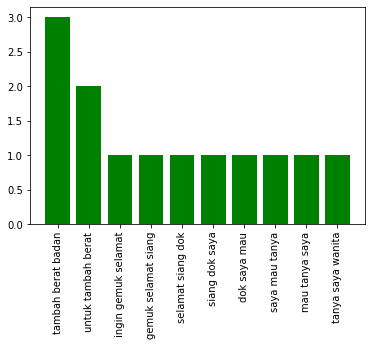



Question
{'cedera ligamen saya': 1, 'ligamen saya ingin': 1, 'saya ingin tanya': 1, 'ingin tanya soal': 1, 'tanya soal cedera': 1, 'soal cedera ligamen': 1, 'cedera ligamen itu': 1, 'ligamen itu kan': 1, 'itu kan sebab': 1, 'kan sebab karena': 1, 'sebab karena bentur': 1, 'karena bentur celaka': 1, 'bentur celaka atau': 1, 'celaka atau olahraga': 1, 'atau olahraga berat': 1, 'olahraga berat ya': 1, 'berat ya dok': 1, 'ya dok saya': 1, 'dok saya penasaran': 1, 'saya penasaran apakah': 1, 'penasaran apakah cedera': 1, 'apakah cedera seperti': 1, 'cedera seperti itu': 1, 'seperti itu bisa': 1, 'itu bisa cegah': 1, 'bisa cegah atau': 1, 'cegah atau bisa': 1, 'atau bisa tahu': 1, 'bisa tahu belum': 1, 'tahu belum seperti': 1, 'belum seperti tubuh': 1, 'seperti tubuh tidak': 1, 'tubuh tidak fit': 1, 'tidak fit bisa': 1, 'fit bisa cedera': 1, 'bisa cedera ligamen': 1, 'cedera ligamen atau': 1, 'ligamen atau bagaimana': 1, 'atau bagaimana apa': 1, 'bagaimana apa bisa': 1, 'apa bisa deteksi':

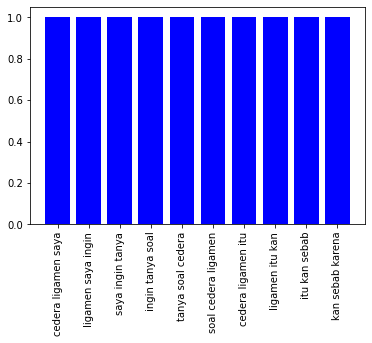

Similar Questions
{'dengan lutut saya': 4, 'cedera lutut saya': 3, 'dan lutut saya': 3, 'lutut saya ada': 2, 'saya ada masalah': 2, 'ada masalah dengan': 2, 'masalah dengan lutut': 2, 'lutut saya tahun': 2, 'saya tahun yang': 2, 'tahun yang lalu': 2, 'yang lalu saya': 2, 'lalu saya jatuh': 2, 'saya jatuh saat': 2, 'jatuh saat main': 2, 'saat main bola': 2, 'main bola dan': 2, 'bola dan lutut': 2, 'lutut saya sampai': 2, 'saya sampai bunyi': 2, 'sampai bunyi klak': 2, 'bunyi klak waktu': 2, 'klak waktu itu': 2, 'waktu itu saya': 2, 'itu saya kira': 2, 'saya kira hanya': 2, 'kira hanya cedera': 2, 'hanya cedera biasa': 2, 'cedera biasa yang': 2, 'biasa yang sembuh': 2, 'yang sembuh sendiri': 2, 'sembuh sendiri tetapi': 2, 'sendiri tetapi sampai': 2, 'tetapi sampai sekarang': 2, 'sampai sekarang belum': 2, 'sekarang belum sembuh': 2, 'belum sembuh total': 2, 'sembuh total lutut': 2, 'total lutut saya': 2, 'lutut saya masih': 2, 'saya masih kurang': 2, 'masih kurang stabil': 2, 'kurang sta

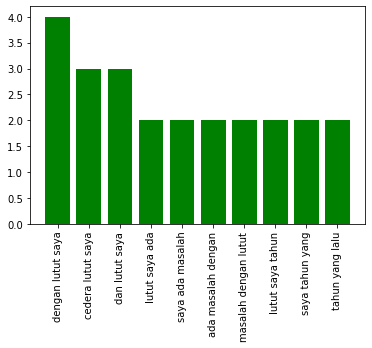

In [580]:
for i in range(len(text_error)):
    if len(text_error[i]) <= 0:
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(3, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(3, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Trigram Overlap

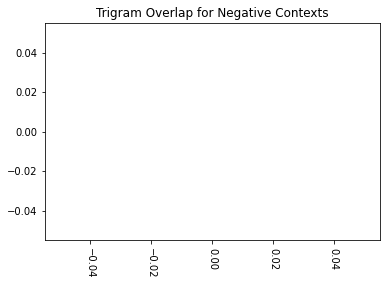

In [581]:
trigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(3, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(3, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
trigram_overlap = dict(sorted(trigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(trigram_overlap.keys()), list(trigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Trigram Overlap for Negative Contexts")
for i, v in enumerate(list(trigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Vector Embedding Projection

In [582]:
import pickle

In [583]:
#passage embedding load

passage_embeddings = dict()
with (open("../Dataset/Embeddings/passage_embeddings_syifa-indosum_full.tsv", "rb")) as openfile:
    while True:
        try:
            passage_lst = pickle.load(openfile)
            for pid, p_vector in passage_lst:
                passage_embeddings[pid] = p_vector
        except EOFError:
            break


In [584]:
#question embedding load

query_embeddings = dict()
with (open("../Dataset/Embeddings/question_embeddings_syifa-indosum_full.tsv", "rb")) as openfile:
    while True:
        try:
            query_lst = pickle.load(openfile)
            for qid, q_vector in query_lst:
                query_embeddings[qid] = q_vector
        except EOFError:
            break


/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


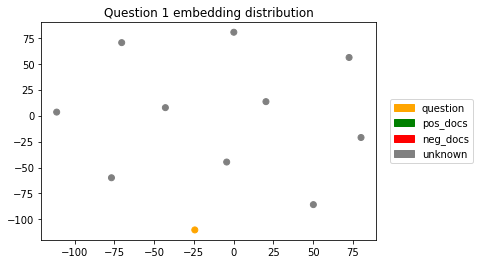

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


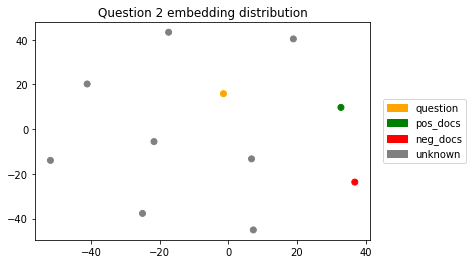

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


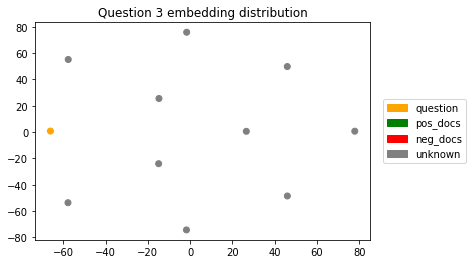

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


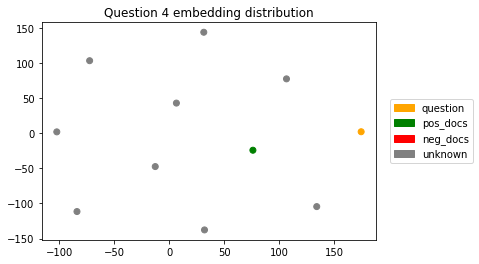

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


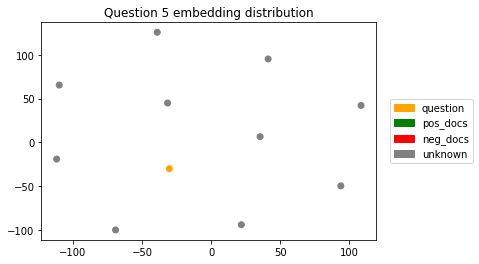

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


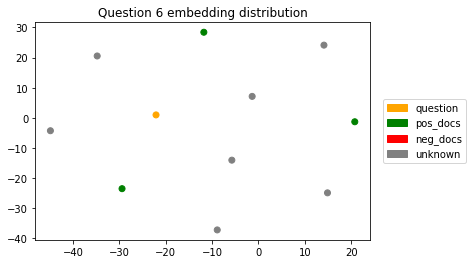

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


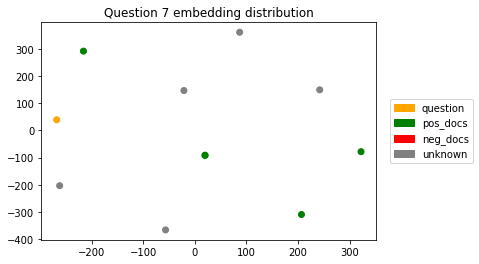

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


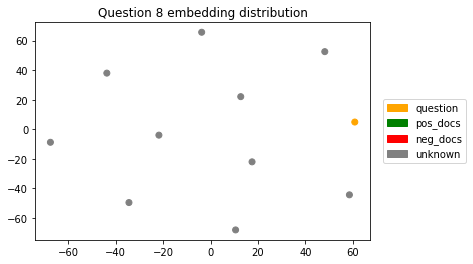

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


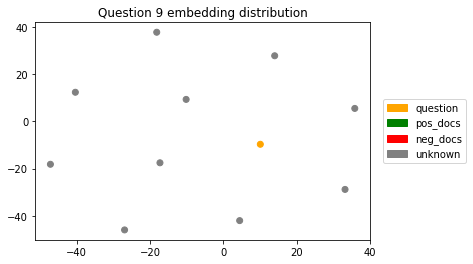

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


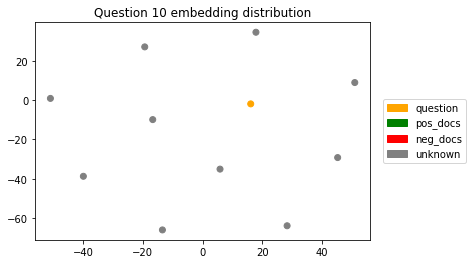

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


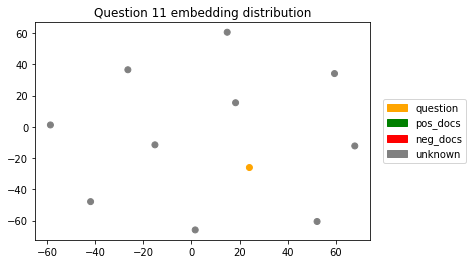

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


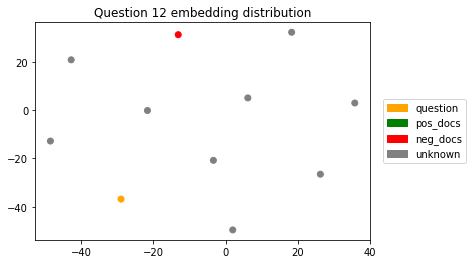

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


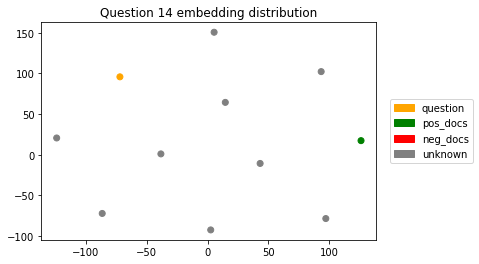

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


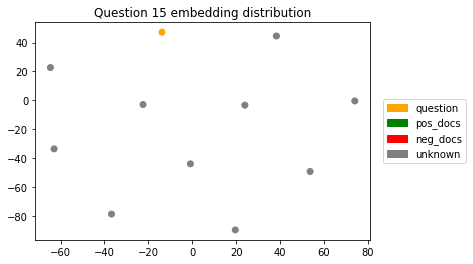

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


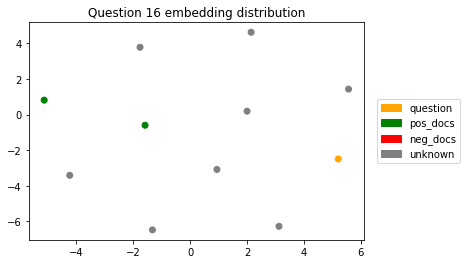

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


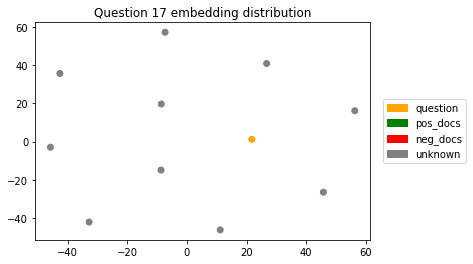

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


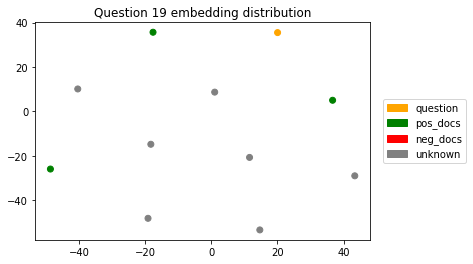

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


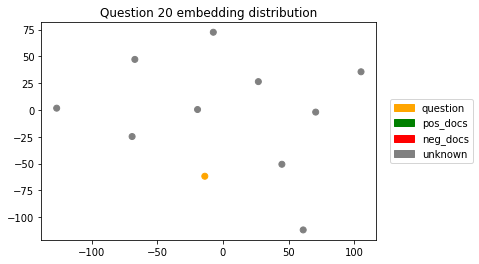

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


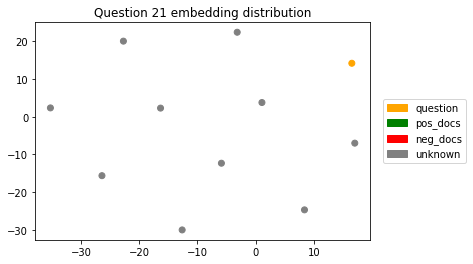

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


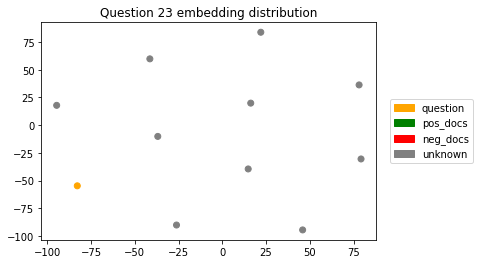

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


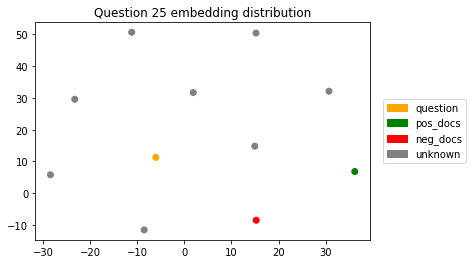

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


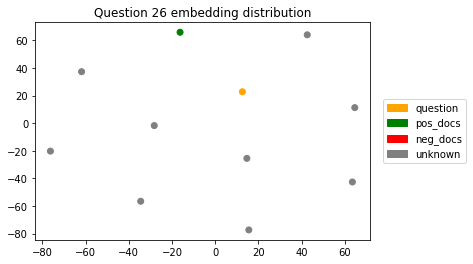

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


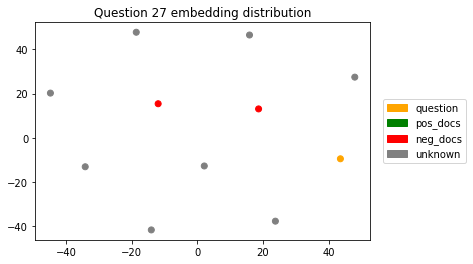

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


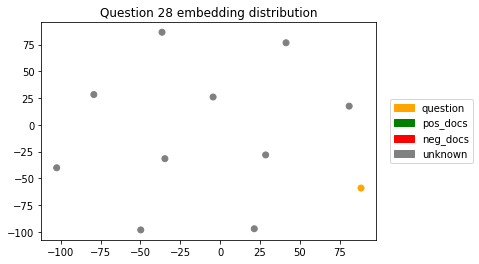

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


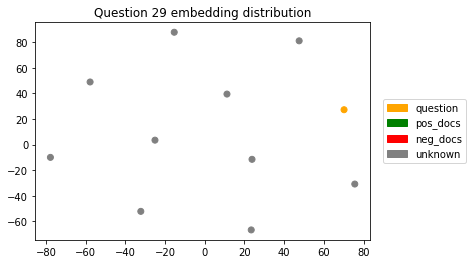

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


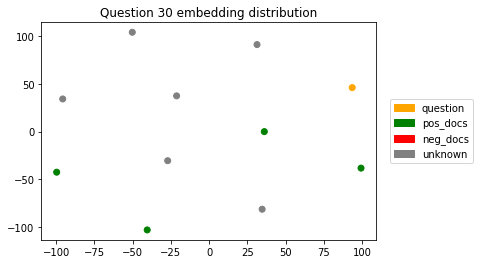

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


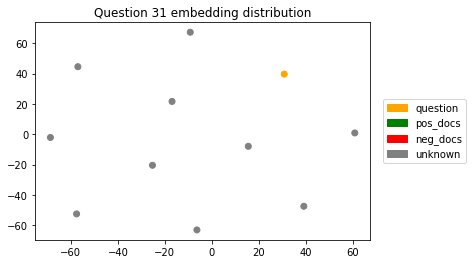

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


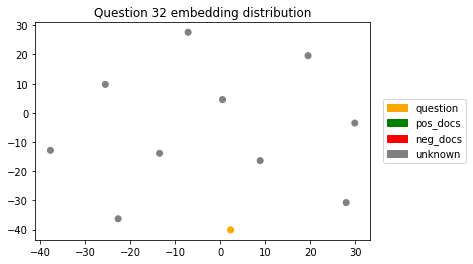

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


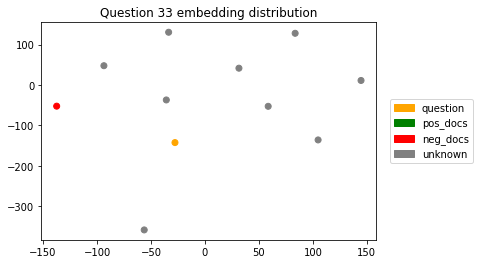

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


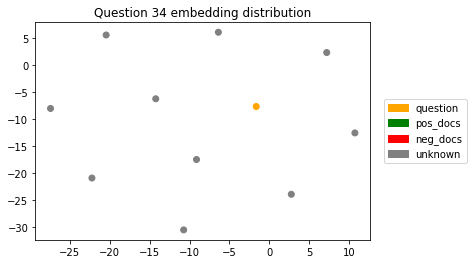

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


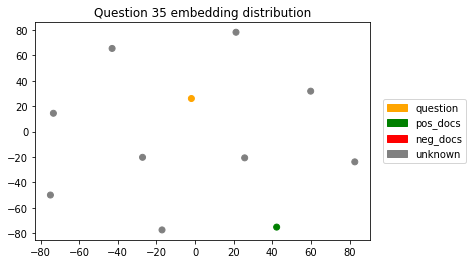

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


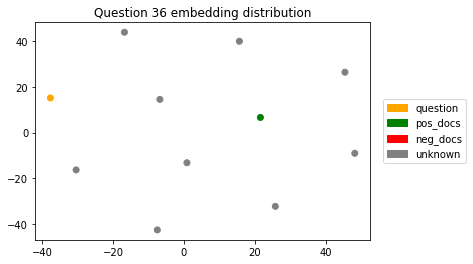

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


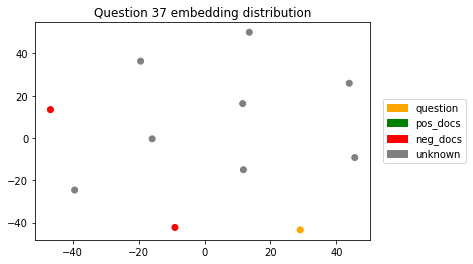

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


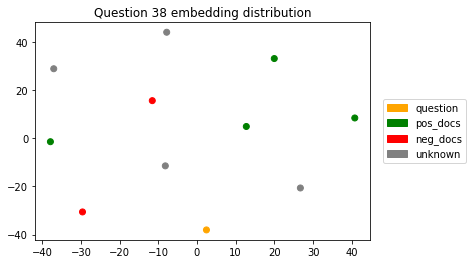

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


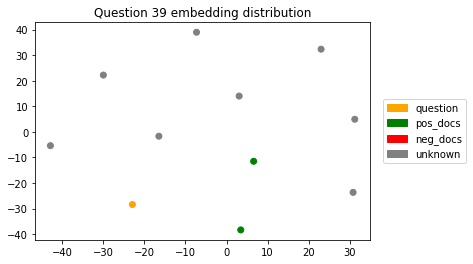

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


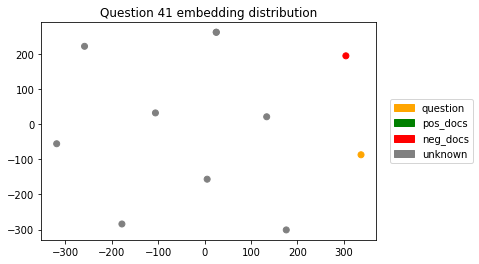

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


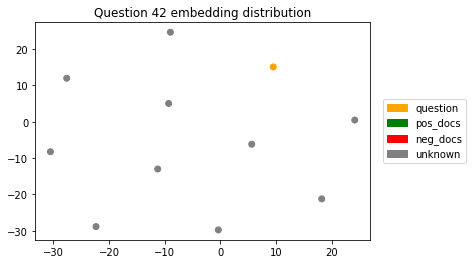

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


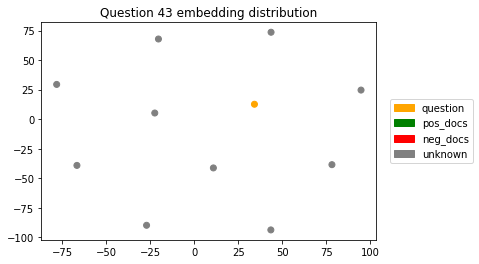

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


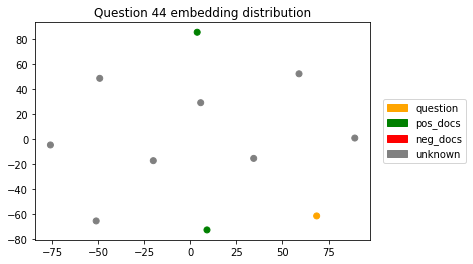

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


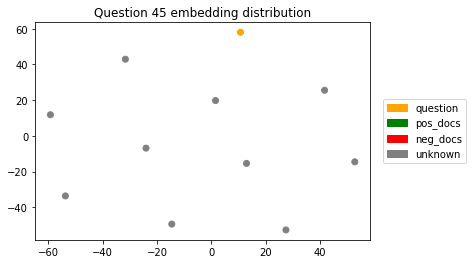

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


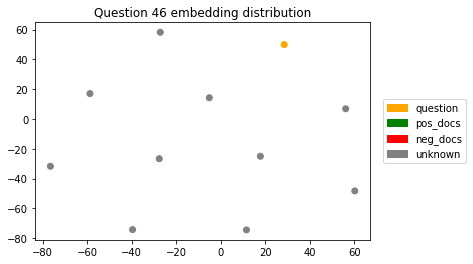

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


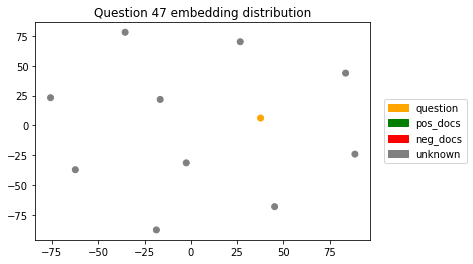

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


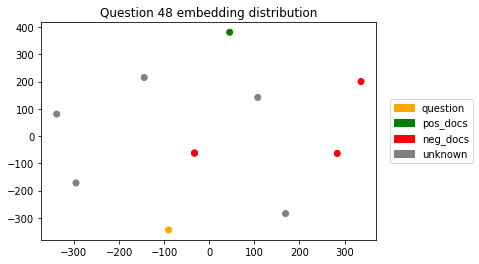

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


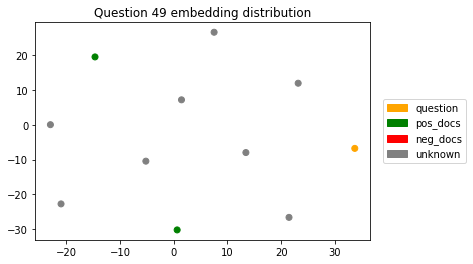

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


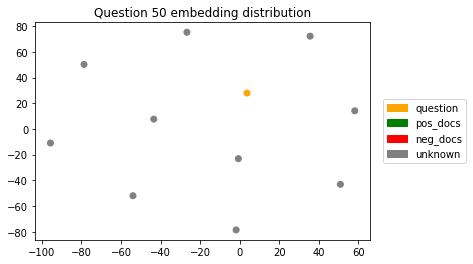

In [585]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import numpy as np

orange_patch = mpatches.Patch(color='orange', label='question')
green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [orange_patch, green_patch, red_patch, grey_patch]
for idx,row in enumerate(actual_data):    
    values = [0]
    colors = ListedColormap(['orange','green','red', 'grey'])
    qid = row['question']['id']
    q_vector = query_embeddings[qid]
    q_vector = q_vector.reshape(-1, len(q_vector))
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        p_vector = passage_embeddings[pid]
        p_vector = p_vector.reshape(-1, len(p_vector))
        q_vector = np.concatenate((q_vector, p_vector), axis=0)
        color = 1 if pid in gold_ids[idx] else 2
        color = 3 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    if len(q_vector) < 2:
        continue
    q_compressed = TSNE(n_components=2, learning_rate='auto',init='pca', random_state=42).fit_transform(q_vector)

    plt.title(f"Question {qid} embedding distribution")
    scatter = plt.scatter(q_compressed[:,0], q_compressed[:,1], c=values, cmap=colors)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()

## BM25 Score vs DPR Score

We expect the graphic will be inversely linear because DPR similarity score has negative correlation with BM25 similarity (While DPR smaller is better, BM25 bigger is better)

In [586]:
import xml.etree.ElementTree as ET

#gather all documents from corpus
docs = []
doc_ids = []

tree = ET.parse('../Dataset/Corpus/corpus_only_question_edited.xml')
root = tree.getroot()

for doc in root:
    for attr in doc:
        attr_type = attr.tag
        attr_content = attr.text
        if attr_type=='KELUHAN':
            content_text = ''
            for content in attr:
                if content.tag == 'JUDUL':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
                elif content.tag == 'ISI':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
            docs.append(content_text)
        elif attr_type == 'ID':
            doc_ids.append(attr_content)



In [587]:
assert len(docs)==len(doc_ids)

In [588]:
docs_map =  dict()
for idx, doc_id in enumerate(doc_ids):
    docs_map[doc_id] = docs[idx]

In [589]:
from tqdm import tqdm

avgdl = sum(len(doc) for doc in docs) / len(docs)
N = len(docs)
docs_freq_map, terms_freq_map, N, avgdl = bm25_init(docs_map)
for q_idx, q_row in tqdm(enumerate(actual_data)):
    query = q_row['question']['title']
    query  += f". {q_row['question']['text']}" if q_row['question']['text'].strip()!="" else ""
    for doc_idx, doc_row in enumerate(q_row['ctxs']):
        doc_id = doc_row['id']
        actual_data[q_idx]['ctxs'][doc_idx]['bm25_score'] = bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map,  docs_map, avgdl, N)
        

45it [00:00, 91.23it/s]


### Aggregated Plot

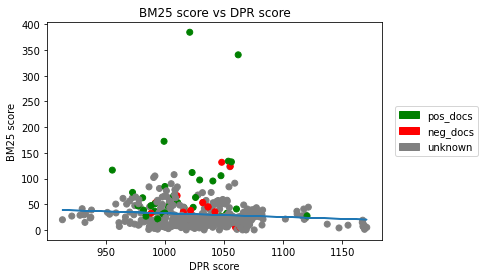

In [590]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.preprocessing import MinMaxScaler, StandardScaler

green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [green_patch, red_patch, grey_patch]
values = []
colors = ListedColormap(['green','red', 'grey'])
score_vector = []
for idx,row in enumerate(actual_data):        
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
score_vector= np.array(score_vector)


m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
plt.title(f"BM25 score vs DPR score")
plt.xlabel("DPR score")
plt.ylabel("BM25 score")
scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)

plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
plt.show()

### Per question plot

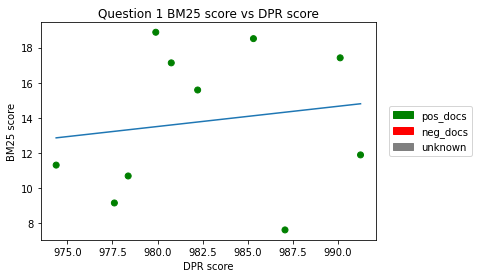

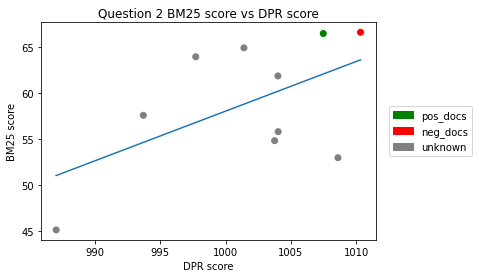

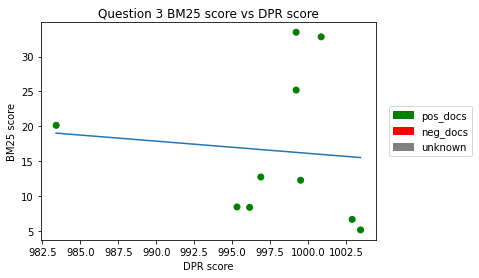

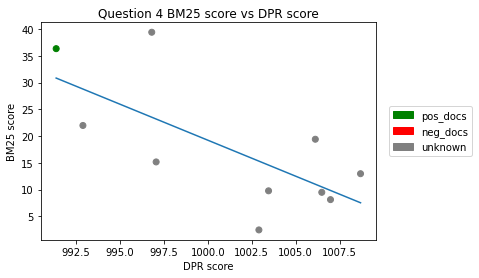

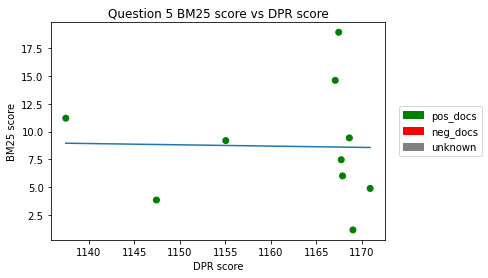

...

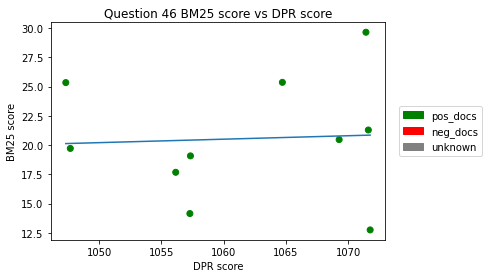

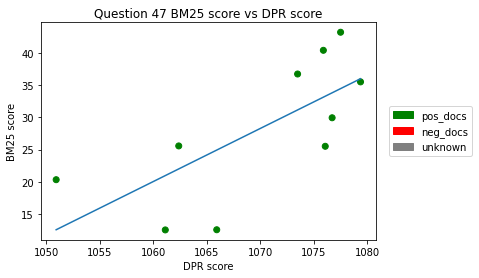

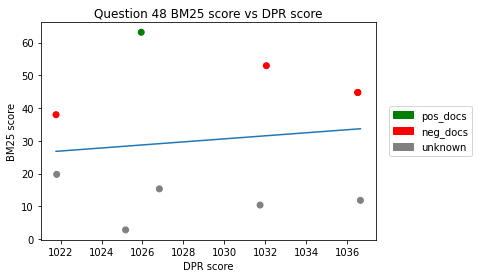

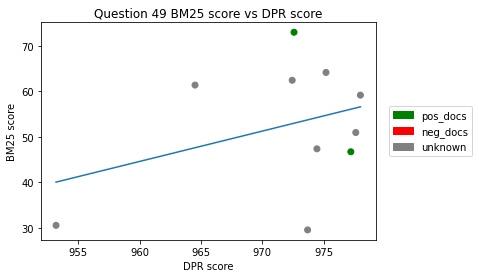

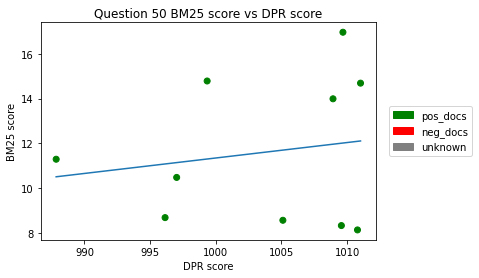

In [591]:
gradients_lst = []
for idx,row in enumerate(actual_data):
    values = []
    score_vector = []
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    score_vector= np.array(score_vector)


    m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
    plt.title(f"Question {qid} BM25 score vs DPR score")
    plt.xlabel("DPR score")
    plt.ylabel("BM25 score")
    scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)
    gradients_lst.append(m)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
    plt.show()

In [592]:
is_positive = [gradient for gradient in gradients_lst if gradient > 0]
is_negative = [gradient for gradient in gradients_lst if gradient < 0]

print(f"positive gradient count: {len(is_positive)}")
print(f"negative gradient count: {len(is_negative)}")

positive gradient count: 22
negative gradient count: 23


# E.  TTMeqSum Data

In [593]:
actual_data = []

with open('../Results/syifa_results_full_ttmeqsum.json', 'r') as actual_out:
    actual_data = json.load(actual_out)



In [594]:
text_error = []
i = 0
for row in actual_data:
    row_text_error = []
    for row_ctx in row['ctxs']:
        if row_ctx['id'] in neg_ids[i]:
            row_text_error.append({'id': row_ctx['id'], 'title': row_ctx['title'], 'text': row_ctx['text']})
    text_error.append(row_text_error)
    i+=1

In [595]:
for i in range(len(text_error)):
    print("Question")
    print(f"text: {actual_data[i]['question']['text']}")
    print(f"title: {actual_data[i]['question']['title']}")
    print("Similar Questions")
    print(text_error[i])
    print()
    print()

Question
text: malam dok , sejak 2 hari yang lalu badan saya pusing dan lemas hari ini hidung saya mengeluarkan ingus terus menerus , bagaimana cara mengatasi nya ya dok ? terima kasih sebelumnya
title: cara mengatasi pusing , lemas dan hidung berair
Similar Questions
[]


Question
text: selamat pagi dok , saya mau tanya kenapa telinga saya berdenging terus ya dok sudah 6 hari , saya juga sudah ke puskesmas untuk di periksa , kata dokternya telinganya kotor karena di bersihkan dengan cutton buds jadi kotorannya terdorong hingga menutupi gendang telinga , dan saya sudah dikasih obat tetes untuk menghilangkan kotoran , tetapi dengung di telinga saya tidak berkurang sama sekali dok , saran dari dokter seperti apa ?
title: telinga berdengung sebelah kiri
Similar Questions
[{'id': 'KD-34312', 'title': 'nyeri telinga', 'text': 'mau tanya dok , saat ini istri saya sering mengeluh sakit pada telinga bagin dalam pernah saya bawah dia ke dokter tht kata dokternya telinganya berjamur , dokternya 

## Unigram Analysis

In [596]:
n = len(text_error)

In [597]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/mk1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Question
{'telinga': 5, 'dok': 3, 'kotor': 3, 'dengung': 2, 'dokter': 2, 'belah': 1, 'kiri': 1, 'selamat': 1, 'pagi': 1, 'denging': 1, 'ya': 1, 'puskesmas': 1, 'periksa': 1, 'sih': 1, 'cutton': 1, 'buds': 1, 'dorong': 1, 'tutup': 1, 'gendang': 1, 'kasih': 1, 'obat': 1, 'tetes': 1, 'hilang': 1, 'kurang': 1, 'saran': 1}


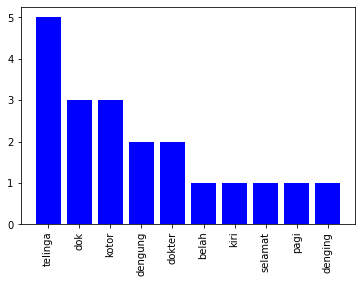

Similar Questions
{'telinga': 15, 'sumbat': 7, 'dokter': 6, 'dok': 4, 'tht': 4, 'kunjung': 4, 'sakit': 3, 'sih': 3, 'obat': 3, 'baik': 3, 'kasih': 3, 'belah': 3, 'istri': 2, 'bagin': 2, 'minggu': 2, 'air': 2, 'sembuh': 2, 'kanan': 2, 'dengar': 2, 'uap': 2, 'buka': 2, 'donk': 2, 'nyeri': 1, 'keluh': 1, 'jamur': 1, 'kambu': 1, 'warna': 1, 'putih': 1, 'nanah': 1, 'hangat': 1, 'menggunaka': 1, 'spoit': 1, 'menyeprotkan': 1, 'mending': 1, 'cair': 1, 'trouma': 1, 'masuk': 1, 'alat': 1, 'sebuh': 1, 'minum': 1, 'nama': 1, 'bisah': 1, 'terimah': 1, 'mohon': 1, 'bantu': 1, 'selamat': 1, 'sore': 1, 'akibat': 1, 'turun': 1, 'alami': 1, 'smp': 1, 'kunyah': 1, 'kali': 1, 'browsing': 1, 'internet': 1, 'temu': 1, 'situs': 1, 'tube': 1, 'eustachian': 1, 'ikut': 1, 'coba': 1, 'valsaa': 1, 'manuver': 1, 'serta': 1, 'nada': 1, 'dengung': 1, 'laku': 1, 'kiri': 1, 'menggangu': 1, 'hidup': 1, 'terima': 1}


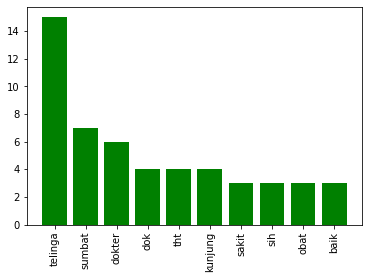



Question
{'dok': 2, 'maladaptive': 2, 'daydreaming': 2, 'terkadang': 2, 'biasa': 1, 'lamun': 1, 'khayal': 1, 'idap': 1, 'cerita': 1, 'peran': 1, 'nya': 1, 'gera': 1, 'reflek': 1, 'ikut': 1, 'plot': 1, 'kait': 1, 'ganggu': 1, 'jiwa': 1, 'sembuh': 1}


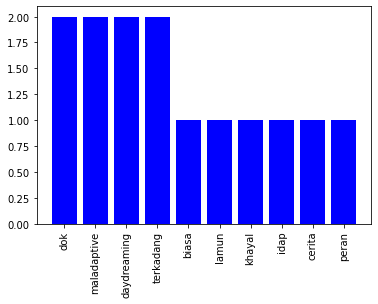

Similar Questions
{'jiwa': 5, 'dok': 4, 'alami': 4, 'psikolog': 4, 'terima': 3, 'sakit': 2, 'terkadang': 2, 'bidang': 2, 'hidup': 2, 'temu': 2, 'kasih': 2, 'darurat': 2, 'ilmu': 2, 'pasien': 2, 'dokter': 2, 'kana': 1, 'bipolar': 1, 'solusi': 1, 'gadis': 1, 'kebahagian': 1, 'sedih': 1, 'menang': 1, 'hari': 1, 'gagal': 1, 'raih': 1, 'awat': 1, 'psikologi': 1, 'orang': 1, 'tua': 1, 'tentang': 1, 'suruh': 1, 'sekolah': 1, 'kondisi': 1, 'fisik': 1, 'hilang': 1, 'nabsu': 1, 'makan': 1, 'guna': 1, 'kandas': 1, 'kampus': 1, 'ajar': 1, 'buruk': 1, 'bakat': 1, 'laku': 1, 'satu': 1, 'peduli': 1, 'salah': 1, 'paksa': 1, 'sanggup': 1, 'niat': 1, 'malu': 1, 'lansung': 1, 'butuh': 1, 'psikiatri': 1, 'hallo': 1, 'selamat': 1, 'kenal': 1, 'yach': 1, 'jujur': 1, 'suka': 1, 'topik': 1, 'kembang': 1, 'hadap': 1, 'sich': 1, 'kali': 1, 'gawat': 1, 'ganggu': 1, 'neurolog': 1, 'runcing': 1, 'ragu': 1, 'ok': 1, 'ya': 1, 'pria': 1, 'kg': 1}


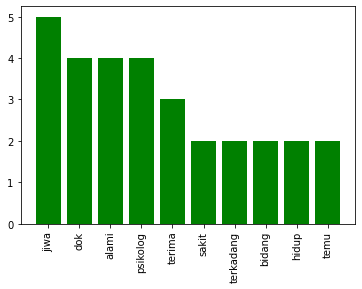



Question
{'jantung': 4, 'debar': 1, 'tanda': 1, 'dear': 1, 'dokter': 1, 'suka': 1, 'darah': 1, 'lancar': 1, 'keluh': 1, 'apa': 1, 'sehat': 1, 'relatif': 1, 'prima': 1, 'sakit': 1, 'mohon': 1, 'informasi': 1, 'dok': 1, 'terima': 1, 'kasih': 1, 'atensi': 1, 'salam': 1, 'hormat': 1}


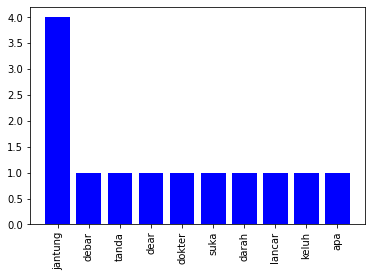

Similar Questions
{'sebab': 2, 'sakit': 2, 'jantung': 2, 'dok': 1, 'sih': 1, 'terima': 1, 'kasih': 1}


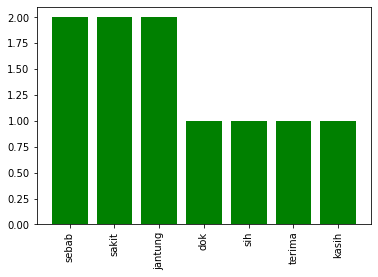



Question
{'bahaya': 2, 'makan': 2, 'mi': 2, 'instan': 2, 'dok': 2, 'terkadang': 1, 'konsumsi': 1, 'hari': 1, 'kali': 1, 'maklum': 1, 'anak': 1, 'kost': 1, 'rantau': 1, 'seberang': 1}


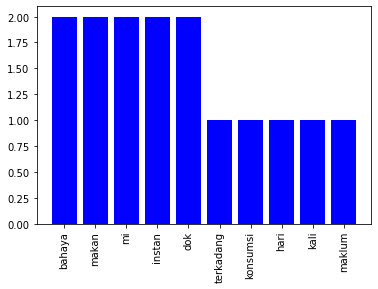

Similar Questions
{'mie': 4, 'air': 2, 'instan': 2, 'kandung': 2, 'gizi': 2, 'dok': 2, 'artikel': 2, 'bekas': 1, 'masak': 1, 'milik': 1, 'selamat': 1, 'malam': 1, 'nih': 1, 'bingung': 1, 'khawatir': 1, 'makan': 1, 'gimana': 1, 'browsing': 1, 'internet': 1, 'bumbu': 1, 'instant': 1, 'bahaya': 1, 'muncul': 1, 'rebus': 1, 'buang': 1, 'mwngandung': 1, 'guna': 1, 'tubuh': 1, 'terima': 1, 'kasih': 1}


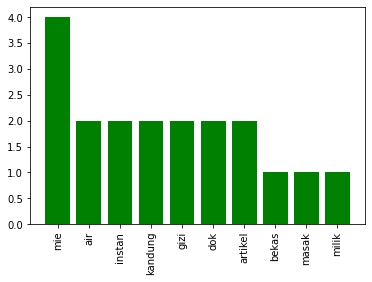



Question
{'belek': 3, 'dok': 3, 'lihat': 2, 'kena': 2, 'atas': 1, 'ganggu': 1, 'mata': 1, 'minggu': 1, 'hilang': 1, 'kurang': 1, 'laku': 1, 'alami': 1, 'sembuh': 1, 'normal': 1, 'terima': 1, 'kasih': 1, 'info': 1, 'saran': 1}


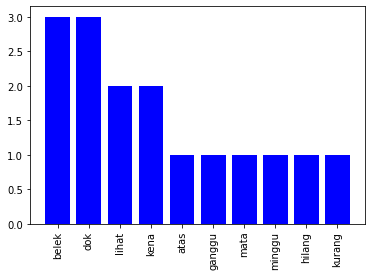

Similar Questions
{'mata': 6, 'dokter': 5, 'lihat': 4, 'lampu': 4, 'kabur': 4, 'dok': 3, 'buram': 2, 'bola': 2, 'bunderan': 2, 'putih': 2, 'kaca': 2, 'hilang': 2, 'pakai': 2, 'nya': 2, 'terima': 2, 'kasih': 2, 'jawabanya': 2, 'malam': 2, 'pandang': 2, 'keliling': 2, 'ya': 1, 'belah': 1, 'kanan': 1, 'blakangan': 1, 'ganjal': 1, 'silau': 1, 'pergi': 1, 'alat': 1, 'tutup': 1, 'retina': 1, 'eliahatan': 1, 'obat': 1, 'akibat': 1, 'softlens': 1, 'minus': 1, 'gaya': 1, 'bberpa': 1, 'rasa': 1, 'mara': 1, 'mudah': 1, 'lelah': 1, 'kering': 1, 'kabut': 1, 'neon': 1, 'dab': 1, 'bangun': 1, 'tidur': 1, 'pagi': 1, 'terkadang': 1, 'corak': 1, 'pelangi': 1, 'stelag': 1, 'beberpa': 1, 'kurang': 1, 'kena': 1, 'glaukoma': 1, 'mohon': 1, 'pencerahanya': 1, 'nanti': 1, 'serta': 1, 'saran': 1, 'wassalam': 1}


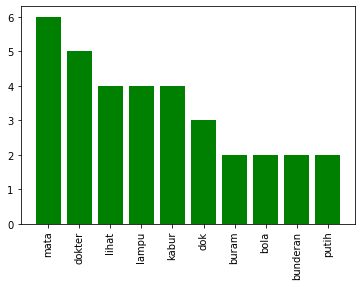



Question
{'lendir': 3, 'tenggorok': 3, 'dok': 2, 'flu': 2, 'tenggoroka': 1, 'keluar': 1, 'skl': 1, 'bau': 1, 'sengat': 1, 'sakit': 1}


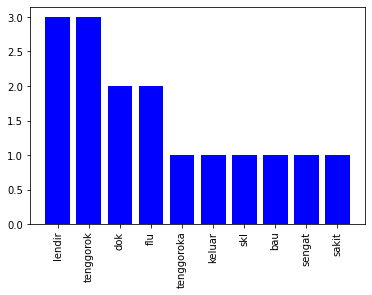

Similar Questions
{'tenggorok': 4, 'lendir': 4, 'gigi': 4, 'pasta': 3, 'mual': 2, 'pakai': 2, 'rasa': 2, 'obat': 2, 'gosok': 1, 'muntah': 1, 'ganti': 1, 'bening': 1, 'dokter': 1, 'kena': 1, 'debu': 1, 'minum': 1, 'habis': 1, 'terima': 1, 'kasih': 1}


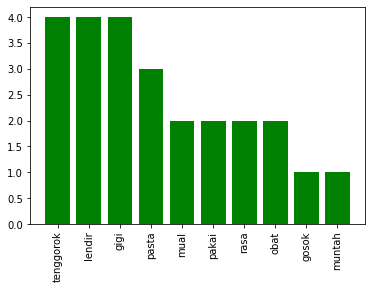



Question
{'steril': 3, 'anak': 3, 'hamil': 1, 'pasca': 1, 'usia': 1, 'kali': 1, 'caesar': 1, 'mei': 1, 'putus': 1, 'langsung': 1, 'suami': 1, 'cewek': 1, 'tiga': 1, 'potong': 1, 'bayi': 1, 'tabung': 1, 'solusi': 1, 'nya': 1}


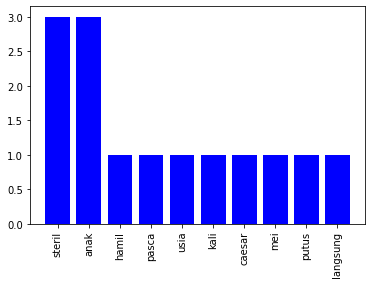

Similar Questions
{'lahir': 7, 'anak': 7, 'caesar': 5, 'kali': 3, 'dokter': 3, 'rencana': 3, 'jarak': 3, 'normal': 2, 'operasi': 1, 'nya': 1, 'sungsang': 1, 'bayi': 1, 'turun': 1, 'jalan': 1, 'dadak': 1, 'usia': 1, 'terima': 1, 'kasih': 1}


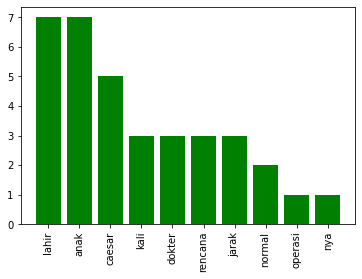



Question
{'dok': 3, 'hbv': 2, 'dna': 2, 'sgpt': 2, 'ot': 1, 'assalamualaikum': 1, 'suami': 1, 'rutin': 1, 'kontrol': 1, 'hepatitis': 1, 'hasil': 1, 'lab': 1, 'kuantitatif': 1, 'not': 1, 'detected': 1, 'maksud': 1, 'ya': 1, 'tes': 1, 'mohon': 1, 'jelas': 1, 'terima': 1, 'kasih': 1}


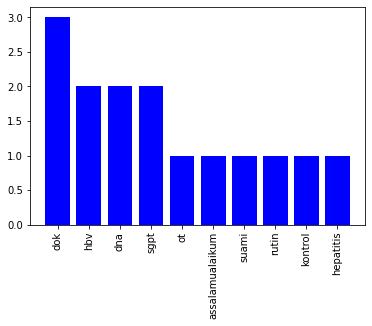

Similar Questions
{'dok': 6, 'golong': 4, 'darah': 4, 'anak': 4, 'tes': 3, 'dna': 3, 'b': 2, 'kandung': 2, 'mene': 1, 'tentu': 1, 'identitas': 1, 'y': 1, 'akurat': 1, 'terima': 1, 'kasih': 1, 'salam': 1, 'hormat': 1, 'o': 1, 'istri': 1, 'nya': 1, 'biaya': 1, 'test': 1}


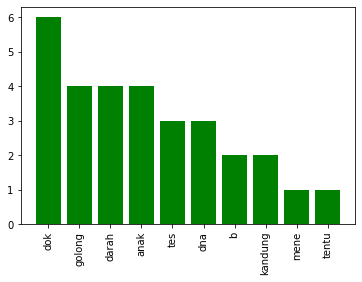



Question
{'bercak': 2, 'putih': 2, 'wajah': 2, 'anak': 2, 'hallo': 1, 'dok': 1, 'panu': 1, 'usia': 1, 'ya': 1, 'obat': 1, 'terima': 1, 'kasih': 1}


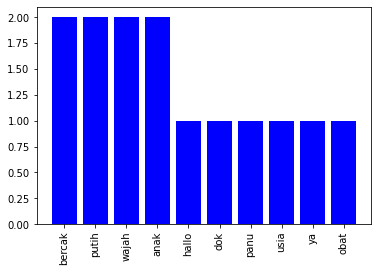

Similar Questions
{'anak': 3, 'obat': 3, 'pakai': 2, 'selamat': 1, 'malam': 1, 'gadis': 1, 'bingung': 1, 'timbul': 1, 'kulit': 1, 'satu': 1, 'hasil': 1, 'dok': 1, 'cepat': 1, 'sembuh': 1, 'merah': 1, 'bekas': 1, 'terang': 1, 'kerja': 1, 'malu': 1}


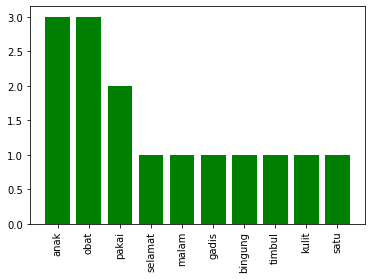



Question
{'perut': 3, 'langsung': 3, 'jahit': 3, 'nyeri': 2, 'operasi': 2, 'caesar': 2, 'dok': 2, 'ya': 2, 'pasca': 1, 'hallo': 1, 'habis': 1, 'trz': 1, 'steril': 1, 'tpii': 1, 'pas': 1, 'alami': 1, 'panas': 1, 'dingin': 1, 'takut': 1, 'masalah': 1, 'lahir': 1, 'beraktifitas': 1, 'biar': 1, 'kaku': 1, 'cepat': 1, 'sembuh': 1}


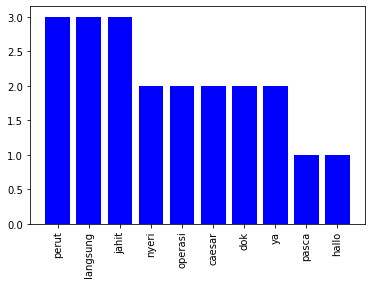

Similar Questions
{'caesar': 4, 'induksi': 3, 'anak': 3, 'istri': 2, 'usia': 2, 'pasca': 1, 'kandung': 1, 'pasuk': 1, 'minggu': 1, 'kontraksi': 1, 'dokter': 1, 'operasi': 1, 'tiga': 1, 'normal': 1, 'nomor': 1, 'ber': 1, 'laku': 1, 'proses': 1, 'nya': 1, 'terima': 1, 'kasih': 1}


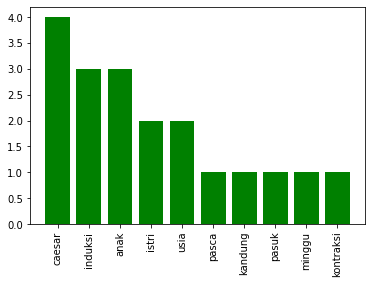



Question
{'bayi': 6, 'susu': 6, 'minum': 5, 'formula': 5, 'tinggal': 2, 'asi': 2, 'gizi': 2, 'minggu': 1, 'dok': 1, 'berangkat': 1, 'kerja': 1, 'keluarga': 1, 'air': 1, 'putih': 1, 'teh': 1, 'manis': 1, 'pertannyaanya': 1, 'tindak': 1, 'ambil': 1, 'si': 1, 'kurang': 1, 'asupan': 1, 'mohon': 1, 'dokter': 1, 'saran': 1, 'baik': 1, 'imbang': 1, 'cukup': 1, 'note': 1, 'pompa': 1, 'taruh': 1, 'botol': 1, 'tolak': 1}


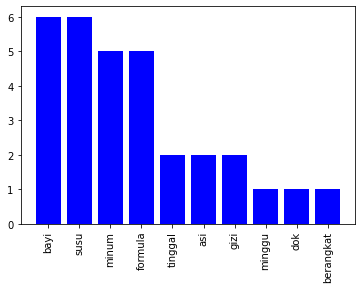

Similar Questions
{'susu': 4, 'formula': 3, 'anak': 3, 'makan': 2, 'bayi': 2, 'pilih': 1, 'dok': 1, 'umur': 1, 'damping': 1, 'asi': 1, 'bingung': 1, 'beli': 1, 'pertayaan': 1, 'merknya': 1, 'rencana': 1, 'bubur': 1}


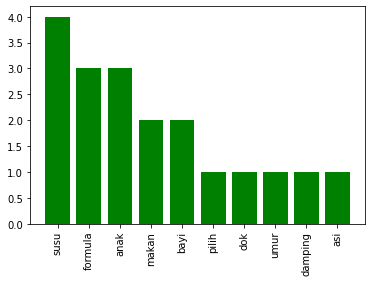



Question
{'gadis': 4, 'mental': 2, 'disorder': 2, 'dekat': 2, 'ruang': 2, 'meja': 2, 'dalam': 2, 'toilet': 2, 'salam': 1, 'cantik': 1, 'umur': 1, 'ajak': 1, 'obrol': 1, 'dia': 1, 'bicara': 1, 'patah': 1, 'tertawa': 1, 'muka': 1, 'merah': 1, 'luar': 1, 'kantor': 1, 'habis': 1, 'makan': 1, 'siang': 1, 'kejar': 1, 'maksud': 1, 'cakap': 1, 'langsung': 1, 'lari': 1, 'tunggu': 1, 'pergi': 1, 'jadi': 1, 'tindak': 1, 'iya': 1, 'masuk': 1, 'klasifikasi': 1, 'mana': 1, 'terima': 1, 'kasih': 1}


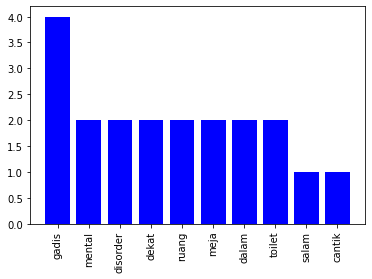

Similar Questions
{'bicara': 3, 'mbak': 3, 'anak': 2, 'cepat': 2, 'makan': 2, 'buku': 2, 'hewan': 2, 'tertawa': 2, 'nenek': 2, 'kerja': 2, 'jam': 2, 'lancar': 1, 'jakarta': 1, 'assalaamualaikum': 1, 'usia': 1, 'aktif': 1, 'gerak': 1, 'tiru': 1, 'gera': 1, 'anggota': 1, 'badan': 1, 'rumah': 1, 'pakai': 1, 'ya': 1, 'minum': 1, 'ajak': 1, 'nyambung': 1, 'respons': 1, 'bahasa': 1, 'tubuh': 1, 'bilang': 1, 'iya': 1, 'angguk': 1, 'geleng': 1, 'kepala': 1, 'senang': 1, 'gambar': 1, 'banyak': 1, 'pagi': 1, 'sore': 1, 'titip': 1, 'stimulus': 1, 'biar': 1, 'terima': 1, 'kasih': 1, 'yusriani': 1, 'wanita': 1, 'berat': 1, 'kg': 1}


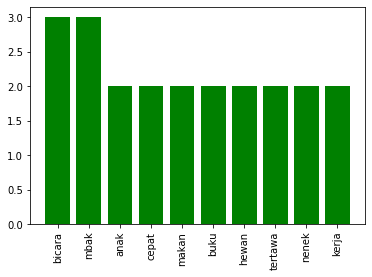

In [598]:
import matplotlib.pyplot as plt

for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(1, full_query)
    
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(1, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Unigram Overlap

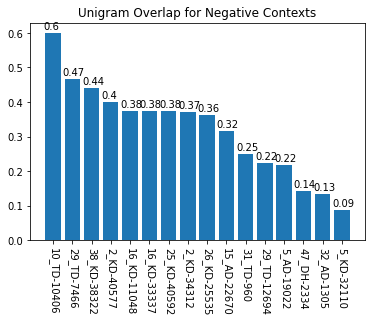

In [599]:
unigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(1, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(1, full_passage)
        unigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
unigram_overlap = dict(sorted(unigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(unigram_overlap.keys()), list(unigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Unigram Overlap for Negative Contexts")
for i, v in enumerate(list(unigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.01, str(round(v, 2)))
plt.show()

## Bigram Analysis

Question
{'telinga saya': 2, 'telinga dengung': 1, 'dengung belah': 1, 'belah kiri': 1, 'kiri selamat': 1, 'selamat pagi': 1, 'pagi dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya kenapa': 1, 'kenapa telinga': 1, 'saya denging': 1, 'denging terus': 1, 'terus ya': 1, 'ya dok': 1, 'dok sudah': 1, 'sudah hari': 1, 'hari saya': 1, 'saya juga': 1, 'juga sudah': 1, 'sudah ke': 1, 'ke puskesmas': 1, 'puskesmas untuk': 1, 'untuk di': 1, 'di periksa': 1, 'periksa kata': 1, 'kata dokter': 1, 'dokter telinga': 1, 'telinga kotor': 1, 'kotor karena': 1, 'karena di': 1, 'di sih': 1, 'sih dengan': 1, 'dengan cutton': 1, 'cutton buds': 1, 'buds jadi': 1, 'jadi kotor': 1, 'kotor dorong': 1, 'dorong hingga': 1, 'hingga tutup': 1, 'tutup gendang': 1, 'gendang telinga': 1, 'telinga dan': 1, 'dan saya': 1, 'saya sudah': 1, 'sudah kasih': 1, 'kasih obat': 1, 'obat tetes': 1, 'tetes untuk': 1, 'untuk hilang': 1, 'hilang kotor': 1, 'kotor tetapi': 1, 'tetapi dengung': 1, 'dengung di': 1, 'di tel

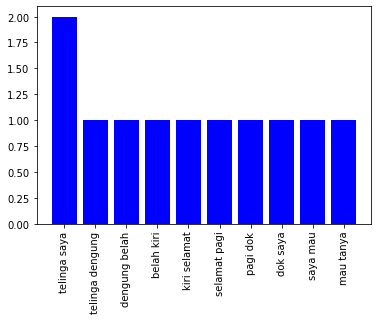

Similar Questions
{'telinga belah': 3, 'tidak kunjung': 3, 'istri saya': 2, 'bagin dalam': 2, 'dokter tht': 2, 'tht kata': 2, 'sih telinga': 2, 'dalam telinga': 2, 'ke dalam': 2, 'asa sumbat': 2, 'belah kanan': 2, 'sumbat dan': 2, 'sumbat ini': 2, 'juga sumbat': 2, 'telinga saya': 2, 'kunjung baik': 2, 'nyeri telinga': 1, 'telinga mau': 1, 'mau tanya': 1, 'tanya dok': 1, 'dok saat': 1, 'saat ini': 1, 'ini istri': 1, 'saya sering': 1, 'sering keluh': 1, 'keluh sakit': 1, 'sakit pada': 1, 'pada telinga': 1, 'telinga bagin': 1, 'dalam pernah': 1, 'pernah saya': 1, 'saya bawah': 1, 'bawah dia': 1, 'dia ke': 1, 'ke dokter': 1, 'kata dokter': 1, 'dokter telinga': 1, 'telinga jamur': 1, 'jamur dokter': 1, 'dokter sudah': 1, 'sudah sih': 1, 'telinga istri': 1, 'saya dan': 1, 'dan beri': 1, 'beri obat': 1, 'obat awal': 1, 'awal ada': 1, 'ada baik': 1, 'baik telah': 1, 'telah minggu': 1, 'minggu kambu': 1, 'kambu lagi': 1, 'lagi dan': 1, 'dan lihat': 1, 'lihat warna': 1, 'warna putih': 1, 'putih

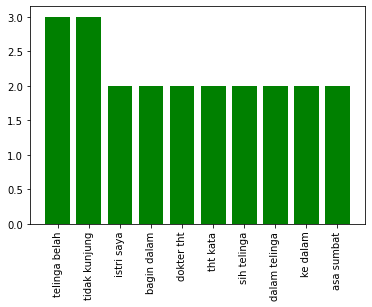



Question
{'maladaptive daydreaming': 2, 'saya buat': 2, 'biasa lamun': 1, 'lamun atau': 1, 'atau khayal': 1, 'khayal cara': 1, 'cara lebih': 1, 'lebih dok': 1, 'dok ini': 1, 'ini saya': 1, 'saya tahu': 1, 'tahu bahwa': 1, 'bahwa saya': 1, 'saya idap': 1, 'idap maladaptive': 1, 'daydreaming terkadang': 1, 'terkadang saya': 1, 'buat cerita': 1, 'cerita lalu': 1, 'lalu peran': 1, 'peran nya': 1, 'nya dan': 1, 'dan terkadang': 1, 'terkadang gera': 1, 'gera saya': 1, 'saya reflek': 1, 'reflek ikut': 1, 'ikut plot': 1, 'plot yang': 1, 'yang saya': 1, 'buat dok': 1, 'dok apakah': 1, 'apakah maladaptive': 1, 'daydreaming kait': 1, 'kait dengan': 1, 'dengan ganggu': 1, 'ganggu jiwa': 1, 'jiwa apa': 1, 'apa saya': 1, 'saya bisa': 1, 'bisa sembuh': 1}


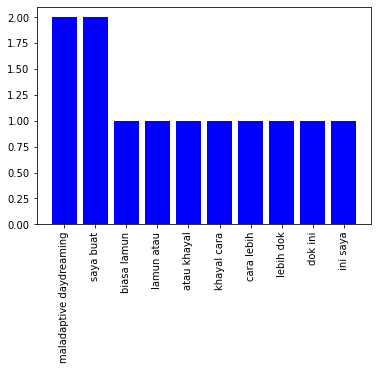

Similar Questions
{'saya alami': 4, 'dok saya': 3, 'saya rasa': 2, 'saya ingin': 2, 'ingin jadi': 2, 'saya tidak': 2, 'tidak ada': 2, 'karena saya': 2, 'saya sudah': 2, 'terima kasih': 2, 'ilmu jiwa': 2, 'apa saya': 1, 'saya kana': 1, 'kana sakit': 1, 'sakit bipolar': 1, 'bipolar apa': 1, 'apa solusi': 1, 'solusi dok': 1, 'saya orang': 1, 'orang gadis': 1, 'gadis tahun': 1, 'tahun saya': 1, 'alami di': 1, 'di mana': 1, 'mana sakit': 1, 'sakit terkadang': 1, 'terkadang saya': 1, 'alami kebahagian': 1, 'kebahagian yang': 1, 'yang lebih': 1, 'lebih terkadang': 1, 'terkadang telah': 1, 'telah itu': 1, 'itu saya': 1, 'alami sedih': 1, 'sedih yang': 1, 'yang amat': 1, 'amat sangat': 1, 'sangat yang': 1, 'yang buat': 1, 'buat saya': 1, 'saya menang': 1, 'menang hari': 1, 'hari saya': 1, 'alami ini': 1, 'ini sejak': 1, 'sejak saya': 1, 'rasa gagal': 1, 'gagal raih': 1, 'raih saya': 1, 'saya sejak': 1, 'sejak kecil': 1, 'kecil saya': 1, 'jadi orang': 1, 'orang awat': 1, 'awat dan': 1, 'dan psik

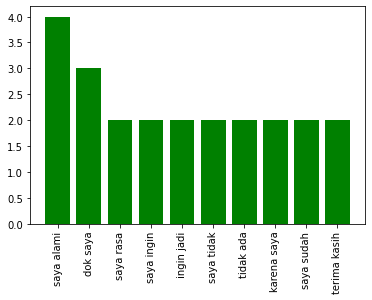



Question
{'jantung debar': 1, 'debar apakah': 1, 'apakah tanda': 1, 'tanda ada': 1, 'ada masalah': 1, 'masalah jantung': 1, 'jantung dear': 1, 'dear dokter': 1, 'dokter jantung': 1, 'jantung saya': 1, 'saya suka': 1, 'suka rasa': 1, 'rasa seperti': 1, 'seperti darah': 1, 'darah tidak': 1, 'tidak lancar': 1, 'lancar lama': 1, 'lama ini': 1, 'ini tidak': 1, 'tidak ada': 1, 'ada keluh': 1, 'keluh apa': 1, 'apa dan': 1, 'dan sehat': 1, 'sehat saya': 1, 'saya relatif': 1, 'relatif prima': 1, 'prima apakah': 1, 'apakah saya': 1, 'saya ada': 1, 'ada sakit': 1, 'sakit jantung': 1, 'jantung mohon': 1, 'mohon informasi': 1, 'informasi dok': 1, 'dok terima': 1, 'terima kasih': 1, 'kasih atas': 1, 'atas atensi': 1, 'atensi salam': 1, 'salam hormat': 1}


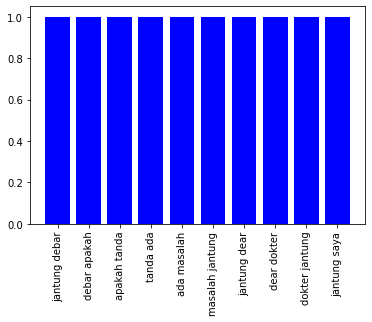

Similar Questions
{'sebab sakit': 2, 'sakit jantung': 2, 'jantung dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya apa': 1, 'apa sih': 1, 'sih sebab': 1, 'jantung bagaimana': 1, 'bagaimana jadi': 1, 'jadi terima': 1, 'terima kasih': 1}


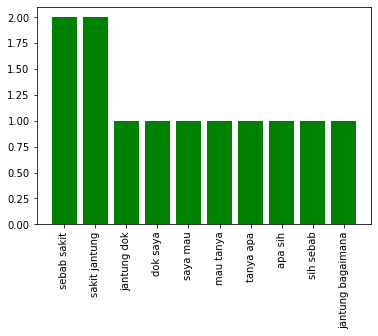



Question
{'makan mi': 2, 'mi instan': 2, 'tiap hari': 2, 'bahaya makan': 1, 'instan tiap': 1, 'hari dok': 1, 'dok bahaya': 1, 'bahaya tidak': 1, 'tidak saya': 1, 'saya selalu': 1, 'selalu makan': 1, 'instan hampir': 1, 'hampir tiap': 1, 'hari atau': 1, 'atau terkadang': 1, 'terkadang saya': 1, 'saya konsumsi': 1, 'konsumsi hari': 1, 'hari bisa': 1, 'bisa dua': 1, 'dua sampai': 1, 'sampai tiga': 1, 'tiga kali': 1, 'kali maklum': 1, 'maklum dok': 1, 'dok saya': 1, 'saya anak': 1, 'anak kost': 1, 'kost rantau': 1, 'rantau dari': 1, 'dari seberang': 1}


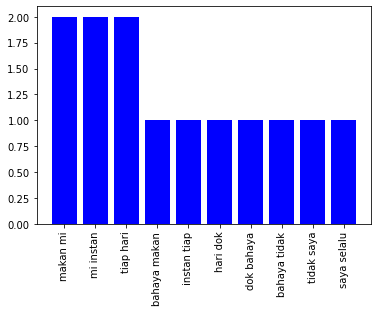

Similar Questions
{'mie instan': 2, 'kandung gizi': 2, 'atau tidak': 2, 'apakah air': 1, 'air bekas': 1, 'bekas masak': 1, 'masak mie': 1, 'instan milik': 1, 'milik kandung': 1, 'gizi selamat': 1, 'selamat malam': 1, 'malam dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya nih': 1, 'nih saya': 1, 'saya masih': 1, 'masih bingung': 1, 'bingung dan': 1, 'dan khawatir': 1, 'khawatir soal': 1, 'soal makan': 1, 'makan mie': 1, 'instan yang': 1, 'yang baik': 1, 'baik dan': 1, 'dan benar': 1, 'benar gimana': 1, 'gimana nah': 1, 'nah ketika': 1, 'ketika saya': 1, 'saya browsing': 1, 'browsing di': 1, 'di internet': 1, 'internet kena': 1, 'kena bumbu': 1, 'bumbu mie': 1, 'mie instant': 1, 'instant bahaya': 1, 'bahaya atau': 1, 'tidak muncul': 1, 'muncul artikel': 1, 'artikel yang': 1, 'yang nyata': 1, 'nyata bahwa': 1, 'bahwa air': 1, 'air rebus': 1, 'rebus mie': 1, 'mie jangan': 1, 'jangan buang': 1, 'buang karena': 1, 'karena mwngandung': 1, 'mwngandung kandung': 1, 'gizi yang': 1,

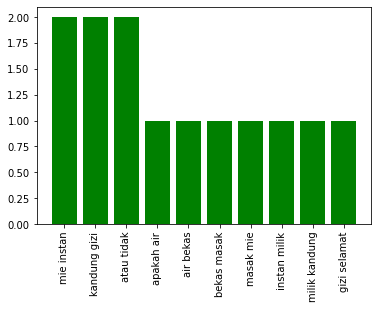



Question
{'kena belek': 2, 'atas ganggu': 1, 'ganggu lihat': 1, 'lihat usai': 1, 'usai kena': 1, 'belek dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya soal': 1, 'soal mata': 1, 'mata saya': 1, 'saya minggu': 1, 'minggu lalu': 1, 'lalu saya': 1, 'saya kena': 1, 'belek dan': 1, 'dan sekarang': 1, 'sekarang sudah': 1, 'sudah hilang': 1, 'hilang belek': 1, 'belek akan': 1, 'akan tetapi': 1, 'tetapi lihat': 1, 'lihat saya': 1, 'saya jadi': 1, 'jadi agak': 1, 'agak kurang': 1, 'kurang jelas': 1, 'jelas apa': 1, 'apa yang': 1, 'yang harus': 1, 'harus saya': 1, 'saya laku': 1, 'laku dok': 1, 'dok apa': 1, 'apa ada': 1, 'ada cara': 1, 'cara alami': 1, 'alami sembuh': 1, 'sembuh supaya': 1, 'supaya kembali': 1, 'kembali normal': 1, 'normal terima': 1, 'terima kasih': 1, 'kasih dok': 1, 'dok info': 1, 'info dan': 1, 'dan saran': 1}


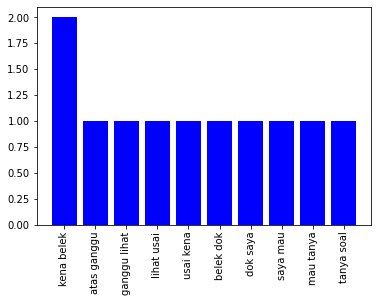

Similar Questions
{'mata saya': 3, 'saya mau': 2, 'mau tanya': 2, 'di bola': 2, 'bola mata': 2, 'lampu seperti': 2, 'bunderan putih': 2, 'terima kasih': 2, 'juga saat': 2, 'saat pandang': 2, 'di keliling': 2, 'keliling lampu': 2, 'dari dokter': 2, 'dokter sekali': 2, 'lihat buram': 1, 'buram dok': 1, 'dok saya': 1, 'tanya kenapa': 1, 'kenapa ya': 1, 'ya mata': 1, 'mata belah': 1, 'belah kanan': 1, 'kanan saya': 1, 'saya sudah': 1, 'sudah tahun': 1, 'tahun blakangan': 1, 'blakangan ini': 1, 'ini seperti': 1, 'seperti ada': 1, 'ada yang': 1, 'yang ganjal': 1, 'ganjal dan': 1, 'dan agak': 1, 'agak buram': 1, 'buram di': 1, 'mata kalau': 1, 'kalau lihat': 1, 'lihat lampu': 1, 'seperti silau': 1, 'silau telah': 1, 'telah saya': 1, 'saya pergi': 1, 'pergi ke': 1, 'ke dokter': 1, 'dokter dan': 1, 'dan di': 1, 'di lihat': 1, 'lihat dengan': 1, 'dengan alat': 1, 'alat nyata': 1, 'nyata di': 1, 'saya ada': 1, 'ada bunderan': 1, 'putih yang': 1, 'yang tutup': 1, 'tutup retina': 1, 'retina tetapi'

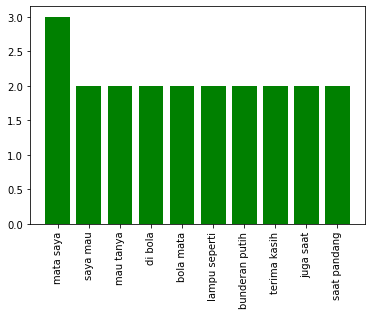



Question
{'beberapa bulan': 2, 'dari tenggorok': 2, 'flu dan': 2, 'lendir dalam': 1, 'dalam tenggoroka': 1, 'tenggoroka yang': 1, 'yang sudah': 1, 'sudah lama': 1, 'lama saya': 1, 'saya sudah': 1, 'sudah lebih': 1, 'lebih beberapa': 1, 'bulan dok': 1, 'dok selalu': 1, 'selalu keluar': 1, 'keluar lendir': 1, 'lendir dari': 1, 'tenggorok dan': 1, 'dan asa': 1, 'asa skl': 1, 'skl kalau': 1, 'kalau tenggorok': 1, 'tenggorok ada': 1, 'ada lendir': 1, 'lendir saya': 1, 'saya tidak': 1, 'tidak lagi': 1, 'lagi flu': 1, 'dan beberapa': 1, 'bulan tidak': 1, 'tidak pernah': 1, 'pernah flu': 1, 'dan ada': 1, 'ada bau': 1, 'bau sengat': 1, 'sengat yang': 1, 'yang keluar': 1, 'keluar dari': 1, 'tenggorok itu': 1, 'itu sakit': 1, 'sakit apa': 1, 'apa biasa': 1, 'biasa dok': 1}


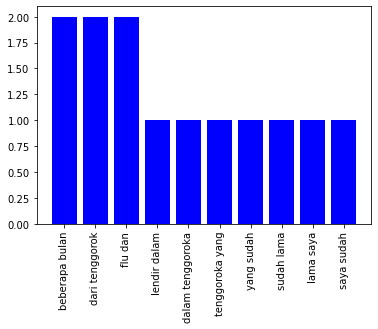

Similar Questions
{'saya rasa': 3, 'pasta gigi': 3, 'tenggorok saya': 2, 'rasa mual': 2, 'pakai pasta': 2, 'gigi yang': 2, 'tetapi lendir': 2, 'tenggorok lendir': 1, 'lendir tenggorok': 1, 'saya sudah': 1, 'sudah lama': 1, 'lama asa': 1, 'asa ada': 1, 'ada lendir': 1, 'lendir hal': 1, 'hal ini': 1, 'ini sudah': 1, 'sudah langsung': 1, 'langsung lama': 1, 'lama bulan': 1, 'bulan saat': 1, 'saat gosok': 1, 'gosok gigi': 1, 'gigi saya': 1, 'mual bahkan': 1, 'bahkan muntah': 1, 'muntah jika': 1, 'jika pakai': 1, 'yang biasa': 1, 'biasa akhir': 1, 'akhir saya': 1, 'saya ganti': 1, 'ganti dengan': 1, 'dengan pasta': 1, 'yang bening': 1, 'bening dengan': 1, 'dengan pakai': 1, 'gigi sebut': 1, 'sebut rasa': 1, 'mual tidak': 1, 'tidak jadi': 1, 'jadi lagi': 1, 'lagi tetapi': 1, 'lendir di': 1, 'di tenggorok': 1, 'tenggorok masih': 1, 'masih saja': 1, 'saja saya': 1, 'rasa pernah': 1, 'pernah ke': 1, 'ke dokter': 1, 'dokter kata': 1, 'kata cuma': 1, 'cuma kena': 1, 'kena debu': 1, 'debu dan': 1,

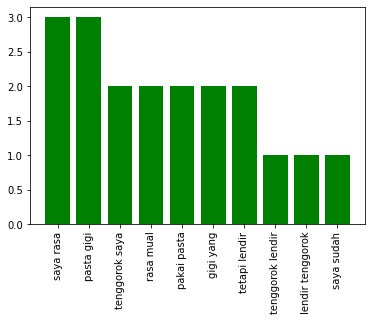



Question
{'punya anak': 2, 'anak lagi': 2, 'ingin hamil': 1, 'hamil pasca': 1, 'pasca steril': 1, 'steril saya': 1, 'saya usia': 1, 'usia tahun': 1, 'tahun sudah': 1, 'sudah kali': 1, 'kali caesar': 1, 'caesar akhir': 1, 'akhir mei': 1, 'mei dan': 1, 'dan putus': 1, 'putus untuk': 1, 'untuk langsung': 1, 'langsung steril': 1, 'steril sekarang': 1, 'sekarang suami': 1, 'suami ingin': 1, 'ingin punya': 1, 'lagi karena': 1, 'karena anak': 1, 'anak kami': 1, 'kami cewek': 1, 'cewek tiga': 1, 'tiga saya': 1, 'saya steril': 1, 'steril potong': 1, 'potong apa': 1, 'apa bisa': 1, 'bisa saya': 1, 'saya punya': 1, 'lagi apa': 1, 'apa bayi': 1, 'bayi tabung': 1, 'tabung bisa': 1, 'bisa jadi': 1, 'jadi solusi': 1, 'solusi nya': 1}


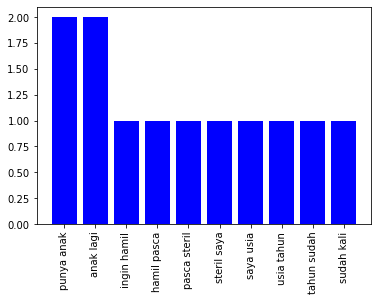

Similar Questions
{'bisa lahir': 3, 'jarak tahun': 3, 'lahir normal': 2, 'saya rencana': 2, 'anak pertama': 2, 'tahun dengan': 2, 'dengan anak': 2, 'apa tidak': 2, 'kali caesar': 2, 'kali operasi': 1, 'operasi caesar': 1, 'caesar bisa': 1, 'normal dokter': 1, 'dokter saya': 1, 'rencana mau': 1, 'mau punya': 1, 'punya anak': 1, 'anak lagi': 1, 'lagi anak': 1, 'pertama dan': 1, 'dan dua': 1, 'dua nya': 1, 'nya lahir': 1, 'lahir cara': 1, 'cara caesar': 1, 'caesar anak': 1, 'pertama karena': 1, 'karena sungsang': 1, 'sungsang yang': 1, 'yang kata': 1, 'kata dokter': 1, 'dokter karena': 1, 'karena bayi': 1, 'bayi belum': 1, 'belum turun': 1, 'turun ke': 1, 'ke jalan': 1, 'jalan lahir': 1, 'lahir padahal': 1, 'padahal sudah': 1, 'sudah bulan': 1, 'bulan lebih': 1, 'lebih tetapi': 1, 'tetapi caesar': 1, 'caesar waktu': 1, 'waktu rencana': 1, 'rencana lebih': 1, 'lebih dahulu': 1, 'dahulu bukan': 1, 'bukan dadak': 1, 'dadak saya': 1, 'rencana lahir': 1, 'lahir ikut': 1, 'ikut jarak': 1, 'tahu

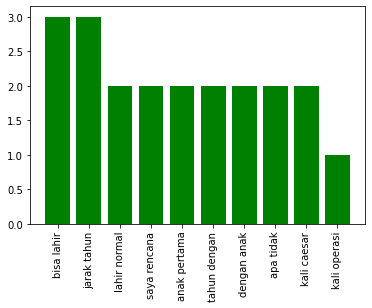



Question
{'hbv dna': 2, 'dna dan': 1, 'dan sgpt': 1, 'sgpt ot': 1, 'ot assalamualaikum': 1, 'assalamualaikum dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya suami': 1, 'suami sudah': 1, 'sudah hampir': 1, 'hampir rutin': 1, 'rutin kontrol': 1, 'kontrol hepatitis': 1, 'hepatitis hasil': 1, 'hasil lab': 1, 'lab akhir': 1, 'akhir hbv': 1, 'dna kuantitatif': 1, 'kuantitatif not': 1, 'not detected': 1, 'detected maksud': 1, 'maksud apa': 1, 'apa ya': 1, 'ya dok': 1, 'dok lalu': 1, 'lalu tes': 1, 'tes sgpt': 1, 'sgpt mohon': 1, 'mohon jelas': 1, 'jelas terima': 1, 'terima kasih': 1, 'kasih dok': 1}


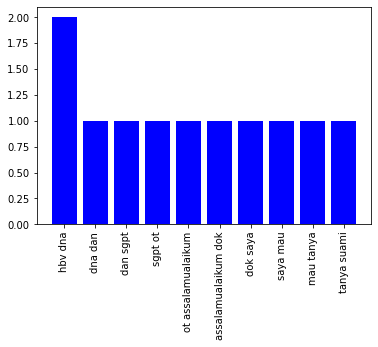

Similar Questions
{'golong darah': 4, 'dok saya': 3, 'saya mau': 3, 'mau tanya': 3, 'tanya cara': 2, 'tes dna': 2, 'anak kandung': 2, 'kandung saya': 2, 'cara mene': 1, 'mene dok': 1, 'cara tentu': 1, 'tentu identitas': 1, 'identitas orang': 1, 'orang selain': 1, 'selain tes': 1, 'tes golong': 1, 'darah dan': 1, 'dan tes': 1, 'dna ada': 1, 'ada apa': 1, 'apa lagi': 1, 'lagi y': 1, 'y dok': 1, 'dok yang': 1, 'yang lebih': 1, 'lebih akurat': 1, 'akurat terima': 1, 'terima kasih': 1, 'ingin tes': 1, 'dna anak': 1, 'anak salam': 1, 'salam hormat': 1, 'hormat dok': 1, 'tanya golong': 1, 'darah saya': 1, 'saya o': 1, 'o istri': 1, 'istri saya': 1, 'saya b': 1, 'b lalu': 1, 'lalu anak': 1, 'anak saya': 1, 'saya golong': 1, 'darah nya': 1, 'nya b': 1, 'b itu': 1, 'itu arti': 1, 'arti anak': 1, 'saya dok': 1, 'dok apakah': 1, 'apakah bisa': 1, 'bisa dari': 1, 'dari golong': 1, 'darah bisa': 1, 'bisa tahu': 1, 'tahu apakah': 1, 'apakah ini': 1, 'ini anak': 1, 'saya berapa': 1, 'berapa biaya': 1,

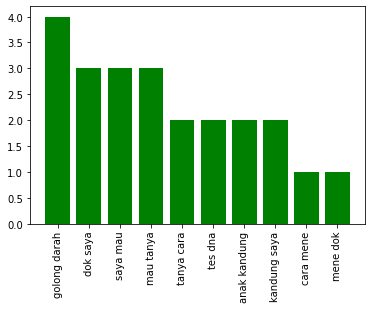



Question
{'bercak putih': 2, 'anak saya': 2, 'putih di': 1, 'di wajah': 1, 'wajah hallo': 1, 'hallo dok': 1, 'dok saya': 1, 'saya ingin': 1, 'ingin tanya': 1, 'tanya kenapa': 1, 'kenapa wajah': 1, 'wajah anak': 1, 'saya ada': 1, 'ada bercak': 1, 'putih seperti': 1, 'seperti panu': 1, 'panu usia': 1, 'usia anak': 1, 'saya bulan': 1, 'bulan apa': 1, 'apa ya': 1, 'ya obat': 1, 'obat terima': 1, 'terima kasih': 1}


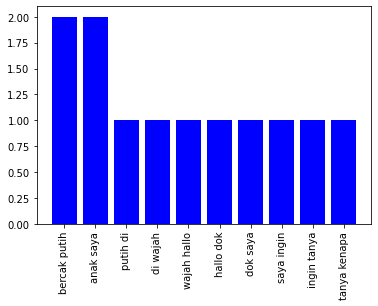

Similar Questions
{'anak saya': 2, 'selamat malam': 1, 'malam mau': 1, 'mau tanya': 1, 'tanya anak': 1, 'anak gadis': 1, 'gadis saya': 1, 'saya saat': 1, 'saat ini': 1, 'ini sedang': 1, 'sedang bingung': 1, 'bingung bagaimana': 1, 'bagaimana cara': 1, 'cara obat': 1, 'obat timbul': 1, 'timbul sedikit': 1, 'sedikit tetapi': 1, 'tetapi tambah': 1, 'tambah obat': 1, 'obat kulit': 1, 'kulit yang': 1, 'yang pakai': 1, 'pakai sama': 1, 'sama anak': 1, 'saya tetapi': 1, 'tetapi satu': 1, 'satu belum': 1, 'belum ada': 1, 'ada yang': 1, 'yang hasil': 1, 'hasil jadi': 1, 'jadi bagaimana': 1, 'bagaimana dok': 1, 'dok obat': 1, 'obat apa': 1, 'apa bisa': 1, 'bisa cepat': 1, 'cepat sembuh': 1, 'sembuh merah': 1, 'merah sebut': 1, 'sebut tanpa': 1, 'tanpa bekas': 1, 'bekas terus': 1, 'terus terang': 1, 'terang anak': 1, 'saya kerja': 1, 'kerja jadi': 1, 'jadi malu': 1, 'malu kalau': 1, 'kalau pakai': 1}


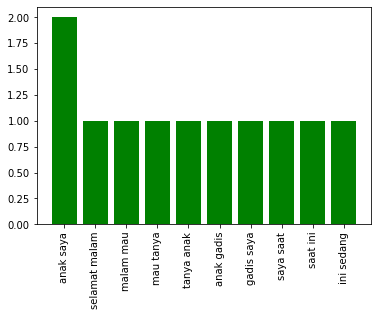



Question
{'operasi caesar': 2, 'nyeri perut': 1, 'perut pasca': 1, 'pasca operasi': 1, 'caesar hallo': 1, 'hallo dok': 1, 'dok langsung': 1, 'langsung saja': 1, 'saja ya': 1, 'ya saya': 1, 'saya bulan': 1, 'bulan yang': 1, 'yang lalu': 1, 'lalu habis': 1, 'habis operasi': 1, 'caesar trz': 1, 'trz langsung': 1, 'langsung steril': 1, 'steril tpii': 1, 'tpii sudah': 1, 'sudah berapa': 1, 'berapa hari': 1, 'hari ini': 1, 'ini perut': 1, 'perut saya': 1, 'saya asa': 1, 'asa nyeri': 1, 'nyeri utama': 1, 'utama perut': 1, 'perut bagi': 1, 'bagi bawah': 1, 'bawah pas': 1, 'pas jahit': 1, 'jahit sampai': 1, 'sampai saya': 1, 'saya alami': 1, 'alami panas': 1, 'panas dingin': 1, 'dingin itu': 1, 'itu kenapa': 1, 'kenapa ya': 1, 'ya dok': 1, 'dok saya': 1, 'saya takut': 1, 'takut kalau': 1, 'kalau jahit': 1, 'jahit saya': 1, 'saya masalah': 1, 'masalah karena': 1, 'karena telah': 1, 'telah lahir': 1, 'lahir langsung': 1, 'langsung beraktifitas': 1, 'beraktifitas seperti': 1, 'seperti biasa': 1,

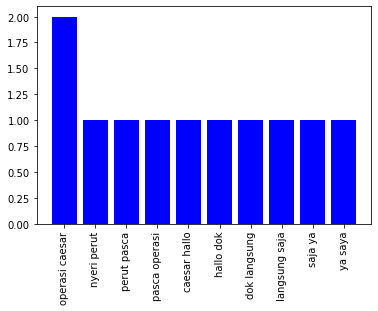

Similar Questions
{'istri saya': 2, 'induksi pasca': 1, 'pasca caesar': 1, 'caesar kandung': 1, 'kandung istri': 1, 'saya saat': 1, 'saat ini': 1, 'ini pasuk': 1, 'pasuk usia': 1, 'usia minggu': 1, 'minggu namun': 1, 'namun belum': 1, 'belum ada': 1, 'ada kontraksi': 1, 'kontraksi namun': 1, 'namun dokter': 1, 'dokter kata': 1, 'kata tidak': 1, 'tidak bisa': 1, 'bisa di': 1, 'di induksi': 1, 'induksi karena': 1, 'karena istri': 1, 'saya pernah': 1, 'pernah operasi': 1, 'operasi caesar': 1, 'caesar untuk': 1, 'untuk anak': 1, 'anak dua': 1, 'dua anak': 1, 'anak tiga': 1, 'tiga normal': 1, 'normal kini': 1, 'kini anak': 1, 'anak nomor': 1, 'nomor yang': 1, 'yang caesar': 1, 'caesar sudah': 1, 'sudah ber': 1, 'ber usia': 1, 'usia tahun': 1, 'tahun apakah': 1, 'apakah induksi': 1, 'induksi tidak': 1, 'tidak boleh': 1, 'boleh di': 1, 'di laku': 1, 'laku meski': 1, 'meski proses': 1, 'proses caesar': 1, 'caesar nya': 1, 'nya telah': 1, 'telah langsung': 1, 'langsung tahun': 1, 'tahun yang': 

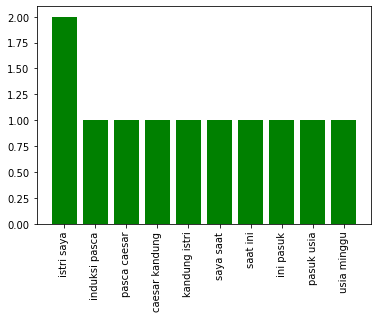



Question
{'susu formula': 5, 'sudah tidak': 2, 'tidak mau': 2, 'mau minum': 2, 'minum susu': 2, 'bayi saya': 2, 'beri susu': 2, 'saya tinggal': 2, 'tinggal kerja': 2, 'belum saya': 2, 'bayi sudah': 1, 'formula sudah': 1, 'sudah minggu': 1, 'minggu ini': 1, 'ini dok': 1, 'dok bayi': 1, 'saya bulan': 1, 'bulan sudah': 1, 'mau beri': 1, 'formula lama': 1, 'lama saya': 1, 'kerja sehingga': 1, 'sehingga hanya': 1, 'hanya minum': 1, 'minum asi': 1, 'asi saya': 1, 'saya belum': 1, 'saya berangkat': 1, 'berangkat kerja': 1, 'kerja dan': 1, 'dan telah': 1, 'telah saya': 1, 'saya kerja': 1, 'kerja antara': 1, 'antara waktu': 1, 'waktu sebut': 1, 'sebut kerja': 1, 'kerja keluarga': 1, 'keluarga hanya': 1, 'hanya beri': 1, 'beri air': 1, 'air putih': 1, 'putih dan': 1, 'dan teh': 1, 'teh manis': 1, 'manis pertannyaanya': 1, 'pertannyaanya bagaimana': 1, 'bagaimana tindak': 1, 'tindak yang': 1, 'yang harus': 1, 'harus saya': 1, 'saya ambil': 1, 'ambil agar': 1, 'agar si': 1, 'si bayi': 1, 'bayi k

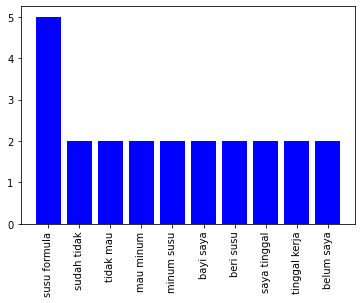

Similar Questions
{'susu formula': 3, 'untuk anak': 2, 'dan saya': 2, 'untuk bayi': 2, 'formula yang': 2, 'pilih susu': 1, 'formula untuk': 1, 'anak dok': 1, 'dok saya': 1, 'saya punya': 1, 'punya anak': 1, 'anak umur': 1, 'umur bulan': 1, 'bulan dan': 1, 'saya akan': 1, 'akan beri': 1, 'beri makan': 1, 'makan damping': 1, 'damping asi': 1, 'asi dan': 1, 'saya ingin': 1, 'ingin buat': 1, 'buat makan': 1, 'makan itu': 1, 'itu sendiri': 1, 'sendiri untuk': 1, 'bayi saya': 1, 'saya namun': 1, 'namun saya': 1, 'saya bingung': 1, 'bingung dengan': 1, 'dengan susu': 1, 'yang akan': 1, 'akan saya': 1, 'saya beli': 1, 'beli jadi': 1, 'jadi pertayaan': 1, 'pertayaan saya': 1, 'saya susu': 1, 'yang baik': 1, 'baik untuk': 1, 'bayi itu': 1, 'itu merknya': 1, 'merknya apa': 1, 'apa karena': 1, 'karena saya': 1, 'saya rencana': 1, 'rencana mau': 1, 'mau buat': 1, 'buat bubur': 1, 'bubur susu': 1, 'susu untuk': 1, 'anak saya': 1}


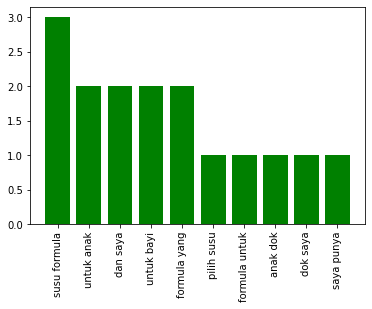



Question
{'mental disorder': 2, 'gadis sebut': 2, 'disorder atau': 1, 'atau tidak': 1, 'tidak salam': 1, 'salam saya': 1, 'saya ada': 1, 'ada pernah': 1, 'pernah dekat': 1, 'dekat dengan': 1, 'dengan orang': 1, 'orang gadis': 1, 'gadis cantik': 1, 'cantik sekitar': 1, 'sekitar umur': 1, 'umur atau': 1, 'atau tahun': 1, 'tahun tetapi': 1, 'tetapi saat': 1, 'saat saya': 1, 'saya ajak': 1, 'ajak obrol': 1, 'obrol hanya': 1, 'hanya saja': 1, 'saja dia': 1, 'dia cuma': 1, 'cuma bicara': 1, 'bicara patah': 1, 'patah kata': 1, 'kata waktu': 1, 'waktu itu': 1, 'itu sambil': 1, 'sambil tertawa': 1, 'tertawa dengan': 1, 'dengan muka': 1, 'muka merah': 1, 'merah lalu': 1, 'lalu gadis': 1, 'gadis itu': 1, 'itu waktu': 1, 'waktu luar': 1, 'luar kantor': 1, 'kantor habis': 1, 'habis makan': 1, 'makan siang': 1, 'siang tuju': 1, 'tuju ruang': 1, 'ruang ke': 1, 'ke meja': 1, 'meja saya': 1, 'saya sempat': 1, 'sempat kejar': 1, 'kejar dengan': 1, 'dengan maksud': 1, 'maksud ada': 1, 'ada cakap': 1, '

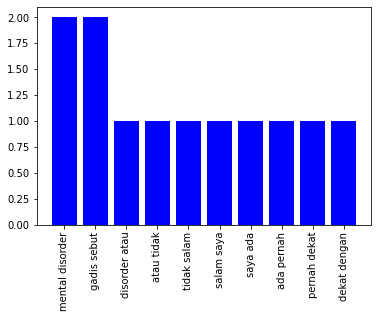

Similar Questions
{'bisa tunjuk': 2, 'yang bisa': 2, 'sama nenek': 2, 'saya kerja': 2, 'anak tahun': 1, 'tahun kok': 1, 'kok belum': 1, 'belum lancar': 1, 'lancar bicara': 1, 'bicara jakarta': 1, 'jakarta assalaamualaikum': 1, 'assalaamualaikum mbak': 1, 'mbak saya': 1, 'saya punya': 1, 'punya anak': 1, 'anak usia': 1, 'usia tahun': 1, 'tahun dia': 1, 'dia sangat': 1, 'sangat aktif': 1, 'aktif gerak': 1, 'gerak cepat': 1, 'cepat tiru': 1, 'tiru gera': 1, 'gera kalau': 1, 'kalau tanya': 1, 'tanya anggota': 1, 'anggota badan': 1, 'badan sudah': 1, 'sudah bisa': 1, 'tunjuk di': 1, 'di rumah': 1, 'rumah juga': 1, 'juga sudah': 1, 'sudah tahu': 1, 'tahu tetapi': 1, 'tetapi itu': 1, 'itu mbak': 1, 'mbak hanya': 1, 'hanya bisa': 1, 'tunjuk saja': 1, 'saja belum': 1, 'belum bisa': 1, 'bisa pakai': 1, 'pakai yang': 1, 'bisa ya': 1, 'ya tidak': 1, 'tidak makan': 1, 'makan minum': 1, 'minum terus': 1, 'terus ada': 1, 'ada lagi': 1, 'lagi tetapi': 1, 'tetapi tidak': 1, 'tidak jelas': 1, 'jelas kal

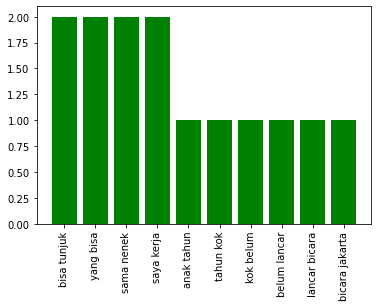

In [600]:
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(2, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(2, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Bigram Overlap

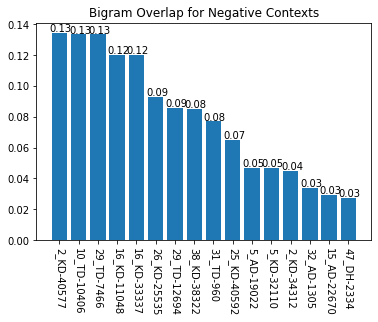

In [601]:
bigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(2, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(2, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
bigram_overlap = dict(sorted(bigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(bigram_overlap.keys()), list(bigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Bigram Overlap for Negative Contexts")
for i, v in enumerate(list(bigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Trigram Analysis

Question
{'telinga dengung belah': 1, 'dengung belah kiri': 1, 'belah kiri selamat': 1, 'kiri selamat pagi': 1, 'selamat pagi dok': 1, 'pagi dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya kenapa': 1, 'tanya kenapa telinga': 1, 'kenapa telinga saya': 1, 'telinga saya denging': 1, 'saya denging terus': 1, 'denging terus ya': 1, 'terus ya dok': 1, 'ya dok sudah': 1, 'dok sudah hari': 1, 'sudah hari saya': 1, 'hari saya juga': 1, 'saya juga sudah': 1, 'juga sudah ke': 1, 'sudah ke puskesmas': 1, 'ke puskesmas untuk': 1, 'puskesmas untuk di': 1, 'untuk di periksa': 1, 'di periksa kata': 1, 'periksa kata dokter': 1, 'kata dokter telinga': 1, 'dokter telinga kotor': 1, 'telinga kotor karena': 1, 'kotor karena di': 1, 'karena di sih': 1, 'di sih dengan': 1, 'sih dengan cutton': 1, 'dengan cutton buds': 1, 'cutton buds jadi': 1, 'buds jadi kotor': 1, 'jadi kotor dorong': 1, 'kotor dorong hingga': 1, 'dorong hingga tutup': 1, 'hingga tutup gendang': 1, 'tutup gendang telinga': 

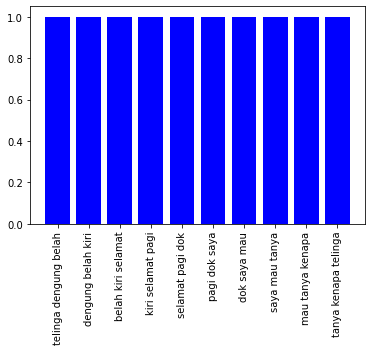

Similar Questions
{'telinga belah kanan': 2, 'tidak kunjung baik': 2, 'nyeri telinga mau': 1, 'telinga mau tanya': 1, 'mau tanya dok': 1, 'tanya dok saat': 1, 'dok saat ini': 1, 'saat ini istri': 1, 'ini istri saya': 1, 'istri saya sering': 1, 'saya sering keluh': 1, 'sering keluh sakit': 1, 'keluh sakit pada': 1, 'sakit pada telinga': 1, 'pada telinga bagin': 1, 'telinga bagin dalam': 1, 'bagin dalam pernah': 1, 'dalam pernah saya': 1, 'pernah saya bawah': 1, 'saya bawah dia': 1, 'bawah dia ke': 1, 'dia ke dokter': 1, 'ke dokter tht': 1, 'dokter tht kata': 1, 'tht kata dokter': 1, 'kata dokter telinga': 1, 'dokter telinga jamur': 1, 'telinga jamur dokter': 1, 'jamur dokter sudah': 1, 'dokter sudah sih': 1, 'sudah sih telinga': 1, 'sih telinga istri': 1, 'telinga istri saya': 1, 'istri saya dan': 1, 'saya dan beri': 1, 'dan beri obat': 1, 'beri obat awal': 1, 'obat awal ada': 1, 'awal ada baik': 1, 'ada baik telah': 1, 'baik telah minggu': 1, 'telah minggu kambu': 1, 'minggu kambu lagi

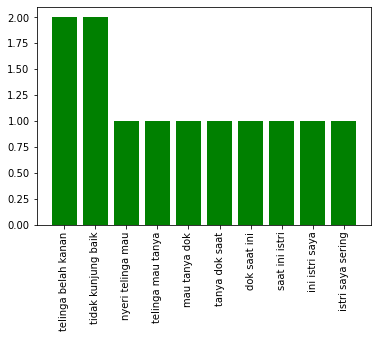



Question
{'biasa lamun atau': 1, 'lamun atau khayal': 1, 'atau khayal cara': 1, 'khayal cara lebih': 1, 'cara lebih dok': 1, 'lebih dok ini': 1, 'dok ini saya': 1, 'ini saya tahu': 1, 'saya tahu bahwa': 1, 'tahu bahwa saya': 1, 'bahwa saya idap': 1, 'saya idap maladaptive': 1, 'idap maladaptive daydreaming': 1, 'maladaptive daydreaming terkadang': 1, 'daydreaming terkadang saya': 1, 'terkadang saya buat': 1, 'saya buat cerita': 1, 'buat cerita lalu': 1, 'cerita lalu peran': 1, 'lalu peran nya': 1, 'peran nya dan': 1, 'nya dan terkadang': 1, 'dan terkadang gera': 1, 'terkadang gera saya': 1, 'gera saya reflek': 1, 'saya reflek ikut': 1, 'reflek ikut plot': 1, 'ikut plot yang': 1, 'plot yang saya': 1, 'yang saya buat': 1, 'saya buat dok': 1, 'buat dok apakah': 1, 'dok apakah maladaptive': 1, 'apakah maladaptive daydreaming': 1, 'maladaptive daydreaming kait': 1, 'daydreaming kait dengan': 1, 'kait dengan ganggu': 1, 'dengan ganggu jiwa': 1, 'ganggu jiwa apa': 1, 'jiwa apa saya': 1, 'ap

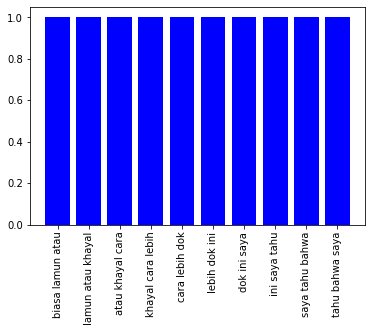

Similar Questions
{'saya ingin jadi': 2, 'apa saya kana': 1, 'saya kana sakit': 1, 'kana sakit bipolar': 1, 'sakit bipolar apa': 1, 'bipolar apa solusi': 1, 'apa solusi dok': 1, 'solusi dok saya': 1, 'dok saya orang': 1, 'saya orang gadis': 1, 'orang gadis tahun': 1, 'gadis tahun saya': 1, 'tahun saya alami': 1, 'saya alami di': 1, 'alami di mana': 1, 'di mana sakit': 1, 'mana sakit terkadang': 1, 'sakit terkadang saya': 1, 'terkadang saya alami': 1, 'saya alami kebahagian': 1, 'alami kebahagian yang': 1, 'kebahagian yang lebih': 1, 'yang lebih terkadang': 1, 'lebih terkadang telah': 1, 'terkadang telah itu': 1, 'telah itu saya': 1, 'itu saya alami': 1, 'saya alami sedih': 1, 'alami sedih yang': 1, 'sedih yang amat': 1, 'yang amat sangat': 1, 'amat sangat yang': 1, 'sangat yang buat': 1, 'yang buat saya': 1, 'buat saya menang': 1, 'saya menang hari': 1, 'menang hari saya': 1, 'hari saya alami': 1, 'saya alami ini': 1, 'alami ini sejak': 1, 'ini sejak saya': 1, 'sejak saya rasa': 1, 'sa

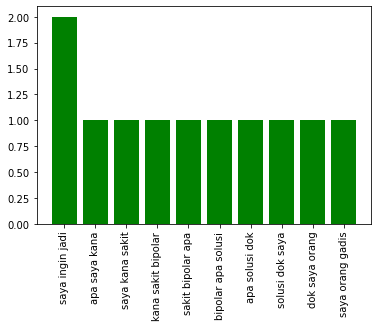



Question
{'jantung debar apakah': 1, 'debar apakah tanda': 1, 'apakah tanda ada': 1, 'tanda ada masalah': 1, 'ada masalah jantung': 1, 'masalah jantung dear': 1, 'jantung dear dokter': 1, 'dear dokter jantung': 1, 'dokter jantung saya': 1, 'jantung saya suka': 1, 'saya suka rasa': 1, 'suka rasa seperti': 1, 'rasa seperti darah': 1, 'seperti darah tidak': 1, 'darah tidak lancar': 1, 'tidak lancar lama': 1, 'lancar lama ini': 1, 'lama ini tidak': 1, 'ini tidak ada': 1, 'tidak ada keluh': 1, 'ada keluh apa': 1, 'keluh apa dan': 1, 'apa dan sehat': 1, 'dan sehat saya': 1, 'sehat saya relatif': 1, 'saya relatif prima': 1, 'relatif prima apakah': 1, 'prima apakah saya': 1, 'apakah saya ada': 1, 'saya ada sakit': 1, 'ada sakit jantung': 1, 'sakit jantung mohon': 1, 'jantung mohon informasi': 1, 'mohon informasi dok': 1, 'informasi dok terima': 1, 'dok terima kasih': 1, 'terima kasih atas': 1, 'kasih atas atensi': 1, 'atas atensi salam': 1, 'atensi salam hormat': 1}


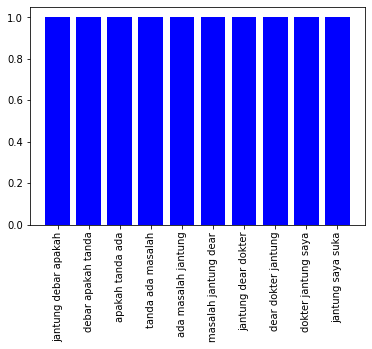

Similar Questions
{'sebab sakit jantung': 2, 'sakit jantung dok': 1, 'jantung dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya apa': 1, 'tanya apa sih': 1, 'apa sih sebab': 1, 'sih sebab sakit': 1, 'sakit jantung bagaimana': 1, 'jantung bagaimana jadi': 1, 'bagaimana jadi terima': 1, 'jadi terima kasih': 1}


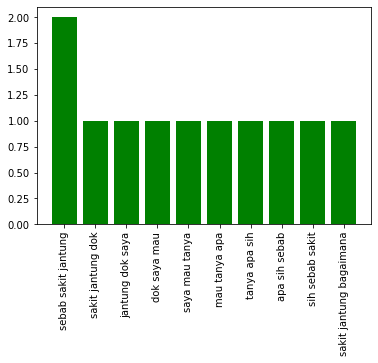



Question
{'makan mi instan': 2, 'bahaya makan mi': 1, 'mi instan tiap': 1, 'instan tiap hari': 1, 'tiap hari dok': 1, 'hari dok bahaya': 1, 'dok bahaya tidak': 1, 'bahaya tidak saya': 1, 'tidak saya selalu': 1, 'saya selalu makan': 1, 'selalu makan mi': 1, 'mi instan hampir': 1, 'instan hampir tiap': 1, 'hampir tiap hari': 1, 'tiap hari atau': 1, 'hari atau terkadang': 1, 'atau terkadang saya': 1, 'terkadang saya konsumsi': 1, 'saya konsumsi hari': 1, 'konsumsi hari bisa': 1, 'hari bisa dua': 1, 'bisa dua sampai': 1, 'dua sampai tiga': 1, 'sampai tiga kali': 1, 'tiga kali maklum': 1, 'kali maklum dok': 1, 'maklum dok saya': 1, 'dok saya anak': 1, 'saya anak kost': 1, 'anak kost rantau': 1, 'kost rantau dari': 1, 'rantau dari seberang': 1}


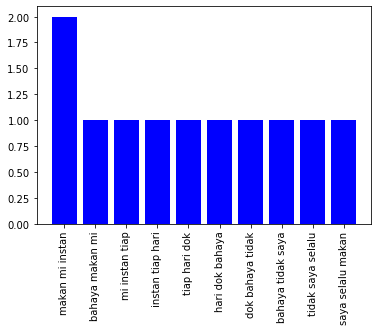

Similar Questions
{'apakah air bekas': 1, 'air bekas masak': 1, 'bekas masak mie': 1, 'masak mie instan': 1, 'mie instan milik': 1, 'instan milik kandung': 1, 'milik kandung gizi': 1, 'kandung gizi selamat': 1, 'gizi selamat malam': 1, 'selamat malam dok': 1, 'malam dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya nih': 1, 'tanya nih saya': 1, 'nih saya masih': 1, 'saya masih bingung': 1, 'masih bingung dan': 1, 'bingung dan khawatir': 1, 'dan khawatir soal': 1, 'khawatir soal makan': 1, 'soal makan mie': 1, 'makan mie instan': 1, 'mie instan yang': 1, 'instan yang baik': 1, 'yang baik dan': 1, 'baik dan benar': 1, 'dan benar gimana': 1, 'benar gimana nah': 1, 'gimana nah ketika': 1, 'nah ketika saya': 1, 'ketika saya browsing': 1, 'saya browsing di': 1, 'browsing di internet': 1, 'di internet kena': 1, 'internet kena bumbu': 1, 'kena bumbu mie': 1, 'bumbu mie instant': 1, 'mie instant bahaya': 1, 'instant bahaya atau': 1, 'bahaya atau tidak': 1, 'atau tidak muncul': 1,

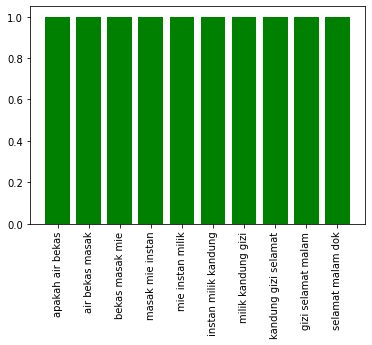



Question
{'atas ganggu lihat': 1, 'ganggu lihat usai': 1, 'lihat usai kena': 1, 'usai kena belek': 1, 'kena belek dok': 1, 'belek dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya soal': 1, 'tanya soal mata': 1, 'soal mata saya': 1, 'mata saya minggu': 1, 'saya minggu lalu': 1, 'minggu lalu saya': 1, 'lalu saya kena': 1, 'saya kena belek': 1, 'kena belek dan': 1, 'belek dan sekarang': 1, 'dan sekarang sudah': 1, 'sekarang sudah hilang': 1, 'sudah hilang belek': 1, 'hilang belek akan': 1, 'belek akan tetapi': 1, 'akan tetapi lihat': 1, 'tetapi lihat saya': 1, 'lihat saya jadi': 1, 'saya jadi agak': 1, 'jadi agak kurang': 1, 'agak kurang jelas': 1, 'kurang jelas apa': 1, 'jelas apa yang': 1, 'apa yang harus': 1, 'yang harus saya': 1, 'harus saya laku': 1, 'saya laku dok': 1, 'laku dok apa': 1, 'dok apa ada': 1, 'apa ada cara': 1, 'ada cara alami': 1, 'cara alami sembuh': 1, 'alami sembuh supaya': 1, 'sembuh supaya kembali': 1, 'supaya kembali normal': 1, 'kembali normal 

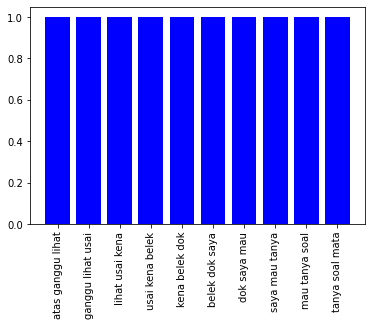

Similar Questions
{'saya mau tanya': 2, 'di bola mata': 2, 'di keliling lampu': 2, 'dari dokter sekali': 2, 'lihat buram dok': 1, 'buram dok saya': 1, 'dok saya mau': 1, 'mau tanya kenapa': 1, 'tanya kenapa ya': 1, 'kenapa ya mata': 1, 'ya mata belah': 1, 'mata belah kanan': 1, 'belah kanan saya': 1, 'kanan saya sudah': 1, 'saya sudah tahun': 1, 'sudah tahun blakangan': 1, 'tahun blakangan ini': 1, 'blakangan ini seperti': 1, 'ini seperti ada': 1, 'seperti ada yang': 1, 'ada yang ganjal': 1, 'yang ganjal dan': 1, 'ganjal dan agak': 1, 'dan agak buram': 1, 'agak buram di': 1, 'buram di bola': 1, 'bola mata kalau': 1, 'mata kalau lihat': 1, 'kalau lihat lampu': 1, 'lihat lampu seperti': 1, 'lampu seperti silau': 1, 'seperti silau telah': 1, 'silau telah saya': 1, 'telah saya pergi': 1, 'saya pergi ke': 1, 'pergi ke dokter': 1, 'ke dokter dan': 1, 'dokter dan di': 1, 'dan di lihat': 1, 'di lihat dengan': 1, 'lihat dengan alat': 1, 'dengan alat nyata': 1, 'alat nyata di': 1, 'nyata di bola

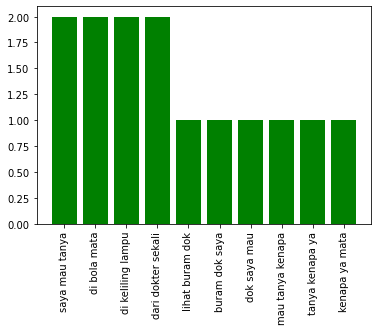



Question
{'lendir dalam tenggoroka': 1, 'dalam tenggoroka yang': 1, 'tenggoroka yang sudah': 1, 'yang sudah lama': 1, 'sudah lama saya': 1, 'lama saya sudah': 1, 'saya sudah lebih': 1, 'sudah lebih beberapa': 1, 'lebih beberapa bulan': 1, 'beberapa bulan dok': 1, 'bulan dok selalu': 1, 'dok selalu keluar': 1, 'selalu keluar lendir': 1, 'keluar lendir dari': 1, 'lendir dari tenggorok': 1, 'dari tenggorok dan': 1, 'tenggorok dan asa': 1, 'dan asa skl': 1, 'asa skl kalau': 1, 'skl kalau tenggorok': 1, 'kalau tenggorok ada': 1, 'tenggorok ada lendir': 1, 'ada lendir saya': 1, 'lendir saya tidak': 1, 'saya tidak lagi': 1, 'tidak lagi flu': 1, 'lagi flu dan': 1, 'flu dan beberapa': 1, 'dan beberapa bulan': 1, 'beberapa bulan tidak': 1, 'bulan tidak pernah': 1, 'tidak pernah flu': 1, 'pernah flu dan': 1, 'flu dan ada': 1, 'dan ada bau': 1, 'ada bau sengat': 1, 'bau sengat yang': 1, 'sengat yang keluar': 1, 'yang keluar dari': 1, 'keluar dari tenggorok': 1, 'dari tenggorok itu': 1, 'tenggoro

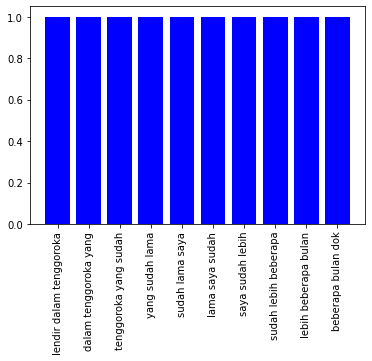

Similar Questions
{'pakai pasta gigi': 2, 'pasta gigi yang': 2, 'tenggorok lendir tenggorok': 1, 'lendir tenggorok saya': 1, 'tenggorok saya sudah': 1, 'saya sudah lama': 1, 'sudah lama asa': 1, 'lama asa ada': 1, 'asa ada lendir': 1, 'ada lendir hal': 1, 'lendir hal ini': 1, 'hal ini sudah': 1, 'ini sudah langsung': 1, 'sudah langsung lama': 1, 'langsung lama bulan': 1, 'lama bulan saat': 1, 'bulan saat gosok': 1, 'saat gosok gigi': 1, 'gosok gigi saya': 1, 'gigi saya rasa': 1, 'saya rasa mual': 1, 'rasa mual bahkan': 1, 'mual bahkan muntah': 1, 'bahkan muntah jika': 1, 'muntah jika pakai': 1, 'jika pakai pasta': 1, 'gigi yang biasa': 1, 'yang biasa akhir': 1, 'biasa akhir saya': 1, 'akhir saya ganti': 1, 'saya ganti dengan': 1, 'ganti dengan pasta': 1, 'dengan pasta gigi': 1, 'gigi yang bening': 1, 'yang bening dengan': 1, 'bening dengan pakai': 1, 'dengan pakai pasta': 1, 'pasta gigi sebut': 1, 'gigi sebut rasa': 1, 'sebut rasa mual': 1, 'rasa mual tidak': 1, 'mual tidak jadi': 1, '

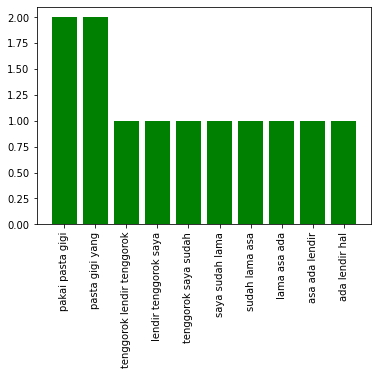



Question
{'punya anak lagi': 2, 'ingin hamil pasca': 1, 'hamil pasca steril': 1, 'pasca steril saya': 1, 'steril saya usia': 1, 'saya usia tahun': 1, 'usia tahun sudah': 1, 'tahun sudah kali': 1, 'sudah kali caesar': 1, 'kali caesar akhir': 1, 'caesar akhir mei': 1, 'akhir mei dan': 1, 'mei dan putus': 1, 'dan putus untuk': 1, 'putus untuk langsung': 1, 'untuk langsung steril': 1, 'langsung steril sekarang': 1, 'steril sekarang suami': 1, 'sekarang suami ingin': 1, 'suami ingin punya': 1, 'ingin punya anak': 1, 'anak lagi karena': 1, 'lagi karena anak': 1, 'karena anak kami': 1, 'anak kami cewek': 1, 'kami cewek tiga': 1, 'cewek tiga saya': 1, 'tiga saya steril': 1, 'saya steril potong': 1, 'steril potong apa': 1, 'potong apa bisa': 1, 'apa bisa saya': 1, 'bisa saya punya': 1, 'saya punya anak': 1, 'anak lagi apa': 1, 'lagi apa bayi': 1, 'apa bayi tabung': 1, 'bayi tabung bisa': 1, 'tabung bisa jadi': 1, 'bisa jadi solusi': 1, 'jadi solusi nya': 1}


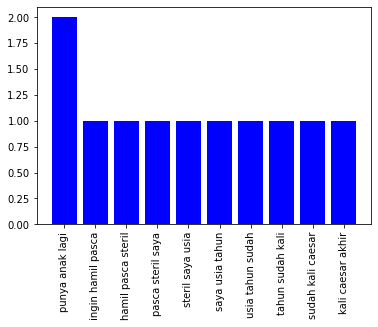

Similar Questions
{'bisa lahir normal': 2, 'jarak tahun dengan': 2, 'tahun dengan anak': 2, 'kali operasi caesar': 1, 'operasi caesar bisa': 1, 'caesar bisa lahir': 1, 'lahir normal dokter': 1, 'normal dokter saya': 1, 'dokter saya rencana': 1, 'saya rencana mau': 1, 'rencana mau punya': 1, 'mau punya anak': 1, 'punya anak lagi': 1, 'anak lagi anak': 1, 'lagi anak pertama': 1, 'anak pertama dan': 1, 'pertama dan dua': 1, 'dan dua nya': 1, 'dua nya lahir': 1, 'nya lahir cara': 1, 'lahir cara caesar': 1, 'cara caesar anak': 1, 'caesar anak pertama': 1, 'anak pertama karena': 1, 'pertama karena sungsang': 1, 'karena sungsang yang': 1, 'sungsang yang kata': 1, 'yang kata dokter': 1, 'kata dokter karena': 1, 'dokter karena bayi': 1, 'karena bayi belum': 1, 'bayi belum turun': 1, 'belum turun ke': 1, 'turun ke jalan': 1, 'ke jalan lahir': 1, 'jalan lahir padahal': 1, 'lahir padahal sudah': 1, 'padahal sudah bulan': 1, 'sudah bulan lebih': 1, 'bulan lebih tetapi': 1, 'lebih tetapi caesar': 1,

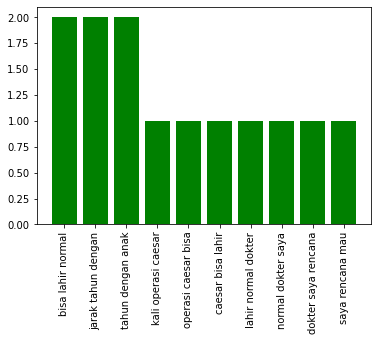



Question
{'hbv dna dan': 1, 'dna dan sgpt': 1, 'dan sgpt ot': 1, 'sgpt ot assalamualaikum': 1, 'ot assalamualaikum dok': 1, 'assalamualaikum dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya suami': 1, 'tanya suami sudah': 1, 'suami sudah hampir': 1, 'sudah hampir rutin': 1, 'hampir rutin kontrol': 1, 'rutin kontrol hepatitis': 1, 'kontrol hepatitis hasil': 1, 'hepatitis hasil lab': 1, 'hasil lab akhir': 1, 'lab akhir hbv': 1, 'akhir hbv dna': 1, 'hbv dna kuantitatif': 1, 'dna kuantitatif not': 1, 'kuantitatif not detected': 1, 'not detected maksud': 1, 'detected maksud apa': 1, 'maksud apa ya': 1, 'apa ya dok': 1, 'ya dok lalu': 1, 'dok lalu tes': 1, 'lalu tes sgpt': 1, 'tes sgpt mohon': 1, 'sgpt mohon jelas': 1, 'mohon jelas terima': 1, 'jelas terima kasih': 1, 'terima kasih dok': 1}


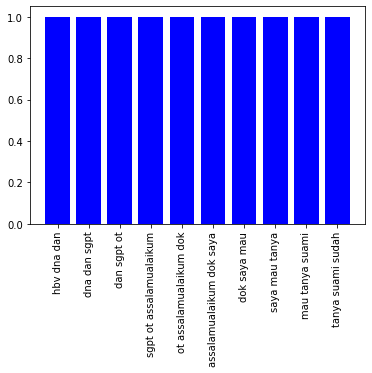

Similar Questions
{'dok saya mau': 3, 'saya mau tanya': 3, 'mau tanya cara': 2, 'anak kandung saya': 2, 'tanya cara mene': 1, 'cara mene dok': 1, 'mene dok saya': 1, 'tanya cara tentu': 1, 'cara tentu identitas': 1, 'tentu identitas orang': 1, 'identitas orang selain': 1, 'orang selain tes': 1, 'selain tes golong': 1, 'tes golong darah': 1, 'golong darah dan': 1, 'darah dan tes': 1, 'dan tes dna': 1, 'tes dna ada': 1, 'dna ada apa': 1, 'ada apa lagi': 1, 'apa lagi y': 1, 'lagi y dok': 1, 'y dok yang': 1, 'dok yang lebih': 1, 'yang lebih akurat': 1, 'lebih akurat terima': 1, 'akurat terima kasih': 1, 'ingin tes dna': 1, 'tes dna anak': 1, 'dna anak salam': 1, 'anak salam hormat': 1, 'salam hormat dok': 1, 'hormat dok saya': 1, 'mau tanya golong': 1, 'tanya golong darah': 1, 'golong darah saya': 1, 'darah saya o': 1, 'saya o istri': 1, 'o istri saya': 1, 'istri saya b': 1, 'saya b lalu': 1, 'b lalu anak': 1, 'lalu anak saya': 1, 'anak saya golong': 1, 'saya golong darah': 1, 'golong dara

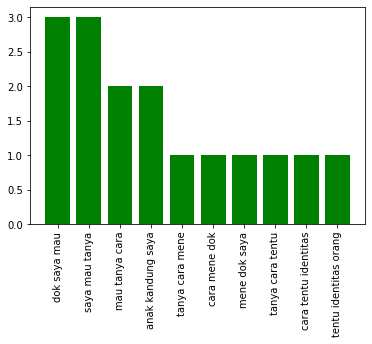



Question
{'bercak putih di': 1, 'putih di wajah': 1, 'di wajah hallo': 1, 'wajah hallo dok': 1, 'hallo dok saya': 1, 'dok saya ingin': 1, 'saya ingin tanya': 1, 'ingin tanya kenapa': 1, 'tanya kenapa wajah': 1, 'kenapa wajah anak': 1, 'wajah anak saya': 1, 'anak saya ada': 1, 'saya ada bercak': 1, 'ada bercak putih': 1, 'bercak putih seperti': 1, 'putih seperti panu': 1, 'seperti panu usia': 1, 'panu usia anak': 1, 'usia anak saya': 1, 'anak saya bulan': 1, 'saya bulan apa': 1, 'bulan apa ya': 1, 'apa ya obat': 1, 'ya obat terima': 1, 'obat terima kasih': 1}


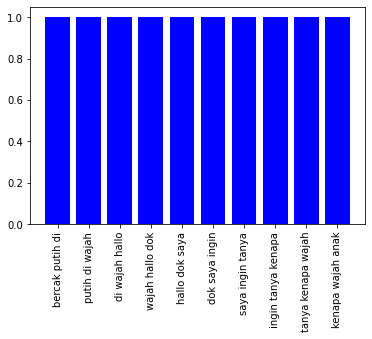

Similar Questions
{'selamat malam mau': 1, 'malam mau tanya': 1, 'mau tanya anak': 1, 'tanya anak gadis': 1, 'anak gadis saya': 1, 'gadis saya saat': 1, 'saya saat ini': 1, 'saat ini sedang': 1, 'ini sedang bingung': 1, 'sedang bingung bagaimana': 1, 'bingung bagaimana cara': 1, 'bagaimana cara obat': 1, 'cara obat timbul': 1, 'obat timbul sedikit': 1, 'timbul sedikit tetapi': 1, 'sedikit tetapi tambah': 1, 'tetapi tambah obat': 1, 'tambah obat kulit': 1, 'obat kulit yang': 1, 'kulit yang pakai': 1, 'yang pakai sama': 1, 'pakai sama anak': 1, 'sama anak saya': 1, 'anak saya tetapi': 1, 'saya tetapi satu': 1, 'tetapi satu belum': 1, 'satu belum ada': 1, 'belum ada yang': 1, 'ada yang hasil': 1, 'yang hasil jadi': 1, 'hasil jadi bagaimana': 1, 'jadi bagaimana dok': 1, 'bagaimana dok obat': 1, 'dok obat apa': 1, 'obat apa bisa': 1, 'apa bisa cepat': 1, 'bisa cepat sembuh': 1, 'cepat sembuh merah': 1, 'sembuh merah sebut': 1, 'merah sebut tanpa': 1, 'sebut tanpa bekas': 1, 'tanpa bekas ter

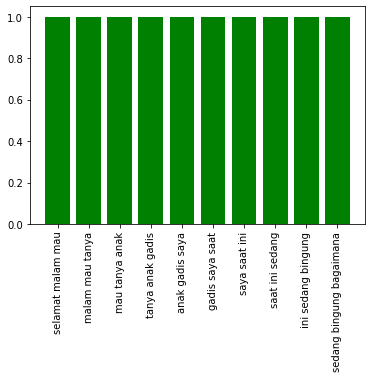



Question
{'nyeri perut pasca': 1, 'perut pasca operasi': 1, 'pasca operasi caesar': 1, 'operasi caesar hallo': 1, 'caesar hallo dok': 1, 'hallo dok langsung': 1, 'dok langsung saja': 1, 'langsung saja ya': 1, 'saja ya saya': 1, 'ya saya bulan': 1, 'saya bulan yang': 1, 'bulan yang lalu': 1, 'yang lalu habis': 1, 'lalu habis operasi': 1, 'habis operasi caesar': 1, 'operasi caesar trz': 1, 'caesar trz langsung': 1, 'trz langsung steril': 1, 'langsung steril tpii': 1, 'steril tpii sudah': 1, 'tpii sudah berapa': 1, 'sudah berapa hari': 1, 'berapa hari ini': 1, 'hari ini perut': 1, 'ini perut saya': 1, 'perut saya asa': 1, 'saya asa nyeri': 1, 'asa nyeri utama': 1, 'nyeri utama perut': 1, 'utama perut bagi': 1, 'perut bagi bawah': 1, 'bagi bawah pas': 1, 'bawah pas jahit': 1, 'pas jahit sampai': 1, 'jahit sampai saya': 1, 'sampai saya alami': 1, 'saya alami panas': 1, 'alami panas dingin': 1, 'panas dingin itu': 1, 'dingin itu kenapa': 1, 'itu kenapa ya': 1, 'kenapa ya dok': 1, 'ya dok s

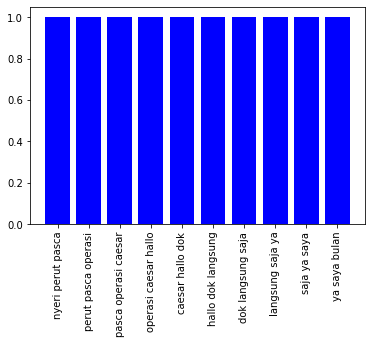

Similar Questions
{'induksi pasca caesar': 1, 'pasca caesar kandung': 1, 'caesar kandung istri': 1, 'kandung istri saya': 1, 'istri saya saat': 1, 'saya saat ini': 1, 'saat ini pasuk': 1, 'ini pasuk usia': 1, 'pasuk usia minggu': 1, 'usia minggu namun': 1, 'minggu namun belum': 1, 'namun belum ada': 1, 'belum ada kontraksi': 1, 'ada kontraksi namun': 1, 'kontraksi namun dokter': 1, 'namun dokter kata': 1, 'dokter kata tidak': 1, 'kata tidak bisa': 1, 'tidak bisa di': 1, 'bisa di induksi': 1, 'di induksi karena': 1, 'induksi karena istri': 1, 'karena istri saya': 1, 'istri saya pernah': 1, 'saya pernah operasi': 1, 'pernah operasi caesar': 1, 'operasi caesar untuk': 1, 'caesar untuk anak': 1, 'untuk anak dua': 1, 'anak dua anak': 1, 'dua anak tiga': 1, 'anak tiga normal': 1, 'tiga normal kini': 1, 'normal kini anak': 1, 'kini anak nomor': 1, 'anak nomor yang': 1, 'nomor yang caesar': 1, 'yang caesar sudah': 1, 'caesar sudah ber': 1, 'sudah ber usia': 1, 'ber usia tahun': 1, 'usia tahun 

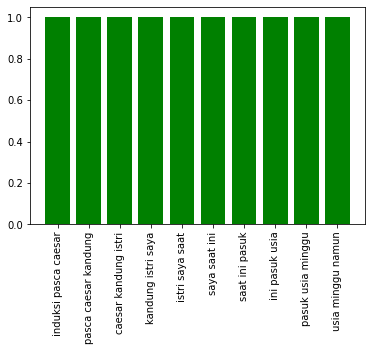



Question
{'sudah tidak mau': 2, 'mau minum susu': 2, 'minum susu formula': 2, 'beri susu formula': 2, 'saya tinggal kerja': 2, 'bayi sudah tidak': 1, 'tidak mau minum': 1, 'susu formula sudah': 1, 'formula sudah minggu': 1, 'sudah minggu ini': 1, 'minggu ini dok': 1, 'ini dok bayi': 1, 'dok bayi saya': 1, 'bayi saya bulan': 1, 'saya bulan sudah': 1, 'bulan sudah tidak': 1, 'tidak mau beri': 1, 'mau beri susu': 1, 'susu formula lama': 1, 'formula lama saya': 1, 'lama saya tinggal': 1, 'tinggal kerja sehingga': 1, 'kerja sehingga hanya': 1, 'sehingga hanya minum': 1, 'hanya minum asi': 1, 'minum asi saya': 1, 'asi saya belum': 1, 'saya belum saya': 1, 'belum saya berangkat': 1, 'saya berangkat kerja': 1, 'berangkat kerja dan': 1, 'kerja dan telah': 1, 'dan telah saya': 1, 'telah saya kerja': 1, 'saya kerja antara': 1, 'kerja antara waktu': 1, 'antara waktu sebut': 1, 'waktu sebut kerja': 1, 'sebut kerja keluarga': 1, 'kerja keluarga hanya': 1, 'keluarga hanya beri': 1, 'hanya beri air'

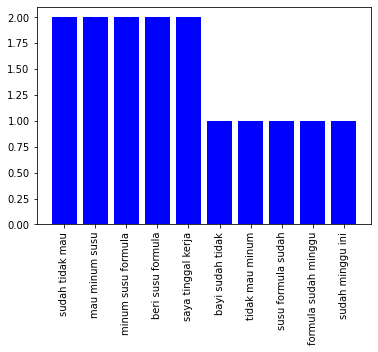

Similar Questions
{'susu formula yang': 2, 'pilih susu formula': 1, 'susu formula untuk': 1, 'formula untuk anak': 1, 'untuk anak dok': 1, 'anak dok saya': 1, 'dok saya punya': 1, 'saya punya anak': 1, 'punya anak umur': 1, 'anak umur bulan': 1, 'umur bulan dan': 1, 'bulan dan saya': 1, 'dan saya akan': 1, 'saya akan beri': 1, 'akan beri makan': 1, 'beri makan damping': 1, 'makan damping asi': 1, 'damping asi dan': 1, 'asi dan saya': 1, 'dan saya ingin': 1, 'saya ingin buat': 1, 'ingin buat makan': 1, 'buat makan itu': 1, 'makan itu sendiri': 1, 'itu sendiri untuk': 1, 'sendiri untuk bayi': 1, 'untuk bayi saya': 1, 'bayi saya namun': 1, 'saya namun saya': 1, 'namun saya bingung': 1, 'saya bingung dengan': 1, 'bingung dengan susu': 1, 'dengan susu formula': 1, 'formula yang akan': 1, 'yang akan saya': 1, 'akan saya beli': 1, 'saya beli jadi': 1, 'beli jadi pertayaan': 1, 'jadi pertayaan saya': 1, 'pertayaan saya susu': 1, 'saya susu formula': 1, 'formula yang baik': 1, 'yang baik untuk'

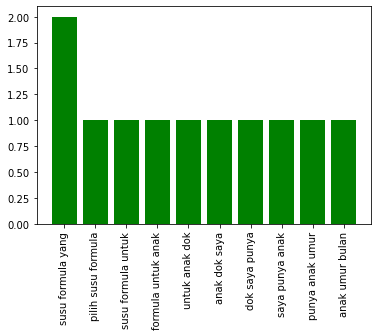



Question
{'mental disorder atau': 1, 'disorder atau tidak': 1, 'atau tidak salam': 1, 'tidak salam saya': 1, 'salam saya ada': 1, 'saya ada pernah': 1, 'ada pernah dekat': 1, 'pernah dekat dengan': 1, 'dekat dengan orang': 1, 'dengan orang gadis': 1, 'orang gadis cantik': 1, 'gadis cantik sekitar': 1, 'cantik sekitar umur': 1, 'sekitar umur atau': 1, 'umur atau tahun': 1, 'atau tahun tetapi': 1, 'tahun tetapi saat': 1, 'tetapi saat saya': 1, 'saat saya ajak': 1, 'saya ajak obrol': 1, 'ajak obrol hanya': 1, 'obrol hanya saja': 1, 'hanya saja dia': 1, 'saja dia cuma': 1, 'dia cuma bicara': 1, 'cuma bicara patah': 1, 'bicara patah kata': 1, 'patah kata waktu': 1, 'kata waktu itu': 1, 'waktu itu sambil': 1, 'itu sambil tertawa': 1, 'sambil tertawa dengan': 1, 'tertawa dengan muka': 1, 'dengan muka merah': 1, 'muka merah lalu': 1, 'merah lalu gadis': 1, 'lalu gadis itu': 1, 'gadis itu waktu': 1, 'itu waktu luar': 1, 'waktu luar kantor': 1, 'luar kantor habis': 1, 'kantor habis makan': 1, 

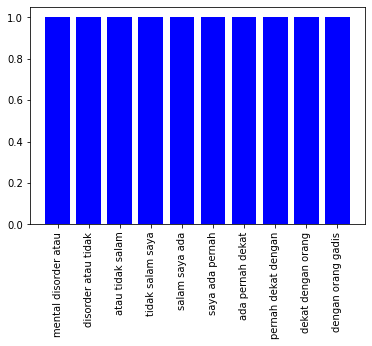

Similar Questions
{'anak tahun kok': 1, 'tahun kok belum': 1, 'kok belum lancar': 1, 'belum lancar bicara': 1, 'lancar bicara jakarta': 1, 'bicara jakarta assalaamualaikum': 1, 'jakarta assalaamualaikum mbak': 1, 'assalaamualaikum mbak saya': 1, 'mbak saya punya': 1, 'saya punya anak': 1, 'punya anak usia': 1, 'anak usia tahun': 1, 'usia tahun dia': 1, 'tahun dia sangat': 1, 'dia sangat aktif': 1, 'sangat aktif gerak': 1, 'aktif gerak cepat': 1, 'gerak cepat tiru': 1, 'cepat tiru gera': 1, 'tiru gera kalau': 1, 'gera kalau tanya': 1, 'kalau tanya anggota': 1, 'tanya anggota badan': 1, 'anggota badan sudah': 1, 'badan sudah bisa': 1, 'sudah bisa tunjuk': 1, 'bisa tunjuk di': 1, 'tunjuk di rumah': 1, 'di rumah juga': 1, 'rumah juga sudah': 1, 'juga sudah tahu': 1, 'sudah tahu tetapi': 1, 'tahu tetapi itu': 1, 'tetapi itu mbak': 1, 'itu mbak hanya': 1, 'mbak hanya bisa': 1, 'hanya bisa tunjuk': 1, 'bisa tunjuk saja': 1, 'tunjuk saja belum': 1, 'saja belum bisa': 1, 'belum bisa pakai': 1, 

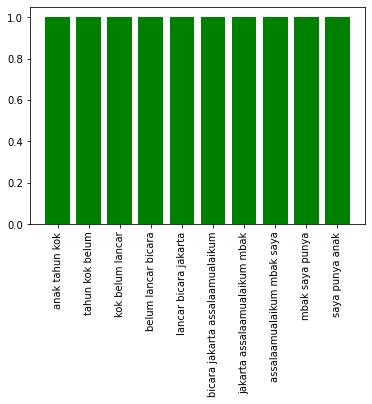

In [602]:
for i in range(len(text_error)):
    if len(text_error[i]) <= 0:
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(3, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(3, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Trigram Overlap

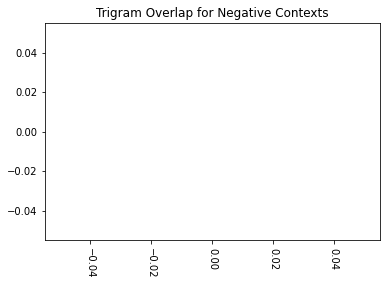

In [603]:
trigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(3, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(3, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
trigram_overlap = dict(sorted(trigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(trigram_overlap.keys()), list(trigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Trigram Overlap for Negative Contexts")
for i, v in enumerate(list(trigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

In [604]:
gold_ids[0]

['KD-10780',
 'AD-11170',
 'KD-34954',
 'KD-42528',
 'AD-3644',
 'AD-20187',
 'KD-9647',
 'AD-15985',
 'AD-8111',
 'AD-19236',
 'KD-30953',
 'KD-1190',
 'AD-11811',
 'AD-23059',
 'AD-1505',
 'AD-8996',
 'AD-13391',
 'AD-23609',
 'AD-20888',
 'AD-14282',
 'AD-19627',
 'KD-40213',
 'TD-7481',
 'KD-33961',
 'AD-8178',
 'AD-10434',
 'AD-1225',
 'AD-6755',
 'AD-5483',
 'AD-15205',
 'AD-2483',
 'KD-36449',
 'KD-38063',
 'KD-31262',
 'KD-7197',
 'KD-13846',
 'KD-29989',
 'KD-34810',
 'TD-2104',
 'KD-28831',
 'KD-818',
 'KD-12573',
 'KD-32421',
 'KD-130',
 'KD-16041',
 'KD-18305',
 'TD-11575',
 'AD-22794',
 'AD-6224',
 'AD-20846',
 'TD-4539',
 'AD-5304',
 'KD-26899',
 'KD-6929',
 'AD-12475',
 'KD-7384',
 'AD-11852',
 'AD-8328',
 'AD-9875',
 'KD-26435',
 'AD-10103']

## Vector Embedding Projection

In [605]:
import pickle

In [606]:
#passage embedding load

passage_embeddings = dict()
with (open("../Dataset/Embeddings/passage_embeddings_syifa-ttmeqsum_full.tsv", "rb")) as openfile:
    while True:
        try:
            passage_lst = pickle.load(openfile)
            for pid, p_vector in passage_lst:
                passage_embeddings[pid] = p_vector
        except EOFError:
            break


In [607]:
#question embedding load

query_embeddings = dict()
with (open("../Dataset/Embeddings/question_embeddings_syifa-ttmeqsum_full.tsv", "rb")) as openfile:
    while True:
        try:
            query_lst = pickle.load(openfile)
            for qid, q_vector in query_lst:
                query_embeddings[qid] = q_vector
        except EOFError:
            break


/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


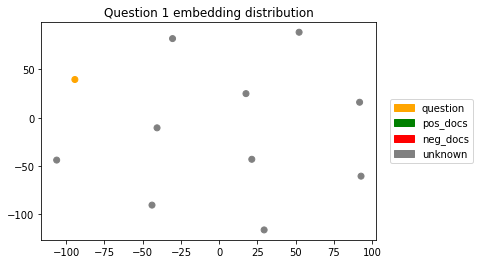

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


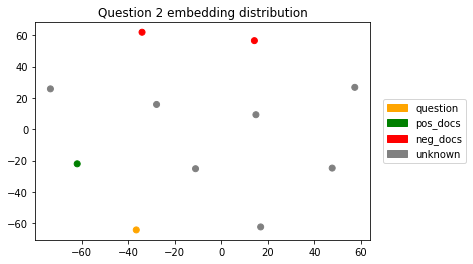

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


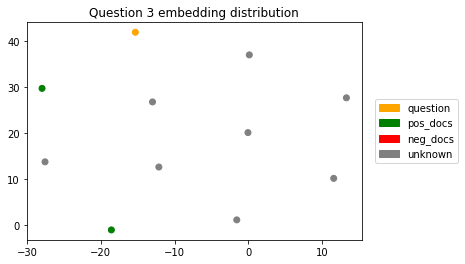

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


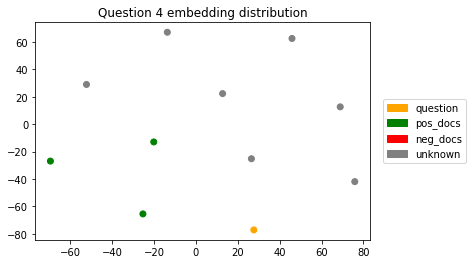

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


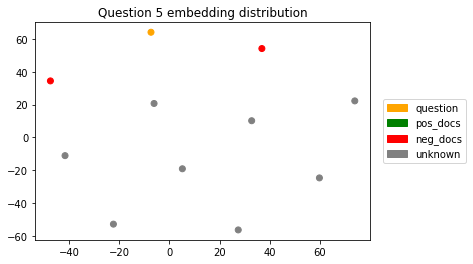

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


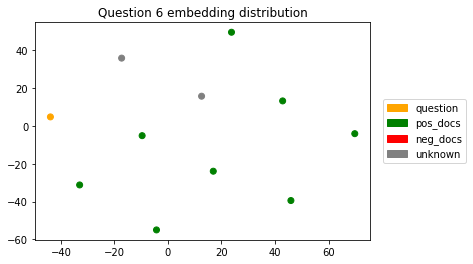

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


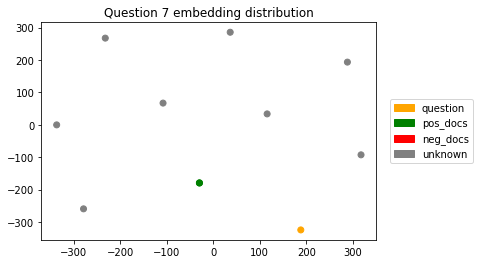

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


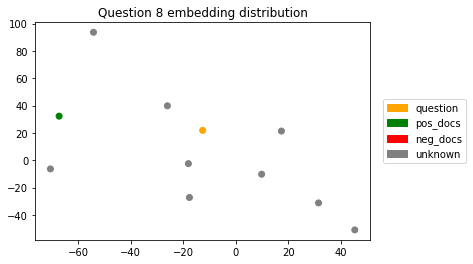

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


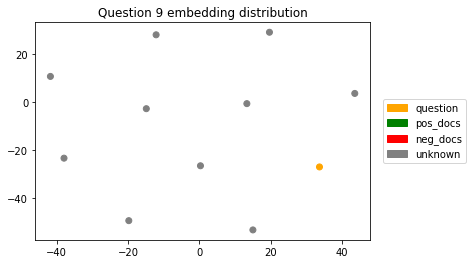

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


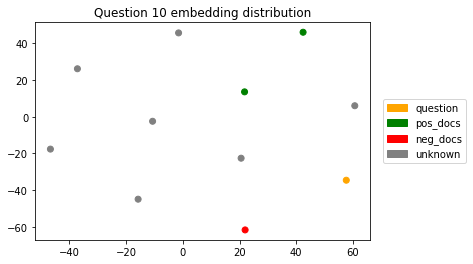

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


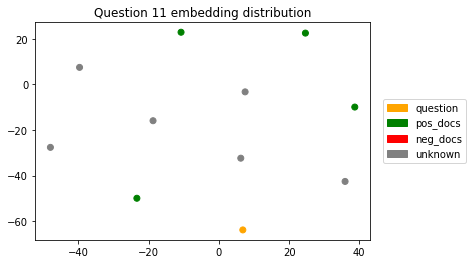

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


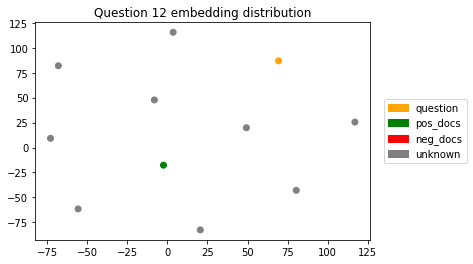

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


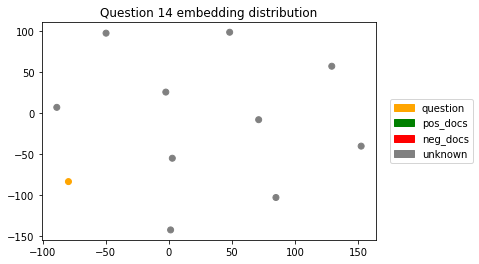

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


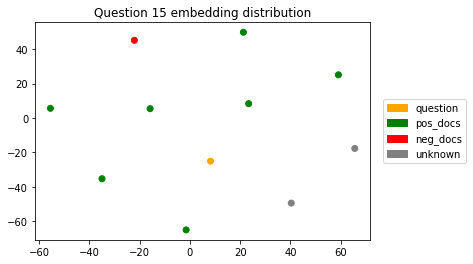

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


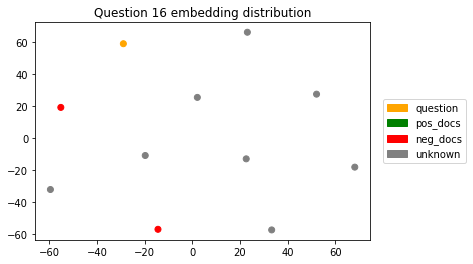

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


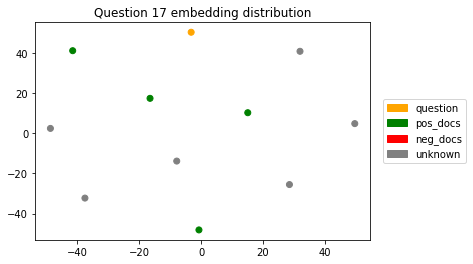

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


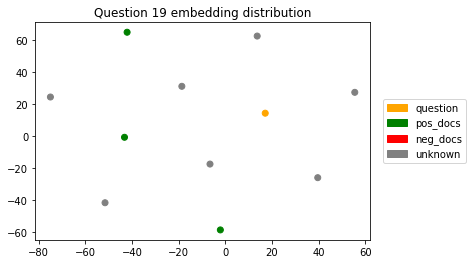

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


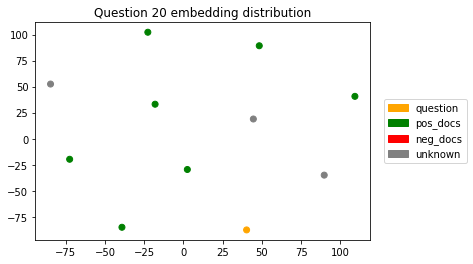

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


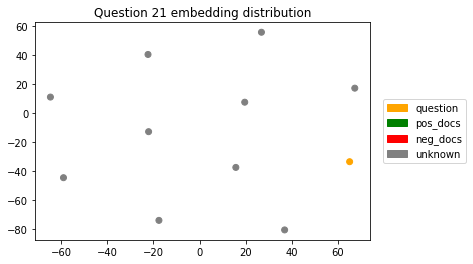

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


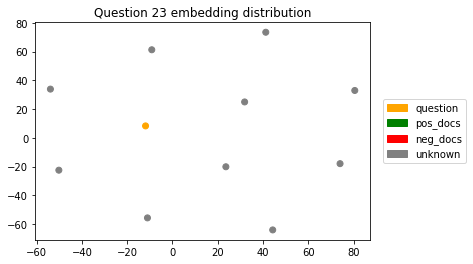

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


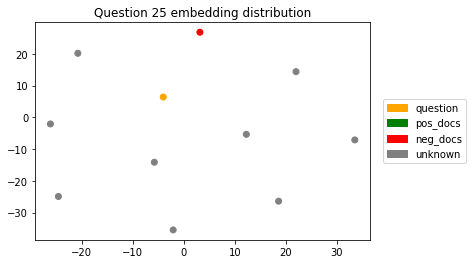

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


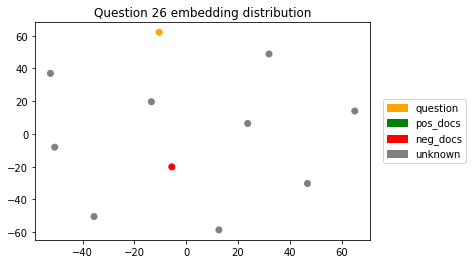

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


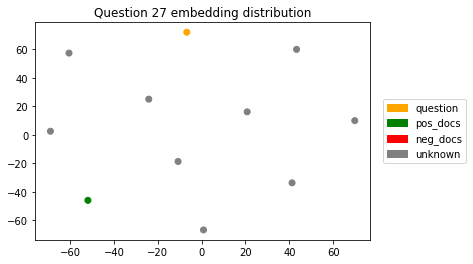

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


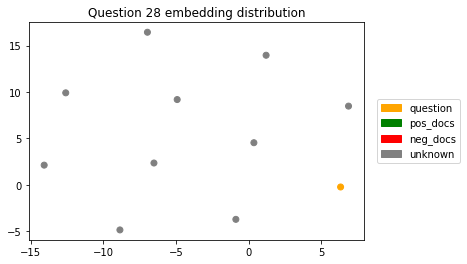

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


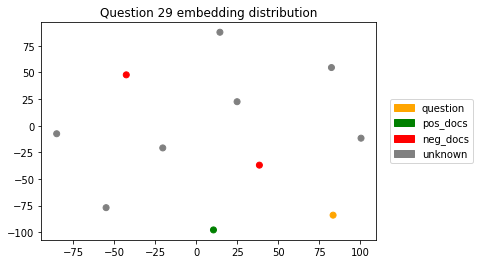

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


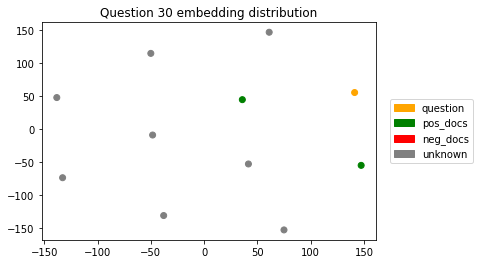

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


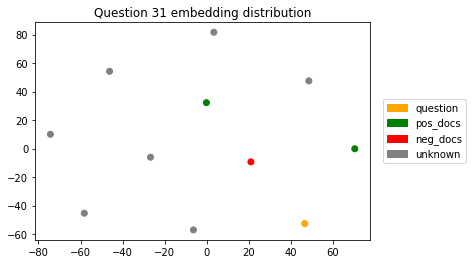

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


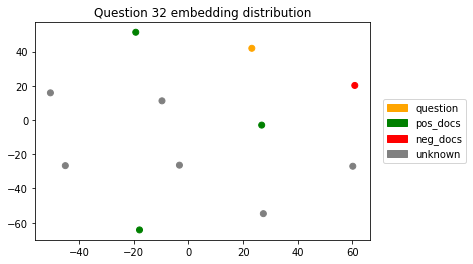

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


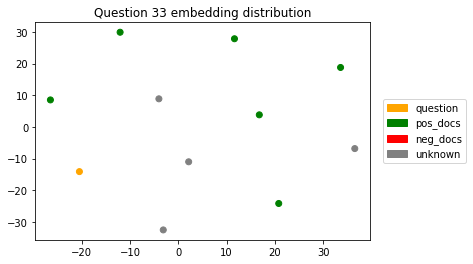

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


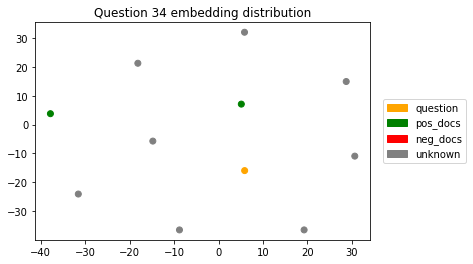

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


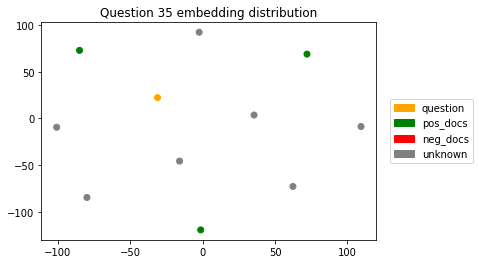

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


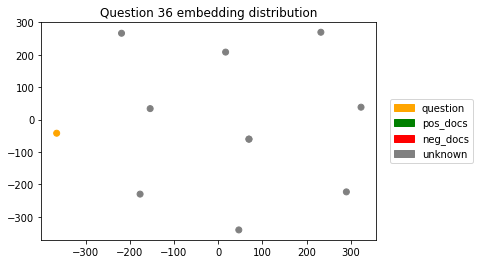

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


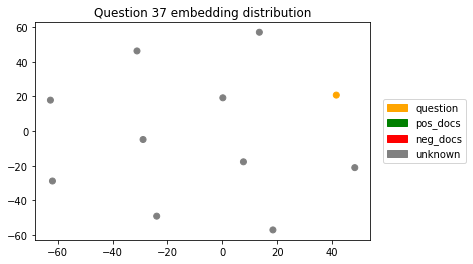

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


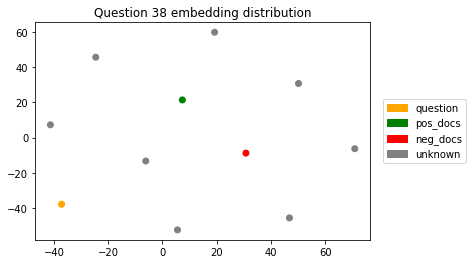

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


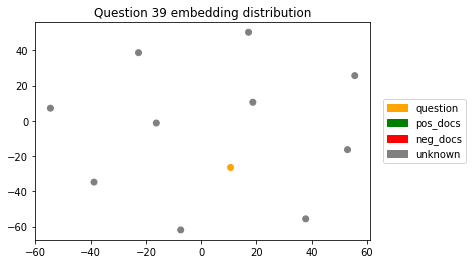

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


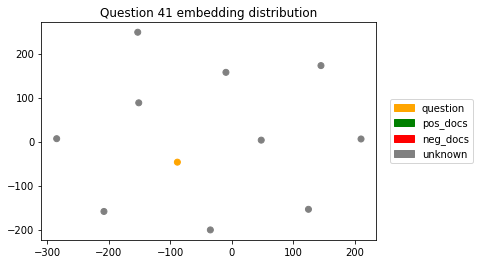

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


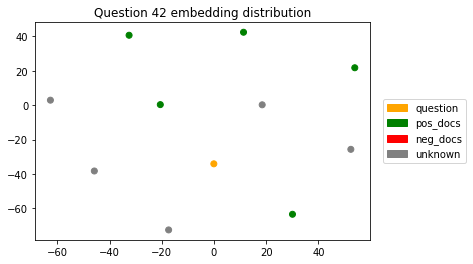

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


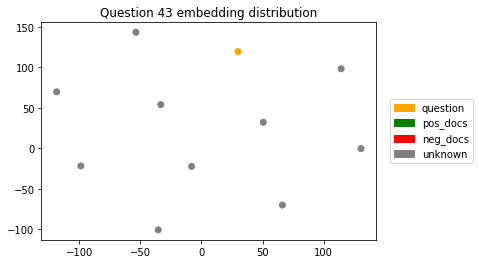

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


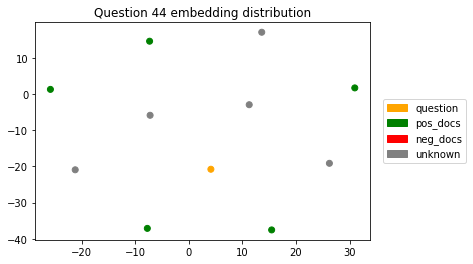

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


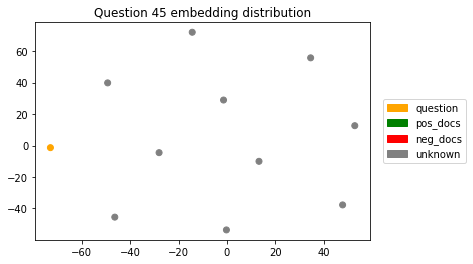

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


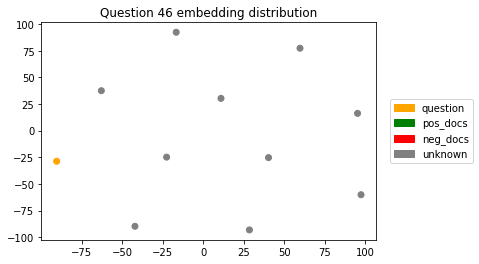

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


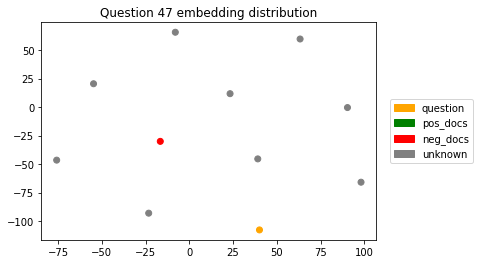

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


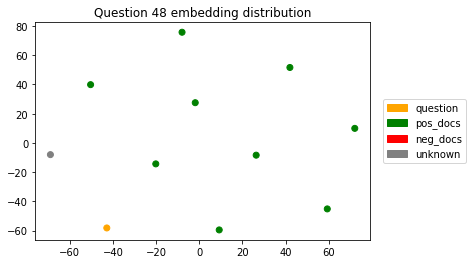

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


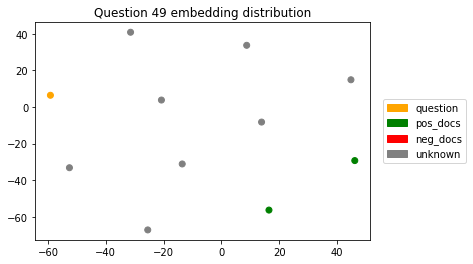

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


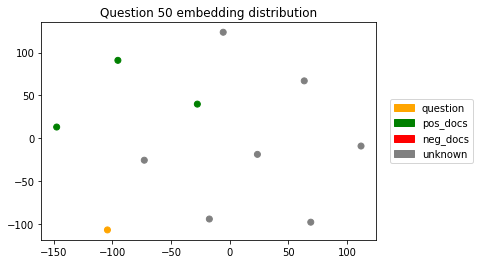

In [608]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import numpy as np

orange_patch = mpatches.Patch(color='orange', label='question')
green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [orange_patch, green_patch, red_patch, grey_patch]
for idx,row in enumerate(actual_data):    
    values = [0]
    colors = ListedColormap(['orange','green','red', 'grey'])
    qid = row['question']['id']
    q_vector = query_embeddings[qid]
    q_vector = q_vector.reshape(-1, len(q_vector))
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        p_vector = passage_embeddings[pid]
        p_vector = p_vector.reshape(-1, len(p_vector))
        q_vector = np.concatenate((q_vector, p_vector), axis=0)
        color = 1 if pid in gold_ids[idx] else 2
        color = 3 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    if len(q_vector) < 2:
        continue
    q_compressed = TSNE(n_components=2, learning_rate='auto',init='pca', random_state=42).fit_transform(q_vector)

    plt.title(f"Question {qid} embedding distribution")
    scatter = plt.scatter(q_compressed[:,0], q_compressed[:,1], c=values, cmap=colors)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()

## BM25 Score vs DPR Score

We expect the graphic will be inversely linear because DPR similarity score has negative correlation with BM25 similarity (While DPR smaller is better, BM25 bigger is better)

In [609]:
import xml.etree.ElementTree as ET

#gather all documents from corpus
docs = []
doc_ids = []

tree = ET.parse('../Dataset/Corpus/corpus_only_question_edited.xml')
root = tree.getroot()

for doc in root:
    for attr in doc:
        attr_type = attr.tag
        attr_content = attr.text
        if attr_type=='KELUHAN':
            content_text = ''
            for content in attr:
                if content.tag == 'JUDUL':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
                elif content.tag == 'ISI':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
            docs.append(content_text)
        elif attr_type == 'ID':
            doc_ids.append(attr_content)



In [610]:
assert len(docs)==len(doc_ids)

In [611]:
docs_map =  dict()
for idx, doc_id in enumerate(doc_ids):
    docs_map[doc_id] = docs[idx]

In [612]:
from tqdm import tqdm

avgdl = sum(len(doc) for doc in docs) / len(docs)
N = len(docs)
docs_freq_map, terms_freq_map, N, avgdl = bm25_init(docs_map)
for q_idx, q_row in tqdm(enumerate(actual_data)):
    query = q_row['question']['title']
    query  += f". {q_row['question']['text']}" if q_row['question']['text'].strip()!="" else ""
    for doc_idx, doc_row in enumerate(q_row['ctxs']):
        doc_id = doc_row['id']
        actual_data[q_idx]['ctxs'][doc_idx]['bm25_score'] = bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map,  docs_map, avgdl, N)
        

45it [00:00, 94.16it/s]


### Aggregated Plot

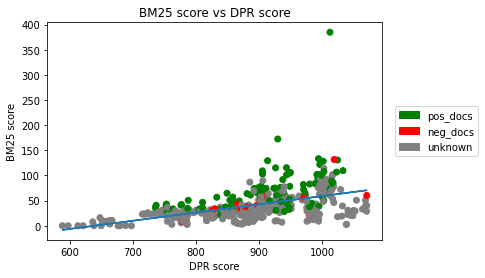

In [613]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.preprocessing import MinMaxScaler, StandardScaler

green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [green_patch, red_patch, grey_patch]
values = []
colors = ListedColormap(['green','red', 'grey'])
score_vector = []
for idx,row in enumerate(actual_data):        
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
score_vector= np.array(score_vector)


m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
plt.title(f"BM25 score vs DPR score")
plt.xlabel("DPR score")
plt.ylabel("BM25 score")
scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)

plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
plt.show()

### Per question plot

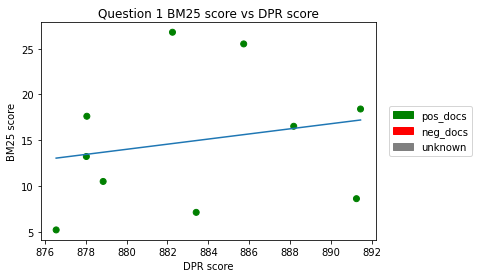

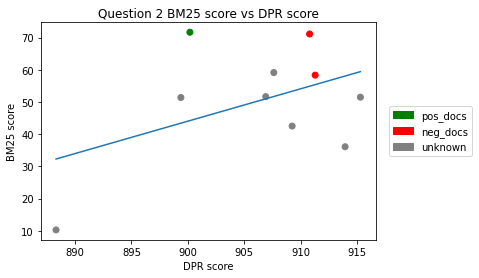

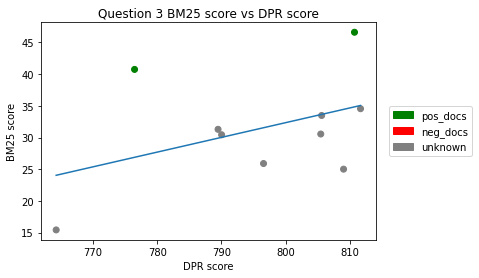

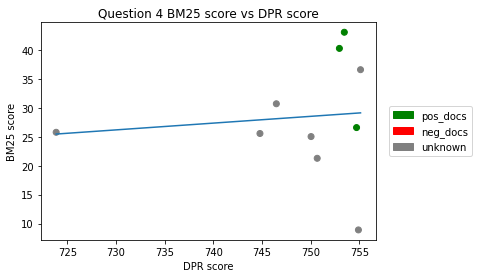

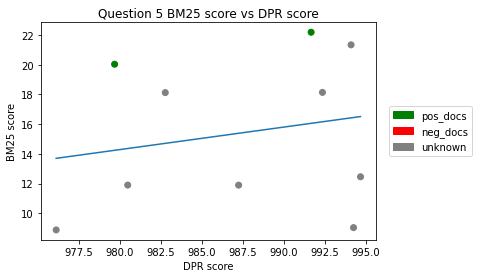

...

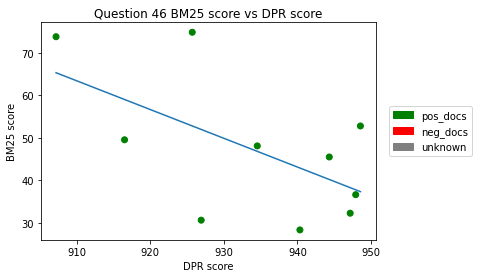

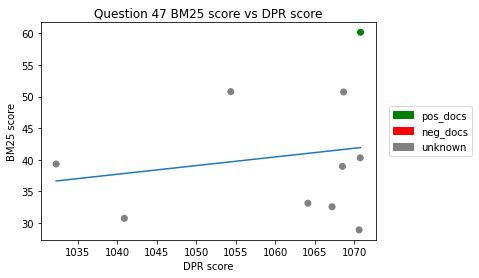

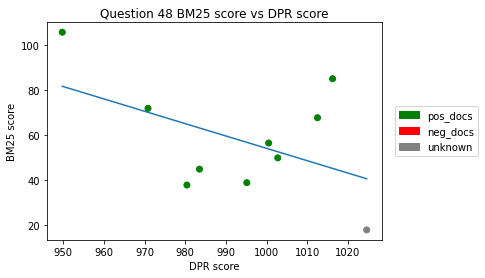

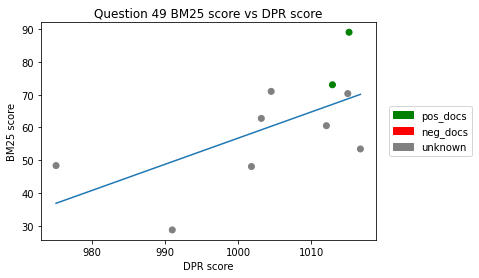

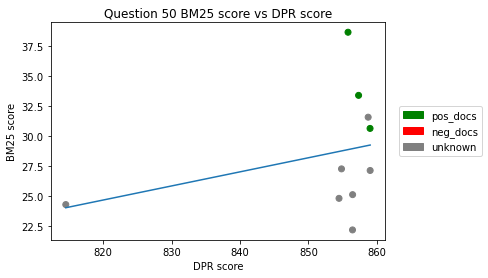

In [614]:
gradients_lst = []
for idx,row in enumerate(actual_data):
    values = []
    score_vector = []
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    score_vector= np.array(score_vector)


    m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
    plt.title(f"Question {qid} BM25 score vs DPR score")
    plt.xlabel("DPR score")
    plt.ylabel("BM25 score")
    scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)
    gradients_lst.append(m)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
    plt.show()

In [615]:
is_positive = [gradient for gradient in gradients_lst if gradient > 0]
is_negative = [gradient for gradient in gradients_lst if gradient < 0]

print(f"positive gradient count: {len(is_positive)}")
print(f"negative gradient count: {len(is_negative)}")

positive gradient count: 24
negative gradient count: 21


# F. ICT-Syifa Data

In [616]:
actual_data = []

with open('../Results/syifa_results_full_ict.json', 'r') as actual_out:
    actual_data = json.load(actual_out)



In [617]:
text_error = []
i = 0
for row in actual_data:
    row_text_error = []
    for row_ctx in row['ctxs']:
        if row_ctx['id'] in neg_ids[i]:
            row_text_error.append({'id': row_ctx['id'], 'title': row_ctx['title'], 'text': row_ctx['text']})
    text_error.append(row_text_error)
    i+=1

In [618]:
for i in range(len(text_error)):
    print("Question")
    print(f"text: {actual_data[i]['question']['text']}")
    print(f"title: {actual_data[i]['question']['title']}")
    print("Similar Questions")
    print(text_error[i])
    print()
    print()

Question
text: malam dok , sejak 2 hari yang lalu badan saya pusing dan lemas hari ini hidung saya mengeluarkan ingus terus menerus , bagaimana cara mengatasi nya ya dok ? terima kasih sebelumnya
title: cara mengatasi pusing , lemas dan hidung berair
Similar Questions
[]


Question
text: selamat pagi dok , saya mau tanya kenapa telinga saya berdenging terus ya dok sudah 6 hari , saya juga sudah ke puskesmas untuk di periksa , kata dokternya telinganya kotor karena di bersihkan dengan cutton buds jadi kotorannya terdorong hingga menutupi gendang telinga , dan saya sudah dikasih obat tetes untuk menghilangkan kotoran , tetapi dengung di telinga saya tidak berkurang sama sekali dok , saran dari dokter seperti apa ?
title: telinga berdengung sebelah kiri
Similar Questions
[]


Question
text: sore dok . . maaf dok saya sudah 4 hari mengalami benjolan di daerah kemaluan mula-mula benjolan tersebut kecil dan sekarang membesar lalu pecah dok . . rasanya linu dan sakit jika malam hari . . kira-

## Unigram Analysis

In [619]:
n = len(text_error)

In [620]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/mk1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [621]:
assert get_ngram_freq(2, "hello bingo world") == {"hello bingo": 1, "bingo world": 1}

Question
{'depresi': 7, 'alami': 3, 'pikir': 3, 'kambuh': 2, 'dok': 2, 'mhswi': 1, 'smst': 1, 'salah': 1, 'poltekkes': 1, 'kota': 1, 'aju': 1, 'ecek': 1, 'jawab': 1, 'februari': 1, 'golong': 1, 'cakup': 1, 'atas': 1, 'gejala': 1, 'rasa': 1, 'hilang': 1, 'motivasi': 1, 'kosong': 1, 'renung': 1, 'fokus': 1, 'kerja': 1, 'semangat': 1, 'hidup': 1, 'kondisi': 1, 'sembuh': 1, 'pengaruh': 1, 'terima': 1, 'kasih': 1}


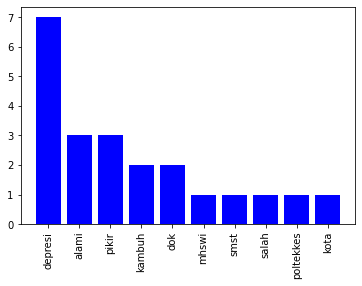

Similar Questions
{'pikir': 7, 'mood': 6, 'ubah': 5, 'ide': 5, 'idap': 3, 'adhd': 3, 'milik': 3, 'alami': 3, 'kerja': 3, 'ting': 2, 'sulit': 2, 'sikap': 2, 'smp': 2, 'laku': 2, 'sesuai': 2, 'diam': 2, 'sadar': 2, 'seringkali': 2, 'nyaman': 2, 'remaja': 1, 'kenal': 1, 'nakal': 1, 'asa': 1, 'turun': 1, 'usia': 1, 'tambah': 1, 'adaptasi': 1, 'serta': 1, 'drastis': 1, 'pindah': 1, 'sd': 1, 'sma': 1, 'jalan': 1, 'mulus': 1, 'jenjang': 1, 'ulang': 1, 'konsentrasi': 1, 'tulis': 1, 'pesan': 1, 'urut': 1, 'tuang': 1, 'ekstrim': 1, 'optimistis': 1, 'pesimistis': 1, 'periang': 1, 'murung': 1, 'pribadi': 1, 'kait': 1, 'politik': 1, 'ajar': 1, 'teman': 1, 'sastra': 1, 'game': 1, 'virtual': 1, 'hutang': 1, 'uang': 1, 'saku': 1, 'periode': 1, 'menit': 1, 'jam': 1, 'mudah': 1, 'provokasi': 1, 'hilang': 1, 'dorong': 1, 'motivasi': 1, 'kejap': 1, 'cenderung': 1, 'aneh': 1, 'ganggu': 1, 'jatuh': 1, 'semangat': 1, 'hirau': 1, 'anggap': 1, 'malam': 1, 'pagi': 1, 'lupa': 1, 'catat': 1, 'detil': 1, 'curiga':

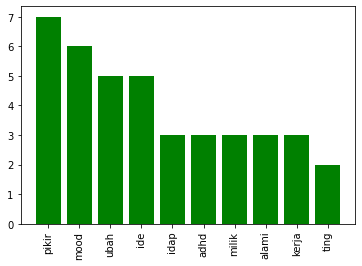



Question
{'jantung': 4, 'debar': 1, 'tanda': 1, 'dear': 1, 'dokter': 1, 'suka': 1, 'darah': 1, 'lancar': 1, 'keluh': 1, 'apa': 1, 'sehat': 1, 'relatif': 1, 'prima': 1, 'sakit': 1, 'mohon': 1, 'informasi': 1, 'dok': 1, 'terima': 1, 'kasih': 1, 'atensi': 1, 'salam': 1, 'hormat': 1}


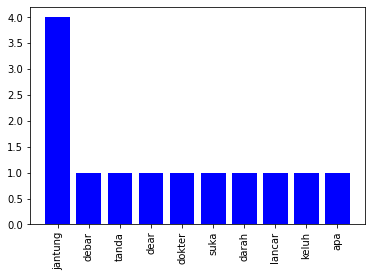

Similar Questions
{'sakit': 5, 'jantung': 3, 'picu': 2, 'salah': 1, 'gejala': 1, 'nyeri': 1, 'dada': 1, 'alami': 1, 'suara': 1, 'gerak': 1, 'geser': 1, 'posisi': 1, 'badan': 1, 'tekan': 1}


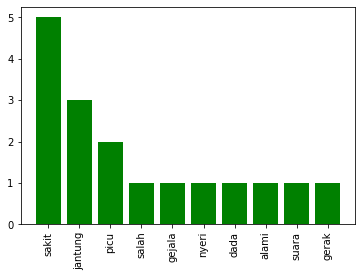



Question
{'belek': 3, 'dok': 3, 'lihat': 2, 'kena': 2, 'atas': 1, 'ganggu': 1, 'mata': 1, 'minggu': 1, 'hilang': 1, 'kurang': 1, 'laku': 1, 'alami': 1, 'sembuh': 1, 'normal': 1, 'terima': 1, 'kasih': 1, 'info': 1, 'saran': 1}


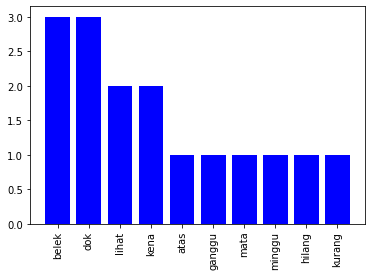

Similar Questions
{'silau': 2, 'halo': 2, 'cahaya': 2, 'diagnosa': 1, 'periksa': 1, 'normal': 1, 'kena': 1, 'ya': 1, 'dok': 1}


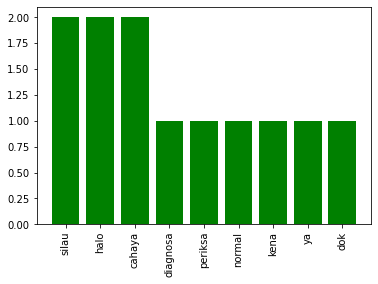



Question
{'mimisan': 4, 'darah': 3, 'bangun': 2, 'tidur': 2, 'dok': 2, 'pagi': 2, 'mulut': 2, 'sebab': 1, 'hallo': 1, 'pnyakit': 1, 'serius': 1, 'jam': 1, 'deras': 1, 'shock': 1, 'spertinya': 1, 'megalir': 1, 'hidung': 1, 'kental': 1, 'demam': 1, 'pusing': 1, 'batuk': 1, 'pilek': 1, 'kondisi': 1, 'normal': 1, 'bbrapa': 1, 'sakit': 1, 'tenggorok': 1, 'benjol': 1, 'leher': 1, 'kanan': 1, 'pikir': 1, 'radang': 1, 'panas': 1, 'hubung': 1, 'terima': 1, 'kasih': 1}


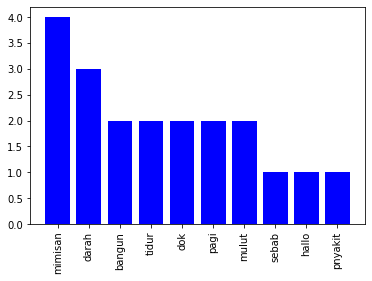

Similar Questions
{'dok': 7, 'batuk': 5, 'gatal': 5, 'darah': 3, 'normal': 3, 'stlah': 2, 'tidur': 2, 'dahak': 2, 'coba': 2, 'div': 1, 'selamat': 1, 'malam': 1, 'pagi': 1, 'bngn': 1, 'mrasa': 1, 'leher': 1, 'keluarin': 1, 'bareng': 1, 'gumpal': 1, 'brwarna': 1, 'merah': 1, 'tua': 1, 'muda': 1, 'tenggorok': 1, 'sore': 1, 'setngah': 1, 'jam': 1, 'bangun': 1, 'muncul': 1, 'kluarkan': 1, 'volume': 1, 'alami': 1, 'suhu': 1, 'badan': 1, 'sangan': 1, 'aneh': 1, 'tarik': 1, 'nafas': 1, 'sakit': 1, 'sedikit': 1, 'sebab': 1, 'terima': 1, 'kasih': 1}


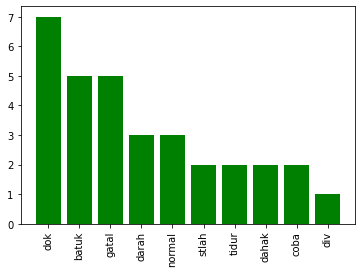



Question
{'gadis': 4, 'mental': 2, 'disorder': 2, 'dekat': 2, 'ruang': 2, 'meja': 2, 'dalam': 2, 'toilet': 2, 'salam': 1, 'cantik': 1, 'umur': 1, 'ajak': 1, 'obrol': 1, 'dia': 1, 'bicara': 1, 'patah': 1, 'tertawa': 1, 'muka': 1, 'merah': 1, 'luar': 1, 'kantor': 1, 'habis': 1, 'makan': 1, 'siang': 1, 'kejar': 1, 'maksud': 1, 'cakap': 1, 'langsung': 1, 'lari': 1, 'tunggu': 1, 'pergi': 1, 'jadi': 1, 'tindak': 1, 'iya': 1, 'masuk': 1, 'klasifikasi': 1, 'mana': 1, 'terima': 1, 'kasih': 1}


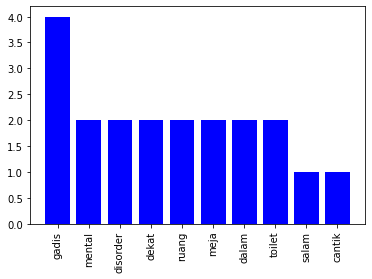

Similar Questions
{'dokter': 4, 'terima': 4, 'lelaki': 4, 'suka': 4, 'pribadi': 3, 'pria': 3, 'kenal': 3, 'teman': 3, 'meni': 3, 'pacar': 3, 'klik': 2, 'kasih': 2, 'jejaring': 2, 'sosial': 2, 'nilai': 2, 'cerdas': 2, 'aneh': 2, 'kali': 2, 'orang': 2, 'dosa': 2, 'takut': 2, 'pasang': 1, 'salam': 1, 'kesempatanya': 1, 'tarik': 1, 'fisik': 1, 'awal': 1, 'senang': 1, 'akun': 1, 'wanita': 1, 'sexy': 1, 'porno': 1, 'temu': 1, 'bicara': 1, 'sex': 1, 'kirim': 1, 'foto': 1, 'busana': 1, 'niat': 1, 'syarat': 1, 'ikut': 1, 'mau': 1, 'debat': 1, 'denganya': 1, 'kalah': 1, 'argumen': 1, 'cari': 1, 'alas': 1, 'benar': 1, 'tindakanya': 1, 'perilaku': 1, 'normal': 1, 'simpang': 1, 'tipe': 1, 'jadi': 1, 'suami': 1, 'dar': 1, 'informasi': 1, 'umur': 1, 'tayang': 1, 'mohon': 1, 'nama': 1, 'tampil': 1, 'kasik': 1, 'ajar': 1, 'salah': 1, 'pagi': 1, 'rekan': 1, 'kerja': 1, 'ruang': 1, 'timbul': 1, 'ahirnya': 1, 'luar': 1, 'kantor': 1, 'lari': 1, 'besar': 1, 'hidup': 1, 'biar': 1, 'jamah': 1, 'tubuh': 1, 'wl

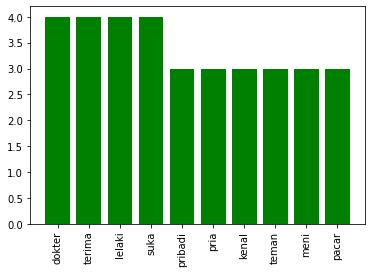

In [622]:
import matplotlib.pyplot as plt

for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(1, full_query)
    
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(1, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Unigram Overlap

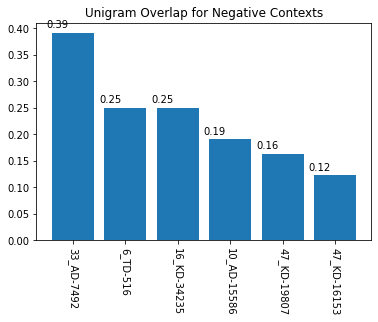

In [623]:
unigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(1, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(1, full_passage)
        unigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
unigram_overlap = dict(sorted(unigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(unigram_overlap.keys()), list(unigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Unigram Overlap for Negative Contexts")
for i, v in enumerate(list(unigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.01, str(round(v, 2)))
plt.show()

## Bigram Analysis

Question
{'yang saya': 3, 'apakah depresi': 2, 'saya sempat': 2, 'saya alami': 2, 'ini saya': 2, 'itu saya': 2, 'saya rasa': 2, 'depresi yang': 2, 'pikir kenapa': 2, 'kenapa saya': 2, 'saya saat': 2, 'saat ini': 2, 'depresi saya': 2, 'depresi dapat': 1, 'dapat kambuh': 1, 'kambuh saya': 1, 'saya mhswi': 1, 'mhswi smst': 1, 'smst di': 1, 'di salah': 1, 'salah satu': 1, 'satu poltekkes': 1, 'poltekkes di': 1, 'di kota': 1, 'kota saya': 1, 'saya pada': 1, 'pada tahun': 1, 'tahun lalu': 1, 'lalu saya': 1, 'sempat aju': 1, 'aju tanya': 1, 'tanya kena': 1, 'kena yang': 1, 'alami dan': 1, 'dan telah': 1, 'telah saya': 1, 'saya ecek': 1, 'ecek jawab': 1, 'jawab pada': 1, 'pada februari': 1, 'februari tahun': 1, 'tahun ini': 1, 'saya dapat': 1, 'dapat golong': 1, 'golong depresi': 1, 'depresi karena': 1, 'karena cakup': 1, 'cakup cukup': 1, 'cukup banyak': 1, 'banyak depresi': 1, 'depresi saat': 1, 'saat saya': 1, 'saya lihat': 1, 'lihat jawab': 1, 'jawab itu': 1, 'rasa saat': 1, 'saat itu': 1,

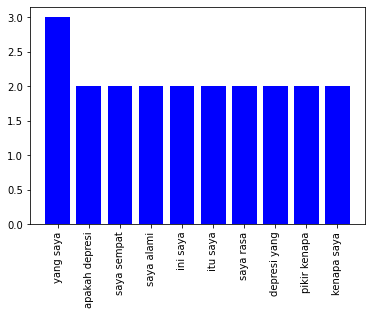

Similar Questions
{'apa yang': 4, 'idap adhd': 3, 'ubah mood': 3, 'saya selalu': 3, 'mood saya': 3, 'saya idap': 2, 'sulit dalam': 2, 'mood yang': 2, 'ubah sikap': 2, 'yang saya': 2, 'saya laku': 2, 'saya tidak': 2, 'tidak dapat': 2, 'dapat ingat': 2, 'pikir yang': 2, 'saya sering': 2, 'saya sadar': 2, 'sebut saya': 2, 'saya seringkali': 2, 'dalam kerja': 2, 'kerja yang': 2, 'saya saya': 2, 'apa saya': 1, 'adhd saya': 1, 'saya remaja': 1, 'remaja tahun': 1, 'tahun sejak': 1, 'sejak kecil': 1, 'kecil saya': 1, 'saya kenal': 1, 'kenal nakal': 1, 'nakal banyak': 1, 'banyak ting': 1, 'ting dan': 1, 'dan milik': 1, 'milik asa': 1, 'asa yang': 1, 'yang naik': 1, 'naik turun': 1, 'turun ketika': 1, 'ketika usia': 1, 'usia saya': 1, 'saya tambah': 1, 'tambah saya': 1, 'saya milik': 1, 'milik sulit': 1, 'dalam adaptasi': 1, 'adaptasi dan': 1, 'dan ubah': 1, 'yang serta': 1, 'serta ubah': 1, 'sikap yang': 1, 'yang drastis': 1, 'drastis pindah': 1, 'pindah dari': 1, 'dari sd': 1, 'sd ke': 1, 'ke 

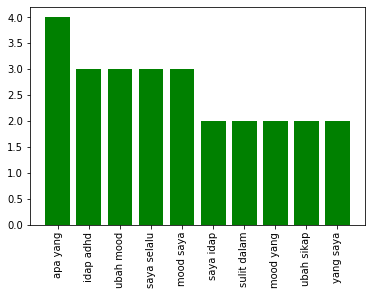



Question
{'jantung debar': 1, 'debar apakah': 1, 'apakah tanda': 1, 'tanda ada': 1, 'ada masalah': 1, 'masalah jantung': 1, 'jantung dear': 1, 'dear dokter': 1, 'dokter jantung': 1, 'jantung saya': 1, 'saya suka': 1, 'suka rasa': 1, 'rasa seperti': 1, 'seperti darah': 1, 'darah tidak': 1, 'tidak lancar': 1, 'lancar lama': 1, 'lama ini': 1, 'ini tidak': 1, 'tidak ada': 1, 'ada keluh': 1, 'keluh apa': 1, 'apa dan': 1, 'dan sehat': 1, 'sehat saya': 1, 'saya relatif': 1, 'relatif prima': 1, 'prima apakah': 1, 'apakah saya': 1, 'saya ada': 1, 'ada sakit': 1, 'sakit jantung': 1, 'jantung mohon': 1, 'mohon informasi': 1, 'informasi dok': 1, 'dok terima': 1, 'terima kasih': 1, 'kasih atas': 1, 'atas atensi': 1, 'atensi salam': 1, 'salam hormat': 1}


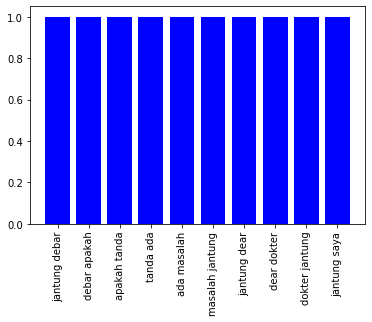

Similar Questions
{'sakit jantung': 2, 'seperti ada': 2, 'apakah ini': 1, 'ini salah': 1, 'salah satu': 1, 'satu gejala': 1, 'gejala sakit': 1, 'jantung apakah': 1, 'apakah nyeri': 1, 'nyeri dan': 1, 'dan sakit': 1, 'sakit pada': 1, 'pada dada': 1, 'dada juga': 1, 'juga dapat': 1, 'dapat picu': 1, 'picu sakit': 1, 'jantung karena': 1, 'karena yang': 1, 'yang saat': 1, 'saat ini': 1, 'ini saya': 1, 'saya alami': 1, 'alami adalah': 1, 'adalah saya': 1, 'saya rasa': 1, 'rasa jantung': 1, 'jantung saya': 1, 'saya sakit': 1, 'sakit kemudian': 1, 'kemudian seperti': 1, 'ada suara': 1, 'suara di': 1, 'di dalam': 1, 'dalam ketika': 1, 'ketika gerak': 1, 'gerak atau': 1, 'atau geser': 1, 'geser posisi': 1, 'posisi badan': 1, 'badan seperti': 1, 'ada tekan': 1, 'tekan dan': 1, 'dan sangat': 1, 'sangat sakit': 1, 'sakit apa': 1, 'apa sebab': 1, 'sebab yang': 1, 'yang picu': 1, 'picu hal': 1}


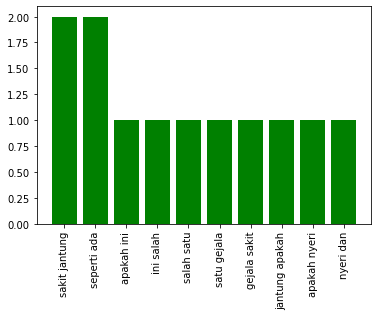



Question
{'kena belek': 2, 'atas ganggu': 1, 'ganggu lihat': 1, 'lihat usai': 1, 'usai kena': 1, 'belek dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya soal': 1, 'soal mata': 1, 'mata saya': 1, 'saya minggu': 1, 'minggu lalu': 1, 'lalu saya': 1, 'saya kena': 1, 'belek dan': 1, 'dan sekarang': 1, 'sekarang sudah': 1, 'sudah hilang': 1, 'hilang belek': 1, 'belek akan': 1, 'akan tetapi': 1, 'tetapi lihat': 1, 'lihat saya': 1, 'saya jadi': 1, 'jadi agak': 1, 'agak kurang': 1, 'kurang jelas': 1, 'jelas apa': 1, 'apa yang': 1, 'yang harus': 1, 'harus saya': 1, 'saya laku': 1, 'laku dok': 1, 'dok apa': 1, 'apa ada': 1, 'ada cara': 1, 'cara alami': 1, 'alami sembuh': 1, 'sembuh supaya': 1, 'supaya kembali': 1, 'kembali normal': 1, 'normal terima': 1, 'terima kasih': 1, 'kasih dok': 1, 'dok info': 1, 'info dan': 1, 'dan saran': 1}


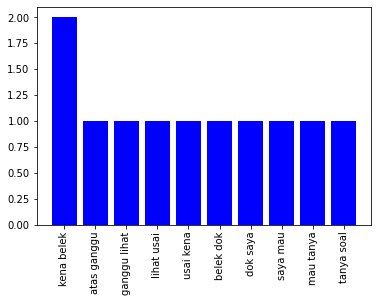

Similar Questions
{'saat lihat': 2, 'lihat cahaya': 2, 'silau dan': 1, 'dan halo': 1, 'halo saat': 1, 'cahaya saya': 1, 'saya seperti': 1, 'seperti lihat': 1, 'lihat halo': 1, 'halo dan': 1, 'dan silau': 1, 'silau saat': 1, 'cahaya tetapi': 1, 'tetapi diagnosa': 1, 'diagnosa periksa': 1, 'periksa kata': 1, 'kata normal': 1, 'normal saya': 1, 'saya kena': 1, 'kena apa': 1, 'apa ya': 1, 'ya dok': 1}


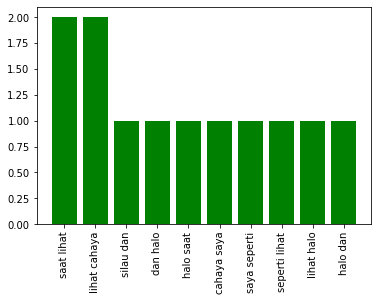



Question
{'sebab mimisan': 1, 'mimisan telah': 1, 'telah bangun': 1, 'bangun tidur': 1, 'tidur hallo': 1, 'hallo dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya apa': 1, 'apa ini': 1, 'ini adalah': 1, 'adalah pnyakit': 1, 'pnyakit serius': 1, 'serius apa': 1, 'apa tidak': 1, 'tidak pagi': 1, 'pagi ini': 1, 'ini jam': 1, 'jam pagi': 1, 'pagi ketika': 1, 'ketika saya': 1, 'saya tidur': 1, 'tidur saya': 1, 'saya bangun': 1, 'bangun dan': 1, 'dan mimisan': 1, 'mimisan yang': 1, 'yang sangat': 1, 'sangat banyak': 1, 'banyak dan': 1, 'dan deras': 1, 'deras saya': 1, 'saya shock': 1, 'shock karena': 1, 'karena tidak': 1, 'tidak pernah': 1, 'pernah mimisan': 1, 'mimisan belum': 1, 'belum dan': 1, 'dan spertinya': 1, 'spertinya darah': 1, 'darah pun': 1, 'pun megalir': 1, 'megalir dari': 1, 'dari dalam': 1, 'dalam hidung': 1, 'hidung ke': 1, 'ke mulut': 1, 'mulut karena': 1, 'karena dari': 1, 'dari mulut': 1, 'mulut pun': 1, 'pun keluar': 1, 'keluar darah': 1, 'darah dan': 1, 'd

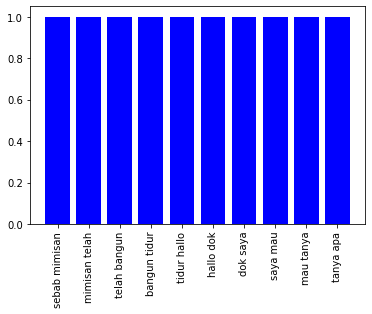

Similar Questions
{'telah itu': 3, 'dok dan': 3, 'dan tidak': 3, 'ada dahak': 2, 'saya coba': 2, 'ada yang': 2, 'tidak gatal': 2, 'lagi dok': 2, 'batuk lagi': 2, 'gatal dan': 2, 'normal dan': 2, 'batuk darah': 1, 'darah div': 1, 'div selamat': 1, 'selamat malam': 1, 'malam dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya tadi': 1, 'tadi pagi': 1, 'pagi stlah': 1, 'stlah bngn': 1, 'bngn tidur': 1, 'tidur saya': 1, 'saya mrasa': 1, 'mrasa seperti': 1, 'seperti ada': 1, 'dahak di': 1, 'di leher': 1, 'leher dan': 1, 'dan agak': 1, 'agak asa': 1, 'asa gatal': 1, 'gatal telah': 1, 'itu saya': 1, 'coba untuk': 1, 'untuk keluarin': 1, 'keluarin bareng': 1, 'bareng saat': 1, 'saat batuk': 1, 'batuk dok': 1, 'dan nyata': 1, 'nyata yang': 1, 'yang keluar': 1, 'keluar itu': 1, 'itu gumpal': 1, 'gumpal darah': 1, 'darah ada': 1, 'yang brwarna': 1, 'brwarna merah': 1, 'merah tua': 1, 'tua dan': 1, 'dan yang': 1, 'yang muda': 1, 'muda telah': 1, 'itu tenggorok': 1, 'tenggorok saya': 1, '

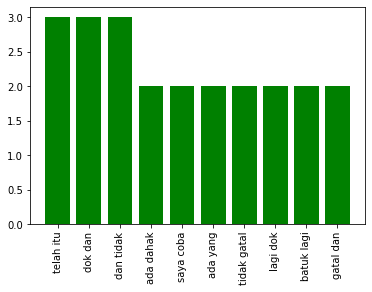



Question
{'mental disorder': 2, 'gadis sebut': 2, 'disorder atau': 1, 'atau tidak': 1, 'tidak salam': 1, 'salam saya': 1, 'saya ada': 1, 'ada pernah': 1, 'pernah dekat': 1, 'dekat dengan': 1, 'dengan orang': 1, 'orang gadis': 1, 'gadis cantik': 1, 'cantik sekitar': 1, 'sekitar umur': 1, 'umur atau': 1, 'atau tahun': 1, 'tahun tetapi': 1, 'tetapi saat': 1, 'saat saya': 1, 'saya ajak': 1, 'ajak obrol': 1, 'obrol hanya': 1, 'hanya saja': 1, 'saja dia': 1, 'dia cuma': 1, 'cuma bicara': 1, 'bicara patah': 1, 'patah kata': 1, 'kata waktu': 1, 'waktu itu': 1, 'itu sambil': 1, 'sambil tertawa': 1, 'tertawa dengan': 1, 'dengan muka': 1, 'muka merah': 1, 'merah lalu': 1, 'lalu gadis': 1, 'gadis itu': 1, 'itu waktu': 1, 'waktu luar': 1, 'luar kantor': 1, 'kantor habis': 1, 'habis makan': 1, 'makan siang': 1, 'siang tuju': 1, 'tuju ruang': 1, 'ruang ke': 1, 'ke meja': 1, 'meja saya': 1, 'saya sempat': 1, 'sempat kejar': 1, 'kejar dengan': 1, 'dengan maksud': 1, 'maksud ada': 1, 'ada cakap': 1, '

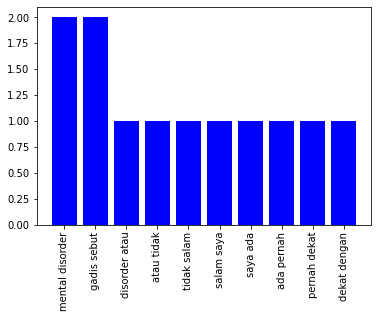

Similar Questions
{'yang saya': 3, 'ingin meni': 3, 'dengan saya': 3, 'klik dokter': 2, 'kasih atas': 2, 'jejaring sosial': 2, 'saya nilai': 2, 'dia hanya': 2, 'hanya mau': 2, 'meni dengan': 2, 'dia saya': 2, 'yang ingin': 2, 'seperti ini': 2, 'ini dengan': 2, 'dengan orang': 2, 'tidak pernah': 2, 'pacar dengan': 2, 'saya adalah': 2, 'adalah karena': 2, 'saya beri': 2, 'saya takut': 2, 'pasang tepat': 1, 'tepat atau': 1, 'atau tidak': 1, 'tidak salam': 1, 'salam klik': 1, 'dokter terima': 1, 'terima kasih': 1, 'atas kesempatanya': 1, 'kesempatanya saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya tentang': 1, 'tentang pribadi': 1, 'pribadi orang': 1, 'orang pria': 1, 'pria saya': 1, 'saya kenal': 1, 'kenal orang': 1, 'orang lelaki': 1, 'lelaki dari': 1, 'dari jejaring': 1, 'sosial yang': 1, 'nilai sangat': 1, 'sangat tarik': 1, 'tarik cara': 1, 'cara fisik': 1, 'fisik awal': 1, 'awal kenal': 1, 'kenal saya': 1, 'nilai dia': 1, 'dia lelaki': 1, 'lelaki senang': 1, 'senang dan': 1, 'dan ce

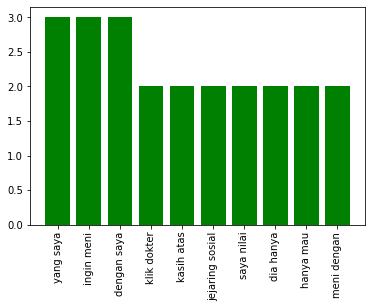

In [624]:
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(2, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(2, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Bigram Overlap

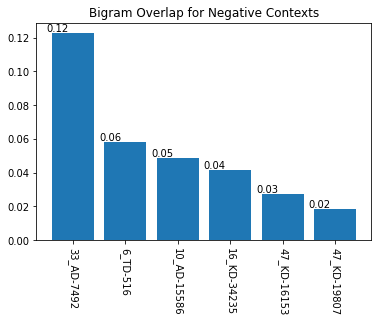

In [625]:
bigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(2, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(2, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
bigram_overlap = dict(sorted(bigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(bigram_overlap.keys()), list(bigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Bigram Overlap for Negative Contexts")
for i, v in enumerate(list(bigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Trigram Analysis

Question
{'yang saya alami': 2, 'pikir kenapa saya': 2, 'saya saat ini': 2, 'apakah depresi dapat': 1, 'depresi dapat kambuh': 1, 'dapat kambuh saya': 1, 'kambuh saya mhswi': 1, 'saya mhswi smst': 1, 'mhswi smst di': 1, 'smst di salah': 1, 'di salah satu': 1, 'salah satu poltekkes': 1, 'satu poltekkes di': 1, 'poltekkes di kota': 1, 'di kota saya': 1, 'kota saya pada': 1, 'saya pada tahun': 1, 'pada tahun lalu': 1, 'tahun lalu saya': 1, 'lalu saya sempat': 1, 'saya sempat aju': 1, 'sempat aju tanya': 1, 'aju tanya kena': 1, 'tanya kena yang': 1, 'kena yang saya': 1, 'saya alami dan': 1, 'alami dan telah': 1, 'dan telah saya': 1, 'telah saya ecek': 1, 'saya ecek jawab': 1, 'ecek jawab pada': 1, 'jawab pada februari': 1, 'pada februari tahun': 1, 'februari tahun ini': 1, 'tahun ini saya': 1, 'ini saya dapat': 1, 'saya dapat golong': 1, 'dapat golong depresi': 1, 'golong depresi karena': 1, 'depresi karena cakup': 1, 'karena cakup cukup': 1, 'cakup cukup banyak': 1, 'cukup banyak depresi'

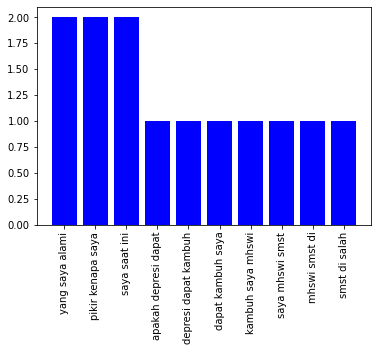

Similar Questions
{'saya idap adhd': 2, 'ubah mood yang': 2, 'saya tidak dapat': 2, 'tidak dapat ingat': 2, 'sebut saya selalu': 2, 'apa saya idap': 1, 'idap adhd saya': 1, 'adhd saya remaja': 1, 'saya remaja tahun': 1, 'remaja tahun sejak': 1, 'tahun sejak kecil': 1, 'sejak kecil saya': 1, 'kecil saya kenal': 1, 'saya kenal nakal': 1, 'kenal nakal banyak': 1, 'nakal banyak ting': 1, 'banyak ting dan': 1, 'ting dan milik': 1, 'dan milik asa': 1, 'milik asa yang': 1, 'asa yang naik': 1, 'yang naik turun': 1, 'naik turun ketika': 1, 'turun ketika usia': 1, 'ketika usia saya': 1, 'usia saya tambah': 1, 'saya tambah saya': 1, 'tambah saya milik': 1, 'saya milik sulit': 1, 'milik sulit dalam': 1, 'sulit dalam adaptasi': 1, 'dalam adaptasi dan': 1, 'adaptasi dan ubah': 1, 'dan ubah mood': 1, 'mood yang serta': 1, 'yang serta ubah': 1, 'serta ubah sikap': 1, 'ubah sikap yang': 1, 'sikap yang drastis': 1, 'yang drastis pindah': 1, 'drastis pindah dari': 1, 'pindah dari sd': 1, 'dari sd ke': 1,

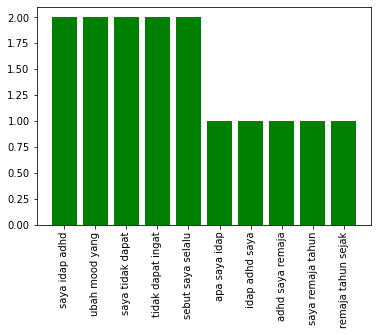



Question
{'jantung debar apakah': 1, 'debar apakah tanda': 1, 'apakah tanda ada': 1, 'tanda ada masalah': 1, 'ada masalah jantung': 1, 'masalah jantung dear': 1, 'jantung dear dokter': 1, 'dear dokter jantung': 1, 'dokter jantung saya': 1, 'jantung saya suka': 1, 'saya suka rasa': 1, 'suka rasa seperti': 1, 'rasa seperti darah': 1, 'seperti darah tidak': 1, 'darah tidak lancar': 1, 'tidak lancar lama': 1, 'lancar lama ini': 1, 'lama ini tidak': 1, 'ini tidak ada': 1, 'tidak ada keluh': 1, 'ada keluh apa': 1, 'keluh apa dan': 1, 'apa dan sehat': 1, 'dan sehat saya': 1, 'sehat saya relatif': 1, 'saya relatif prima': 1, 'relatif prima apakah': 1, 'prima apakah saya': 1, 'apakah saya ada': 1, 'saya ada sakit': 1, 'ada sakit jantung': 1, 'sakit jantung mohon': 1, 'jantung mohon informasi': 1, 'mohon informasi dok': 1, 'informasi dok terima': 1, 'dok terima kasih': 1, 'terima kasih atas': 1, 'kasih atas atensi': 1, 'atas atensi salam': 1, 'atensi salam hormat': 1}


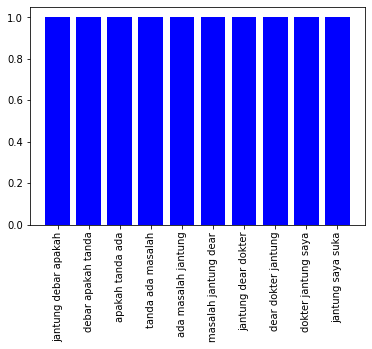

Similar Questions
{'apakah ini salah': 1, 'ini salah satu': 1, 'salah satu gejala': 1, 'satu gejala sakit': 1, 'gejala sakit jantung': 1, 'sakit jantung apakah': 1, 'jantung apakah nyeri': 1, 'apakah nyeri dan': 1, 'nyeri dan sakit': 1, 'dan sakit pada': 1, 'sakit pada dada': 1, 'pada dada juga': 1, 'dada juga dapat': 1, 'juga dapat picu': 1, 'dapat picu sakit': 1, 'picu sakit jantung': 1, 'sakit jantung karena': 1, 'jantung karena yang': 1, 'karena yang saat': 1, 'yang saat ini': 1, 'saat ini saya': 1, 'ini saya alami': 1, 'saya alami adalah': 1, 'alami adalah saya': 1, 'adalah saya rasa': 1, 'saya rasa jantung': 1, 'rasa jantung saya': 1, 'jantung saya sakit': 1, 'saya sakit kemudian': 1, 'sakit kemudian seperti': 1, 'kemudian seperti ada': 1, 'seperti ada suara': 1, 'ada suara di': 1, 'suara di dalam': 1, 'di dalam ketika': 1, 'dalam ketika gerak': 1, 'ketika gerak atau': 1, 'gerak atau geser': 1, 'atau geser posisi': 1, 'geser posisi badan': 1, 'posisi badan seperti': 1, 'badan sep

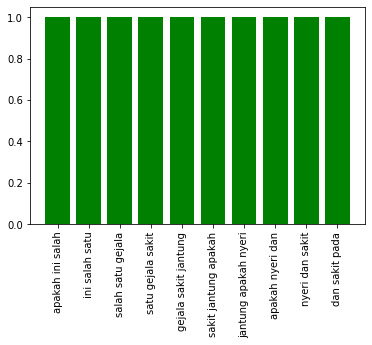



Question
{'atas ganggu lihat': 1, 'ganggu lihat usai': 1, 'lihat usai kena': 1, 'usai kena belek': 1, 'kena belek dok': 1, 'belek dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya soal': 1, 'tanya soal mata': 1, 'soal mata saya': 1, 'mata saya minggu': 1, 'saya minggu lalu': 1, 'minggu lalu saya': 1, 'lalu saya kena': 1, 'saya kena belek': 1, 'kena belek dan': 1, 'belek dan sekarang': 1, 'dan sekarang sudah': 1, 'sekarang sudah hilang': 1, 'sudah hilang belek': 1, 'hilang belek akan': 1, 'belek akan tetapi': 1, 'akan tetapi lihat': 1, 'tetapi lihat saya': 1, 'lihat saya jadi': 1, 'saya jadi agak': 1, 'jadi agak kurang': 1, 'agak kurang jelas': 1, 'kurang jelas apa': 1, 'jelas apa yang': 1, 'apa yang harus': 1, 'yang harus saya': 1, 'harus saya laku': 1, 'saya laku dok': 1, 'laku dok apa': 1, 'dok apa ada': 1, 'apa ada cara': 1, 'ada cara alami': 1, 'cara alami sembuh': 1, 'alami sembuh supaya': 1, 'sembuh supaya kembali': 1, 'supaya kembali normal': 1, 'kembali normal 

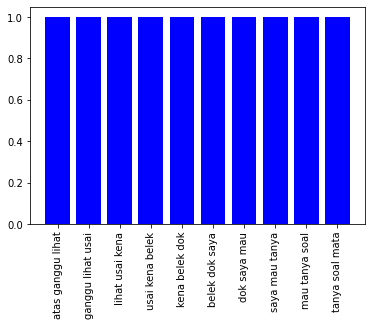

Similar Questions
{'saat lihat cahaya': 2, 'silau dan halo': 1, 'dan halo saat': 1, 'halo saat lihat': 1, 'lihat cahaya saya': 1, 'cahaya saya seperti': 1, 'saya seperti lihat': 1, 'seperti lihat halo': 1, 'lihat halo dan': 1, 'halo dan silau': 1, 'dan silau saat': 1, 'silau saat lihat': 1, 'lihat cahaya tetapi': 1, 'cahaya tetapi diagnosa': 1, 'tetapi diagnosa periksa': 1, 'diagnosa periksa kata': 1, 'periksa kata normal': 1, 'kata normal saya': 1, 'normal saya kena': 1, 'saya kena apa': 1, 'kena apa ya': 1, 'apa ya dok': 1}


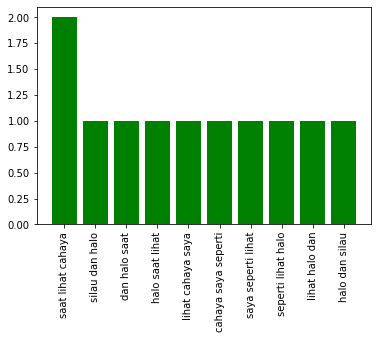



Question
{'sebab mimisan telah': 1, 'mimisan telah bangun': 1, 'telah bangun tidur': 1, 'bangun tidur hallo': 1, 'tidur hallo dok': 1, 'hallo dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya apa': 1, 'tanya apa ini': 1, 'apa ini adalah': 1, 'ini adalah pnyakit': 1, 'adalah pnyakit serius': 1, 'pnyakit serius apa': 1, 'serius apa tidak': 1, 'apa tidak pagi': 1, 'tidak pagi ini': 1, 'pagi ini jam': 1, 'ini jam pagi': 1, 'jam pagi ketika': 1, 'pagi ketika saya': 1, 'ketika saya tidur': 1, 'saya tidur saya': 1, 'tidur saya bangun': 1, 'saya bangun dan': 1, 'bangun dan mimisan': 1, 'dan mimisan yang': 1, 'mimisan yang sangat': 1, 'yang sangat banyak': 1, 'sangat banyak dan': 1, 'banyak dan deras': 1, 'dan deras saya': 1, 'deras saya shock': 1, 'saya shock karena': 1, 'shock karena tidak': 1, 'karena tidak pernah': 1, 'tidak pernah mimisan': 1, 'pernah mimisan belum': 1, 'mimisan belum dan': 1, 'belum dan spertinya': 1, 'dan spertinya darah': 1, 'spertinya darah pun': 1, 'd

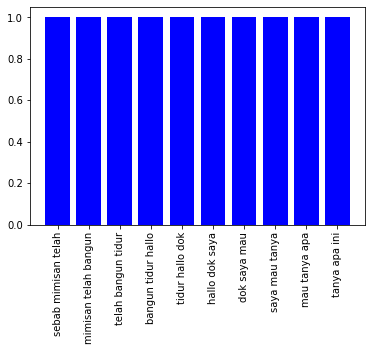

Similar Questions
{'normal dan tidak': 2, 'batuk darah div': 1, 'darah div selamat': 1, 'div selamat malam': 1, 'selamat malam dok': 1, 'malam dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya tadi': 1, 'tanya tadi pagi': 1, 'tadi pagi stlah': 1, 'pagi stlah bngn': 1, 'stlah bngn tidur': 1, 'bngn tidur saya': 1, 'tidur saya mrasa': 1, 'saya mrasa seperti': 1, 'mrasa seperti ada': 1, 'seperti ada dahak': 1, 'ada dahak di': 1, 'dahak di leher': 1, 'di leher dan': 1, 'leher dan agak': 1, 'dan agak asa': 1, 'agak asa gatal': 1, 'asa gatal telah': 1, 'gatal telah itu': 1, 'telah itu saya': 1, 'itu saya coba': 1, 'saya coba untuk': 1, 'coba untuk keluarin': 1, 'untuk keluarin bareng': 1, 'keluarin bareng saat': 1, 'bareng saat batuk': 1, 'saat batuk dok': 1, 'batuk dok dan': 1, 'dok dan nyata': 1, 'dan nyata yang': 1, 'nyata yang keluar': 1, 'yang keluar itu': 1, 'keluar itu gumpal': 1, 'itu gumpal darah': 1, 'gumpal darah ada': 1, 'darah ada yang': 1, 'ada yang brwarna': 1, '

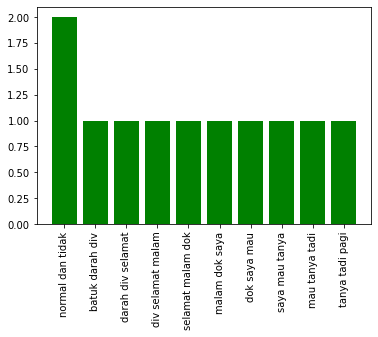



Question
{'mental disorder atau': 1, 'disorder atau tidak': 1, 'atau tidak salam': 1, 'tidak salam saya': 1, 'salam saya ada': 1, 'saya ada pernah': 1, 'ada pernah dekat': 1, 'pernah dekat dengan': 1, 'dekat dengan orang': 1, 'dengan orang gadis': 1, 'orang gadis cantik': 1, 'gadis cantik sekitar': 1, 'cantik sekitar umur': 1, 'sekitar umur atau': 1, 'umur atau tahun': 1, 'atau tahun tetapi': 1, 'tahun tetapi saat': 1, 'tetapi saat saya': 1, 'saat saya ajak': 1, 'saya ajak obrol': 1, 'ajak obrol hanya': 1, 'obrol hanya saja': 1, 'hanya saja dia': 1, 'saja dia cuma': 1, 'dia cuma bicara': 1, 'cuma bicara patah': 1, 'bicara patah kata': 1, 'patah kata waktu': 1, 'kata waktu itu': 1, 'waktu itu sambil': 1, 'itu sambil tertawa': 1, 'sambil tertawa dengan': 1, 'tertawa dengan muka': 1, 'dengan muka merah': 1, 'muka merah lalu': 1, 'merah lalu gadis': 1, 'lalu gadis itu': 1, 'gadis itu waktu': 1, 'itu waktu luar': 1, 'waktu luar kantor': 1, 'luar kantor habis': 1, 'kantor habis makan': 1, 

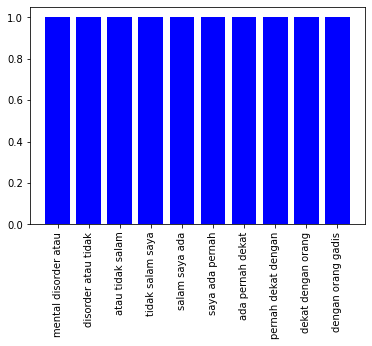

Similar Questions
{'dia hanya mau': 2, 'ingin meni dengan': 2, 'meni dengan saya': 2, 'pasang tepat atau': 1, 'tepat atau tidak': 1, 'atau tidak salam': 1, 'tidak salam klik': 1, 'salam klik dokter': 1, 'klik dokter terima': 1, 'dokter terima kasih': 1, 'terima kasih atas': 1, 'kasih atas kesempatanya': 1, 'atas kesempatanya saya': 1, 'kesempatanya saya mau': 1, 'saya mau tanya': 1, 'mau tanya tentang': 1, 'tanya tentang pribadi': 1, 'tentang pribadi orang': 1, 'pribadi orang pria': 1, 'orang pria saya': 1, 'pria saya kenal': 1, 'saya kenal orang': 1, 'kenal orang lelaki': 1, 'orang lelaki dari': 1, 'lelaki dari jejaring': 1, 'dari jejaring sosial': 1, 'jejaring sosial yang': 1, 'sosial yang saya': 1, 'yang saya nilai': 1, 'saya nilai sangat': 1, 'nilai sangat tarik': 1, 'sangat tarik cara': 1, 'tarik cara fisik': 1, 'cara fisik awal': 1, 'fisik awal kenal': 1, 'awal kenal saya': 1, 'kenal saya nilai': 1, 'saya nilai dia': 1, 'nilai dia lelaki': 1, 'dia lelaki senang': 1, 'lelaki senan

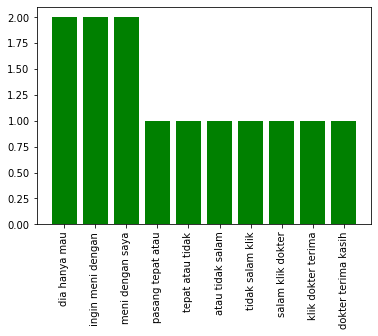

In [626]:
for i in range(len(text_error)):
    if len(text_error[i]) <= 0:
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(3, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(3, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Trigram Overlap

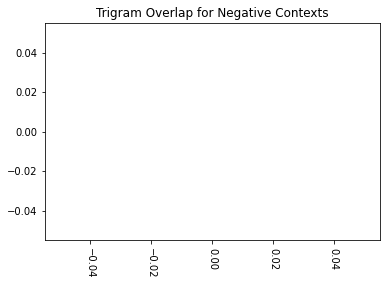

In [627]:
trigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(3, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(3, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
trigram_overlap = dict(sorted(trigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(trigram_overlap.keys()), list(trigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Trigram Overlap for Negative Contexts")
for i, v in enumerate(list(trigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

In [628]:
gold_ids[0]

['KD-10780',
 'AD-11170',
 'KD-34954',
 'KD-42528',
 'AD-3644',
 'AD-20187',
 'KD-9647',
 'AD-15985',
 'AD-8111',
 'AD-19236',
 'KD-30953',
 'KD-1190',
 'AD-11811',
 'AD-23059',
 'AD-1505',
 'AD-8996',
 'AD-13391',
 'AD-23609',
 'AD-20888',
 'AD-14282',
 'AD-19627',
 'KD-40213',
 'TD-7481',
 'KD-33961',
 'AD-8178',
 'AD-10434',
 'AD-1225',
 'AD-6755',
 'AD-5483',
 'AD-15205',
 'AD-2483',
 'KD-36449',
 'KD-38063',
 'KD-31262',
 'KD-7197',
 'KD-13846',
 'KD-29989',
 'KD-34810',
 'TD-2104',
 'KD-28831',
 'KD-818',
 'KD-12573',
 'KD-32421',
 'KD-130',
 'KD-16041',
 'KD-18305',
 'TD-11575',
 'AD-22794',
 'AD-6224',
 'AD-20846',
 'TD-4539',
 'AD-5304',
 'KD-26899',
 'KD-6929',
 'AD-12475',
 'KD-7384',
 'AD-11852',
 'AD-8328',
 'AD-9875',
 'KD-26435',
 'AD-10103']

## Vector Embedding Projection

In [629]:
import pickle

In [630]:
#passage embedding load

passage_embeddings = dict()
with (open("../Dataset/Embeddings/passage_embeddings_syifa-ict_full.tsv", "rb")) as openfile:
    while True:
        try:
            passage_lst = pickle.load(openfile)
            for pid, p_vector in passage_lst:
                passage_embeddings[pid] = p_vector
        except EOFError:
            break


In [631]:
#question embedding load

query_embeddings = dict()
with (open("../Dataset/Embeddings/question_embeddings_syifa-ict_full.tsv", "rb")) as openfile:
    while True:
        try:
            query_lst = pickle.load(openfile)
            for qid, q_vector in query_lst:
                query_embeddings[qid] = q_vector
        except EOFError:
            break


/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


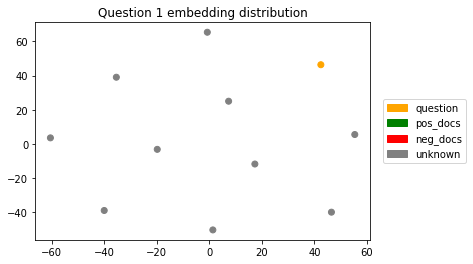

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


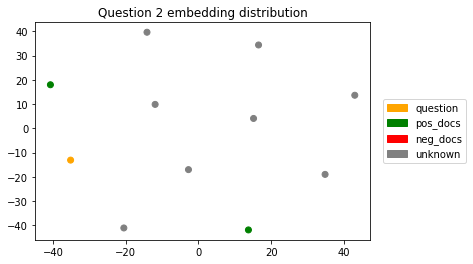

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


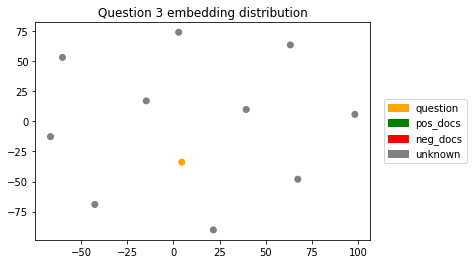

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


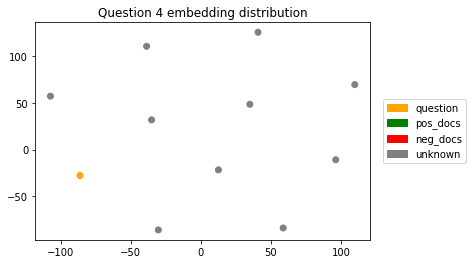

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


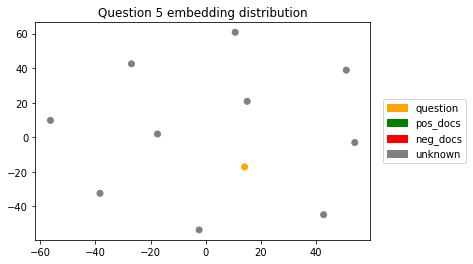

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


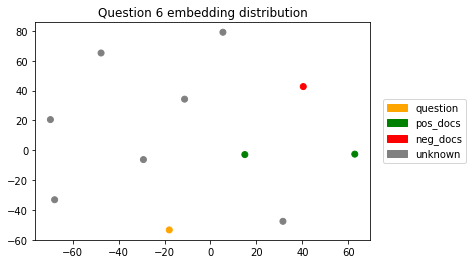

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


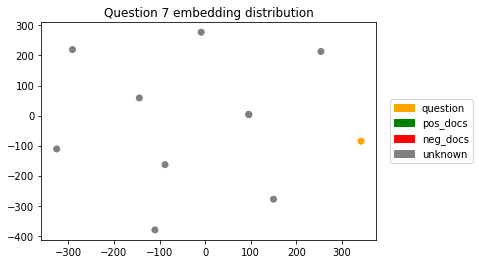

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


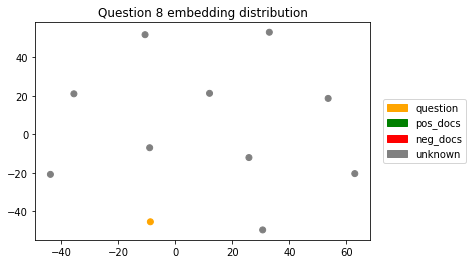

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


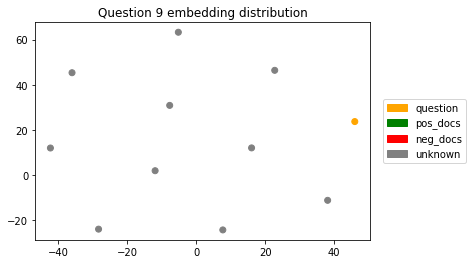

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


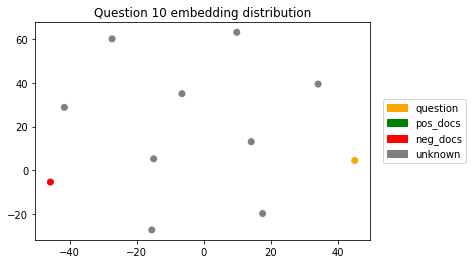

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


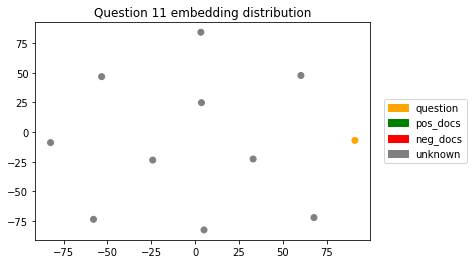

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


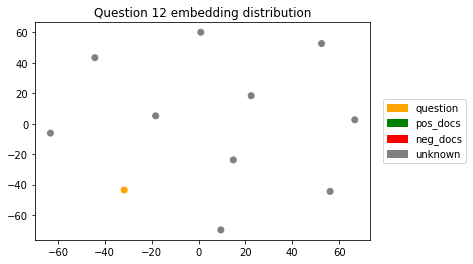

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


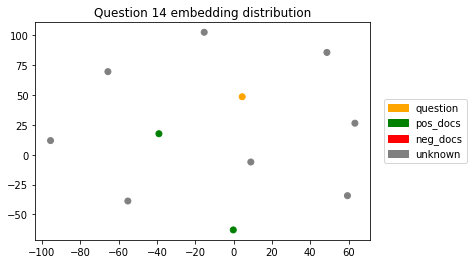

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


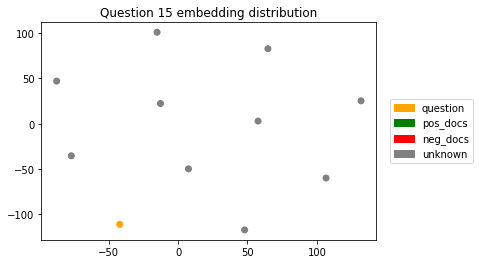

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


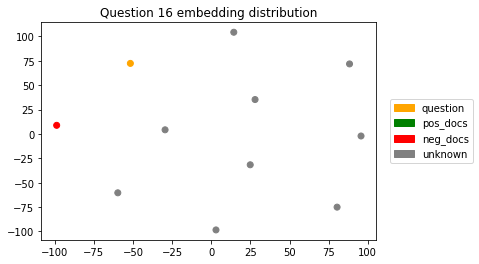

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


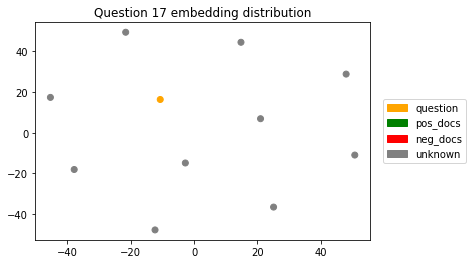

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


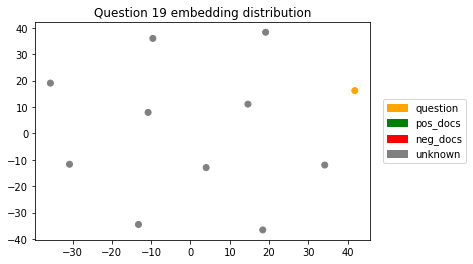

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


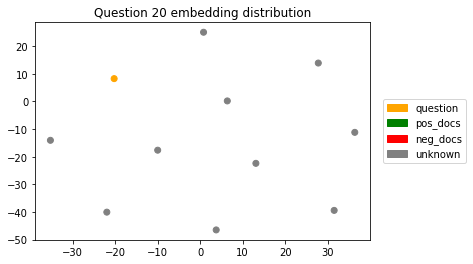

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


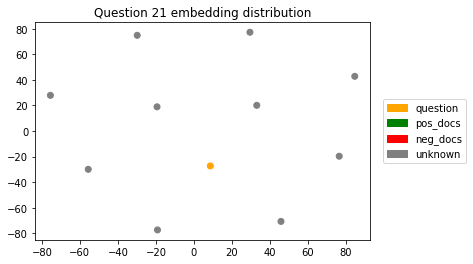

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


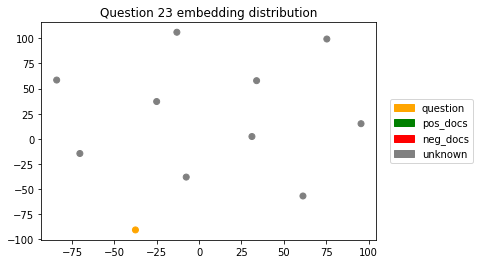

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


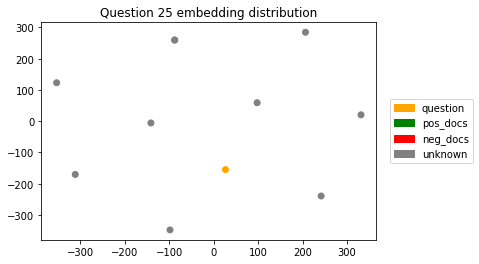

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


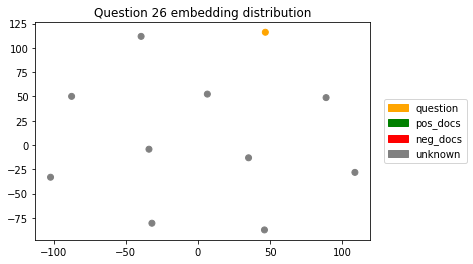

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


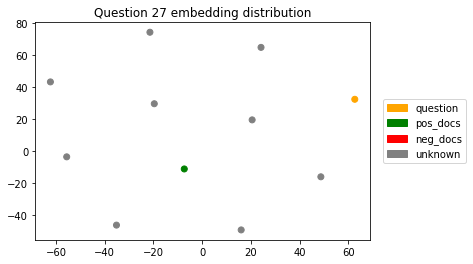

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


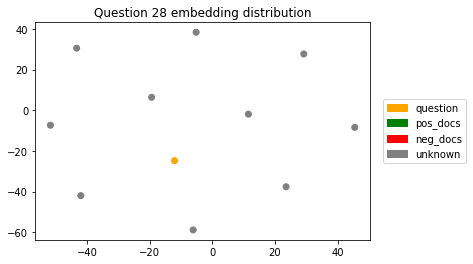

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


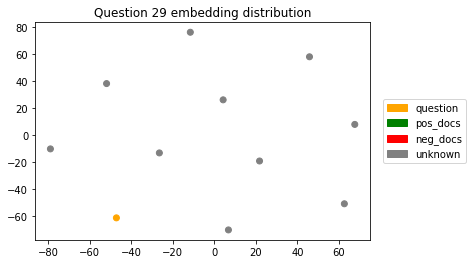

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


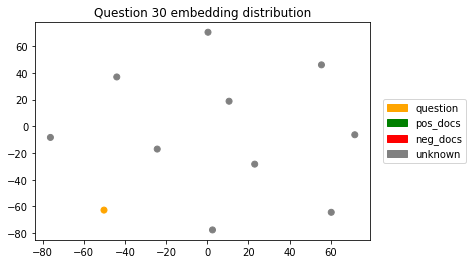

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


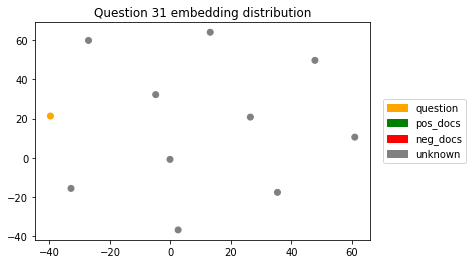

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


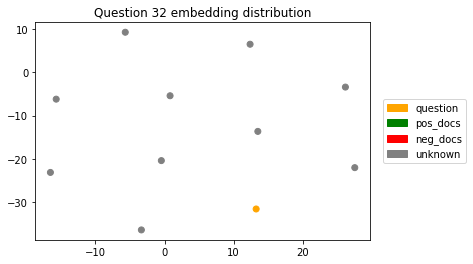

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


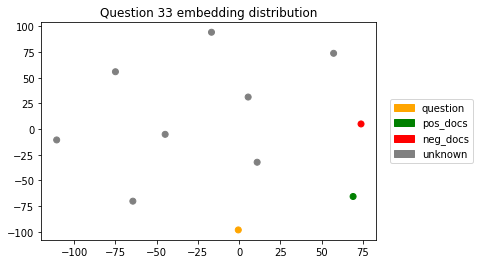

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


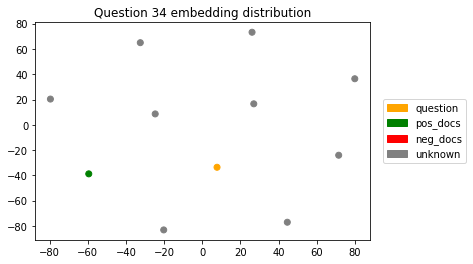

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


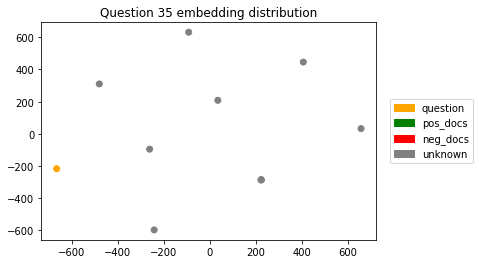

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


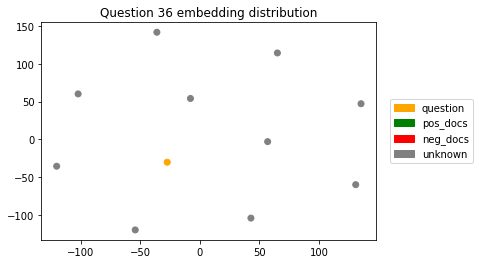

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


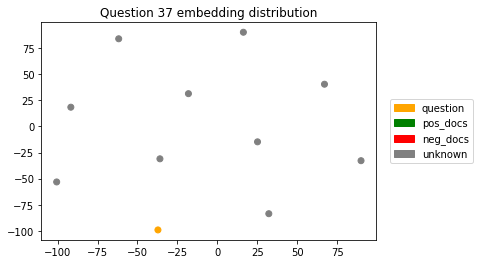

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


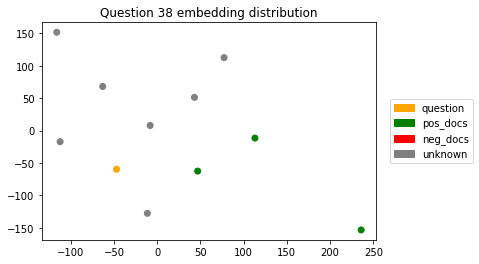

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


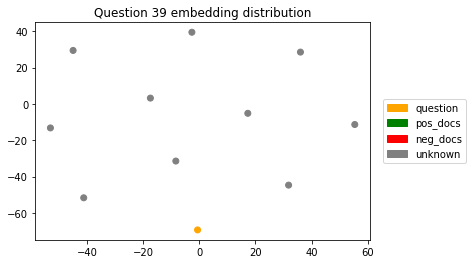

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


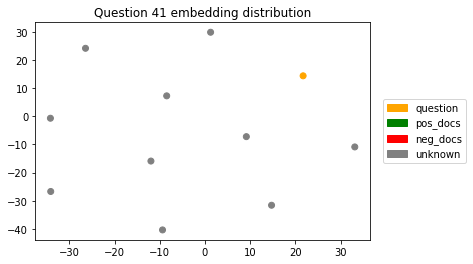

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


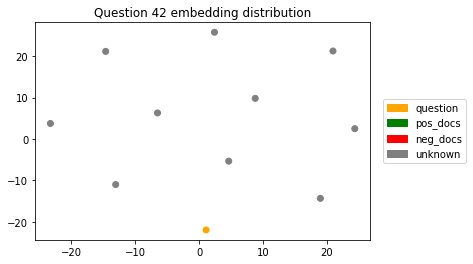

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


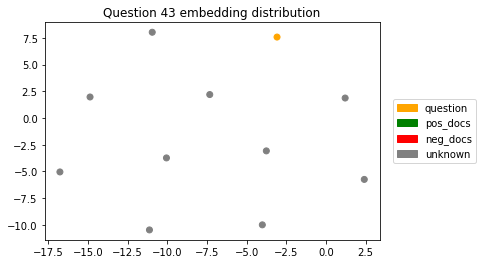

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


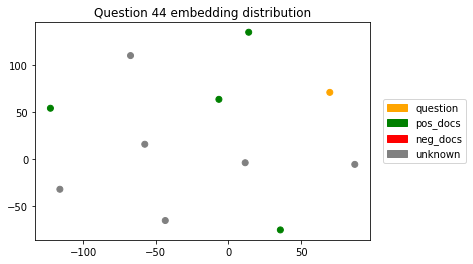

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


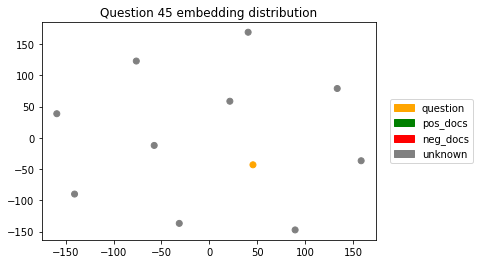

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


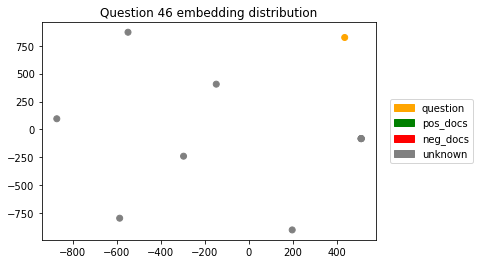

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


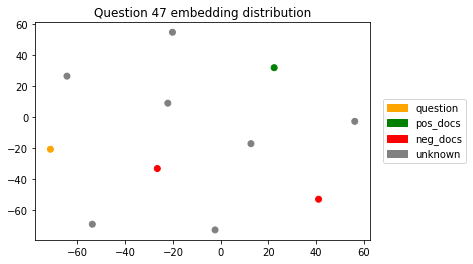

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


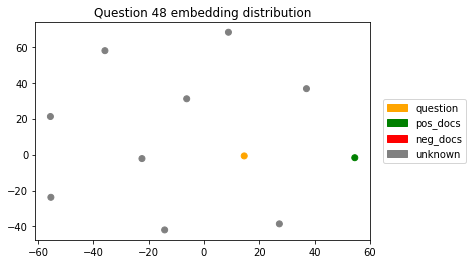

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


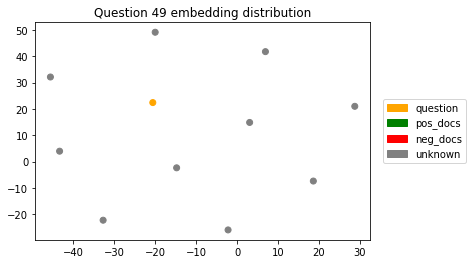

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


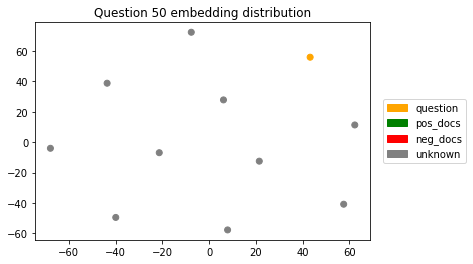

In [632]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import numpy as np

orange_patch = mpatches.Patch(color='orange', label='question')
green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [orange_patch, green_patch, red_patch, grey_patch]
for idx,row in enumerate(actual_data):    
    values = [0]
    colors = ListedColormap(['orange','green','red', 'grey'])
    qid = row['question']['id']
    q_vector = query_embeddings[qid]
    q_vector = q_vector.reshape(-1, len(q_vector))
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        p_vector = passage_embeddings[pid]
        p_vector = p_vector.reshape(-1, len(p_vector))
        q_vector = np.concatenate((q_vector, p_vector), axis=0)
        color = 1 if pid in gold_ids[idx] else 2
        color = 3 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    if len(q_vector) < 2:
        continue
    q_compressed = TSNE(n_components=2, learning_rate='auto',init='pca', random_state=42).fit_transform(q_vector)

    plt.title(f"Question {qid} embedding distribution")
    scatter = plt.scatter(q_compressed[:,0], q_compressed[:,1], c=values, cmap=colors)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()

## BM25 Score vs DPR Score

We expect the graphic will be inversely linear because DPR similarity score has negative correlation with BM25 similarity (While DPR smaller is better, BM25 bigger is better)

In [633]:
import xml.etree.ElementTree as ET

#gather all documents from corpus
docs = []
doc_ids = []

tree = ET.parse('../Dataset/Corpus/corpus_only_question_edited.xml')
root = tree.getroot()

for doc in root:
    for attr in doc:
        attr_type = attr.tag
        attr_content = attr.text
        if attr_type=='KELUHAN':
            content_text = ''
            for content in attr:
                if content.tag == 'JUDUL':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
                elif content.tag == 'ISI':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
            docs.append(content_text)
        elif attr_type == 'ID':
            doc_ids.append(attr_content)



In [634]:
assert len(docs)==len(doc_ids)

In [635]:
docs_map =  dict()
for idx, doc_id in enumerate(doc_ids):
    docs_map[doc_id] = docs[idx]

In [636]:
from tqdm import tqdm

avgdl = sum(len(doc) for doc in docs) / len(docs)
N = len(docs)
docs_freq_map, terms_freq_map, N, avgdl = bm25_init(docs_map)
for q_idx, q_row in tqdm(enumerate(actual_data)):
    query = q_row['question']['title']
    query  += f". {q_row['question']['text']}" if q_row['question']['text'].strip()!="" else ""
    for doc_idx, doc_row in enumerate(q_row['ctxs']):
        doc_id = doc_row['id']
        actual_data[q_idx]['ctxs'][doc_idx]['bm25_score'] = bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map,  docs_map, avgdl, N)
        

45it [00:00, 91.81it/s]


### Aggregated Plot

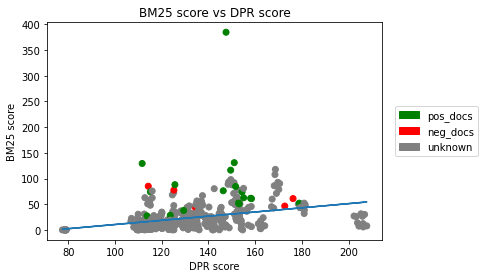

In [637]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.preprocessing import MinMaxScaler, StandardScaler

green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [green_patch, red_patch, grey_patch]
values = []
colors = ListedColormap(['green','red', 'grey'])
score_vector = []
for idx,row in enumerate(actual_data):        
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
score_vector= np.array(score_vector)


m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
plt.title(f"BM25 score vs DPR score")
plt.xlabel("DPR score")
plt.ylabel("BM25 score")
scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)

plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
plt.show()

### Per question plot

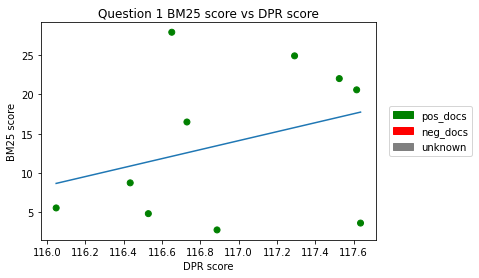

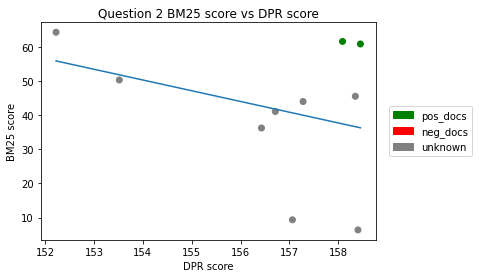

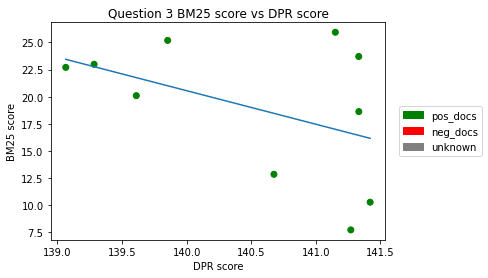

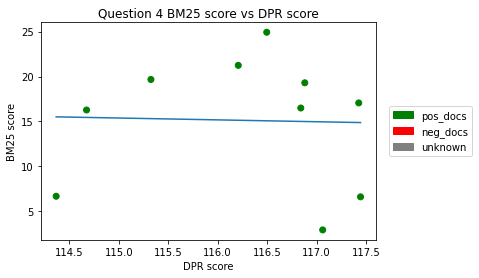

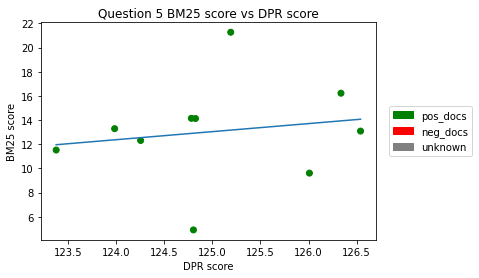

...

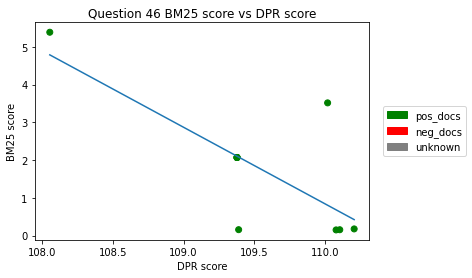

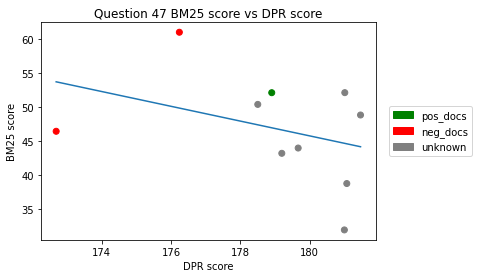

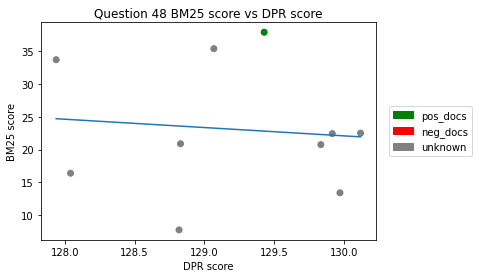

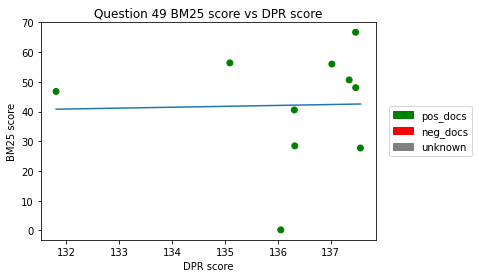

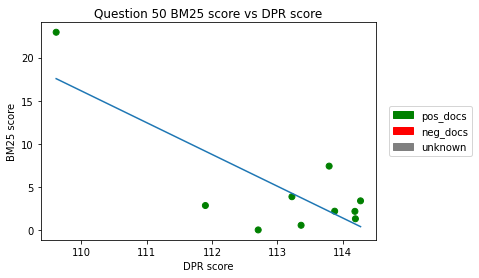

In [638]:
gradients_lst = []
for idx,row in enumerate(actual_data):
    values = []
    score_vector = []
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    score_vector= np.array(score_vector)


    m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
    plt.title(f"Question {qid} BM25 score vs DPR score")
    plt.xlabel("DPR score")
    plt.ylabel("BM25 score")
    scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)
    gradients_lst.append(m)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
    plt.show()

In [639]:
is_positive = [gradient for gradient in gradients_lst if gradient > 0]
is_negative = [gradient for gradient in gradients_lst if gradient < 0]

print(f"positive gradient count: {len(is_positive)}")
print(f"negative gradient count: {len(is_negative)}")

positive gradient count: 21
negative gradient count: 24


# G. IndoWiki Data

In [640]:
actual_data = []

with open('../Results/syifa_results_full_indowiki.json', 'r') as actual_out:
    actual_data = json.load(actual_out)



In [641]:
text_error = []
i = 0
for row in actual_data:
    row_text_error = []
    for row_ctx in row['ctxs']:
        if row_ctx['id'] in neg_ids[i]:
            row_text_error.append({'id': row_ctx['id'], 'title': row_ctx['title'], 'text': row_ctx['text']})
    text_error.append(row_text_error)
    i+=1

In [642]:
for i in range(len(text_error)):
    print("Question")
    print(f"text: {actual_data[i]['question']['text']}")
    print(f"title: {actual_data[i]['question']['title']}")
    print("Similar Questions")
    print(text_error[i])
    print()
    print()

Question
text: malam dok , sejak 2 hari yang lalu badan saya pusing dan lemas hari ini hidung saya mengeluarkan ingus terus menerus , bagaimana cara mengatasi nya ya dok ? terima kasih sebelumnya
title: cara mengatasi pusing , lemas dan hidung berair
Similar Questions
[]


Question
text: selamat pagi dok , saya mau tanya kenapa telinga saya berdenging terus ya dok sudah 6 hari , saya juga sudah ke puskesmas untuk di periksa , kata dokternya telinganya kotor karena di bersihkan dengan cutton buds jadi kotorannya terdorong hingga menutupi gendang telinga , dan saya sudah dikasih obat tetes untuk menghilangkan kotoran , tetapi dengung di telinga saya tidak berkurang sama sekali dok , saran dari dokter seperti apa ?
title: telinga berdengung sebelah kiri
Similar Questions
[]


Question
text: sore dok . . maaf dok saya sudah 4 hari mengalami benjolan di daerah kemaluan mula-mula benjolan tersebut kecil dan sekarang membesar lalu pecah dok . . rasanya linu dan sakit jika malam hari . . kira-

## Unigram Analysis

In [643]:
n = len(text_error)

In [644]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/mk1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Question
{'bicara': 4, 'anak': 4, 'dok': 3, 'solusi': 2, 'ya': 2, 'lancar': 1, 'usia': 1, 'umur': 1, 'susah': 1, 'banyak': 1, 'rengek': 1, 'ajak': 1, 'takut': 1, 'lambat': 1, 'terima': 1, 'kasih': 1}


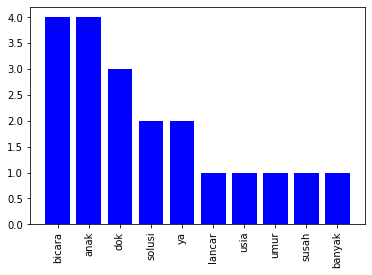

Similar Questions
{'anak': 2, 'bicara': 2, 'dok': 2, 'telat': 1, 'usia': 1, 'lancar': 1, 'gimana': 1, 'terimakasi': 1}


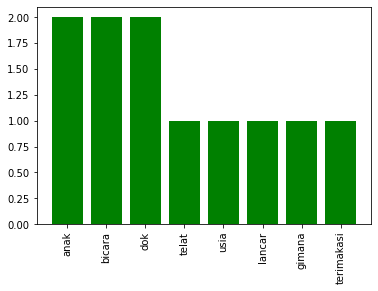

In [645]:
import matplotlib.pyplot as plt

for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(1, full_query)
    
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(1, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Unigram Overlap

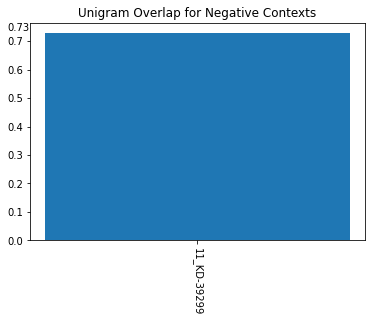

In [646]:
unigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(1, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(1, full_passage)
        unigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
unigram_overlap = dict(sorted(unigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(unigram_overlap.keys()), list(unigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Unigram Overlap for Negative Contexts")
for i, v in enumerate(list(unigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.01, str(round(v, 2)))
plt.show()

## Bigram Analysis

Question
{'anak saya': 2, 'belum lancar': 1, 'lancar bicara': 1, 'bicara di': 1, 'di usia': 1, 'usia tahun': 1, 'tahun bagaimana': 1, 'bagaimana solusi': 1, 'solusi dok': 1, 'dok saya': 1, 'saya mau': 1, 'mau tanya': 1, 'tanya anak': 1, 'saya sekarang': 1, 'sekarang sudah': 1, 'sudah hampir': 1, 'hampir umur': 1, 'umur tiga': 1, 'tiga tahun': 1, 'tahun tetapi': 1, 'tetapi kenapa': 1, 'kenapa ya': 1, 'ya bicara': 1, 'bicara anak': 1, 'anak susah': 1, 'susah dia': 1, 'dia selalu': 1, 'selalu jika': 1, 'jika ingin': 1, 'ingin sesuatu': 1, 'sesuatu bicara': 1, 'bicara sekal': 1, 'sekal dan': 1, 'dan banyak': 1, 'banyak rengek': 1, 'rengek dok': 1, 'dok padahal': 1, 'padahal saya': 1, 'saya selalu': 1, 'selalu ajak': 1, 'ajak anak': 1, 'anak bicara': 1, 'bicara bagaimana': 1, 'bagaimana ya': 1, 'ya dok': 1, 'dok solusi': 1, 'solusi saya': 1, 'saya takut': 1, 'takut anak': 1, 'saya lambat': 1, 'lambat terima': 1, 'terima kasih': 1}


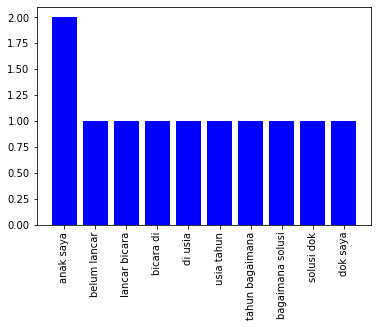

Similar Questions
{'anak telat': 1, 'telat bicara': 1, 'bicara dok': 1, 'dok mau': 1, 'mau tanya': 1, 'tanya saya': 1, 'saya punya': 1, 'punya anak': 1, 'anak usia': 1, 'usia tahun': 1, 'tahun tetapi': 1, 'tetapi bicara': 1, 'bicara belum': 1, 'belum lancar': 1, 'lancar gimana': 1, 'gimana dok': 1, 'dok terimakasi': 1}


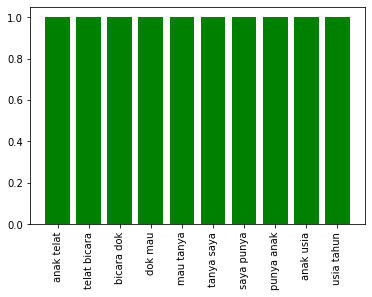

In [647]:
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(2, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(2, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Bigram Overlap

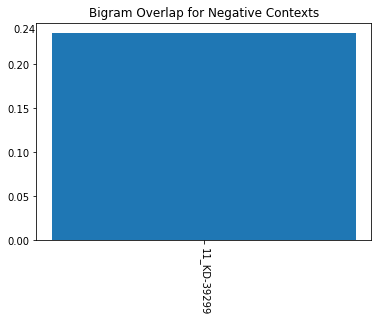

In [648]:
bigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(2, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(2, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
bigram_overlap = dict(sorted(bigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(bigram_overlap.keys()), list(bigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Bigram Overlap for Negative Contexts")
for i, v in enumerate(list(bigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Trigram Analysis

Question
{'belum lancar bicara': 1, 'lancar bicara di': 1, 'bicara di usia': 1, 'di usia tahun': 1, 'usia tahun bagaimana': 1, 'tahun bagaimana solusi': 1, 'bagaimana solusi dok': 1, 'solusi dok saya': 1, 'dok saya mau': 1, 'saya mau tanya': 1, 'mau tanya anak': 1, 'tanya anak saya': 1, 'anak saya sekarang': 1, 'saya sekarang sudah': 1, 'sekarang sudah hampir': 1, 'sudah hampir umur': 1, 'hampir umur tiga': 1, 'umur tiga tahun': 1, 'tiga tahun tetapi': 1, 'tahun tetapi kenapa': 1, 'tetapi kenapa ya': 1, 'kenapa ya bicara': 1, 'ya bicara anak': 1, 'bicara anak susah': 1, 'anak susah dia': 1, 'susah dia selalu': 1, 'dia selalu jika': 1, 'selalu jika ingin': 1, 'jika ingin sesuatu': 1, 'ingin sesuatu bicara': 1, 'sesuatu bicara sekal': 1, 'bicara sekal dan': 1, 'sekal dan banyak': 1, 'dan banyak rengek': 1, 'banyak rengek dok': 1, 'rengek dok padahal': 1, 'dok padahal saya': 1, 'padahal saya selalu': 1, 'saya selalu ajak': 1, 'selalu ajak anak': 1, 'ajak anak bicara': 1, 'anak bicara baga

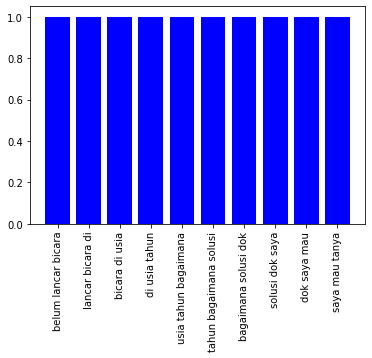

Similar Questions
{'anak telat bicara': 1, 'telat bicara dok': 1, 'bicara dok mau': 1, 'dok mau tanya': 1, 'mau tanya saya': 1, 'tanya saya punya': 1, 'saya punya anak': 1, 'punya anak usia': 1, 'anak usia tahun': 1, 'usia tahun tetapi': 1, 'tahun tetapi bicara': 1, 'tetapi bicara belum': 1, 'bicara belum lancar': 1, 'belum lancar gimana': 1, 'lancar gimana dok': 1, 'gimana dok terimakasi': 1}


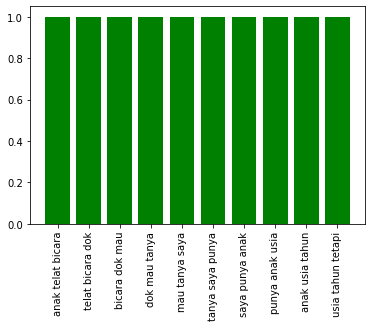

In [649]:
for i in range(len(text_error)):
    if len(text_error[i]) <= 0:
        continue
    print("Question")
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_count = get_ngram_freq(3, full_query)
    question_count = dict(sorted(question_count.items(), key=lambda item: item[1], reverse=True))
    print(question_count)
    plt.bar(list(question_count.keys())[:10], list(question_count.values())[:10], color='b')
    plt.xticks(rotation=90)
    plt.show()
    
    print("Similar Questions")
    text_lst = []
    for error_passage in text_error[i]:
        text_lst.append(error_passage['title']+". "+error_passage['text'])
    passage_count  = get_ngram_freq_lst(3, text_lst)
    passage_count = dict(sorted(passage_count.items(), key=lambda item: item[1], reverse=True))
    print(passage_count)
    plt.bar(list(passage_count.keys())[:10], list(passage_count.values())[:10], color='g')
    plt.xticks(rotation=90)
    plt.show()
    print()
    print()

## Trigram Overlap

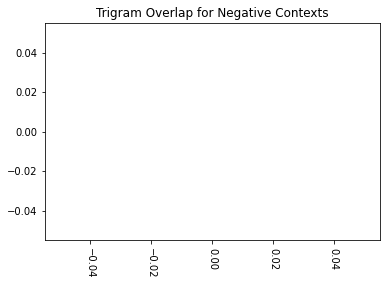

In [650]:
trigram_overlap =  dict()
for i in range(len(text_error)):
    if (len(text_error[i]) <= 0):
        continue
    full_query = gold_data[i]['question']['title'] + ". "+gold_data[i]['question']['text']
    question_ngram_cnt = get_ngram_freq(3, full_query)
    qid = gold_data[i]['question']['id']
    for error_passage in text_error[i]:
        pid = error_passage['id']
        row_id = qid+'_'+pid
        full_passage = error_passage['title'] + ". "+error_passage['text']
        passage_ngram_cnt = get_ngram_freq(3, full_passage)
        bigram_overlap[row_id] = get_union_term_cnt_normalized(question_ngram_cnt, passage_ngram_cnt)
trigram_overlap = dict(sorted(trigram_overlap.items(), key=lambda item: item[1], reverse=True))
plt.bar(list(trigram_overlap.keys()), list(trigram_overlap.values()))
xlocs, xlabs = plt.xticks(rotation=270)
plt.title("Trigram Overlap for Negative Contexts")
for i, v in enumerate(list(trigram_overlap.values())):
    plt.text(xlocs[i] - 0.5, v + 0.001, str(round(v, 2)))
plt.show()

## Vector Embedding Projection

In [651]:
import pickle

In [652]:
#passage embedding load

passage_embeddings = dict()
with (open("../Dataset/Embeddings/passage_embeddings_syifa-indowiki_full.tsv", "rb")) as openfile:
    while True:
        try:
            passage_lst = pickle.load(openfile)
            for pid, p_vector in passage_lst:
                passage_embeddings[pid] = p_vector
        except EOFError:
            break


In [653]:
#question embedding load

query_embeddings = dict()
with (open("../Dataset/Embeddings/question_embeddings_syifa-indowiki_full.tsv", "rb")) as openfile:
    while True:
        try:
            query_lst = pickle.load(openfile)
            for qid, q_vector in query_lst:
                query_embeddings[qid] = q_vector
        except EOFError:
            break


/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


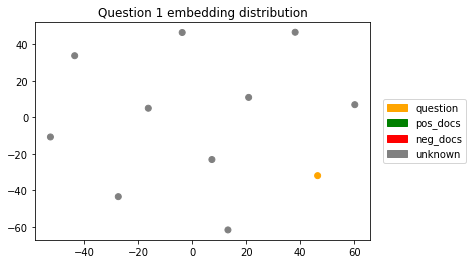

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


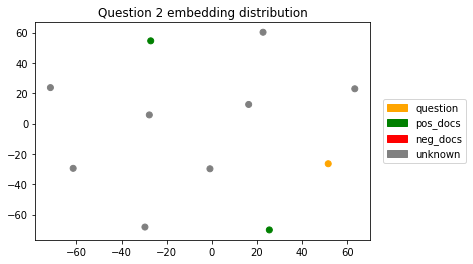

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


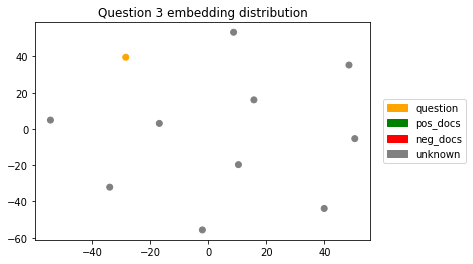

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


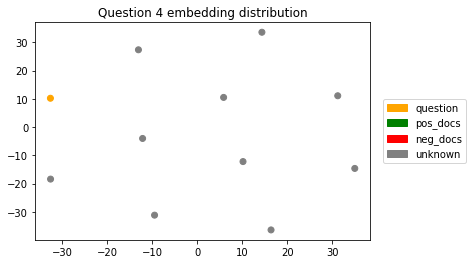

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


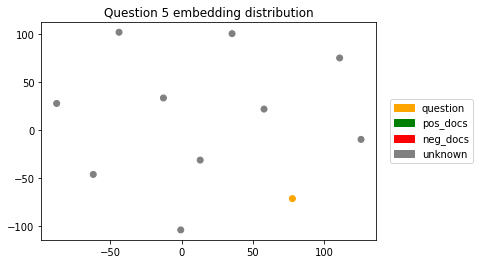

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


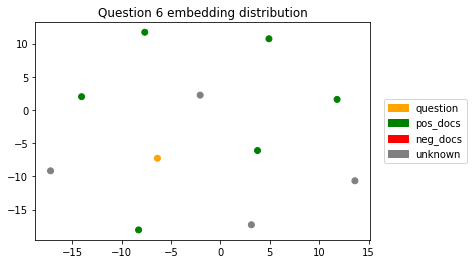

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


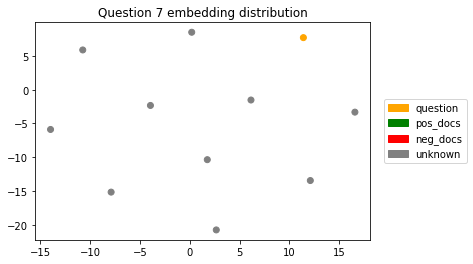

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


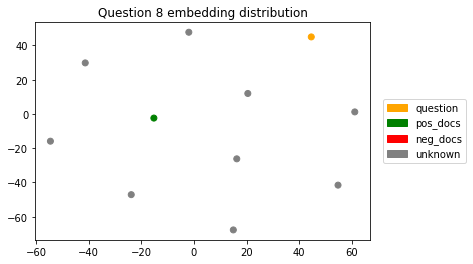

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


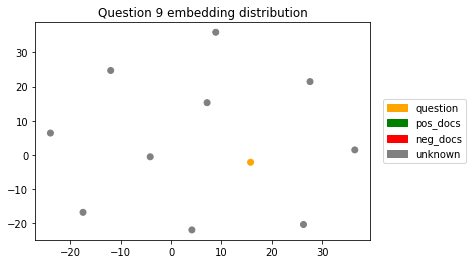

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


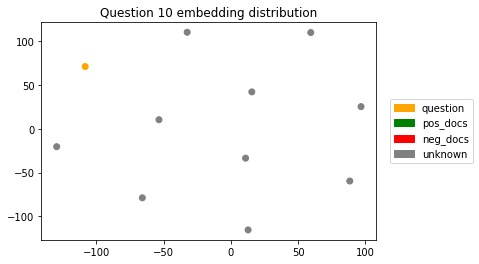

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


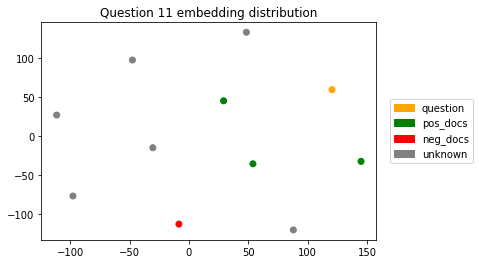

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


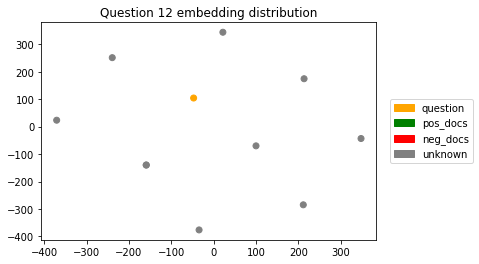

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


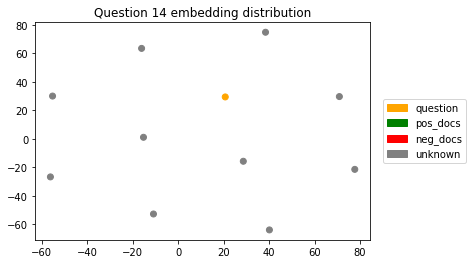

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


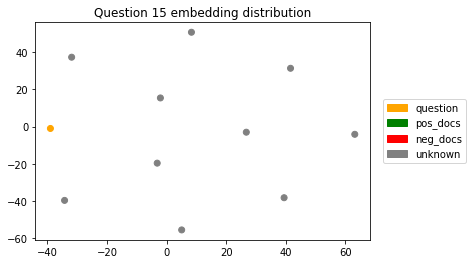

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


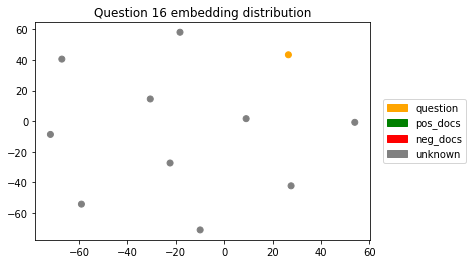

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


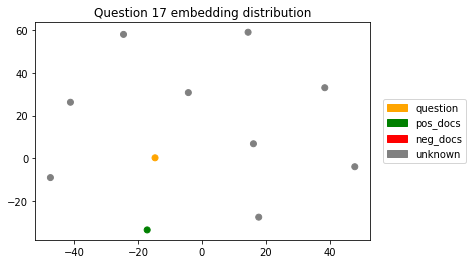

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


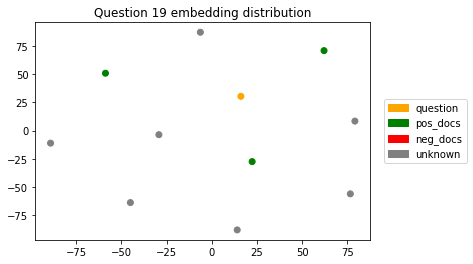

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


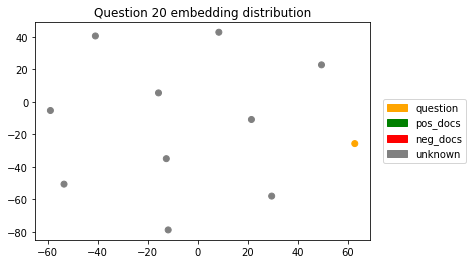

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


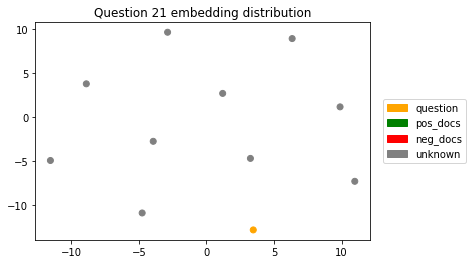

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


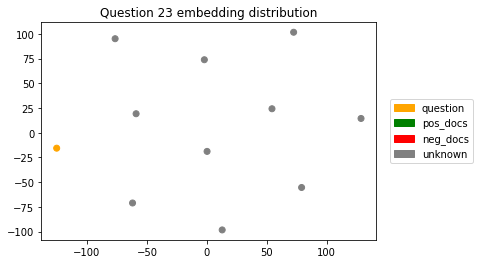

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


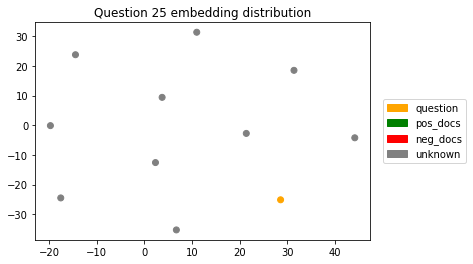

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


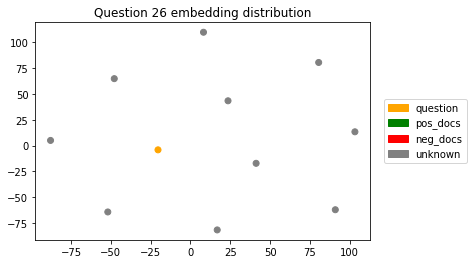

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


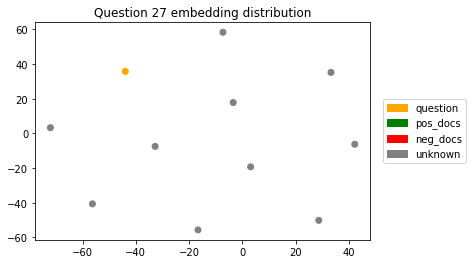

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


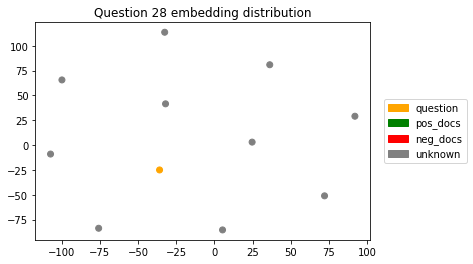

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


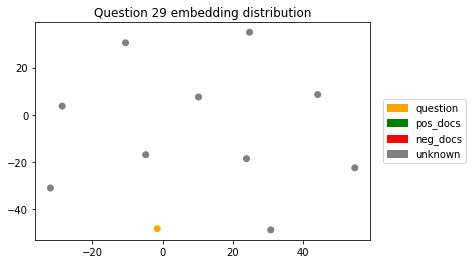

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


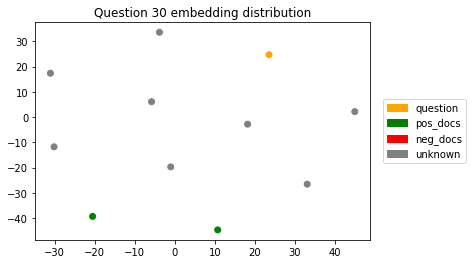

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


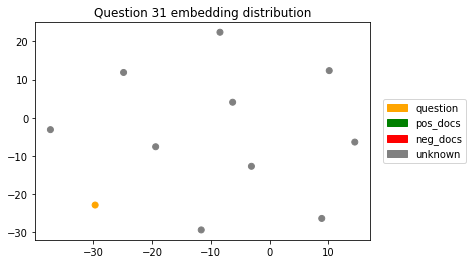

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


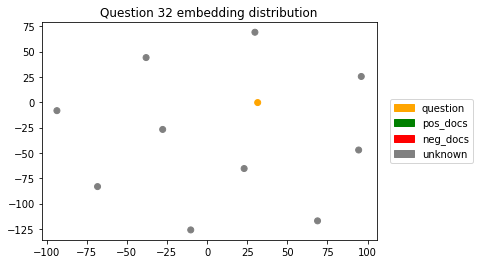

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


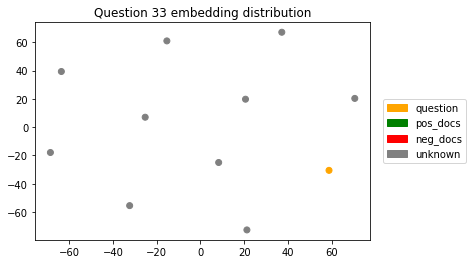

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


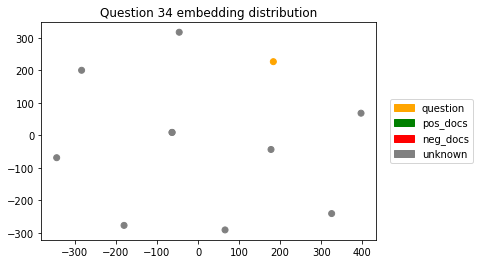

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


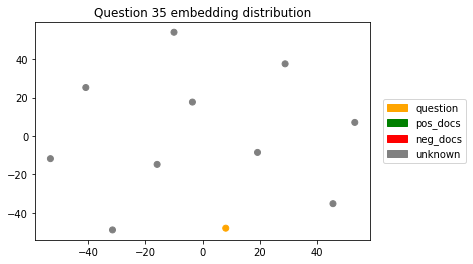

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


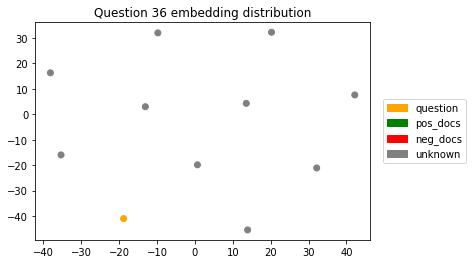

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


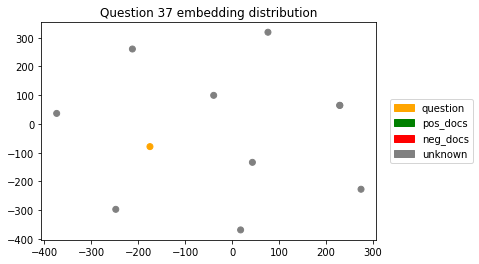

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


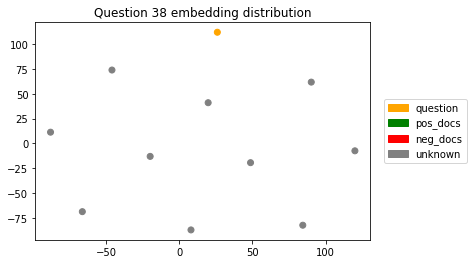

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


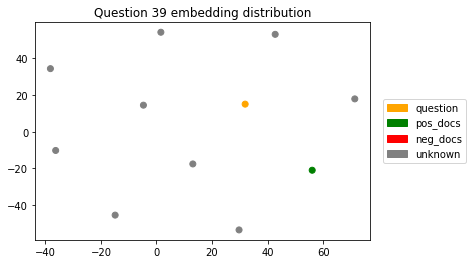

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


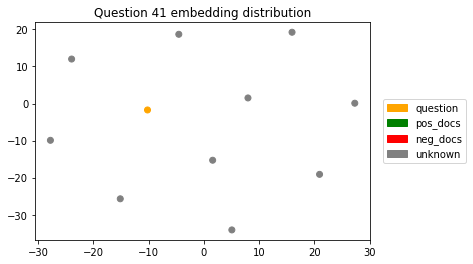

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


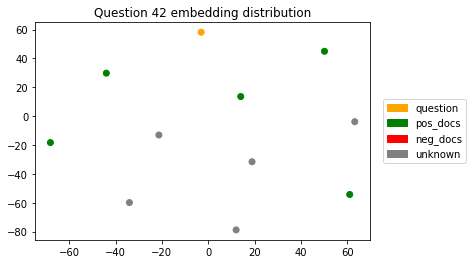

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


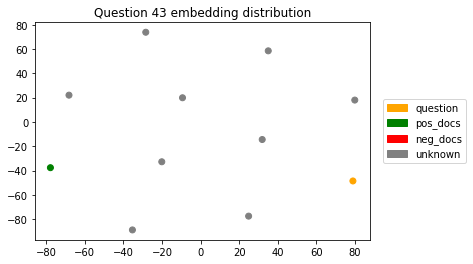

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


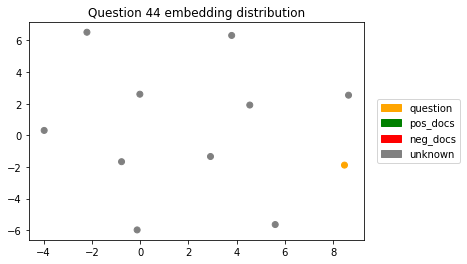

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


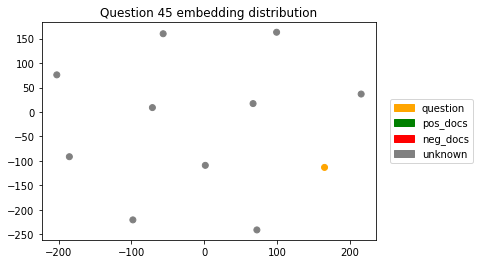

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


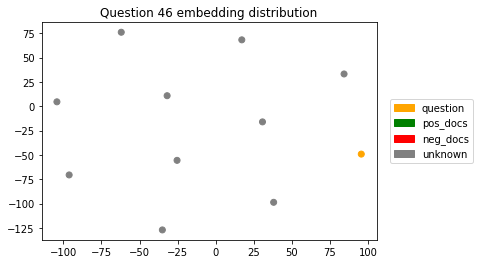

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


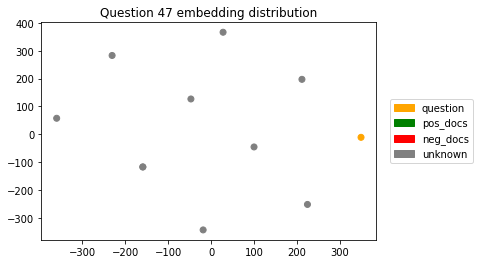

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


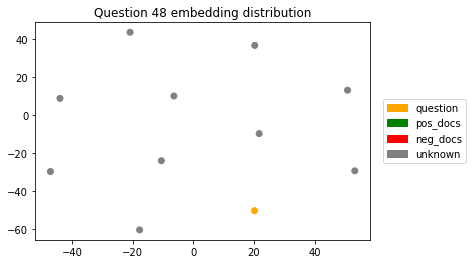

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


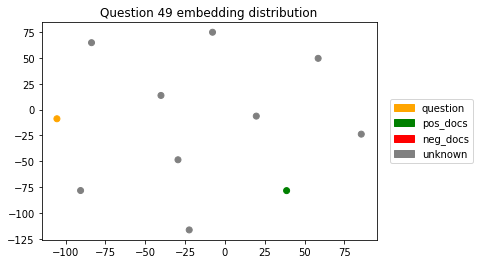

/home/mk1/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


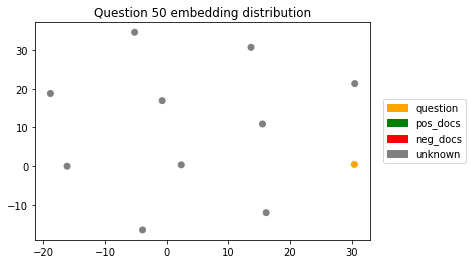

In [654]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import numpy as np

orange_patch = mpatches.Patch(color='orange', label='question')
green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [orange_patch, green_patch, red_patch, grey_patch]
for idx,row in enumerate(actual_data):    
    values = [0]
    colors = ListedColormap(['orange','green','red', 'grey'])
    qid = row['question']['id']
    q_vector = query_embeddings[qid]
    q_vector = q_vector.reshape(-1, len(q_vector))
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        p_vector = passage_embeddings[pid]
        p_vector = p_vector.reshape(-1, len(p_vector))
        q_vector = np.concatenate((q_vector, p_vector), axis=0)
        color = 1 if pid in gold_ids[idx] else 2
        color = 3 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    if len(q_vector) < 2:
        continue
    q_compressed = TSNE(n_components=2, learning_rate='auto',init='pca', random_state=42).fit_transform(q_vector)

    plt.title(f"Question {qid} embedding distribution")
    scatter = plt.scatter(q_compressed[:,0], q_compressed[:,1], c=values, cmap=colors)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()

## BM25 Score vs DPR Score

We expect the graphic will be inversely linear because DPR similarity score has negative correlation with BM25 similarity (While DPR smaller is better, BM25 bigger is better)

In [655]:
import xml.etree.ElementTree as ET

#gather all documents from corpus
docs = []
doc_ids = []

tree = ET.parse('../Dataset/Corpus/corpus_only_question_edited.xml')
root = tree.getroot()

for doc in root:
    for attr in doc:
        attr_type = attr.tag
        attr_content = attr.text
        if attr_type=='KELUHAN':
            content_text = ''
            for content in attr:
                if content.tag == 'JUDUL':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
                elif content.tag == 'ISI':
                    if content_text=='':
                        content_text += content.text if content.text is not None else ''
                    else:
                        content_text += f'. {content.text}' if content.text is not None else ''
            docs.append(content_text)
        elif attr_type == 'ID':
            doc_ids.append(attr_content)



In [656]:
assert len(docs)==len(doc_ids)

In [657]:
docs_map =  dict()
for idx, doc_id in enumerate(doc_ids):
    docs_map[doc_id] = docs[idx]

In [658]:
from tqdm import tqdm

avgdl = sum(len(doc) for doc in docs) / len(docs)
N = len(docs)
docs_freq_map, terms_freq_map, N, avgdl = bm25_init(docs_map)
for q_idx, q_row in tqdm(enumerate(actual_data)):
    query = q_row['question']['title']
    query  += f". {q_row['question']['text']}" if q_row['question']['text'].strip()!="" else ""
    for doc_idx, doc_row in enumerate(q_row['ctxs']):
        doc_id = doc_row['id']
        actual_data[q_idx]['ctxs'][doc_idx]['bm25_score'] = bm25_query_score(query, doc_id, docs_freq_map, terms_freq_map,  docs_map, avgdl, N)
        

45it [00:00, 94.25it/s]


### Aggregated Plot

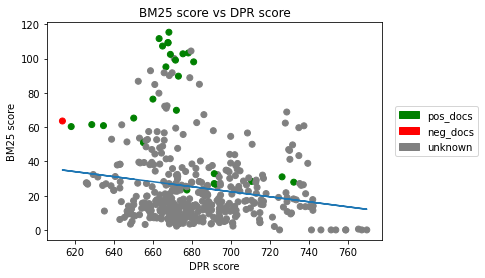

In [659]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.preprocessing import MinMaxScaler, StandardScaler

green_patch = mpatches.Patch(color='green', label='pos_docs')
red_patch = mpatches.Patch(color='red', label='neg_docs')
grey_patch = mpatches.Patch(color='grey', label='unknown')
color_handles = [green_patch, red_patch, grey_patch]
values = []
colors = ListedColormap(['green','red', 'grey'])
score_vector = []
for idx,row in enumerate(actual_data):        
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
score_vector= np.array(score_vector)


m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
plt.title(f"BM25 score vs DPR score")
plt.xlabel("DPR score")
plt.ylabel("BM25 score")
scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)

plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
plt.show()

### Per question plot

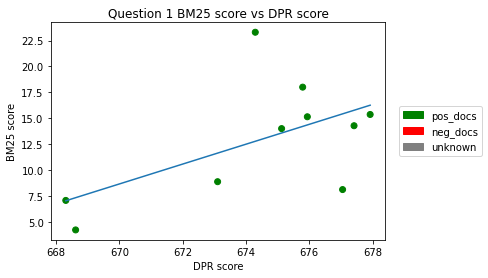

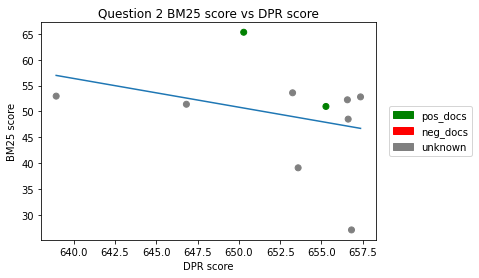

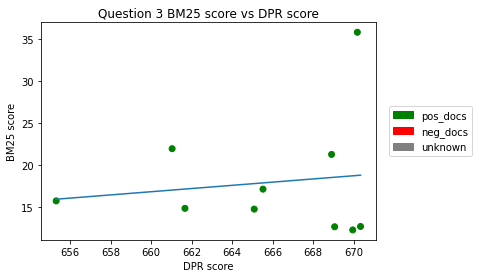

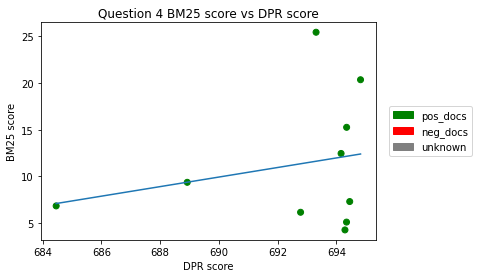

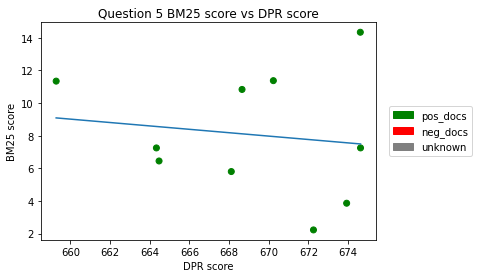

...

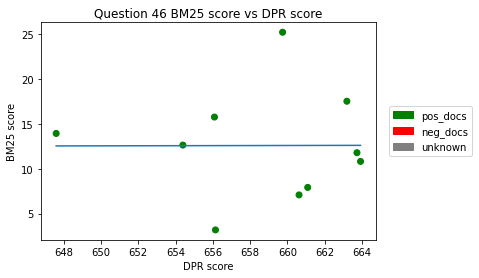

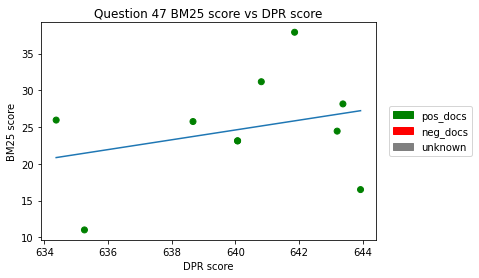

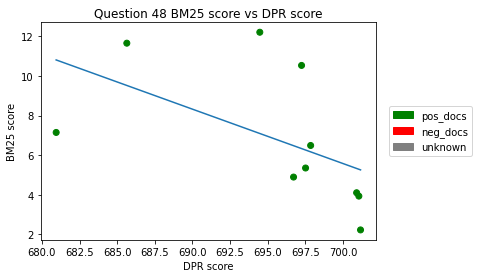

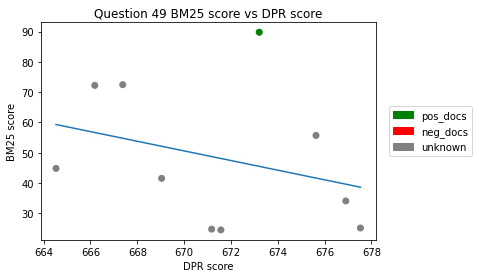

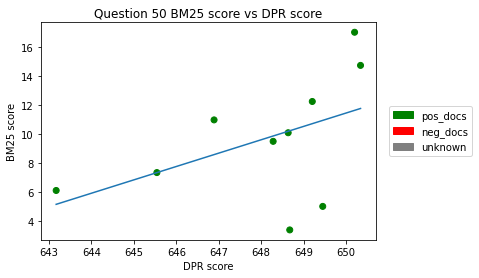

In [660]:
gradients_lst = []
for idx,row in enumerate(actual_data):
    values = []
    score_vector = []
    qid = row['question']['id']
    
    found_pos = False
    found_neg = False
    for p_row in row['ctxs']:
        pid = p_row['id']
        score_vector.append([float(p_row['score']), p_row['bm25_score']]) #i assign the minus dpr score instead because their similarities are inversely propotional
        color = 0 if pid in gold_ids[idx] else 1
        color = 2 if pid not in neg_ids[idx] and pid not in gold_ids[idx] else color
        values.append(color)
        if pid in gold_ids[idx]:
            found_pos = True
        else:
            found_neg = True
    score_vector= np.array(score_vector)


    m, b = np.polyfit(score_vector[:,0], score_vector[:,1], 1)
    plt.title(f"Question {qid} BM25 score vs DPR score")
    plt.xlabel("DPR score")
    plt.ylabel("BM25 score")
    scatter = plt.scatter(score_vector[:,0], score_vector[:,1], c=values, cmap=colors)
    gradients_lst.append(m)
    plt.legend(handles=color_handles, bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.plot(score_vector[:,0], m*score_vector[:,0] + b)
    plt.show()

In [661]:
is_positive = [gradient for gradient in gradients_lst if gradient > 0]
is_negative = [gradient for gradient in gradients_lst if gradient < 0]

print(f"positive gradient count: {len(is_positive)}")
print(f"negative gradient count: {len(is_negative)}")

positive gradient count: 23
negative gradient count: 22
